In [4]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import matplotlib.pylab as pylab
pylab.rcParams['figure.figsize'] = (400., 150.)
%matplotlib inline

In [56]:
pft_treefra = '/users/global/cornkle/shared/figs/VERA/vegfrac.cci.2010.4km.3d.nc'
lai_treefra = '/users/global/cornkle/shared/figs/VERA/cci.GLASS_4km_Weight54244_BLfix-Max6.nc'

In [57]:
def cut_kernel(array, xpos, ypos, dist_from_point):
    """
     This function cuts out a kernel from an existing array and allows the kernel to exceed the edges of the input
     array. The cut-out area is shifted accordingly within the kernel window with NaNs filled in
    :param array: 2darray
    :param xpos: middle x point of kernel
    :param ypos: middle y point of kernel
    :param dist_from_point: distance to kernel edge to each side
    :return: 2d array of the chosen kernel size.
    """

    if array.ndim != 2:
        raise IndexError('Cut kernel only allows 2D arrays.')

    kernel = np.zeros((dist_from_point*2+1, dist_from_point*2+1)) * np.nan

    if xpos - dist_from_point >= 0:
        xmin = 0
        xmindist = dist_from_point
    else:
        xmin = (xpos - dist_from_point) * -1
        xmindist = dist_from_point + (xpos - dist_from_point)

    if ypos - dist_from_point >= 0:
        ymin = 0
        ymindist = dist_from_point
    else:
        ymin = (ypos - dist_from_point) * -1
        ymindist = dist_from_point + (ypos - dist_from_point)

    if xpos + dist_from_point < array.shape[1]:
        xmax = kernel.shape[1]
        xmaxdist = dist_from_point + 1
    else:
        xmax = dist_from_point - (xpos - array.shape[1])
        xmaxdist = dist_from_point - (xpos + dist_from_point - array.shape[1])

    if ypos + dist_from_point < array.shape[0]:
        ymax = kernel.shape[0]
        ymaxdist = dist_from_point + 1
    else:
        ymax = dist_from_point - (ypos - array.shape[0])
        ymaxdist = dist_from_point - (ypos + dist_from_point - array.shape[0])

    cutk = array[ypos - ymindist: ypos + ymaxdist, xpos - xmindist: xpos + xmaxdist]


    kernel[ymin: ymax, xmin:xmax] = cutk

    return kernel

In [22]:
pft = xr.open_dataset(pft_treefra)
treefra = pft['field1391'].values[0,:,:]

In [44]:
dlai = xr.open_dataset(lai_treefra, decode_times=False)
lai = dlai['leaf_area_index'].isel(dim1=0, time=3 ).values

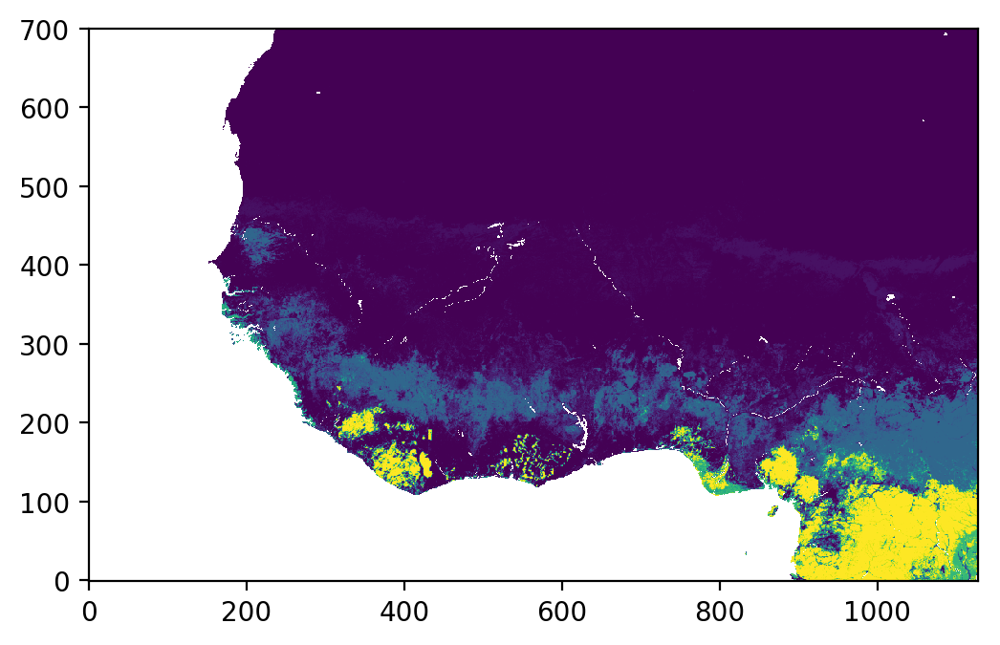

In [45]:
plt.figure(dpi=200)
plt.imshow(treefra, origin='lower')

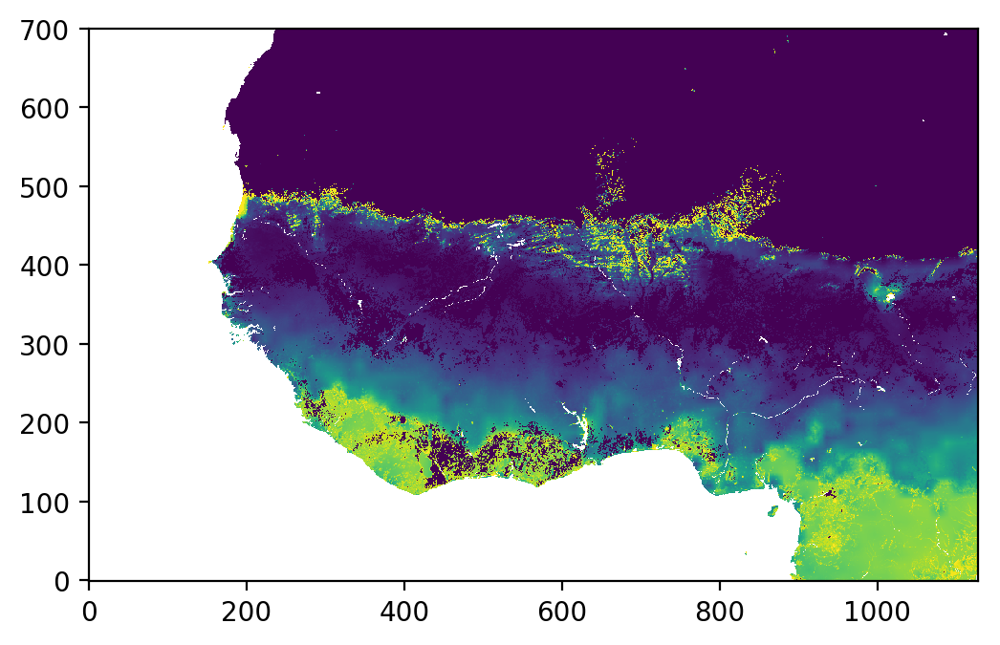

In [46]:
plt.figure(dpi=200)
plt.imshow(lai, origin='lower')

In [47]:
lai[(lai >=50)] = np.nan

/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater_equal
  """Entry point for launching an IPython kernel.


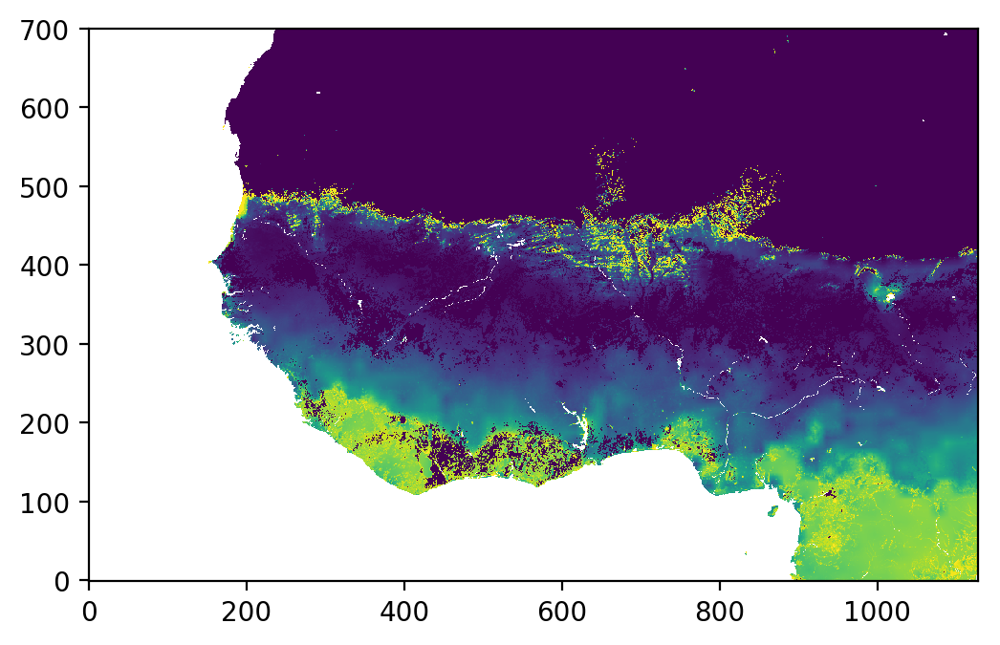

In [49]:
plt.figure(dpi=200)
plt.imshow(lai, origin='lower')

In [94]:
pos = np.where(np.isfinite(lai))

In [115]:
new_lai = np.zeros_like(lai)+np.nan

In [116]:
new_lai.shape

(701, 1128)

In [117]:
for y,x in zip(pos[0], pos[1]):
    
    print(y,x)
    box_lai = cut_kernel(lai, x, y, 25)  # 25 pixel ~ 110km
    box_frac = cut_kernel(treefra, x, y, 25)  # 25 pixel ~ 110km
    
    bigger = np.where(box_lai>0.1)
    new_point = np.sum((box_lai)[bigger])/len(bigger[0]) 
    
    new_lai[y,x] = new_point

0 812
0 813
0 814
0 889
0 895
0 896
0 897
0 898
0 899
0 900
0 901
0 902
0 903
0 904
0 905
0 906
0 907
0 908
0 909
0 910
0 911
0 912
0 913
0 914
0 915
0 916
0 917
0 918
0 919
0 920
0 921
0 922
0 923
0 924
0 925
0 926
0 927
0 928
0 929
0 930
0 931
0 932
0 933
0 934
0 935
0 936
0 937
0 938
0 939
0 940
0 941
0 942
0 943
0 944
0 945
0 946
0 947
0 948
0 949
0 950
0 951
0 952
0 953
0 954
0 955
0 956
0 957
0 958
0 959
0 960
0 961
0 962
0 963
0 964
0 965
0 966
0 967
0 968
0 969
0 970
0 971
0 972
0 973
0 974
0 975
0 976
0 977
0 978
0 979
0 980
0 981
0 982
0 983
0 984
0 985
0 986
0 987
0 988
0 989
0 990
0 991
0 992
0 993
0 994
0 995
0 996
0 997
0 998
0 999
0 1000
0 1001
0 1002
0 1003
0 1004
0 1005
0 1006
0 1007
0 1008
0 1009
0 1010
0 1011
0 1012
0 1013
0 1014
0 1015
0 1016
0 1017
0 1018
0 1019
0 1020
0 1021
0 1022
0 1023
0 1024
0 1025
0 1026
0 1027
0 1028
0 1029
0 1030
0 1031
0 1032
0 1033
0 1034
0 1035
0 1036
0 1037
0 1038
0 1039
0 1040
0 1041
0 1042
0 1043
0 1044
0 1045
0 1046
0 1047
0 1048
0 1

/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in greater
  import sys


 932
4 933
4 934
4 935
4 936
4 937
4 938
4 939
4 940
4 941
4 942
4 943
4 944
4 945
4 946
4 947
4 948
4 949
4 950
4 951
4 952
4 953
4 954
4 955
4 956
4 957
4 958
4 959
4 960
4 961
4 962
4 963
4 964
4 965
4 966
4 967
4 968
4 969
4 970
4 971
4 972
4 973
4 974
4 975
4 976
4 977
4 978
4 979
4 980
4 982
4 983
4 984
4 985
4 986
4 987
4 988
4 989
4 990
4 991
4 992
4 993
4 994
4 995
4 996
4 997
4 998
4 999
4 1000
4 1001
4 1002
4 1003
4 1004
4 1005
4 1006
4 1007
4 1008
4 1009
4 1010
4 1011
4 1012
4 1013
4 1014
4 1015
4 1016
4 1017
4 1018
4 1019
4 1020
4 1021
4 1022
4 1023
4 1024
4 1025
4 1026
4 1027
4 1028
4 1029
4 1030
4 1031
4 1032
4 1033
4 1034
4 1035
4 1036
4 1037
4 1038
4 1039
4 1040
4 1041
4 1042
4 1043
4 1044
4 1045
4 1046
4 1047
4 1048
4 1049
4 1050
4 1051
4 1052
4 1053
4 1054
4 1055
4 1056
4 1057
4 1058
4 1059
4 1060
4 1061
4 1062
4 1063
4 1064
4 1065
4 1066
4 1067
4 1068
4 1069
4 1070
4 1071
4 1072
4 1073
4 1074
4 1075
4 1076
4 1077
4 1078
4 1079
4 1080
4 1081
4 1082
4 1083
4 1084
4 10

12 964
12 965
12 966
12 967
12 968
12 969
12 970
12 971
12 972
12 973
12 974
12 975
12 976
12 977
12 978
12 979
12 980
12 981
12 982
12 983
12 984
12 985
12 986
12 987
12 988
12 989
12 990
12 991
12 992
12 993
12 994
12 995
12 996
12 997
12 998
12 999
12 1000
12 1001
12 1002
12 1003
12 1004
12 1005
12 1006
12 1007
12 1008
12 1009
12 1010
12 1011
12 1012
12 1013
12 1014
12 1015
12 1016
12 1017
12 1018
12 1019
12 1020
12 1021
12 1022
12 1023
12 1024
12 1025
12 1026
12 1027
12 1028
12 1029
12 1030
12 1031
12 1032
12 1033
12 1034
12 1035
12 1036
12 1037
12 1038
12 1039
12 1040
12 1041
12 1042
12 1043
12 1044
12 1045
12 1046
12 1047
12 1048
12 1049
12 1050
12 1051
12 1052
12 1053
12 1054
12 1055
12 1056
12 1057
12 1058
12 1059
12 1060
12 1061
12 1062
12 1063
12 1064
12 1065
12 1066
12 1067
12 1068
12 1069
12 1070
12 1071
12 1072
12 1073
12 1074
12 1075
12 1076
12 1077
12 1078
12 1079
12 1080
12 1081
12 1082
12 1083
12 1084
12 1085
12 1086
12 1087
12 1088
12 1089
12 1090
12 1091
12 1092
12 1

20 942
20 943
20 944
20 945
20 946
20 947
20 948
20 949
20 950
20 951
20 952
20 953
20 954
20 955
20 956
20 957
20 958
20 959
20 960
20 961
20 962
20 963
20 964
20 965
20 966
20 967
20 968
20 969
20 970
20 971
20 972
20 973
20 974
20 975
20 976
20 977
20 978
20 979
20 980
20 981
20 982
20 983
20 984
20 985
20 986
20 987
20 988
20 989
20 990
20 991
20 992
20 993
20 994
20 995
20 996
20 997
20 998
20 999
20 1000
20 1001
20 1002
20 1003
20 1004
20 1005
20 1006
20 1007
20 1008
20 1009
20 1010
20 1011
20 1012
20 1013
20 1014
20 1015
20 1016
20 1017
20 1018
20 1019
20 1020
20 1021
20 1022
20 1023
20 1024
20 1025
20 1026
20 1027
20 1028
20 1029
20 1030
20 1031
20 1032
20 1033
20 1034
20 1035
20 1036
20 1037
20 1038
20 1039
20 1040
20 1041
20 1042
20 1043
20 1044
20 1045
20 1046
20 1047
20 1048
20 1049
20 1050
20 1051
20 1052
20 1053
20 1054
20 1055
20 1056
20 1057
20 1058
20 1059
20 1060
20 1061
20 1062
20 1063
20 1064
20 1065
20 1066
20 1067
20 1068
20 1069
20 1070
20 1071
20 1072
20 1073
20

28 947
28 948
28 949
28 950
28 951
28 952
28 953
28 954
28 955
28 956
28 957
28 958
28 959
28 960
28 961
28 962
28 963
28 964
28 965
28 966
28 967
28 968
28 969
28 970
28 971
28 972
28 973
28 974
28 975
28 976
28 977
28 978
28 979
28 980
28 981
28 982
28 983
28 984
28 985
28 986
28 987
28 988
28 989
28 990
28 991
28 992
28 993
28 994
28 995
28 996
28 997
28 998
28 999
28 1000
28 1001
28 1002
28 1003
28 1004
28 1005
28 1006
28 1007
28 1008
28 1009
28 1010
28 1011
28 1012
28 1013
28 1014
28 1015
28 1016
28 1017
28 1018
28 1019
28 1020
28 1021
28 1022
28 1023
28 1024
28 1025
28 1026
28 1027
28 1028
28 1029
28 1030
28 1031
28 1032
28 1033
28 1034
28 1035
28 1036
28 1037
28 1038
28 1039
28 1040
28 1041
28 1042
28 1043
28 1044
28 1045
28 1046
28 1047
28 1048
28 1049
28 1050
28 1051
28 1052
28 1053
28 1054
28 1055
28 1056
28 1057
28 1058
28 1059
28 1060
28 1061
28 1062
28 1063
28 1064
28 1065
28 1066
28 1067
28 1068
28 1069
28 1070
28 1071
28 1072
28 1073
28 1074
28 1075
28 1076
28 1077
28 10

36 977
36 978
36 979
36 980
36 981
36 982
36 983
36 984
36 985
36 986
36 987
36 988
36 989
36 990
36 991
36 992
36 993
36 994
36 995
36 996
36 997
36 998
36 999
36 1000
36 1001
36 1002
36 1003
36 1004
36 1005
36 1006
36 1007
36 1008
36 1009
36 1010
36 1011
36 1012
36 1013
36 1014
36 1015
36 1016
36 1017
36 1018
36 1019
36 1020
36 1021
36 1022
36 1023
36 1024
36 1025
36 1026
36 1027
36 1028
36 1029
36 1030
36 1031
36 1032
36 1033
36 1034
36 1035
36 1036
36 1037
36 1038
36 1039
36 1040
36 1041
36 1042
36 1043
36 1044
36 1045
36 1046
36 1047
36 1048
36 1049
36 1050
36 1051
36 1052
36 1053
36 1054
36 1055
36 1056
36 1057
36 1058
36 1059
36 1060
36 1061
36 1062
36 1063
36 1064
36 1065
36 1066
36 1067
36 1068
36 1069
36 1070
36 1071
36 1072
36 1073
36 1074
36 1075
36 1076
36 1077
36 1078
36 1079
36 1080
36 1081
36 1082
36 1083
36 1084
36 1088
36 1089
36 1090
36 1091
36 1092
36 1093
36 1094
36 1095
36 1096
36 1097
36 1098
36 1099
36 1100
36 1101
36 1102
36 1103
36 1104
36 1105
36 1106
36 1107

44 1044
44 1045
44 1046
44 1047
44 1048
44 1049
44 1050
44 1051
44 1052
44 1053
44 1054
44 1055
44 1056
44 1057
44 1058
44 1059
44 1060
44 1061
44 1062
44 1063
44 1064
44 1065
44 1066
44 1067
44 1068
44 1069
44 1070
44 1071
44 1072
44 1073
44 1074
44 1075
44 1076
44 1078
44 1079
44 1080
44 1081
44 1082
44 1083
44 1084
44 1085
44 1086
44 1087
44 1088
44 1089
44 1090
44 1091
44 1092
44 1093
44 1094
44 1095
44 1096
44 1097
44 1098
44 1099
44 1100
44 1101
44 1102
44 1103
44 1104
44 1105
44 1106
44 1107
44 1108
44 1109
44 1110
44 1111
44 1112
44 1113
44 1114
44 1115
44 1116
44 1117
44 1118
44 1119
44 1120
44 1121
44 1122
44 1123
44 1124
44 1125
44 1126
44 1127
45 901
45 902
45 903
45 904
45 905
45 906
45 907
45 908
45 909
45 910
45 911
45 912
45 913
45 915
45 916
45 917
45 918
45 919
45 920
45 922
45 923
45 924
45 925
45 926
45 927
45 928
45 929
45 930
45 931
45 932
45 933
45 934
45 935
45 936
45 937
45 938
45 939
45 940
45 941
45 942
45 943
45 944
45 945
45 946
45 947
45 948
45 949
45 950


52 1114
52 1115
52 1116
52 1117
52 1118
52 1119
52 1120
52 1121
52 1122
52 1123
52 1124
52 1125
52 1126
52 1127
53 900
53 901
53 902
53 903
53 904
53 905
53 906
53 907
53 908
53 909
53 910
53 911
53 912
53 913
53 914
53 915
53 916
53 917
53 918
53 919
53 920
53 921
53 922
53 923
53 924
53 925
53 926
53 927
53 928
53 929
53 930
53 931
53 932
53 933
53 934
53 935
53 936
53 937
53 938
53 939
53 940
53 941
53 942
53 943
53 944
53 945
53 946
53 947
53 948
53 949
53 950
53 951
53 952
53 953
53 954
53 955
53 956
53 957
53 958
53 959
53 960
53 961
53 962
53 963
53 964
53 965
53 966
53 967
53 968
53 969
53 970
53 971
53 972
53 973
53 974
53 975
53 976
53 977
53 978
53 979
53 980
53 981
53 982
53 983
53 984
53 985
53 986
53 987
53 988
53 989
53 990
53 991
53 992
53 993
53 994
53 995
53 996
53 997
53 998
53 999
53 1000
53 1001
53 1002
53 1003
53 1004
53 1005
53 1006
53 1007
53 1008
53 1009
53 1010
53 1011
53 1012
53 1013
53 1014
53 1015
53 1016
53 1017
53 1018
53 1019
53 1020
53 1021
53 1022
53 1

61 952
61 953
61 954
61 955
61 956
61 957
61 958
61 959
61 960
61 961
61 962
61 963
61 964
61 965
61 966
61 967
61 968
61 969
61 970
61 971
61 972
61 973
61 974
61 975
61 976
61 977
61 978
61 979
61 980
61 981
61 982
61 983
61 984
61 985
61 986
61 987
61 988
61 989
61 990
61 991
61 992
61 993
61 994
61 995
61 996
61 997
61 998
61 999
61 1000
61 1001
61 1002
61 1003
61 1004
61 1005
61 1006
61 1007
61 1008
61 1009
61 1010
61 1011
61 1012
61 1013
61 1014
61 1015
61 1016
61 1017
61 1018
61 1019
61 1020
61 1021
61 1022
61 1023
61 1024
61 1025
61 1026
61 1027
61 1028
61 1029
61 1030
61 1031
61 1032
61 1033
61 1034
61 1035
61 1036
61 1037
61 1038
61 1039
61 1040
61 1041
61 1042
61 1043
61 1044
61 1045
61 1046
61 1047
61 1048
61 1049
61 1050
61 1051
61 1052
61 1053
61 1054
61 1055
61 1056
61 1057
61 1058
61 1059
61 1060
61 1061
61 1062
61 1063
61 1064
61 1065
61 1066
61 1067
61 1068
61 1069
61 1070
61 1071
61 1072
61 1073
61 1074
61 1075
61 1079
61 1080
61 1081
61 1082
61 1083
61 1084
61 1085


69 1026
69 1027
69 1028
69 1029
69 1030
69 1031
69 1032
69 1033
69 1034
69 1035
69 1036
69 1037
69 1038
69 1039
69 1040
69 1041
69 1042
69 1043
69 1044
69 1045
69 1046
69 1047
69 1048
69 1049
69 1050
69 1051
69 1052
69 1053
69 1054
69 1055
69 1056
69 1057
69 1058
69 1059
69 1060
69 1061
69 1062
69 1063
69 1064
69 1065
69 1066
69 1067
69 1068
69 1069
69 1070
69 1071
69 1072
69 1073
69 1074
69 1075
69 1076
69 1077
69 1078
69 1079
69 1080
69 1081
69 1082
69 1083
69 1084
69 1085
69 1086
69 1087
69 1088
69 1089
69 1090
69 1091
69 1092
69 1093
69 1094
69 1095
69 1096
69 1097
69 1098
69 1099
69 1100
69 1101
69 1102
69 1103
69 1104
69 1105
69 1106
69 1107
69 1108
69 1109
69 1110
69 1111
69 1112
69 1113
69 1114
69 1115
69 1116
69 1117
69 1118
69 1119
69 1120
69 1121
69 1122
69 1123
69 1124
69 1125
69 1126
69 1127
70 902
70 903
70 904
70 905
70 906
70 907
70 908
70 909
70 910
70 911
70 912
70 913
70 914
70 915
70 916
70 917
70 918
70 919
70 920
70 921
70 922
70 923
70 924
70 925
70 926
70 927
70

77 1116
77 1117
77 1118
77 1119
77 1120
77 1121
77 1122
77 1123
77 1124
77 1125
77 1126
77 1127
78 904
78 905
78 906
78 907
78 908
78 909
78 910
78 911
78 912
78 913
78 914
78 915
78 916
78 917
78 918
78 919
78 920
78 921
78 922
78 923
78 924
78 925
78 926
78 927
78 928
78 929
78 930
78 931
78 932
78 933
78 934
78 935
78 936
78 937
78 938
78 939
78 940
78 941
78 942
78 943
78 944
78 945
78 946
78 947
78 948
78 949
78 950
78 951
78 952
78 953
78 954
78 955
78 956
78 957
78 958
78 959
78 960
78 961
78 962
78 963
78 964
78 965
78 966
78 967
78 968
78 969
78 970
78 971
78 972
78 973
78 974
78 975
78 976
78 977
78 978
78 979
78 980
78 981
78 982
78 983
78 984
78 985
78 986
78 987
78 988
78 989
78 990
78 991
78 992
78 993
78 994
78 995
78 996
78 997
78 998
78 999
78 1000
78 1001
78 1002
78 1003
78 1004
78 1005
78 1006
78 1007
78 1008
78 1009
78 1010
78 1011
78 1012
78 1013
78 1014
78 1015
78 1016
78 1017
78 1018
78 1019
78 1020
78 1021
78 1022
78 1023
78 1024
78 1025
78 1026
78 1027
78 1028


86 866
86 867
86 868
86 869
86 870
86 900
86 901
86 902
86 903
86 904
86 905
86 906
86 907
86 908
86 909
86 910
86 911
86 912
86 913
86 914
86 915
86 916
86 917
86 918
86 919
86 920
86 921
86 922
86 923
86 924
86 925
86 926
86 927
86 928
86 929
86 930
86 931
86 932
86 933
86 934
86 935
86 936
86 937
86 938
86 939
86 940
86 941
86 942
86 943
86 944
86 945
86 946
86 947
86 948
86 949
86 950
86 951
86 952
86 953
86 954
86 955
86 956
86 957
86 958
86 959
86 960
86 961
86 962
86 963
86 964
86 965
86 966
86 967
86 968
86 969
86 970
86 971
86 972
86 973
86 974
86 975
86 976
86 977
86 978
86 979
86 980
86 981
86 982
86 983
86 984
86 985
86 986
86 987
86 988
86 989
86 990
86 991
86 992
86 993
86 994
86 995
86 996
86 997
86 998
86 999
86 1000
86 1001
86 1002
86 1003
86 1004
86 1005
86 1006
86 1007
86 1008
86 1009
86 1010
86 1011
86 1012
86 1013
86 1014
86 1015
86 1016
86 1017
86 1018
86 1019
86 1020
86 1021
86 1022
86 1023
86 1024
86 1025
86 1026
86 1027
86 1028
86 1029
86 1030
86 1031
86 1032
8

93 1116
93 1117
93 1118
93 1119
93 1120
93 1121
93 1122
93 1123
93 1124
93 1125
93 1126
93 1127
94 867
94 868
94 869
94 870
94 871
94 872
94 873
94 874
94 895
94 896
94 897
94 898
94 899
94 900
94 901
94 902
94 903
94 904
94 905
94 906
94 907
94 908
94 909
94 910
94 911
94 912
94 913
94 914
94 915
94 916
94 917
94 918
94 919
94 920
94 921
94 922
94 923
94 924
94 925
94 926
94 927
94 928
94 929
94 930
94 931
94 932
94 933
94 934
94 935
94 936
94 937
94 938
94 939
94 940
94 941
94 942
94 943
94 944
94 945
94 946
94 947
94 948
94 949
94 950
94 951
94 952
94 953
94 954
94 955
94 956
94 957
94 958
94 959
94 960
94 961
94 962
94 963
94 964
94 965
94 966
94 967
94 968
94 969
94 970
94 971
94 972
94 973
94 974
94 975
94 976
94 977
94 978
94 979
94 980
94 981
94 982
94 983
94 984
94 985
94 986
94 987
94 988
94 989
94 990
94 991
94 992
94 993
94 994
94 995
94 996
94 997
94 998
94 999
94 1000
94 1001
94 1002
94 1003
94 1004
94 1005
94 1006
94 1007
94 1008
94 1009
94 1010
94 1011
94 1012
94 1013
9

101 1117
101 1118
101 1119
101 1120
101 1121
101 1122
101 1123
101 1124
101 1125
101 1126
101 1127
102 882
102 883
102 885
102 886
102 887
102 888
102 890
102 894
102 895
102 896
102 897
102 898
102 899
102 900
102 901
102 902
102 903
102 904
102 905
102 906
102 907
102 908
102 909
102 910
102 911
102 912
102 913
102 914
102 915
102 916
102 917
102 918
102 919
102 920
102 921
102 922
102 923
102 924
102 925
102 926
102 927
102 928
102 929
102 930
102 931
102 932
102 933
102 934
102 935
102 936
102 937
102 938
102 939
102 940
102 941
102 942
102 943
102 944
102 945
102 946
102 947
102 948
102 949
102 950
102 951
102 952
102 953
102 954
102 955
102 956
102 957
102 958
102 959
102 960
102 961
102 962
102 963
102 964
102 965
102 966
102 967
102 968
102 969
102 970
102 971
102 972
102 973
102 974
102 975
102 976
102 977
102 978
102 979
102 980
102 981
102 982
102 983
102 984
102 985
102 986
102 987
102 988
102 989
102 990
102 991
102 992
102 993
102 994
102 995
102 996
102 997
102 998
102 9

109 991
109 992
109 993
109 994
109 995
109 996
109 997
109 998
109 999
109 1000
109 1001
109 1002
109 1003
109 1004
109 1005
109 1006
109 1007
109 1008
109 1009
109 1010
109 1011
109 1012
109 1013
109 1014
109 1015
109 1016
109 1017
109 1018
109 1019
109 1020
109 1021
109 1022
109 1023
109 1024
109 1025
109 1026
109 1027
109 1028
109 1029
109 1030
109 1031
109 1032
109 1033
109 1034
109 1035
109 1036
109 1037
109 1038
109 1039
109 1040
109 1041
109 1042
109 1043
109 1044
109 1045
109 1046
109 1047
109 1048
109 1049
109 1050
109 1051
109 1052
109 1053
109 1054
109 1055
109 1056
109 1057
109 1058
109 1059
109 1060
109 1061
109 1062
109 1063
109 1064
109 1065
109 1066
109 1067
109 1068
109 1069
109 1070
109 1071
109 1072
109 1073
109 1074
109 1075
109 1076
109 1077
109 1078
109 1079
109 1080
109 1081
109 1082
109 1083
109 1084
109 1085
109 1086
109 1087
109 1088
109 1089
109 1090
109 1091
109 1092
109 1093
109 1094
109 1095
109 1096
109 1097
109 1098
109 1099
109 1100
109 1101
109 1102
1

115 987
115 988
115 989
115 990
115 991
115 992
115 993
115 994
115 995
115 996
115 997
115 998
115 999
115 1000
115 1001
115 1002
115 1003
115 1004
115 1005
115 1006
115 1007
115 1008
115 1009
115 1010
115 1011
115 1012
115 1013
115 1014
115 1015
115 1016
115 1017
115 1018
115 1019
115 1020
115 1021
115 1022
115 1023
115 1024
115 1025
115 1026
115 1027
115 1028
115 1029
115 1030
115 1031
115 1032
115 1033
115 1034
115 1035
115 1036
115 1037
115 1038
115 1039
115 1040
115 1041
115 1042
115 1043
115 1044
115 1045
115 1046
115 1047
115 1048
115 1049
115 1050
115 1051
115 1052
115 1053
115 1054
115 1055
115 1056
115 1057
115 1058
115 1059
115 1060
115 1061
115 1062
115 1063
115 1064
115 1065
115 1066
115 1067
115 1068
115 1069
115 1070
115 1071
115 1072
115 1073
115 1074
115 1075
115 1076
115 1077
115 1078
115 1079
115 1080
115 1081
115 1082
115 1083
115 1084
115 1085
115 1086
115 1087
115 1088
115 1089
115 1090
115 1091
115 1092
115 1093
115 1094
115 1095
115 1096
115 1097
115 1098
115 1

120 899
120 900
120 901
120 902
120 903
120 904
120 905
120 906
120 907
120 908
120 909
120 910
120 911
120 912
120 913
120 914
120 915
120 916
120 917
120 918
120 919
120 920
120 921
120 922
120 923
120 924
120 925
120 926
120 927
120 928
120 929
120 930
120 931
120 932
120 933
120 934
120 935
120 936
120 937
120 938
120 939
120 940
120 941
120 942
120 943
120 944
120 945
120 946
120 947
120 948
120 949
120 950
120 951
120 952
120 953
120 954
120 955
120 956
120 957
120 958
120 959
120 960
120 961
120 962
120 963
120 964
120 965
120 966
120 967
120 968
120 969
120 970
120 971
120 972
120 973
120 974
120 975
120 976
120 977
120 978
120 979
120 980
120 981
120 982
120 983
120 984
120 985
120 986
120 987
120 988
120 989
120 990
120 991
120 992
120 993
120 994
120 995
120 996
120 997
120 998
120 999
120 1000
120 1001
120 1002
120 1003
120 1004
120 1005
120 1006
120 1007
120 1008
120 1009
120 1010
120 1011
120 1012
120 1013
120 1014
120 1015
120 1016
120 1017
120 1018
120 1019
120 1020
120

124 1090
124 1091
124 1092
124 1093
124 1094
124 1095
124 1096
124 1097
124 1098
124 1099
124 1100
124 1101
124 1102
124 1103
124 1104
124 1105
124 1106
124 1107
124 1108
124 1109
124 1110
124 1111
124 1112
124 1113
124 1114
124 1115
124 1116
124 1117
124 1118
124 1119
124 1120
124 1121
124 1122
124 1123
124 1124
124 1125
124 1126
124 1127
125 379
125 380
125 381
125 382
125 383
125 384
125 385
125 386
125 387
125 388
125 389
125 390
125 391
125 392
125 393
125 394
125 395
125 396
125 397
125 398
125 399
125 400
125 401
125 402
125 403
125 404
125 405
125 406
125 407
125 408
125 409
125 410
125 411
125 412
125 413
125 414
125 415
125 416
125 417
125 418
125 419
125 420
125 421
125 422
125 423
125 424
125 425
125 426
125 427
125 428
125 429
125 430
125 431
125 432
125 433
125 434
125 435
125 436
125 437
125 438
125 439
125 440
125 441
125 442
125 443
125 444
125 445
125 446
125 447
125 448
125 449
125 450
125 451
125 452
125 453
125 454
125 455
125 457
125 458
125 553
125 554
125 555
12

128 1064
128 1065
128 1066
128 1067
128 1068
128 1069
128 1070
128 1071
128 1072
128 1073
128 1074
128 1075
128 1076
128 1077
128 1078
128 1079
128 1080
128 1081
128 1082
128 1083
128 1084
128 1085
128 1086
128 1087
128 1088
128 1089
128 1090
128 1091
128 1092
128 1093
128 1094
128 1095
128 1096
128 1097
128 1098
128 1099
128 1100
128 1101
128 1102
128 1103
128 1104
128 1105
128 1106
128 1107
128 1108
128 1109
128 1110
128 1111
128 1112
128 1113
128 1114
128 1115
128 1116
128 1117
128 1118
128 1119
128 1120
128 1121
128 1122
128 1123
128 1124
128 1125
128 1126
128 1127
129 373
129 374
129 375
129 376
129 377
129 378
129 379
129 380
129 381
129 382
129 383
129 384
129 385
129 386
129 387
129 388
129 389
129 390
129 391
129 392
129 393
129 394
129 395
129 396
129 397
129 398
129 399
129 400
129 401
129 402
129 403
129 404
129 405
129 406
129 407
129 408
129 409
129 410
129 411
129 412
129 413
129 414
129 415
129 416
129 417
129 418
129 419
129 420
129 421
129 422
129 423
129 424
129 425


132 806
132 807
132 808
132 809
132 810
132 811
132 812
132 813
132 814
132 815
132 816
132 817
132 818
132 819
132 820
132 821
132 822
132 823
132 824
132 825
132 826
132 827
132 828
132 829
132 830
132 831
132 832
132 833
132 834
132 835
132 836
132 837
132 838
132 839
132 840
132 841
132 842
132 843
132 844
132 845
132 846
132 847
132 848
132 849
132 850
132 851
132 852
132 853
132 854
132 856
132 857
132 858
132 859
132 860
132 861
132 862
132 863
132 864
132 865
132 866
132 867
132 868
132 869
132 870
132 871
132 872
132 873
132 874
132 875
132 876
132 877
132 878
132 879
132 880
132 881
132 882
132 883
132 884
132 885
132 886
132 887
132 888
132 889
132 890
132 891
132 892
132 893
132 894
132 895
132 896
132 897
132 898
132 899
132 900
132 901
132 902
132 903
132 904
132 905
132 906
132 907
132 908
132 909
132 910
132 911
132 912
132 913
132 914
132 915
132 916
132 917
132 918
132 919
132 920
132 921
132 922
132 923
132 924
132 925
132 926
132 927
132 928
132 929
132 930
132 931


135 970
135 971
135 972
135 973
135 974
135 975
135 976
135 977
135 978
135 979
135 980
135 981
135 982
135 983
135 984
135 985
135 986
135 987
135 988
135 989
135 990
135 991
135 992
135 993
135 994
135 995
135 996
135 997
135 998
135 999
135 1000
135 1001
135 1002
135 1003
135 1004
135 1005
135 1006
135 1007
135 1008
135 1009
135 1010
135 1011
135 1012
135 1013
135 1014
135 1015
135 1016
135 1017
135 1018
135 1019
135 1020
135 1021
135 1022
135 1023
135 1024
135 1025
135 1026
135 1027
135 1028
135 1029
135 1030
135 1031
135 1032
135 1033
135 1034
135 1035
135 1036
135 1037
135 1038
135 1039
135 1040
135 1041
135 1042
135 1043
135 1044
135 1045
135 1046
135 1047
135 1048
135 1049
135 1050
135 1051
135 1052
135 1053
135 1054
135 1055
135 1056
135 1057
135 1058
135 1059
135 1060
135 1061
135 1062
135 1063
135 1064
135 1065
135 1066
135 1067
135 1068
135 1069
135 1070
135 1071
135 1072
135 1073
135 1074
135 1075
135 1076
135 1077
135 1078
135 1079
135 1080
135 1081
135 1082
135 1083
135 

138 1091
138 1092
138 1093
138 1094
138 1095
138 1096
138 1097
138 1098
138 1099
138 1100
138 1101
138 1102
138 1103
138 1104
138 1105
138 1106
138 1107
138 1108
138 1109
138 1110
138 1111
138 1112
138 1113
138 1114
138 1115
138 1116
138 1117
138 1118
138 1119
138 1120
138 1121
138 1122
138 1123
138 1124
138 1125
138 1126
138 1127
139 361
139 362
139 363
139 364
139 365
139 366
139 367
139 368
139 369
139 370
139 371
139 372
139 373
139 374
139 375
139 376
139 377
139 378
139 379
139 380
139 381
139 382
139 383
139 384
139 385
139 386
139 387
139 388
139 389
139 390
139 391
139 392
139 393
139 394
139 395
139 396
139 397
139 398
139 399
139 400
139 401
139 402
139 403
139 404
139 405
139 406
139 407
139 408
139 409
139 410
139 411
139 412
139 413
139 414
139 415
139 416
139 417
139 418
139 419
139 420
139 421
139 422
139 423
139 424
139 425
139 426
139 427
139 428
139 429
139 430
139 431
139 432
139 433
139 434
139 435
139 436
139 437
139 438
139 439
139 440
139 441
139 442
139 443
139

142 397
142 398
142 399
142 400
142 401
142 402
142 403
142 404
142 405
142 406
142 407
142 408
142 409
142 410
142 411
142 412
142 413
142 414
142 415
142 416
142 417
142 418
142 419
142 420
142 421
142 422
142 423
142 424
142 425
142 426
142 427
142 428
142 429
142 430
142 431
142 432
142 433
142 434
142 435
142 436
142 437
142 438
142 439
142 440
142 441
142 442
142 443
142 444
142 446
142 447
142 448
142 449
142 450
142 451
142 452
142 453
142 454
142 455
142 456
142 457
142 458
142 459
142 460
142 461
142 462
142 463
142 464
142 465
142 466
142 467
142 468
142 469
142 470
142 471
142 472
142 473
142 474
142 475
142 476
142 477
142 478
142 479
142 480
142 481
142 482
142 483
142 484
142 485
142 486
142 487
142 488
142 489
142 490
142 491
142 492
142 493
142 494
142 495
142 496
142 497
142 498
142 499
142 500
142 501
142 502
142 503
142 504
142 505
142 506
142 507
142 508
142 509
142 510
142 511
142 512
142 513
142 514
142 515
142 516
142 517
142 518
142 519
142 520
142 521
142 522


145 395
145 396
145 397
145 398
145 399
145 400
145 401
145 402
145 403
145 404
145 405
145 406
145 407
145 408
145 409
145 410
145 411
145 412
145 413
145 414
145 415
145 416
145 417
145 418
145 419
145 420
145 421
145 422
145 423
145 424
145 425
145 426
145 427
145 428
145 429
145 430
145 431
145 432
145 433
145 434
145 435
145 436
145 437
145 438
145 439
145 440
145 441
145 442
145 443
145 444
145 445
145 446
145 447
145 448
145 449
145 450
145 451
145 452
145 453
145 454
145 455
145 456
145 457
145 458
145 459
145 460
145 461
145 462
145 463
145 464
145 465
145 466
145 467
145 468
145 469
145 470
145 471
145 472
145 473
145 474
145 475
145 476
145 477
145 478
145 479
145 480
145 481
145 482
145 483
145 484
145 485
145 486
145 487
145 488
145 489
145 490
145 491
145 492
145 493
145 494
145 495
145 496
145 497
145 498
145 499
145 500
145 501
145 502
145 503
145 504
145 505
145 506
145 507
145 508
145 509
145 510
145 511
145 512
145 513
145 514
145 515
145 516
145 517
145 518
145 519


147 1101
147 1102
147 1103
147 1104
147 1105
147 1106
147 1107
147 1108
147 1109
147 1110
147 1111
147 1112
147 1113
147 1114
147 1115
147 1116
147 1117
147 1118
147 1119
147 1120
147 1121
147 1122
147 1123
147 1124
147 1125
147 1126
147 1127
148 351
148 352
148 353
148 354
148 355
148 356
148 357
148 358
148 359
148 360
148 361
148 362
148 363
148 364
148 365
148 366
148 367
148 368
148 369
148 370
148 371
148 372
148 373
148 374
148 375
148 376
148 377
148 378
148 379
148 380
148 381
148 382
148 383
148 384
148 385
148 386
148 387
148 388
148 389
148 390
148 391
148 392
148 393
148 394
148 395
148 396
148 397
148 398
148 399
148 400
148 401
148 402
148 403
148 404
148 405
148 406
148 407
148 408
148 409
148 410
148 411
148 412
148 413
148 414
148 415
148 416
148 417
148 418
148 419
148 420
148 421
148 422
148 423
148 424
148 425
148 426
148 427
148 428
148 429
148 430
148 431
148 432
148 433
148 434
148 435
148 436
148 437
148 438
148 439
148 440
148 441
148 442
148 443
148 444
148 4

150 974
150 975
150 976
150 977
150 978
150 979
150 980
150 981
150 982
150 983
150 984
150 985
150 986
150 987
150 988
150 989
150 990
150 991
150 992
150 993
150 994
150 995
150 996
150 997
150 998
150 999
150 1000
150 1001
150 1002
150 1003
150 1004
150 1005
150 1006
150 1007
150 1008
150 1009
150 1010
150 1011
150 1012
150 1013
150 1014
150 1015
150 1016
150 1017
150 1018
150 1019
150 1020
150 1021
150 1022
150 1023
150 1024
150 1025
150 1026
150 1027
150 1028
150 1029
150 1030
150 1031
150 1032
150 1033
150 1034
150 1035
150 1036
150 1037
150 1038
150 1039
150 1040
150 1041
150 1042
150 1043
150 1044
150 1045
150 1046
150 1047
150 1048
150 1049
150 1050
150 1051
150 1052
150 1053
150 1054
150 1055
150 1056
150 1057
150 1058
150 1059
150 1060
150 1061
150 1062
150 1063
150 1064
150 1065
150 1066
150 1067
150 1068
150 1069
150 1070
150 1071
150 1072
150 1073
150 1074
150 1075
150 1076
150 1077
150 1078
150 1079
150 1080
150 1081
150 1082
150 1083
150 1084
150 1085
150 1086
150 1087


153 871
153 872
153 873
153 874
153 875
153 876
153 877
153 878
153 879
153 880
153 881
153 882
153 883
153 884
153 885
153 886
153 887
153 888
153 889
153 890
153 891
153 892
153 893
153 894
153 895
153 896
153 897
153 898
153 899
153 900
153 901
153 902
153 903
153 904
153 905
153 906
153 907
153 908
153 909
153 910
153 911
153 912
153 913
153 914
153 915
153 916
153 918
153 919
153 920
153 921
153 922
153 923
153 924
153 925
153 926
153 927
153 928
153 929
153 930
153 931
153 932
153 933
153 934
153 935
153 936
153 937
153 938
153 939
153 940
153 941
153 942
153 943
153 944
153 945
153 946
153 947
153 948
153 949
153 950
153 951
153 952
153 953
153 954
153 955
153 956
153 957
153 958
153 959
153 960
153 961
153 962
153 963
153 964
153 965
153 966
153 967
153 968
153 969
153 970
153 971
153 972
153 973
153 974
153 975
153 976
153 977
153 978
153 979
153 980
153 981
153 982
153 983
153 984
153 985
153 986
153 987
153 988
153 989
153 990
153 991
153 992
153 993
153 994
153 995
153 996


156 635
156 636
156 637
156 638
156 639
156 640
156 641
156 642
156 643
156 644
156 645
156 646
156 647
156 648
156 649
156 650
156 651
156 652
156 653
156 654
156 655
156 656
156 657
156 760
156 761
156 762
156 763
156 764
156 765
156 766
156 767
156 768
156 769
156 770
156 771
156 772
156 773
156 774
156 775
156 776
156 777
156 778
156 779
156 780
156 781
156 782
156 783
156 784
156 785
156 786
156 787
156 788
156 789
156 790
156 791
156 792
156 793
156 794
156 795
156 796
156 797
156 798
156 799
156 800
156 801
156 802
156 803
156 804
156 805
156 806
156 807
156 808
156 809
156 810
156 812
156 813
156 814
156 815
156 816
156 817
156 818
156 819
156 820
156 821
156 822
156 823
156 824
156 825
156 826
156 827
156 828
156 829
156 830
156 831
156 832
156 833
156 834
156 835
156 836
156 837
156 838
156 839
156 840
156 841
156 842
156 843
156 844
156 845
156 846
156 847
156 848
156 849
156 850
156 851
156 852
156 853
156 854
156 855
156 856
156 857
156 858
156 859
156 860
156 861
156 862


159 425
159 426
159 427
159 428
159 429
159 430
159 431
159 432
159 433
159 434
159 435
159 436
159 437
159 438
159 439
159 440
159 441
159 442
159 443
159 444
159 445
159 446
159 447
159 448
159 449
159 450
159 451
159 452
159 453
159 454
159 455
159 456
159 457
159 458
159 459
159 460
159 461
159 462
159 463
159 464
159 465
159 466
159 467
159 468
159 469
159 470
159 471
159 472
159 473
159 474
159 475
159 476
159 477
159 478
159 479
159 480
159 481
159 482
159 483
159 486
159 487
159 488
159 489
159 490
159 491
159 492
159 493
159 494
159 495
159 496
159 497
159 498
159 499
159 500
159 501
159 502
159 503
159 504
159 505
159 506
159 507
159 508
159 509
159 510
159 511
159 512
159 513
159 514
159 515
159 516
159 517
159 518
159 519
159 520
159 521
159 522
159 523
159 524
159 525
159 526
159 527
159 528
159 529
159 530
159 531
159 532
159 533
159 534
159 535
159 536
159 537
159 538
159 539
159 540
159 541
159 542
159 543
159 544
159 545
159 546
159 547
159 548
159 549
159 550
159 551


161 939
161 940
161 941
161 942
161 943
161 944
161 945
161 946
161 947
161 948
161 949
161 950
161 951
161 952
161 953
161 954
161 955
161 956
161 957
161 958
161 959
161 960
161 961
161 962
161 963
161 964
161 965
161 966
161 967
161 968
161 969
161 970
161 971
161 972
161 973
161 974
161 975
161 976
161 977
161 978
161 979
161 980
161 981
161 982
161 983
161 984
161 985
161 986
161 987
161 988
161 989
161 990
161 991
161 992
161 993
161 994
161 995
161 996
161 997
161 998
161 999
161 1000
161 1001
161 1002
161 1003
161 1004
161 1005
161 1006
161 1007
161 1008
161 1009
161 1010
161 1011
161 1012
161 1013
161 1014
161 1015
161 1016
161 1017
161 1018
161 1019
161 1020
161 1021
161 1022
161 1023
161 1024
161 1025
161 1026
161 1027
161 1028
161 1029
161 1030
161 1031
161 1032
161 1033
161 1034
161 1035
161 1036
161 1037
161 1038
161 1039
161 1040
161 1041
161 1042
161 1043
161 1044
161 1045
161 1046
161 1047
161 1048
161 1049
161 1050
161 1051
161 1052
161 1053
161 1054
161 1055
161 1056

164 588
164 589
164 590
164 591
164 592
164 593
164 594
164 595
164 596
164 597
164 598
164 599
164 600
164 601
164 602
164 603
164 604
164 605
164 606
164 607
164 608
164 609
164 610
164 611
164 612
164 613
164 614
164 615
164 616
164 617
164 618
164 619
164 620
164 621
164 622
164 623
164 624
164 626
164 627
164 628
164 629
164 630
164 631
164 632
164 633
164 634
164 635
164 636
164 637
164 638
164 639
164 640
164 641
164 642
164 643
164 644
164 645
164 646
164 647
164 648
164 649
164 650
164 651
164 652
164 653
164 654
164 655
164 656
164 657
164 658
164 659
164 660
164 661
164 662
164 663
164 664
164 665
164 666
164 667
164 668
164 669
164 670
164 671
164 672
164 673
164 674
164 675
164 676
164 677
164 678
164 679
164 680
164 681
164 682
164 683
164 684
164 685
164 686
164 687
164 688
164 689
164 690
164 691
164 692
164 693
164 694
164 695
164 696
164 749
164 750
164 751
164 752
164 753
164 754
164 755
164 756
164 757
164 758
164 759
164 760
164 761
164 762
164 763
164 764
164 765


166 1019
166 1020
166 1021
166 1022
166 1023
166 1024
166 1025
166 1026
166 1027
166 1028
166 1029
166 1030
166 1031
166 1032
166 1033
166 1034
166 1035
166 1036
166 1037
166 1038
166 1039
166 1040
166 1041
166 1042
166 1043
166 1044
166 1045
166 1046
166 1047
166 1048
166 1049
166 1050
166 1051
166 1052
166 1053
166 1054
166 1055
166 1056
166 1057
166 1058
166 1059
166 1060
166 1061
166 1062
166 1063
166 1064
166 1065
166 1066
166 1067
166 1068
166 1069
166 1070
166 1071
166 1072
166 1073
166 1074
166 1075
166 1076
166 1077
166 1078
166 1079
166 1080
166 1081
166 1082
166 1083
166 1084
166 1085
166 1086
166 1087
166 1088
166 1089
166 1090
166 1091
166 1092
166 1093
166 1094
166 1095
166 1096
166 1097
166 1098
166 1099
166 1100
166 1101
166 1102
166 1103
166 1104
166 1105
166 1106
166 1107
166 1108
166 1109
166 1110
166 1111
166 1112
166 1113
166 1114
166 1115
166 1116
166 1117
166 1118
166 1119
166 1120
166 1121
166 1122
166 1123
166 1124
166 1125
166 1126
166 1127
167 327
167 328
167

169 568
169 569
169 570
169 571
169 572
169 573
169 574
169 575
169 576
169 577
169 578
169 579
169 580
169 581
169 582
169 583
169 584
169 585
169 586
169 587
169 588
169 589
169 590
169 591
169 592
169 593
169 594
169 595
169 596
169 597
169 598
169 599
169 600
169 601
169 602
169 603
169 604
169 605
169 606
169 607
169 608
169 609
169 610
169 611
169 612
169 613
169 614
169 615
169 617
169 618
169 629
169 630
169 631
169 632
169 633
169 634
169 635
169 636
169 637
169 638
169 639
169 640
169 641
169 642
169 643
169 644
169 645
169 646
169 647
169 648
169 649
169 650
169 651
169 652
169 653
169 654
169 655
169 656
169 657
169 658
169 659
169 660
169 661
169 662
169 663
169 664
169 665
169 666
169 667
169 668
169 669
169 670
169 671
169 672
169 673
169 674
169 675
169 676
169 677
169 678
169 679
169 680
169 681
169 682
169 683
169 684
169 685
169 686
169 687
169 688
169 689
169 690
169 691
169 692
169 693
169 694
169 695
169 696
169 697
169 698
169 699
169 700
169 701
169 702
169 703


171 933
171 934
171 935
171 936
171 937
171 938
171 939
171 940
171 941
171 942
171 943
171 944
171 945
171 946
171 947
171 948
171 949
171 950
171 951
171 952
171 953
171 954
171 955
171 956
171 957
171 958
171 959
171 960
171 961
171 962
171 963
171 964
171 965
171 966
171 967
171 968
171 969
171 970
171 971
171 972
171 973
171 974
171 975
171 976
171 977
171 978
171 980
171 981
171 982
171 983
171 984
171 985
171 986
171 987
171 988
171 989
171 990
171 991
171 992
171 993
171 994
171 995
171 996
171 997
171 998
171 999
171 1000
171 1001
171 1002
171 1003
171 1004
171 1005
171 1006
171 1007
171 1008
171 1009
171 1010
171 1011
171 1012
171 1013
171 1014
171 1015
171 1016
171 1017
171 1018
171 1019
171 1020
171 1021
171 1022
171 1023
171 1024
171 1025
171 1026
171 1027
171 1028
171 1029
171 1030
171 1031
171 1032
171 1033
171 1034
171 1035
171 1036
171 1037
171 1038
171 1039
171 1040
171 1041
171 1042
171 1043
171 1044
171 1045
171 1046
171 1047
171 1048
171 1049
171 1050
171 1051
171 

174 422
174 423
174 424
174 425
174 426
174 427
174 428
174 429
174 430
174 431
174 432
174 433
174 434
174 435
174 436
174 437
174 438
174 439
174 440
174 441
174 442
174 443
174 444
174 445
174 446
174 447
174 448
174 449
174 450
174 451
174 452
174 453
174 454
174 455
174 456
174 457
174 458
174 459
174 460
174 461
174 462
174 463
174 464
174 465
174 466
174 467
174 468
174 469
174 470
174 471
174 472
174 473
174 474
174 475
174 476
174 477
174 478
174 479
174 480
174 481
174 482
174 483
174 484
174 485
174 486
174 487
174 488
174 489
174 490
174 491
174 492
174 493
174 494
174 495
174 496
174 497
174 498
174 499
174 500
174 501
174 502
174 503
174 504
174 505
174 506
174 507
174 508
174 509
174 510
174 511
174 512
174 513
174 514
174 515
174 516
174 517
174 518
174 519
174 520
174 521
174 522
174 523
174 524
174 525
174 526
174 527
174 528
174 529
174 530
174 531
174 532
174 533
174 534
174 535
174 536
174 537
174 538
174 539
174 540
174 541
174 542
174 543
174 544
174 545
174 546


176 731
176 732
176 733
176 734
176 735
176 736
176 737
176 738
176 739
176 740
176 741
176 742
176 743
176 744
176 745
176 746
176 747
176 748
176 749
176 750
176 751
176 752
176 753
176 754
176 755
176 756
176 757
176 758
176 759
176 760
176 761
176 762
176 763
176 764
176 765
176 766
176 767
176 768
176 769
176 770
176 771
176 772
176 773
176 774
176 775
176 776
176 777
176 778
176 779
176 780
176 781
176 782
176 783
176 784
176 785
176 786
176 787
176 788
176 789
176 790
176 791
176 792
176 793
176 794
176 795
176 796
176 797
176 798
176 799
176 800
176 801
176 802
176 803
176 804
176 805
176 806
176 807
176 809
176 810
176 811
176 812
176 813
176 814
176 815
176 816
176 817
176 818
176 819
176 820
176 821
176 822
176 823
176 824
176 825
176 826
176 827
176 828
176 829
176 830
176 831
176 832
176 833
176 834
176 835
176 836
176 837
176 838
176 839
176 840
176 841
176 842
176 843
176 844
176 845
176 846
176 847
176 848
176 849
176 850
176 851
176 852
176 853
176 854
176 855
176 856


178 963
178 964
178 965
178 966
178 967
178 968
178 969
178 970
178 971
178 972
178 973
178 974
178 975
178 976
178 977
178 978
178 979
178 980
178 981
178 982
178 983
178 984
178 985
178 986
178 987
178 988
178 989
178 990
178 991
178 992
178 993
178 994
178 995
178 996
178 997
178 998
178 999
178 1000
178 1001
178 1002
178 1003
178 1004
178 1005
178 1006
178 1007
178 1008
178 1009
178 1010
178 1011
178 1012
178 1013
178 1014
178 1015
178 1016
178 1017
178 1018
178 1019
178 1020
178 1021
178 1022
178 1023
178 1024
178 1025
178 1026
178 1027
178 1028
178 1029
178 1030
178 1031
178 1032
178 1033
178 1034
178 1035
178 1036
178 1037
178 1038
178 1039
178 1040
178 1041
178 1042
178 1043
178 1044
178 1045
178 1046
178 1047
178 1048
178 1049
178 1050
178 1051
178 1052
178 1053
178 1054
178 1055
178 1056
178 1057
178 1058
178 1059
178 1060
178 1061
178 1062
178 1063
178 1064
178 1065
178 1066
178 1067
178 1068
178 1069
178 1070
178 1071
178 1072
178 1073
178 1074
178 1075
178 1076
178 1077
17

181 392
181 393
181 394
181 395
181 396
181 397
181 398
181 399
181 400
181 401
181 402
181 403
181 404
181 405
181 406
181 407
181 408
181 409
181 410
181 411
181 412
181 413
181 414
181 415
181 416
181 417
181 418
181 419
181 420
181 421
181 422
181 423
181 424
181 425
181 426
181 427
181 428
181 429
181 430
181 431
181 432
181 433
181 434
181 435
181 436
181 437
181 438
181 439
181 440
181 441
181 442
181 443
181 444
181 445
181 446
181 447
181 448
181 449
181 450
181 451
181 452
181 453
181 454
181 455
181 456
181 457
181 458
181 459
181 460
181 461
181 462
181 463
181 464
181 465
181 466
181 467
181 468
181 469
181 470
181 471
181 472
181 473
181 474
181 475
181 476
181 477
181 478
181 479
181 480
181 481
181 482
181 483
181 484
181 485
181 486
181 487
181 488
181 489
181 490
181 491
181 492
181 493
181 494
181 495
181 496
181 497
181 498
181 499
181 500
181 501
181 502
181 503
181 504
181 505
181 506
181 507
181 508
181 509
181 510
181 511
181 512
181 513
181 514
181 515
181 516


183 503
183 504
183 505
183 506
183 507
183 508
183 509
183 510
183 511
183 512
183 513
183 514
183 515
183 516
183 517
183 518
183 519
183 520
183 521
183 522
183 523
183 524
183 525
183 526
183 527
183 528
183 529
183 530
183 531
183 532
183 533
183 534
183 535
183 536
183 537
183 538
183 539
183 540
183 541
183 542
183 543
183 544
183 545
183 546
183 547
183 548
183 549
183 550
183 551
183 552
183 553
183 554
183 555
183 556
183 557
183 558
183 559
183 560
183 561
183 562
183 563
183 564
183 565
183 566
183 567
183 568
183 569
183 570
183 571
183 572
183 573
183 574
183 575
183 576
183 577
183 578
183 579
183 580
183 581
183 582
183 583
183 584
183 585
183 586
183 587
183 588
183 589
183 590
183 591
183 592
183 593
183 594
183 595
183 596
183 597
183 598
183 599
183 600
183 601
183 602
183 603
183 604
183 605
183 606
183 607
183 608
183 609
183 610
183 611
183 612
183 613
183 614
183 615
183 616
183 617
183 618
183 619
183 620
183 621
183 622
183 623
183 624
183 625
183 626
183 627


185 746
185 747
185 748
185 749
185 750
185 751
185 752
185 753
185 754
185 755
185 756
185 757
185 758
185 759
185 760
185 761
185 762
185 763
185 764
185 765
185 766
185 767
185 768
185 769
185 770
185 771
185 772
185 773
185 774
185 775
185 776
185 777
185 778
185 779
185 780
185 781
185 782
185 783
185 784
185 785
185 786
185 787
185 788
185 789
185 790
185 791
185 792
185 793
185 794
185 795
185 796
185 797
185 798
185 799
185 800
185 801
185 802
185 803
185 804
185 805
185 806
185 807
185 808
185 809
185 810
185 811
185 812
185 813
185 814
185 815
185 816
185 817
185 818
185 819
185 820
185 821
185 822
185 823
185 824
185 825
185 826
185 827
185 828
185 829
185 830
185 831
185 832
185 833
185 834
185 835
185 836
185 837
185 838
185 839
185 840
185 841
185 842
185 843
185 844
185 845
185 846
185 847
185 848
185 849
185 850
185 851
185 852
185 853
185 854
185 855
185 856
185 857
185 858
185 859
185 860
185 861
185 862
185 863
185 864
185 865
185 866
185 867
185 868
185 869
185 870


187 973
187 974
187 975
187 976
187 977
187 978
187 979
187 980
187 981
187 982
187 983
187 984
187 985
187 986
187 987
187 988
187 989
187 990
187 991
187 992
187 993
187 994
187 995
187 996
187 997
187 998
187 999
187 1000
187 1001
187 1002
187 1003
187 1004
187 1005
187 1006
187 1007
187 1008
187 1009
187 1010
187 1011
187 1012
187 1013
187 1014
187 1015
187 1016
187 1017
187 1018
187 1019
187 1020
187 1021
187 1022
187 1023
187 1024
187 1025
187 1026
187 1027
187 1028
187 1029
187 1030
187 1031
187 1032
187 1033
187 1034
187 1035
187 1036
187 1037
187 1038
187 1039
187 1040
187 1041
187 1042
187 1043
187 1044
187 1045
187 1046
187 1047
187 1048
187 1049
187 1050
187 1051
187 1052
187 1053
187 1054
187 1055
187 1056
187 1057
187 1058
187 1059
187 1060
187 1061
187 1062
187 1063
187 1064
187 1065
187 1066
187 1067
187 1068
187 1069
187 1070
187 1071
187 1072
187 1073
187 1074
187 1075
187 1076
187 1077
187 1078
187 1079
187 1080
187 1081
187 1082
187 1083
187 1084
187 1085
187 1086
1

190 310
190 311
190 312
190 313
190 314
190 315
190 316
190 317
190 318
190 319
190 320
190 321
190 322
190 323
190 324
190 325
190 326
190 327
190 328
190 329
190 330
190 331
190 332
190 333
190 334
190 335
190 336
190 337
190 338
190 339
190 340
190 341
190 342
190 343
190 344
190 345
190 346
190 347
190 348
190 349
190 350
190 351
190 352
190 353
190 354
190 355
190 356
190 357
190 358
190 359
190 360
190 361
190 362
190 363
190 364
190 365
190 366
190 367
190 368
190 369
190 370
190 371
190 372
190 373
190 374
190 375
190 376
190 377
190 378
190 379
190 380
190 381
190 382
190 383
190 384
190 385
190 386
190 387
190 388
190 389
190 390
190 391
190 392
190 393
190 394
190 395
190 396
190 397
190 398
190 399
190 400
190 401
190 402
190 403
190 404
190 405
190 406
190 407
190 408
190 409
190 410
190 411
190 412
190 413
190 414
190 415
190 416
190 417
190 418
190 419
190 420
190 421
190 422
190 423
190 424
190 425
190 426
190 427
190 428
190 429
190 430
190 431
190 432
190 433
190 434


192 466
192 467
192 468
192 469
192 470
192 471
192 472
192 473
192 474
192 475
192 476
192 477
192 478
192 479
192 480
192 481
192 482
192 483
192 484
192 485
192 486
192 487
192 488
192 489
192 490
192 491
192 492
192 493
192 494
192 495
192 496
192 497
192 498
192 499
192 500
192 501
192 502
192 503
192 504
192 505
192 506
192 507
192 508
192 509
192 510
192 511
192 512
192 513
192 514
192 515
192 516
192 517
192 518
192 519
192 520
192 521
192 522
192 523
192 524
192 525
192 526
192 527
192 528
192 529
192 530
192 531
192 532
192 533
192 534
192 535
192 536
192 537
192 538
192 539
192 540
192 541
192 542
192 543
192 544
192 545
192 546
192 547
192 548
192 549
192 550
192 551
192 552
192 553
192 554
192 555
192 556
192 557
192 558
192 559
192 560
192 561
192 562
192 563
192 564
192 565
192 566
192 567
192 568
192 569
192 570
192 571
192 572
192 573
192 574
192 575
192 576
192 577
192 578
192 579
192 580
192 581
192 582
192 583
192 584
192 585
192 586
192 587
192 588
192 589
192 590


194 631
194 632
194 633
194 634
194 635
194 636
194 637
194 638
194 639
194 640
194 641
194 642
194 643
194 644
194 645
194 646
194 647
194 648
194 649
194 650
194 651
194 652
194 653
194 654
194 655
194 656
194 657
194 658
194 659
194 660
194 661
194 662
194 663
194 664
194 665
194 666
194 667
194 668
194 669
194 670
194 671
194 672
194 673
194 674
194 675
194 676
194 677
194 678
194 679
194 680
194 681
194 682
194 683
194 684
194 685
194 686
194 687
194 688
194 689
194 690
194 691
194 692
194 693
194 694
194 695
194 696
194 697
194 698
194 699
194 700
194 701
194 702
194 703
194 704
194 705
194 706
194 707
194 708
194 709
194 710
194 711
194 712
194 713
194 714
194 715
194 716
194 717
194 718
194 719
194 720
194 721
194 722
194 723
194 724
194 725
194 726
194 727
194 728
194 729
194 730
194 731
194 732
194 733
194 734
194 735
194 736
194 737
194 738
194 739
194 740
194 741
194 742
194 743
194 744
194 745
194 746
194 747
194 748
194 749
194 750
194 751
194 752
194 753
194 754
194 755


196 863
196 864
196 865
196 866
196 867
196 868
196 869
196 870
196 871
196 872
196 873
196 874
196 875
196 876
196 877
196 878
196 879
196 880
196 881
196 882
196 883
196 884
196 885
196 886
196 887
196 888
196 889
196 890
196 891
196 892
196 893
196 894
196 895
196 896
196 897
196 898
196 899
196 900
196 901
196 902
196 903
196 904
196 905
196 906
196 907
196 908
196 909
196 910
196 911
196 912
196 913
196 914
196 915
196 916
196 917
196 918
196 919
196 920
196 921
196 922
196 923
196 924
196 925
196 926
196 927
196 928
196 929
196 930
196 931
196 932
196 933
196 934
196 935
196 936
196 937
196 938
196 939
196 940
196 941
196 942
196 943
196 944
196 945
196 946
196 947
196 948
196 949
196 950
196 951
196 952
196 953
196 954
196 955
196 956
196 957
196 958
196 959
196 960
196 961
196 962
196 963
196 964
196 965
196 966
196 967
196 968
196 969
196 970
196 971
196 972
196 973
196 974
196 975
196 976
196 977
196 978
196 979
196 980
196 981
196 982
196 983
196 984
196 985
196 986
196 987


198 1111
198 1112
198 1113
198 1114
198 1115
198 1116
198 1117
198 1118
198 1119
198 1120
198 1121
198 1122
198 1123
198 1124
198 1125
198 1126
198 1127
199 276
199 277
199 278
199 279
199 280
199 283
199 284
199 285
199 286
199 287
199 288
199 289
199 290
199 291
199 292
199 293
199 295
199 296
199 297
199 298
199 299
199 300
199 301
199 302
199 303
199 304
199 305
199 306
199 307
199 308
199 309
199 310
199 311
199 313
199 314
199 315
199 316
199 317
199 318
199 319
199 320
199 321
199 322
199 323
199 324
199 325
199 326
199 327
199 328
199 329
199 330
199 331
199 332
199 333
199 334
199 335
199 336
199 337
199 338
199 339
199 340
199 341
199 342
199 343
199 344
199 345
199 346
199 347
199 348
199 349
199 350
199 351
199 352
199 353
199 354
199 355
199 356
199 357
199 358
199 359
199 360
199 361
199 362
199 363
199 364
199 365
199 366
199 367
199 368
199 369
199 370
199 371
199 372
199 373
199 374
199 375
199 376
199 377
199 378
199 379
199 380
199 381
199 382
199 383
199 384
199 385

201 458
201 459
201 460
201 461
201 462
201 463
201 464
201 465
201 466
201 467
201 468
201 469
201 470
201 471
201 472
201 473
201 474
201 475
201 476
201 477
201 478
201 479
201 480
201 481
201 482
201 483
201 484
201 485
201 486
201 487
201 488
201 489
201 490
201 491
201 492
201 493
201 494
201 495
201 496
201 497
201 498
201 499
201 500
201 501
201 502
201 503
201 504
201 505
201 506
201 507
201 508
201 509
201 510
201 511
201 512
201 513
201 514
201 515
201 516
201 517
201 518
201 519
201 520
201 521
201 522
201 523
201 524
201 525
201 526
201 527
201 528
201 529
201 530
201 531
201 532
201 533
201 534
201 535
201 536
201 537
201 538
201 539
201 540
201 541
201 542
201 543
201 544
201 545
201 546
201 547
201 548
201 549
201 550
201 551
201 552
201 553
201 554
201 555
201 556
201 557
201 558
201 559
201 560
201 561
201 562
201 563
201 564
201 565
201 566
201 567
201 568
201 569
201 570
201 571
201 572
201 573
201 574
201 575
201 576
201 577
201 578
201 579
201 580
201 581
201 582


203 662
203 663
203 664
203 665
203 666
203 667
203 668
203 669
203 670
203 671
203 672
203 673
203 674
203 675
203 676
203 677
203 678
203 679
203 680
203 681
203 682
203 683
203 684
203 685
203 686
203 687
203 688
203 689
203 690
203 691
203 692
203 693
203 694
203 695
203 696
203 697
203 698
203 699
203 700
203 701
203 702
203 703
203 704
203 705
203 706
203 707
203 708
203 709
203 710
203 711
203 712
203 713
203 714
203 715
203 716
203 717
203 718
203 719
203 720
203 721
203 722
203 723
203 724
203 725
203 726
203 727
203 728
203 729
203 730
203 731
203 732
203 733
203 734
203 735
203 736
203 737
203 738
203 739
203 740
203 741
203 742
203 743
203 744
203 745
203 746
203 747
203 748
203 749
203 750
203 751
203 752
203 753
203 754
203 755
203 756
203 757
203 758
203 759
203 760
203 761
203 762
203 763
203 764
203 765
203 766
203 767
203 768
203 769
203 770
203 771
203 772
203 773
203 774
203 775
203 776
203 777
203 778
203 779
203 780
203 781
203 782
203 783
203 784
203 785
203 786


205 831
205 832
205 833
205 834
205 835
205 836
205 837
205 838
205 839
205 840
205 841
205 842
205 843
205 844
205 845
205 846
205 847
205 848
205 849
205 850
205 851
205 852
205 853
205 854
205 855
205 856
205 857
205 858
205 859
205 860
205 861
205 862
205 863
205 864
205 865
205 866
205 867
205 868
205 869
205 870
205 871
205 872
205 873
205 874
205 875
205 876
205 877
205 878
205 879
205 880
205 881
205 882
205 883
205 884
205 885
205 886
205 887
205 888
205 889
205 890
205 891
205 892
205 893
205 894
205 895
205 896
205 897
205 898
205 899
205 900
205 901
205 902
205 903
205 904
205 905
205 906
205 907
205 908
205 909
205 910
205 911
205 912
205 913
205 914
205 915
205 916
205 917
205 918
205 919
205 920
205 921
205 922
205 923
205 924
205 925
205 926
205 927
205 928
205 929
205 930
205 931
205 932
205 933
205 934
205 935
205 936
205 937
205 938
205 939
205 940
205 941
205 942
205 943
205 944
205 945
205 946
205 947
205 948
205 949
205 950
205 951
205 952
205 953
205 954
205 955


207 973
207 974
207 975
207 976
207 977
207 978
207 979
207 980
207 981
207 982
207 983
207 984
207 985
207 986
207 987
207 988
207 989
207 990
207 991
207 992
207 993
207 994
207 995
207 996
207 997
207 998
207 999
207 1000
207 1001
207 1002
207 1003
207 1004
207 1005
207 1006
207 1007
207 1008
207 1009
207 1010
207 1011
207 1012
207 1013
207 1014
207 1015
207 1016
207 1017
207 1018
207 1019
207 1020
207 1021
207 1022
207 1023
207 1024
207 1025
207 1026
207 1027
207 1028
207 1029
207 1030
207 1031
207 1032
207 1033
207 1034
207 1035
207 1036
207 1037
207 1038
207 1039
207 1040
207 1041
207 1042
207 1043
207 1044
207 1045
207 1046
207 1047
207 1048
207 1049
207 1050
207 1051
207 1052
207 1053
207 1054
207 1055
207 1056
207 1057
207 1058
207 1059
207 1060
207 1061
207 1062
207 1063
207 1064
207 1065
207 1066
207 1067
207 1068
207 1069
207 1070
207 1071
207 1072
207 1073
207 1074
207 1075
207 1076
207 1077
207 1078
207 1079
207 1080
207 1081
207 1082
207 1083
207 1084
207 1085
207 1086
2

210 322
210 323
210 324
210 325
210 326
210 327
210 328
210 329
210 330
210 331
210 332
210 333
210 334
210 335
210 336
210 337
210 338
210 339
210 340
210 341
210 342
210 343
210 344
210 345
210 346
210 347
210 348
210 349
210 350
210 351
210 352
210 353
210 354
210 355
210 356
210 357
210 358
210 359
210 360
210 361
210 362
210 363
210 364
210 365
210 366
210 367
210 368
210 369
210 370
210 371
210 372
210 373
210 374
210 375
210 376
210 377
210 378
210 379
210 380
210 381
210 382
210 383
210 384
210 385
210 386
210 387
210 388
210 389
210 390
210 391
210 392
210 393
210 394
210 395
210 396
210 397
210 398
210 399
210 400
210 401
210 402
210 403
210 404
210 405
210 406
210 407
210 408
210 409
210 410
210 411
210 412
210 413
210 414
210 415
210 416
210 417
210 418
210 419
210 420
210 421
210 422
210 423
210 424
210 425
210 426
210 427
210 428
210 429
210 430
210 431
210 432
210 433
210 434
210 435
210 436
210 437
210 438
210 439
210 440
210 441
210 442
210 443
210 444
210 445
210 446


212 542
212 543
212 544
212 545
212 546
212 547
212 548
212 549
212 550
212 551
212 552
212 553
212 554
212 555
212 556
212 557
212 558
212 559
212 560
212 561
212 562
212 563
212 564
212 565
212 566
212 567
212 568
212 569
212 570
212 571
212 572
212 573
212 574
212 575
212 576
212 577
212 578
212 579
212 580
212 581
212 582
212 583
212 584
212 585
212 586
212 587
212 588
212 589
212 590
212 591
212 592
212 593
212 594
212 595
212 596
212 597
212 598
212 599
212 600
212 601
212 602
212 603
212 604
212 605
212 606
212 607
212 609
212 610
212 617
212 618
212 619
212 620
212 621
212 622
212 623
212 624
212 625
212 626
212 627
212 628
212 629
212 630
212 631
212 632
212 633
212 634
212 635
212 636
212 637
212 638
212 639
212 640
212 641
212 642
212 643
212 644
212 645
212 646
212 647
212 648
212 649
212 650
212 651
212 652
212 653
212 654
212 655
212 656
212 657
212 658
212 659
212 660
212 661
212 662
212 663
212 664
212 665
212 666
212 667
212 668
212 669
212 670
212 671
212 672
212 673


214 758
214 759
214 760
214 761
214 762
214 763
214 764
214 765
214 766
214 767
214 768
214 769
214 770
214 771
214 772
214 773
214 774
214 775
214 776
214 777
214 778
214 779
214 780
214 781
214 782
214 783
214 784
214 785
214 786
214 787
214 788
214 789
214 790
214 791
214 792
214 793
214 794
214 795
214 796
214 797
214 798
214 799
214 800
214 801
214 802
214 803
214 804
214 805
214 806
214 807
214 808
214 809
214 810
214 811
214 812
214 813
214 814
214 815
214 816
214 817
214 818
214 819
214 820
214 821
214 822
214 823
214 824
214 825
214 826
214 827
214 828
214 829
214 830
214 831
214 832
214 833
214 834
214 835
214 836
214 837
214 838
214 839
214 840
214 841
214 842
214 843
214 844
214 845
214 846
214 847
214 848
214 849
214 850
214 851
214 852
214 853
214 854
214 855
214 856
214 857
214 858
214 859
214 860
214 861
214 862
214 863
214 864
214 865
214 866
214 867
214 868
214 869
214 870
214 871
214 872
214 873
214 874
214 875
214 876
214 877
214 878
214 879
214 880
214 883
214 884


216 964
216 965
216 966
216 967
216 968
216 969
216 970
216 971
216 972
216 973
216 974
216 975
216 976
216 977
216 978
216 979
216 980
216 981
216 982
216 983
216 984
216 985
216 986
216 987
216 988
216 989
216 990
216 991
216 992
216 993
216 994
216 995
216 996
216 997
216 998
216 999
216 1000
216 1001
216 1002
216 1003
216 1004
216 1005
216 1006
216 1007
216 1008
216 1009
216 1010
216 1011
216 1012
216 1013
216 1014
216 1015
216 1016
216 1017
216 1018
216 1019
216 1020
216 1021
216 1022
216 1023
216 1024
216 1025
216 1026
216 1027
216 1028
216 1029
216 1030
216 1031
216 1032
216 1033
216 1034
216 1035
216 1036
216 1037
216 1038
216 1039
216 1040
216 1041
216 1042
216 1043
216 1044
216 1045
216 1046
216 1047
216 1048
216 1049
216 1050
216 1051
216 1052
216 1053
216 1054
216 1055
216 1056
216 1057
216 1058
216 1059
216 1060
216 1061
216 1062
216 1063
216 1064
216 1065
216 1066
216 1067
216 1068
216 1069
216 1070
216 1071
216 1072
216 1073
216 1074
216 1075
216 1076
216 1077
216 1078
2

219 284
219 285
219 286
219 287
219 288
219 289
219 290
219 291
219 292
219 293
219 294
219 295
219 296
219 297
219 298
219 299
219 300
219 301
219 302
219 303
219 304
219 305
219 306
219 307
219 308
219 309
219 310
219 311
219 312
219 313
219 314
219 315
219 316
219 317
219 318
219 319
219 320
219 321
219 322
219 323
219 324
219 325
219 326
219 327
219 328
219 329
219 330
219 331
219 332
219 333
219 334
219 335
219 336
219 337
219 338
219 339
219 340
219 341
219 342
219 343
219 344
219 345
219 346
219 347
219 348
219 349
219 350
219 351
219 352
219 353
219 354
219 355
219 356
219 357
219 358
219 359
219 360
219 361
219 362
219 363
219 364
219 365
219 366
219 367
219 368
219 369
219 370
219 371
219 372
219 373
219 374
219 375
219 376
219 377
219 378
219 379
219 380
219 381
219 382
219 383
219 384
219 385
219 386
219 387
219 388
219 389
219 390
219 391
219 392
219 393
219 394
219 395
219 396
219 397
219 398
219 399
219 400
219 401
219 402
219 403
219 404
219 405
219 406
219 407
219 408


221 451
221 452
221 453
221 454
221 455
221 456
221 457
221 458
221 459
221 460
221 461
221 462
221 463
221 464
221 465
221 466
221 467
221 468
221 469
221 470
221 471
221 472
221 473
221 474
221 475
221 476
221 477
221 478
221 479
221 480
221 481
221 482
221 483
221 484
221 485
221 486
221 487
221 488
221 489
221 490
221 491
221 492
221 493
221 494
221 495
221 496
221 497
221 498
221 499
221 500
221 501
221 502
221 503
221 504
221 505
221 506
221 507
221 508
221 509
221 510
221 511
221 512
221 513
221 514
221 515
221 516
221 517
221 518
221 519
221 520
221 521
221 522
221 523
221 524
221 525
221 526
221 527
221 528
221 529
221 530
221 531
221 532
221 533
221 534
221 535
221 536
221 537
221 538
221 539
221 540
221 541
221 542
221 543
221 544
221 545
221 546
221 547
221 548
221 549
221 550
221 551
221 552
221 553
221 554
221 555
221 556
221 557
221 558
221 562
221 563
221 564
221 565
221 566
221 567
221 568
221 569
221 570
221 571
221 572
221 573
221 574
221 575
221 576
221 577
221 578


223 616
223 617
223 618
223 619
223 620
223 621
223 622
223 623
223 624
223 625
223 626
223 627
223 628
223 629
223 630
223 631
223 632
223 633
223 634
223 635
223 636
223 637
223 638
223 639
223 640
223 641
223 642
223 643
223 644
223 645
223 646
223 647
223 648
223 649
223 650
223 651
223 652
223 653
223 654
223 655
223 656
223 657
223 658
223 659
223 660
223 661
223 662
223 663
223 664
223 665
223 666
223 667
223 668
223 669
223 670
223 671
223 672
223 673
223 674
223 675
223 676
223 677
223 678
223 679
223 680
223 681
223 682
223 683
223 684
223 685
223 686
223 687
223 688
223 689
223 690
223 691
223 692
223 693
223 694
223 695
223 696
223 697
223 698
223 699
223 700
223 701
223 702
223 703
223 704
223 705
223 706
223 707
223 708
223 709
223 710
223 711
223 712
223 713
223 714
223 715
223 716
223 717
223 718
223 719
223 720
223 721
223 722
223 723
223 724
223 725
223 726
223 727
223 728
223 729
223 730
223 731
223 732
223 733
223 734
223 735
223 736
223 737
223 738
223 739
223 740


225 782
225 783
225 784
225 785
225 786
225 787
225 788
225 789
225 790
225 791
225 792
225 793
225 794
225 795
225 796
225 797
225 798
225 799
225 800
225 801
225 802
225 803
225 804
225 805
225 806
225 807
225 808
225 809
225 810
225 811
225 812
225 813
225 814
225 815
225 816
225 817
225 818
225 819
225 820
225 821
225 822
225 823
225 824
225 825
225 826
225 827
225 828
225 829
225 830
225 831
225 832
225 833
225 834
225 835
225 836
225 837
225 838
225 839
225 840
225 841
225 842
225 843
225 844
225 845
225 846
225 847
225 848
225 849
225 850
225 851
225 852
225 853
225 854
225 855
225 856
225 857
225 858
225 859
225 860
225 861
225 862
225 863
225 864
225 865
225 866
225 867
225 868
225 869
225 870
225 871
225 872
225 873
225 874
225 875
225 876
225 877
225 878
225 879
225 880
225 881
225 882
225 883
225 884
225 885
225 886
225 887
225 888
225 889
225 890
225 891
225 892
225 893
225 894
225 895
225 896
225 897
225 898
225 899
225 901
225 902
225 903
225 904
225 905
225 906
225 907


227 946
227 947
227 948
227 949
227 950
227 951
227 952
227 953
227 954
227 955
227 956
227 957
227 958
227 959
227 960
227 961
227 962
227 963
227 964
227 965
227 967
227 968
227 969
227 970
227 971
227 972
227 973
227 974
227 975
227 976
227 977
227 978
227 979
227 980
227 981
227 982
227 983
227 984
227 985
227 986
227 987
227 988
227 989
227 990
227 991
227 992
227 993
227 994
227 995
227 996
227 997
227 998
227 999
227 1000
227 1001
227 1002
227 1003
227 1004
227 1005
227 1006
227 1007
227 1008
227 1009
227 1010
227 1011
227 1012
227 1013
227 1014
227 1015
227 1016
227 1017
227 1018
227 1019
227 1020
227 1021
227 1022
227 1023
227 1024
227 1025
227 1026
227 1027
227 1028
227 1029
227 1030
227 1031
227 1032
227 1033
227 1034
227 1035
227 1036
227 1037
227 1038
227 1039
227 1040
227 1041
227 1042
227 1043
227 1044
227 1045
227 1046
227 1047
227 1048
227 1049
227 1050
227 1051
227 1052
227 1053
227 1054
227 1055
227 1056
227 1057
227 1058
227 1059
227 1060
227 1061
227 1062
227 1063


229 1127
230 262
230 263
230 264
230 265
230 266
230 267
230 268
230 269
230 270
230 271
230 272
230 273
230 274
230 275
230 276
230 277
230 278
230 279
230 280
230 281
230 282
230 283
230 284
230 285
230 286
230 287
230 288
230 289
230 290
230 291
230 292
230 293
230 294
230 295
230 296
230 297
230 298
230 299
230 300
230 301
230 302
230 303
230 304
230 305
230 306
230 307
230 308
230 309
230 310
230 311
230 312
230 313
230 314
230 315
230 316
230 317
230 318
230 319
230 320
230 321
230 322
230 323
230 324
230 325
230 326
230 327
230 328
230 329
230 330
230 331
230 332
230 333
230 334
230 335
230 336
230 337
230 338
230 339
230 340
230 341
230 342
230 343
230 344
230 345
230 346
230 347
230 348
230 349
230 350
230 351
230 352
230 353
230 354
230 355
230 356
230 357
230 358
230 359
230 360
230 361
230 362
230 363
230 364
230 365
230 366
230 367
230 368
230 369
230 370
230 371
230 372
230 373
230 374
230 375
230 376
230 377
230 378
230 379
230 380
230 381
230 382
230 383
230 384
230 385

232 442
232 443
232 444
232 445
232 446
232 447
232 448
232 449
232 450
232 451
232 452
232 453
232 454
232 455
232 456
232 457
232 458
232 459
232 460
232 461
232 462
232 463
232 464
232 465
232 466
232 467
232 468
232 469
232 470
232 471
232 472
232 473
232 474
232 475
232 476
232 477
232 478
232 479
232 480
232 481
232 482
232 483
232 484
232 485
232 486
232 487
232 488
232 489
232 490
232 491
232 492
232 493
232 494
232 495
232 496
232 497
232 498
232 499
232 500
232 501
232 502
232 503
232 504
232 505
232 506
232 507
232 508
232 509
232 510
232 511
232 512
232 513
232 514
232 515
232 516
232 517
232 518
232 519
232 520
232 521
232 522
232 523
232 524
232 525
232 526
232 527
232 528
232 529
232 530
232 531
232 532
232 533
232 534
232 535
232 536
232 537
232 538
232 539
232 540
232 541
232 542
232 543
232 544
232 545
232 546
232 547
232 548
232 549
232 550
232 551
232 552
232 553
232 554
232 555
232 556
232 557
232 558
232 559
232 560
232 561
232 562
232 563
232 564
232 565
232 566


234 632
234 633
234 634
234 635
234 636
234 637
234 638
234 639
234 640
234 641
234 642
234 643
234 644
234 645
234 646
234 647
234 648
234 649
234 650
234 651
234 652
234 653
234 654
234 655
234 656
234 657
234 658
234 659
234 660
234 661
234 662
234 663
234 664
234 665
234 666
234 667
234 668
234 669
234 670
234 671
234 672
234 673
234 674
234 675
234 676
234 677
234 678
234 679
234 680
234 681
234 682
234 683
234 684
234 685
234 686
234 687
234 688
234 689
234 690
234 691
234 692
234 693
234 694
234 695
234 696
234 697
234 698
234 699
234 700
234 701
234 702
234 703
234 704
234 705
234 706
234 707
234 708
234 709
234 710
234 711
234 712
234 713
234 714
234 715
234 716
234 717
234 718
234 719
234 720
234 721
234 722
234 723
234 724
234 725
234 726
234 727
234 728
234 729
234 730
234 731
234 732
234 733
234 734
234 735
234 736
234 737
234 738
234 739
234 740
234 741
234 742
234 743
234 744
234 745
234 746
234 747
234 748
234 749
234 750
234 751
234 752
234 753
234 754
234 755
234 756


236 809
236 810
236 811
236 812
236 813
236 814
236 815
236 816
236 817
236 818
236 819
236 820
236 821
236 822
236 823
236 824
236 825
236 826
236 827
236 828
236 829
236 830
236 831
236 832
236 833
236 834
236 835
236 836
236 837
236 838
236 839
236 840
236 841
236 842
236 843
236 844
236 845
236 846
236 847
236 848
236 849
236 850
236 851
236 852
236 853
236 854
236 855
236 856
236 857
236 858
236 859
236 860
236 861
236 862
236 863
236 864
236 865
236 866
236 867
236 868
236 869
236 870
236 871
236 872
236 873
236 874
236 875
236 876
236 877
236 878
236 879
236 880
236 881
236 882
236 883
236 884
236 885
236 886
236 887
236 888
236 889
236 890
236 891
236 892
236 893
236 894
236 895
236 896
236 897
236 898
236 899
236 900
236 901
236 902
236 903
236 904
236 905
236 906
236 907
236 908
236 909
236 910
236 911
236 912
236 913
236 914
236 915
236 916
236 917
236 918
236 919
236 920
236 923
236 924
236 925
236 926
236 927
236 928
236 929
236 930
236 931
236 932
236 933
236 934
236 935


238 920
238 921
238 922
238 923
238 925
238 926
238 927
238 928
238 929
238 930
238 931
238 932
238 933
238 934
238 935
238 936
238 937
238 938
238 939
238 940
238 941
238 942
238 943
238 944
238 945
238 946
238 947
238 948
238 949
238 950
238 951
238 952
238 953
238 954
238 955
238 956
238 957
238 958
238 959
238 960
238 961
238 962
238 963
238 964
238 965
238 966
238 967
238 968
238 969
238 970
238 971
238 972
238 973
238 974
238 975
238 976
238 977
238 978
238 979
238 980
238 981
238 982
238 983
238 984
238 985
238 986
238 987
238 988
238 989
238 990
238 991
238 992
238 993
238 994
238 995
238 996
238 997
238 998
238 999
238 1000
238 1001
238 1002
238 1003
238 1004
238 1005
238 1006
238 1007
238 1008
238 1009
238 1010
238 1011
238 1012
238 1013
238 1014
238 1015
238 1016
238 1017
238 1018
238 1019
238 1020
238 1021
238 1022
238 1023
238 1024
238 1025
238 1026
238 1027
238 1028
238 1029
238 1030
238 1031
238 1032
238 1033
238 1034
238 1035
238 1036
238 1037
238 1038
238 1039
238 1040

240 1087
240 1088
240 1089
240 1090
240 1091
240 1092
240 1093
240 1094
240 1095
240 1096
240 1097
240 1098
240 1099
240 1100
240 1101
240 1102
240 1103
240 1104
240 1105
240 1106
240 1107
240 1108
240 1109
240 1110
240 1111
240 1112
240 1113
240 1114
240 1115
240 1117
240 1118
240 1119
240 1120
240 1121
240 1122
240 1123
240 1124
240 1125
240 1126
240 1127
241 260
241 261
241 262
241 263
241 264
241 265
241 266
241 267
241 268
241 269
241 270
241 271
241 272
241 273
241 274
241 275
241 276
241 277
241 278
241 279
241 280
241 281
241 282
241 283
241 284
241 285
241 286
241 287
241 288
241 289
241 290
241 291
241 292
241 293
241 294
241 295
241 296
241 297
241 298
241 299
241 300
241 301
241 302
241 303
241 304
241 305
241 306
241 307
241 308
241 309
241 310
241 311
241 312
241 313
241 314
241 315
241 316
241 317
241 318
241 319
241 320
241 321
241 322
241 323
241 324
241 325
241 326
241 327
241 328
241 329
241 330
241 331
241 332
241 333
241 334
241 335
241 336
241 337
241 338
241 339


243 406
243 407
243 408
243 409
243 410
243 411
243 412
243 413
243 414
243 415
243 416
243 417
243 418
243 419
243 420
243 421
243 422
243 423
243 424
243 425
243 426
243 427
243 428
243 429
243 430
243 431
243 432
243 433
243 434
243 435
243 436
243 437
243 438
243 439
243 440
243 441
243 442
243 443
243 444
243 445
243 446
243 447
243 448
243 449
243 450
243 451
243 452
243 453
243 454
243 455
243 456
243 457
243 458
243 459
243 460
243 461
243 462
243 463
243 464
243 465
243 466
243 467
243 468
243 469
243 470
243 471
243 472
243 473
243 474
243 475
243 476
243 477
243 478
243 479
243 480
243 481
243 482
243 483
243 484
243 485
243 486
243 487
243 488
243 489
243 490
243 491
243 492
243 493
243 494
243 495
243 496
243 497
243 498
243 499
243 500
243 501
243 502
243 503
243 504
243 505
243 506
243 507
243 508
243 509
243 510
243 511
243 512
243 513
243 514
243 515
243 516
243 517
243 518
243 519
243 520
243 521
243 522
243 523
243 524
243 525
243 526
243 527
243 528
243 529
243 530


245 573
245 574
245 575
245 576
245 577
245 578
245 579
245 580
245 581
245 582
245 583
245 584
245 585
245 586
245 587
245 588
245 589
245 590
245 591
245 592
245 593
245 594
245 595
245 596
245 597
245 598
245 599
245 600
245 601
245 602
245 603
245 604
245 605
245 606
245 607
245 608
245 609
245 610
245 611
245 612
245 613
245 614
245 615
245 616
245 617
245 618
245 619
245 620
245 621
245 622
245 623
245 624
245 625
245 626
245 627
245 628
245 629
245 630
245 631
245 632
245 633
245 634
245 635
245 636
245 637
245 638
245 639
245 640
245 641
245 642
245 643
245 644
245 645
245 646
245 647
245 648
245 649
245 650
245 651
245 652
245 653
245 654
245 655
245 656
245 657
245 658
245 659
245 660
245 661
245 662
245 663
245 664
245 665
245 666
245 667
245 668
245 669
245 670
245 671
245 672
245 673
245 674
245 675
245 676
245 677
245 678
245 679
245 680
245 681
245 682
245 683
245 684
245 685
245 686
245 687
245 688
245 689
245 690
245 691
245 692
245 693
245 694
245 695
245 696
245 697


247 751
247 752
247 753
247 755
247 756
247 757
247 758
247 759
247 760
247 761
247 762
247 763
247 764
247 765
247 766
247 767
247 768
247 769
247 770
247 771
247 772
247 773
247 774
247 775
247 776
247 777
247 778
247 779
247 780
247 781
247 782
247 783
247 784
247 785
247 786
247 787
247 788
247 789
247 790
247 791
247 792
247 793
247 794
247 795
247 796
247 797
247 798
247 799
247 800
247 801
247 802
247 803
247 804
247 805
247 806
247 807
247 808
247 809
247 810
247 811
247 812
247 813
247 814
247 815
247 816
247 817
247 818
247 819
247 820
247 821
247 822
247 823
247 824
247 825
247 826
247 827
247 828
247 829
247 830
247 831
247 832
247 833
247 834
247 835
247 836
247 837
247 838
247 839
247 840
247 841
247 842
247 843
247 844
247 845
247 846
247 847
247 848
247 849
247 850
247 851
247 852
247 853
247 854
247 855
247 856
247 857
247 858
247 859
247 860
247 861
247 862
247 863
247 864
247 865
247 866
247 867
247 868
247 869
247 870
247 871
247 872
247 873
247 874
247 875
247 876


249 901
249 902
249 903
249 904
249 905
249 906
249 907
249 908
249 909
249 910
249 911
249 912
249 913
249 914
249 915
249 916
249 917
249 918
249 919
249 920
249 921
249 922
249 923
249 924
249 925
249 926
249 927
249 928
249 929
249 930
249 934
249 935
249 936
249 937
249 938
249 939
249 940
249 941
249 942
249 943
249 944
249 945
249 946
249 947
249 948
249 949
249 950
249 951
249 952
249 953
249 954
249 955
249 956
249 957
249 958
249 959
249 960
249 961
249 962
249 963
249 964
249 965
249 966
249 967
249 968
249 969
249 970
249 971
249 972
249 973
249 974
249 975
249 976
249 977
249 978
249 979
249 980
249 981
249 982
249 983
249 984
249 985
249 986
249 987
249 988
249 989
249 990
249 991
249 992
249 993
249 994
249 995
249 996
249 997
249 998
249 999
249 1000
249 1001
249 1002
249 1003
249 1004
249 1005
249 1006
249 1007
249 1008
249 1009
249 1010
249 1011
249 1012
249 1013
249 1014
249 1015
249 1016
249 1017
249 1018
249 1019
249 1020
249 1021
249 1022
249 1023
249 1024
249 102

251 1060
251 1061
251 1062
251 1063
251 1064
251 1065
251 1066
251 1067
251 1068
251 1069
251 1070
251 1071
251 1072
251 1073
251 1074
251 1075
251 1076
251 1077
251 1078
251 1079
251 1080
251 1081
251 1082
251 1083
251 1084
251 1085
251 1086
251 1087
251 1088
251 1089
251 1090
251 1091
251 1092
251 1093
251 1094
251 1095
251 1096
251 1097
251 1098
251 1099
251 1100
251 1101
251 1102
251 1103
251 1104
251 1105
251 1106
251 1107
251 1108
251 1109
251 1110
251 1111
251 1112
251 1113
251 1114
251 1115
251 1116
251 1117
251 1118
251 1119
251 1120
251 1121
251 1122
251 1123
251 1124
251 1125
251 1126
251 1127
252 257
252 258
252 259
252 260
252 261
252 262
252 263
252 264
252 265
252 266
252 267
252 268
252 269
252 270
252 271
252 272
252 273
252 274
252 275
252 276
252 277
252 278
252 279
252 280
252 281
252 282
252 283
252 284
252 285
252 286
252 287
252 288
252 289
252 290
252 291
252 292
252 293
252 294
252 295
252 296
252 297
252 298
252 299
252 300
252 301
252 302
252 303
252 304
252 

254 318
254 319
254 320
254 321
254 322
254 323
254 324
254 325
254 326
254 327
254 328
254 329
254 330
254 331
254 332
254 333
254 334
254 335
254 336
254 337
254 338
254 339
254 340
254 341
254 342
254 343
254 344
254 345
254 346
254 347
254 348
254 349
254 350
254 351
254 352
254 353
254 354
254 355
254 356
254 357
254 358
254 359
254 360
254 361
254 362
254 363
254 364
254 365
254 366
254 367
254 368
254 369
254 370
254 371
254 372
254 373
254 374
254 375
254 376
254 377
254 378
254 379
254 380
254 381
254 382
254 383
254 384
254 385
254 386
254 387
254 388
254 389
254 390
254 391
254 392
254 393
254 394
254 395
254 396
254 397
254 398
254 399
254 400
254 401
254 402
254 403
254 404
254 405
254 406
254 407
254 408
254 409
254 410
254 411
254 412
254 413
254 414
254 415
254 416
254 417
254 418
254 419
254 420
254 421
254 422
254 423
254 424
254 425
254 426
254 427
254 428
254 429
254 430
254 431
254 432
254 433
254 434
254 435
254 436
254 437
254 438
254 439
254 440
254 441
254 442


256 485
256 486
256 487
256 488
256 489
256 490
256 491
256 492
256 493
256 494
256 495
256 496
256 497
256 498
256 499
256 500
256 501
256 502
256 503
256 504
256 505
256 506
256 507
256 508
256 509
256 510
256 511
256 512
256 513
256 514
256 515
256 516
256 517
256 518
256 519
256 520
256 521
256 522
256 523
256 524
256 525
256 526
256 527
256 528
256 529
256 530
256 531
256 532
256 533
256 534
256 535
256 536
256 537
256 538
256 539
256 540
256 541
256 542
256 543
256 544
256 545
256 546
256 547
256 548
256 549
256 550
256 551
256 552
256 553
256 554
256 555
256 556
256 557
256 558
256 559
256 560
256 561
256 562
256 563
256 564
256 565
256 566
256 567
256 568
256 569
256 570
256 571
256 572
256 573
256 574
256 575
256 576
256 577
256 578
256 579
256 580
256 581
256 582
256 583
256 584
256 585
256 586
256 587
256 588
256 589
256 590
256 591
256 592
256 593
256 594
256 595
256 596
256 597
256 598
256 599
256 600
256 601
256 602
256 603
256 604
256 605
256 606
256 607
256 608
256 609


258 556
258 557
258 558
258 559
258 560
258 561
258 562
258 563
258 564
258 565
258 566
258 567
258 568
258 569
258 570
258 571
258 572
258 573
258 574
258 575
258 576
258 577
258 578
258 579
258 580
258 581
258 582
258 583
258 584
258 585
258 586
258 587
258 588
258 589
258 590
258 591
258 592
258 593
258 594
258 595
258 596
258 597
258 598
258 599
258 600
258 601
258 602
258 603
258 604
258 605
258 606
258 607
258 608
258 609
258 610
258 611
258 612
258 613
258 614
258 615
258 616
258 617
258 618
258 619
258 620
258 621
258 622
258 623
258 624
258 625
258 626
258 627
258 628
258 629
258 630
258 631
258 632
258 633
258 634
258 635
258 636
258 637
258 638
258 639
258 640
258 641
258 642
258 643
258 644
258 645
258 646
258 647
258 648
258 649
258 650
258 651
258 652
258 653
258 654
258 655
258 656
258 657
258 658
258 659
258 660
258 661
258 662
258 663
258 664
258 665
258 666
258 667
258 668
258 669
258 670
258 671
258 672
258 673
258 674
258 675
258 676
258 677
258 678
258 679
258 680


260 661
260 662
260 663
260 664
260 665
260 666
260 667
260 668
260 669
260 670
260 671
260 672
260 673
260 674
260 675
260 676
260 677
260 678
260 679
260 680
260 681
260 682
260 683
260 684
260 685
260 686
260 687
260 688
260 689
260 690
260 691
260 692
260 693
260 694
260 695
260 696
260 697
260 698
260 699
260 700
260 701
260 702
260 703
260 704
260 705
260 706
260 707
260 708
260 709
260 710
260 711
260 712
260 713
260 714
260 715
260 716
260 717
260 718
260 719
260 720
260 721
260 722
260 723
260 724
260 725
260 726
260 727
260 728
260 729
260 730
260 731
260 732
260 733
260 734
260 735
260 736
260 737
260 738
260 739
260 740
260 741
260 742
260 743
260 744
260 745
260 746
260 747
260 748
260 749
260 750
260 751
260 752
260 753
260 754
260 755
260 756
260 757
260 758
260 759
260 760
260 761
260 762
260 763
260 764
260 765
260 766
260 767
260 768
260 769
260 770
260 771
260 772
260 773
260 774
260 775
260 776
260 777
260 778
260 779
260 780
260 781
260 782
260 783
260 784
260 785


262 733
262 734
262 735
262 736
262 737
262 738
262 739
262 740
262 741
262 742
262 743
262 744
262 745
262 746
262 747
262 748
262 749
262 750
262 751
262 752
262 753
262 754
262 755
262 756
262 757
262 758
262 759
262 760
262 761
262 762
262 763
262 764
262 765
262 766
262 767
262 768
262 769
262 770
262 771
262 772
262 773
262 774
262 775
262 776
262 777
262 778
262 779
262 780
262 781
262 782
262 783
262 784
262 785
262 786
262 787
262 788
262 789
262 790
262 791
262 792
262 793
262 794
262 795
262 796
262 797
262 798
262 799
262 800
262 801
262 802
262 803
262 804
262 805
262 806
262 807
262 808
262 809
262 810
262 811
262 812
262 813
262 814
262 815
262 816
262 817
262 818
262 819
262 820
262 821
262 822
262 823
262 824
262 825
262 826
262 827
262 828
262 829
262 830
262 831
262 832
262 833
262 834
262 835
262 836
262 837
262 838
262 839
262 840
262 841
262 842
262 843
262 844
262 845
262 846
262 847
262 848
262 849
262 850
262 851
262 852
262 853
262 854
262 855
262 856
262 857


264 764
264 765
264 766
264 767
264 768
264 769
264 770
264 771
264 772
264 773
264 774
264 775
264 776
264 777
264 778
264 779
264 780
264 781
264 782
264 783
264 784
264 785
264 786
264 787
264 788
264 789
264 790
264 791
264 792
264 793
264 794
264 795
264 796
264 797
264 798
264 799
264 800
264 801
264 803
264 804
264 805
264 806
264 807
264 808
264 809
264 810
264 811
264 812
264 813
264 814
264 815
264 816
264 817
264 818
264 819
264 820
264 821
264 822
264 823
264 824
264 825
264 826
264 827
264 828
264 829
264 830
264 831
264 832
264 833
264 834
264 835
264 836
264 837
264 838
264 839
264 840
264 841
264 842
264 843
264 844
264 845
264 846
264 847
264 848
264 849
264 850
264 851
264 852
264 853
264 854
264 855
264 856
264 857
264 858
264 859
264 860
264 861
264 862
264 863
264 864
264 865
264 866
264 867
264 868
264 869
264 870
264 871
264 872
264 873
264 874
264 875
264 876
264 877
264 878
264 879
264 880
264 881
264 882
264 883
264 884
264 885
264 886
264 887
264 888
264 889


266 884
266 885
266 886
266 887
266 888
266 889
266 890
266 891
266 892
266 893
266 894
266 895
266 896
266 897
266 898
266 899
266 900
266 901
266 902
266 903
266 904
266 905
266 906
266 907
266 908
266 909
266 910
266 911
266 912
266 913
266 914
266 915
266 916
266 917
266 918
266 919
266 920
266 921
266 922
266 923
266 924
266 925
266 926
266 927
266 928
266 929
266 930
266 931
266 932
266 933
266 934
266 935
266 936
266 937
266 938
266 939
266 940
266 941
266 942
266 943
266 944
266 945
266 946
266 947
266 948
266 949
266 950
266 951
266 952
266 953
266 954
266 955
266 956
266 957
266 958
266 959
266 960
266 961
266 962
266 963
266 964
266 965
266 966
266 967
266 968
266 969
266 970
266 971
266 972
266 973
266 974
266 975
266 976
266 977
266 978
266 979
266 980
266 981
266 982
266 983
266 984
266 985
266 986
266 987
266 988
266 989
266 990
266 991
266 992
266 993
266 994
266 995
266 996
266 997
266 998
266 999
266 1000
266 1001
266 1002
266 1003
266 1004
266 1005
266 1006
266 1007


268 1045
268 1046
268 1047
268 1048
268 1049
268 1050
268 1051
268 1052
268 1053
268 1054
268 1055
268 1056
268 1057
268 1058
268 1059
268 1060
268 1061
268 1062
268 1063
268 1064
268 1065
268 1066
268 1067
268 1068
268 1069
268 1070
268 1071
268 1072
268 1073
268 1074
268 1075
268 1076
268 1077
268 1078
268 1079
268 1080
268 1081
268 1082
268 1083
268 1084
268 1085
268 1086
268 1087
268 1088
268 1089
268 1090
268 1091
268 1092
268 1093
268 1094
268 1095
268 1096
268 1097
268 1098
268 1099
268 1100
268 1101
268 1102
268 1103
268 1104
268 1105
268 1106
268 1107
268 1108
268 1109
268 1110
268 1111
268 1112
268 1113
268 1114
268 1115
268 1116
268 1117
268 1118
268 1119
268 1120
268 1121
268 1122
268 1123
268 1124
268 1125
268 1126
268 1127
269 242
269 243
269 244
269 245
269 246
269 247
269 248
269 249
269 250
269 251
269 252
269 253
269 254
269 255
269 256
269 257
269 258
269 259
269 260
269 261
269 262
269 263
269 264
269 265
269 266
269 267
269 268
269 269
269 270
269 271
269 272
269 2

271 305
271 306
271 307
271 308
271 309
271 310
271 311
271 312
271 313
271 314
271 315
271 316
271 317
271 318
271 319
271 320
271 321
271 322
271 323
271 324
271 325
271 326
271 327
271 328
271 329
271 330
271 331
271 332
271 333
271 334
271 335
271 336
271 337
271 338
271 339
271 340
271 341
271 342
271 343
271 344
271 345
271 346
271 347
271 348
271 349
271 350
271 351
271 352
271 353
271 354
271 355
271 356
271 357
271 358
271 359
271 360
271 361
271 362
271 363
271 364
271 365
271 366
271 367
271 368
271 369
271 370
271 371
271 372
271 373
271 374
271 375
271 376
271 377
271 378
271 379
271 380
271 381
271 382
271 383
271 384
271 385
271 386
271 387
271 388
271 389
271 390
271 391
271 392
271 393
271 394
271 395
271 396
271 397
271 398
271 399
271 400
271 401
271 402
271 403
271 404
271 405
271 406
271 407
271 408
271 409
271 410
271 411
271 412
271 413
271 414
271 415
271 416
271 417
271 418
271 419
271 420
271 421
271 422
271 423
271 424
271 425
271 426
271 427
271 428
271 429


273 457
273 458
273 459
273 460
273 461
273 462
273 463
273 464
273 465
273 466
273 467
273 468
273 469
273 470
273 471
273 472
273 473
273 474
273 475
273 476
273 477
273 478
273 479
273 480
273 481
273 482
273 483
273 484
273 485
273 486
273 487
273 488
273 489
273 490
273 491
273 492
273 493
273 494
273 495
273 496
273 497
273 498
273 499
273 500
273 501
273 502
273 503
273 504
273 505
273 506
273 507
273 508
273 509
273 510
273 511
273 512
273 513
273 514
273 515
273 516
273 517
273 518
273 519
273 520
273 521
273 522
273 523
273 524
273 525
273 526
273 527
273 528
273 529
273 530
273 531
273 532
273 533
273 534
273 535
273 536
273 537
273 538
273 539
273 540
273 541
273 542
273 543
273 544
273 545
273 546
273 547
273 548
273 549
273 550
273 551
273 552
273 553
273 554
273 555
273 556
273 557
273 558
273 559
273 560
273 561
273 562
273 563
273 564
273 565
273 566
273 567
273 568
273 569
273 570
273 571
273 572
273 573
273 574
273 575
273 576
273 577
273 578
273 579
273 580
273 581


275 557
275 558
275 559
275 560
275 561
275 562
275 563
275 564
275 565
275 566
275 567
275 568
275 569
275 570
275 571
275 572
275 573
275 574
275 575
275 576
275 577
275 578
275 579
275 580
275 581
275 582
275 583
275 584
275 585
275 586
275 587
275 588
275 589
275 590
275 591
275 592
275 593
275 594
275 595
275 596
275 597
275 598
275 599
275 600
275 601
275 602
275 603
275 604
275 605
275 606
275 607
275 608
275 609
275 610
275 611
275 612
275 613
275 614
275 615
275 616
275 617
275 618
275 619
275 620
275 621
275 622
275 623
275 624
275 625
275 626
275 627
275 628
275 629
275 630
275 631
275 632
275 633
275 634
275 635
275 636
275 637
275 638
275 639
275 640
275 641
275 642
275 643
275 644
275 645
275 646
275 647
275 648
275 649
275 650
275 651
275 652
275 653
275 654
275 655
275 656
275 657
275 658
275 659
275 660
275 661
275 662
275 663
275 664
275 665
275 666
275 667
275 668
275 669
275 670
275 671
275 672
275 673
275 674
275 675
275 676
275 677
275 678
275 679
275 680
275 681


277 687
277 688
277 689
277 690
277 691
277 692
277 693
277 694
277 695
277 696
277 697
277 698
277 699
277 700
277 701
277 702
277 703
277 704
277 705
277 706
277 707
277 708
277 709
277 710
277 711
277 712
277 713
277 714
277 715
277 716
277 717
277 718
277 719
277 720
277 721
277 722
277 723
277 724
277 725
277 726
277 727
277 728
277 729
277 730
277 731
277 732
277 733
277 734
277 735
277 736
277 737
277 738
277 739
277 740
277 741
277 742
277 743
277 744
277 745
277 752
277 753
277 754
277 755
277 756
277 757
277 758
277 759
277 760
277 761
277 762
277 763
277 764
277 765
277 766
277 767
277 768
277 769
277 770
277 771
277 772
277 773
277 774
277 775
277 776
277 777
277 778
277 779
277 780
277 781
277 782
277 783
277 784
277 785
277 786
277 787
277 788
277 789
277 790
277 791
277 792
277 793
277 794
277 795
277 796
277 797
277 798
277 799
277 800
277 801
277 802
277 803
277 804
277 805
277 806
277 807
277 808
277 809
277 810
277 811
277 812
277 813
277 814
277 815
277 816
277 817


279 830
279 831
279 832
279 833
279 834
279 835
279 836
279 837
279 838
279 839
279 840
279 841
279 842
279 843
279 844
279 845
279 846
279 847
279 848
279 849
279 850
279 851
279 852
279 853
279 854
279 855
279 856
279 857
279 858
279 859
279 860
279 861
279 862
279 863
279 864
279 865
279 866
279 867
279 868
279 869
279 870
279 871
279 872
279 873
279 874
279 875
279 876
279 877
279 878
279 879
279 880
279 881
279 882
279 883
279 884
279 885
279 886
279 887
279 888
279 889
279 890
279 891
279 892
279 893
279 894
279 895
279 896
279 897
279 898
279 899
279 900
279 901
279 902
279 903
279 904
279 906
279 907
279 908
279 909
279 910
279 911
279 912
279 913
279 914
279 915
279 916
279 917
279 918
279 919
279 920
279 921
279 922
279 923
279 924
279 925
279 926
279 927
279 928
279 929
279 930
279 931
279 932
279 933
279 934
279 935
279 936
279 937
279 938
279 939
279 940
279 941
279 942
279 943
279 944
279 945
279 946
279 947
279 948
279 949
279 950
279 951
279 952
279 953
279 954
279 955


281 905
281 906
281 907
281 908
281 909
281 910
281 911
281 912
281 913
281 914
281 915
281 916
281 917
281 918
281 919
281 920
281 921
281 922
281 923
281 924
281 925
281 926
281 927
281 928
281 929
281 930
281 931
281 932
281 933
281 934
281 935
281 936
281 937
281 938
281 939
281 940
281 941
281 942
281 943
281 944
281 945
281 946
281 947
281 948
281 949
281 950
281 951
281 952
281 953
281 954
281 955
281 956
281 957
281 958
281 959
281 960
281 961
281 962
281 963
281 964
281 965
281 966
281 967
281 968
281 969
281 970
281 971
281 972
281 973
281 974
281 975
281 976
281 977
281 978
281 979
281 980
281 981
281 982
281 983
281 984
281 985
281 986
281 987
281 988
281 989
281 990
281 991
281 992
281 993
281 994
281 995
281 996
281 997
281 998
281 999
281 1000
281 1001
281 1002
281 1003
281 1004
281 1005
281 1006
281 1007
281 1008
281 1009
281 1010
281 1011
281 1012
281 1013
281 1014
281 1015
281 1016
281 1017
281 1018
281 1019
281 1020
281 1021
281 1022
281 1023
281 1024
281 1025
281 10

283 974
283 975
283 976
283 977
283 978
283 979
283 980
283 981
283 982
283 983
283 984
283 985
283 986
283 987
283 988
283 989
283 990
283 991
283 992
283 993
283 994
283 995
283 996
283 997
283 998
283 999
283 1000
283 1001
283 1002
283 1003
283 1004
283 1005
283 1006
283 1007
283 1008
283 1009
283 1010
283 1011
283 1012
283 1013
283 1014
283 1015
283 1016
283 1017
283 1018
283 1019
283 1020
283 1021
283 1022
283 1023
283 1024
283 1025
283 1026
283 1027
283 1028
283 1029
283 1030
283 1031
283 1032
283 1033
283 1034
283 1035
283 1036
283 1037
283 1038
283 1039
283 1040
283 1041
283 1042
283 1043
283 1044
283 1046
283 1047
283 1048
283 1049
283 1050
283 1051
283 1052
283 1053
283 1054
283 1055
283 1056
283 1057
283 1058
283 1059
283 1060
283 1061
283 1062
283 1063
283 1064
283 1065
283 1066
283 1067
283 1068
283 1069
283 1070
283 1071
283 1072
283 1073
283 1074
283 1075
283 1076
283 1077
283 1078
283 1079
283 1080
283 1081
283 1082
283 1083
283 1084
283 1085
283 1086
283 1087
283 1088


285 1089
285 1090
285 1091
285 1092
285 1093
285 1094
285 1095
285 1096
285 1097
285 1098
285 1099
285 1100
285 1101
285 1102
285 1103
285 1104
285 1105
285 1106
285 1107
285 1108
285 1109
285 1110
285 1111
285 1112
285 1113
285 1114
285 1115
285 1116
285 1117
285 1118
285 1119
285 1120
285 1121
285 1122
285 1123
285 1124
285 1125
285 1126
285 1127
286 226
286 227
286 228
286 229
286 230
286 231
286 232
286 233
286 234
286 235
286 236
286 237
286 238
286 239
286 240
286 241
286 242
286 243
286 244
286 245
286 246
286 247
286 248
286 249
286 250
286 251
286 252
286 253
286 254
286 255
286 256
286 257
286 258
286 259
286 260
286 261
286 262
286 263
286 264
286 265
286 266
286 267
286 268
286 269
286 270
286 271
286 272
286 273
286 274
286 275
286 276
286 277
286 278
286 279
286 280
286 281
286 282
286 283
286 284
286 285
286 286
286 287
286 288
286 289
286 290
286 291
286 292
286 293
286 294
286 295
286 296
286 297
286 298
286 299
286 300
286 301
286 302
286 303
286 304
286 305
286 306
2

288 246
288 247
288 248
288 249
288 250
288 251
288 252
288 253
288 254
288 255
288 256
288 257
288 258
288 259
288 260
288 261
288 262
288 263
288 264
288 265
288 266
288 267
288 268
288 269
288 270
288 271
288 272
288 273
288 274
288 275
288 276
288 277
288 278
288 279
288 280
288 281
288 282
288 283
288 284
288 285
288 286
288 287
288 288
288 289
288 290
288 291
288 292
288 293
288 294
288 295
288 296
288 297
288 298
288 299
288 300
288 301
288 302
288 303
288 304
288 305
288 306
288 307
288 308
288 309
288 310
288 311
288 312
288 313
288 314
288 315
288 316
288 317
288 318
288 319
288 320
288 321
288 322
288 323
288 324
288 325
288 326
288 327
288 328
288 329
288 330
288 331
288 332
288 333
288 334
288 335
288 336
288 337
288 338
288 339
288 340
288 341
288 342
288 343
288 344
288 345
288 346
288 347
288 348
288 349
288 350
288 351
288 352
288 353
288 354
288 355
288 356
288 357
288 358
288 359
288 360
288 361
288 362
288 363
288 364
288 366
288 367
288 368
288 369
288 370
288 371


290 364
290 365
290 366
290 367
290 368
290 369
290 370
290 371
290 372
290 373
290 374
290 375
290 376
290 377
290 378
290 379
290 380
290 381
290 382
290 383
290 384
290 385
290 386
290 387
290 388
290 389
290 390
290 391
290 392
290 393
290 394
290 395
290 396
290 397
290 398
290 399
290 400
290 401
290 402
290 403
290 404
290 405
290 406
290 407
290 408
290 409
290 410
290 411
290 412
290 413
290 414
290 415
290 416
290 417
290 418
290 419
290 420
290 421
290 422
290 423
290 424
290 425
290 426
290 427
290 428
290 429
290 430
290 431
290 432
290 433
290 434
290 435
290 436
290 437
290 438
290 439
290 440
290 441
290 442
290 443
290 444
290 445
290 446
290 447
290 448
290 449
290 450
290 451
290 452
290 453
290 454
290 455
290 456
290 457
290 458
290 459
290 460
290 461
290 462
290 463
290 464
290 465
290 466
290 467
290 468
290 469
290 470
290 471
290 472
290 473
290 474
290 475
290 476
290 477
290 478
290 479
290 480
290 481
290 482
290 483
290 484
290 485
290 486
290 487
290 488


292 474
292 475
292 476
292 477
292 478
292 479
292 480
292 481
292 482
292 483
292 484
292 485
292 486
292 487
292 488
292 489
292 490
292 491
292 492
292 493
292 494
292 495
292 496
292 497
292 498
292 499
292 500
292 501
292 502
292 503
292 504
292 505
292 506
292 507
292 508
292 509
292 510
292 511
292 512
292 513
292 514
292 515
292 516
292 517
292 518
292 519
292 520
292 521
292 522
292 523
292 524
292 525
292 526
292 527
292 528
292 529
292 530
292 531
292 532
292 533
292 534
292 535
292 536
292 537
292 538
292 539
292 540
292 541
292 542
292 543
292 544
292 545
292 546
292 547
292 548
292 549
292 550
292 551
292 552
292 553
292 554
292 555
292 556
292 557
292 558
292 559
292 560
292 561
292 562
292 563
292 564
292 565
292 566
292 567
292 568
292 569
292 570
292 571
292 572
292 573
292 574
292 575
292 576
292 577
292 578
292 579
292 580
292 581
292 582
292 583
292 584
292 585
292 586
292 587
292 588
292 589
292 590
292 591
292 592
292 593
292 594
292 595
292 596
292 597
292 598


294 576
294 577
294 578
294 579
294 580
294 581
294 582
294 583
294 584
294 585
294 586
294 587
294 588
294 589
294 590
294 591
294 592
294 593
294 594
294 595
294 596
294 597
294 598
294 599
294 600
294 601
294 602
294 603
294 604
294 605
294 606
294 607
294 608
294 609
294 610
294 611
294 612
294 613
294 614
294 615
294 616
294 617
294 618
294 619
294 620
294 621
294 622
294 623
294 624
294 625
294 626
294 627
294 628
294 629
294 630
294 631
294 632
294 633
294 634
294 635
294 636
294 637
294 638
294 639
294 640
294 641
294 642
294 643
294 644
294 645
294 646
294 647
294 648
294 649
294 650
294 651
294 652
294 653
294 654
294 655
294 656
294 657
294 658
294 659
294 660
294 661
294 662
294 663
294 664
294 665
294 666
294 667
294 668
294 669
294 670
294 671
294 672
294 673
294 674
294 675
294 676
294 677
294 678
294 679
294 680
294 681
294 682
294 683
294 684
294 685
294 686
294 687
294 688
294 689
294 690
294 691
294 692
294 693
294 694
294 695
294 696
294 697
294 698
294 699
294 700


296 612
296 613
296 614
296 615
296 616
296 617
296 618
296 619
296 620
296 621
296 622
296 623
296 624
296 625
296 626
296 627
296 628
296 629
296 630
296 631
296 632
296 633
296 634
296 635
296 636
296 637
296 638
296 639
296 640
296 643
296 644
296 645
296 646
296 647
296 648
296 649
296 650
296 651
296 652
296 653
296 654
296 655
296 656
296 657
296 658
296 659
296 660
296 661
296 662
296 663
296 664
296 665
296 666
296 667
296 668
296 669
296 670
296 671
296 672
296 673
296 674
296 675
296 676
296 677
296 678
296 679
296 680
296 681
296 682
296 683
296 684
296 685
296 686
296 687
296 688
296 689
296 690
296 691
296 692
296 693
296 694
296 695
296 696
296 697
296 698
296 699
296 700
296 701
296 702
296 703
296 704
296 705
296 706
296 707
296 708
296 709
296 710
296 711
296 712
296 713
296 714
296 715
296 716
296 717
296 718
296 719
296 720
296 721
296 722
296 723
296 724
296 725
296 726
296 727
296 728
296 729
296 730
296 731
296 732
296 733
296 734
296 735
296 736
296 737
296 738


298 669
298 670
298 671
298 672
298 673
298 674
298 675
298 676
298 677
298 678
298 679
298 680
298 681
298 682
298 683
298 684
298 685
298 686
298 687
298 688
298 689
298 690
298 691
298 692
298 693
298 694
298 695
298 696
298 697
298 698
298 699
298 700
298 701
298 702
298 703
298 704
298 705
298 706
298 707
298 708
298 709
298 710
298 711
298 712
298 713
298 714
298 715
298 716
298 717
298 718
298 719
298 720
298 721
298 722
298 723
298 724
298 725
298 726
298 727
298 728
298 729
298 730
298 731
298 732
298 733
298 734
298 735
298 736
298 737
298 738
298 739
298 740
298 741
298 742
298 743
298 747
298 748
298 749
298 750
298 751
298 752
298 753
298 754
298 755
298 756
298 757
298 758
298 759
298 760
298 761
298 762
298 763
298 764
298 765
298 766
298 767
298 768
298 769
298 770
298 771
298 772
298 773
298 774
298 775
298 776
298 777
298 778
298 779
298 780
298 781
298 782
298 783
298 784
298 785
298 786
298 787
298 788
298 789
298 790
298 791
298 792
298 793
298 794
298 795
298 796


300 724
300 725
300 726
300 727
300 728
300 729
300 730
300 731
300 732
300 733
300 734
300 735
300 736
300 737
300 738
300 739
300 741
300 742
300 743
300 744
300 745
300 746
300 747
300 748
300 749
300 750
300 751
300 752
300 753
300 754
300 755
300 756
300 757
300 758
300 759
300 760
300 761
300 762
300 763
300 764
300 765
300 766
300 767
300 768
300 769
300 770
300 771
300 772
300 773
300 774
300 775
300 776
300 777
300 778
300 779
300 780
300 781
300 782
300 783
300 784
300 785
300 786
300 787
300 788
300 789
300 790
300 791
300 792
300 793
300 794
300 795
300 796
300 797
300 798
300 799
300 800
300 801
300 802
300 803
300 804
300 805
300 806
300 807
300 808
300 809
300 810
300 811
300 812
300 813
300 814
300 815
300 816
300 817
300 818
300 819
300 820
300 821
300 822
300 823
300 824
300 825
300 826
300 827
300 828
300 829
300 830
300 831
300 832
300 833
300 834
300 835
300 836
300 837
300 838
300 839
300 840
300 841
300 842
300 843
300 844
300 845
300 846
300 847
300 848
300 849


302 722
302 723
302 724
302 725
302 726
302 727
302 728
302 729
302 730
302 731
302 732
302 733
302 734
302 735
302 736
302 737
302 739
302 740
302 741
302 742
302 743
302 744
302 745
302 746
302 747
302 748
302 749
302 750
302 751
302 752
302 753
302 754
302 755
302 756
302 757
302 758
302 759
302 760
302 761
302 762
302 763
302 764
302 765
302 766
302 767
302 768
302 769
302 770
302 771
302 772
302 773
302 774
302 775
302 776
302 777
302 778
302 779
302 780
302 781
302 782
302 783
302 784
302 785
302 786
302 787
302 788
302 789
302 790
302 791
302 792
302 793
302 794
302 795
302 796
302 797
302 798
302 799
302 800
302 801
302 802
302 803
302 804
302 805
302 806
302 807
302 808
302 809
302 810
302 811
302 812
302 813
302 814
302 815
302 816
302 817
302 818
302 819
302 820
302 821
302 822
302 823
302 824
302 825
302 826
302 827
302 828
302 829
302 830
302 831
302 832
302 833
302 834
302 835
302 836
302 837
302 838
302 839
302 840
302 841
302 842
302 843
302 844
302 845
302 846
302 847


304 674
304 675
304 676
304 677
304 678
304 679
304 680
304 681
304 682
304 683
304 684
304 685
304 686
304 687
304 688
304 689
304 690
304 691
304 692
304 693
304 694
304 695
304 696
304 697
304 698
304 699
304 700
304 701
304 702
304 703
304 704
304 705
304 706
304 707
304 708
304 709
304 710
304 711
304 712
304 713
304 714
304 715
304 716
304 717
304 718
304 719
304 720
304 721
304 722
304 723
304 724
304 725
304 726
304 727
304 728
304 729
304 730
304 731
304 732
304 733
304 734
304 735
304 736
304 737
304 738
304 739
304 740
304 741
304 742
304 743
304 744
304 745
304 746
304 747
304 748
304 749
304 750
304 751
304 752
304 753
304 754
304 755
304 756
304 757
304 758
304 759
304 760
304 761
304 762
304 763
304 764
304 765
304 766
304 767
304 768
304 769
304 770
304 771
304 772
304 773
304 774
304 775
304 776
304 777
304 778
304 779
304 780
304 781
304 782
304 783
304 784
304 785
304 786
304 787
304 788
304 789
304 790
304 791
304 792
304 793
304 794
304 795
304 796
304 797
304 798


306 679
306 680
306 681
306 682
306 683
306 684
306 685
306 686
306 687
306 688
306 689
306 690
306 691
306 692
306 693
306 694
306 695
306 696
306 697
306 698
306 699
306 700
306 701
306 702
306 703
306 704
306 705
306 706
306 707
306 708
306 709
306 710
306 711
306 712
306 713
306 714
306 715
306 716
306 717
306 718
306 719
306 720
306 721
306 722
306 723
306 724
306 725
306 726
306 727
306 728
306 729
306 730
306 731
306 732
306 733
306 734
306 736
306 737
306 738
306 739
306 740
306 741
306 742
306 743
306 744
306 745
306 746
306 747
306 748
306 749
306 750
306 751
306 752
306 753
306 754
306 755
306 756
306 757
306 758
306 759
306 760
306 761
306 762
306 763
306 764
306 765
306 766
306 767
306 768
306 769
306 770
306 771
306 772
306 773
306 774
306 775
306 776
306 777
306 778
306 779
306 780
306 781
306 782
306 783
306 784
306 785
306 786
306 787
306 788
306 789
306 790
306 791
306 792
306 793
306 794
306 795
306 796
306 797
306 798
306 799
306 800
306 801
306 802
306 803
306 804


308 770
308 771
308 772
308 773
308 774
308 775
308 776
308 777
308 778
308 779
308 780
308 781
308 782
308 783
308 784
308 785
308 786
308 787
308 788
308 789
308 790
308 791
308 792
308 793
308 794
308 795
308 796
308 797
308 798
308 799
308 800
308 801
308 802
308 803
308 804
308 805
308 806
308 807
308 808
308 809
308 810
308 811
308 812
308 813
308 814
308 815
308 816
308 817
308 818
308 819
308 820
308 821
308 822
308 823
308 824
308 825
308 826
308 827
308 828
308 829
308 830
308 831
308 832
308 833
308 834
308 835
308 836
308 837
308 838
308 839
308 840
308 841
308 842
308 843
308 844
308 845
308 846
308 847
308 848
308 849
308 850
308 851
308 852
308 855
308 856
308 857
308 858
308 859
308 860
308 861
308 862
308 863
308 864
308 865
308 866
308 867
308 868
308 869
308 870
308 871
308 872
308 873
308 874
308 875
308 876
308 877
308 878
308 879
308 880
308 881
308 882
308 883
308 884
308 885
308 886
308 887
308 888
308 889
308 890
308 891
308 892
308 893
308 894
308 895
308 896


310 814
310 815
310 816
310 817
310 818
310 819
310 820
310 821
310 822
310 823
310 824
310 825
310 826
310 827
310 828
310 829
310 830
310 831
310 832
310 833
310 834
310 835
310 836
310 837
310 838
310 839
310 840
310 841
310 842
310 843
310 844
310 845
310 846
310 847
310 848
310 849
310 850
310 851
310 852
310 853
310 854
310 855
310 856
310 857
310 858
310 859
310 860
310 861
310 862
310 863
310 864
310 865
310 866
310 867
310 868
310 869
310 870
310 871
310 872
310 873
310 874
310 875
310 876
310 877
310 878
310 879
310 880
310 881
310 882
310 883
310 884
310 885
310 886
310 887
310 888
310 889
310 890
310 891
310 892
310 893
310 894
310 895
310 896
310 897
310 898
310 899
310 900
310 901
310 902
310 903
310 904
310 905
310 906
310 907
310 908
310 909
310 910
310 911
310 912
310 913
310 914
310 915
310 916
310 917
310 918
310 919
310 920
310 921
310 922
310 923
310 924
310 925
310 926
310 927
310 928
310 929
310 930
310 931
310 932
310 933
310 934
310 935
310 936
310 937
310 938


312 806
312 807
312 808
312 809
312 810
312 811
312 812
312 813
312 814
312 815
312 816
312 817
312 818
312 819
312 820
312 821
312 822
312 823
312 824
312 825
312 826
312 827
312 828
312 829
312 830
312 831
312 832
312 833
312 834
312 835
312 836
312 837
312 838
312 839
312 840
312 841
312 842
312 843
312 844
312 845
312 846
312 847
312 848
312 849
312 850
312 851
312 852
312 853
312 854
312 855
312 856
312 857
312 858
312 859
312 860
312 861
312 862
312 863
312 864
312 865
312 866
312 867
312 868
312 869
312 870
312 871
312 872
312 873
312 874
312 875
312 876
312 877
312 878
312 879
312 880
312 881
312 882
312 883
312 884
312 885
312 886
312 887
312 888
312 889
312 890
312 891
312 892
312 893
312 894
312 895
312 896
312 897
312 898
312 899
312 900
312 901
312 902
312 903
312 904
312 905
312 906
312 907
312 908
312 909
312 910
312 911
312 912
312 913
312 914
312 915
312 916
312 917
312 918
312 919
312 920
312 921
312 922
312 923
312 924
312 925
312 926
312 927
312 928
312 929
312 930


314 651
314 652
314 653
314 654
314 655
314 656
314 657
314 658
314 659
314 660
314 661
314 662
314 663
314 664
314 665
314 666
314 667
314 668
314 669
314 670
314 671
314 672
314 673
314 674
314 675
314 676
314 677
314 678
314 679
314 680
314 681
314 682
314 683
314 684
314 685
314 686
314 687
314 688
314 689
314 690
314 691
314 692
314 693
314 694
314 695
314 696
314 697
314 698
314 699
314 700
314 701
314 702
314 703
314 704
314 705
314 706
314 707
314 708
314 709
314 710
314 711
314 712
314 713
314 714
314 715
314 716
314 717
314 718
314 719
314 720
314 721
314 722
314 723
314 724
314 725
314 726
314 727
314 728
314 729
314 730
314 731
314 732
314 733
314 734
314 735
314 736
314 737
314 738
314 739
314 740
314 741
314 742
314 743
314 744
314 745
314 746
314 747
314 748
314 749
314 750
314 751
314 752
314 753
314 754
314 755
314 756
314 757
314 758
314 759
314 760
314 761
314 762
314 763
314 764
314 765
314 766
314 767
314 768
314 769
314 770
314 771
314 772
314 773
314 774
314 775


316 231
316 232
316 233
316 235
316 236
316 237
316 238
316 239
316 240
316 241
316 242
316 243
316 244
316 245
316 246
316 247
316 248
316 249
316 250
316 251
316 252
316 253
316 254
316 255
316 256
316 257
316 258
316 259
316 260
316 261
316 262
316 263
316 264
316 265
316 266
316 267
316 268
316 269
316 270
316 271
316 272
316 273
316 274
316 275
316 276
316 277
316 278
316 279
316 280
316 281
316 282
316 283
316 284
316 285
316 286
316 287
316 288
316 289
316 290
316 291
316 292
316 293
316 294
316 295
316 296
316 297
316 298
316 299
316 300
316 301
316 302
316 303
316 304
316 305
316 306
316 307
316 308
316 309
316 310
316 311
316 312
316 313
316 314
316 315
316 316
316 317
316 318
316 319
316 320
316 321
316 322
316 323
316 324
316 325
316 326
316 327
316 328
316 329
316 330
316 331
316 332
316 333
316 334
316 335
316 336
316 337
316 338
316 339
316 340
316 341
316 342
316 343
316 344
316 345
316 346
316 347
316 348
316 349
316 350
316 351
316 352
316 353
316 354
316 355
316 356


317 719
317 720
317 721
317 722
317 723
317 724
317 725
317 726
317 727
317 728
317 729
317 730
317 731
317 732
317 733
317 734
317 735
317 736
317 737
317 738
317 739
317 740
317 741
317 742
317 743
317 744
317 745
317 746
317 747
317 748
317 749
317 750
317 751
317 752
317 753
317 754
317 755
317 756
317 757
317 758
317 759
317 760
317 761
317 762
317 763
317 764
317 765
317 766
317 767
317 768
317 769
317 770
317 771
317 772
317 773
317 774
317 775
317 776
317 777
317 778
317 779
317 780
317 781
317 782
317 783
317 784
317 785
317 786
317 787
317 788
317 789
317 790
317 791
317 792
317 793
317 794
317 795
317 796
317 797
317 798
317 799
317 800
317 801
317 802
317 803
317 804
317 805
317 806
317 807
317 808
317 809
317 810
317 811
317 812
317 813
317 814
317 815
317 816
317 817
317 818
317 819
317 820
317 821
317 822
317 823
317 824
317 825
317 826
317 827
317 828
317 829
317 830
317 831
317 832
317 833
317 834
317 835
317 836
317 837
317 838
317 839
317 840
317 841
317 842
317 843


319 609
319 610
319 611
319 612
319 613
319 614
319 615
319 616
319 617
319 618
319 619
319 620
319 621
319 622
319 623
319 624
319 625
319 626
319 627
319 628
319 629
319 630
319 631
319 632
319 633
319 634
319 635
319 636
319 637
319 638
319 639
319 640
319 641
319 642
319 643
319 644
319 645
319 646
319 647
319 648
319 649
319 650
319 651
319 652
319 653
319 654
319 655
319 656
319 657
319 658
319 659
319 660
319 661
319 662
319 663
319 664
319 665
319 666
319 667
319 668
319 669
319 670
319 671
319 672
319 673
319 674
319 675
319 676
319 677
319 678
319 679
319 680
319 681
319 682
319 683
319 684
319 685
319 686
319 687
319 688
319 689
319 690
319 691
319 692
319 693
319 694
319 695
319 696
319 697
319 698
319 699
319 700
319 701
319 702
319 703
319 704
319 705
319 706
319 707
319 708
319 709
319 710
319 711
319 712
319 713
319 714
319 715
319 716
319 717
319 718
319 719
319 720
319 721
319 722
319 723
319 724
319 725
319 726
319 727
319 728
319 729
319 730
319 731
319 732
319 733


321 735
321 736
321 737
321 738
321 739
321 740
321 741
321 742
321 743
321 744
321 745
321 746
321 747
321 748
321 749
321 750
321 751
321 752
321 753
321 754
321 755
321 756
321 757
321 758
321 759
321 760
321 761
321 762
321 763
321 764
321 765
321 766
321 767
321 768
321 769
321 770
321 771
321 772
321 773
321 774
321 775
321 776
321 777
321 778
321 779
321 780
321 781
321 782
321 783
321 784
321 785
321 786
321 787
321 788
321 789
321 790
321 791
321 792
321 793
321 794
321 795
321 796
321 797
321 798
321 799
321 800
321 801
321 802
321 803
321 804
321 805
321 806
321 807
321 808
321 809
321 810
321 811
321 812
321 813
321 814
321 815
321 816
321 817
321 818
321 819
321 820
321 821
321 822
321 823
321 824
321 825
321 826
321 827
321 828
321 829
321 830
321 831
321 832
321 833
321 834
321 835
321 836
321 837
321 838
321 839
321 840
321 841
321 842
321 843
321 844
321 845
321 846
321 847
321 848
321 849
321 850
321 851
321 852
321 853
321 854
321 855
321 856
321 857
321 858
321 859


323 858
323 859
323 860
323 861
323 862
323 863
323 864
323 865
323 866
323 867
323 868
323 869
323 870
323 871
323 872
323 873
323 874
323 875
323 876
323 877
323 878
323 879
323 880
323 881
323 882
323 883
323 884
323 885
323 886
323 887
323 888
323 889
323 890
323 891
323 892
323 893
323 894
323 895
323 896
323 897
323 898
323 899
323 900
323 901
323 902
323 903
323 904
323 905
323 906
323 907
323 908
323 909
323 910
323 911
323 912
323 913
323 914
323 915
323 916
323 917
323 918
323 919
323 920
323 921
323 922
323 923
323 924
323 925
323 926
323 927
323 928
323 929
323 930
323 931
323 932
323 933
323 934
323 935
323 936
323 937
323 938
323 939
323 940
323 941
323 942
323 943
323 944
323 945
323 946
323 947
323 948
323 949
323 950
323 951
323 952
323 953
323 954
323 955
323 956
323 957
323 958
323 959
323 960
323 961
323 962
323 963
323 964
323 965
323 966
323 967
323 968
323 969
323 970
323 971
323 972
323 973
323 974
323 975
323 976
323 977
323 978
323 979
323 980
323 981
323 982


325 963
325 964
325 965
325 966
325 967
325 968
325 969
325 970
325 971
325 972
325 973
325 974
325 975
325 976
325 977
325 978
325 979
325 980
325 981
325 982
325 983
325 984
325 985
325 986
325 987
325 988
325 989
325 990
325 991
325 992
325 993
325 994
325 995
325 996
325 997
325 998
325 999
325 1000
325 1001
325 1002
325 1003
325 1004
325 1005
325 1006
325 1007
325 1008
325 1009
325 1010
325 1011
325 1012
325 1013
325 1014
325 1015
325 1016
325 1017
325 1018
325 1019
325 1020
325 1021
325 1022
325 1023
325 1024
325 1025
325 1026
325 1027
325 1028
325 1029
325 1030
325 1031
325 1032
325 1033
325 1034
325 1035
325 1036
325 1037
325 1038
325 1039
325 1040
325 1042
325 1043
325 1044
325 1045
325 1046
325 1047
325 1048
325 1049
325 1050
325 1051
325 1052
325 1053
325 1054
325 1055
325 1056
325 1057
325 1058
325 1059
325 1060
325 1061
325 1062
325 1063
325 1064
325 1065
325 1066
325 1067
325 1068
325 1069
325 1070
325 1071
325 1072
325 1073
325 1074
325 1075
325 1076
325 1077
325 1078
32

327 976
327 977
327 978
327 979
327 980
327 981
327 982
327 983
327 984
327 985
327 986
327 987
327 988
327 989
327 990
327 991
327 992
327 993
327 994
327 995
327 996
327 997
327 998
327 999
327 1000
327 1001
327 1002
327 1003
327 1004
327 1005
327 1006
327 1007
327 1008
327 1009
327 1010
327 1011
327 1012
327 1013
327 1014
327 1015
327 1016
327 1017
327 1018
327 1019
327 1020
327 1021
327 1022
327 1023
327 1024
327 1025
327 1026
327 1027
327 1028
327 1029
327 1030
327 1031
327 1032
327 1033
327 1034
327 1035
327 1036
327 1037
327 1038
327 1039
327 1040
327 1041
327 1042
327 1043
327 1044
327 1045
327 1046
327 1047
327 1048
327 1049
327 1050
327 1051
327 1052
327 1053
327 1054
327 1055
327 1056
327 1057
327 1058
327 1059
327 1060
327 1061
327 1062
327 1063
327 1064
327 1065
327 1066
327 1067
327 1068
327 1069
327 1070
327 1071
327 1072
327 1073
327 1074
327 1075
327 1076
327 1077
327 1078
327 1079
327 1080
327 1081
327 1082
327 1083
327 1084
327 1085
327 1086
327 1087
327 1088
327 108

329 494
329 495
329 496
329 497
329 498
329 499
329 500
329 501
329 502
329 503
329 504
329 505
329 506
329 507
329 508
329 509
329 510
329 511
329 512
329 513
329 514
329 515
329 516
329 517
329 518
329 519
329 520
329 521
329 522
329 523
329 524
329 525
329 526
329 527
329 528
329 529
329 530
329 531
329 532
329 533
329 534
329 535
329 536
329 537
329 538
329 539
329 540
329 541
329 542
329 543
329 544
329 545
329 546
329 547
329 548
329 549
329 550
329 551
329 552
329 553
329 554
329 555
329 556
329 557
329 558
329 559
329 560
329 561
329 562
329 563
329 564
329 565
329 566
329 567
329 568
329 569
329 570
329 571
329 572
329 573
329 574
329 575
329 576
329 577
329 578
329 579
329 580
329 581
329 582
329 583
329 584
329 585
329 586
329 587
329 588
329 589
329 590
329 591
329 592
329 593
329 594
329 595
329 596
329 597
329 598
329 599
329 600
329 601
329 602
329 603
329 604
329 605
329 606
329 607
329 608
329 609
329 610
329 611
329 612
329 613
329 614
329 615
329 616
329 617
329 618


330 988
330 989
330 990
330 991
330 992
330 993
330 994
330 995
330 996
330 997
330 998
330 999
330 1000
330 1001
330 1002
330 1003
330 1004
330 1005
330 1006
330 1007
330 1008
330 1009
330 1010
330 1011
330 1012
330 1013
330 1014
330 1015
330 1016
330 1017
330 1018
330 1019
330 1020
330 1021
330 1022
330 1023
330 1024
330 1025
330 1026
330 1027
330 1028
330 1029
330 1030
330 1031
330 1032
330 1033
330 1034
330 1035
330 1036
330 1037
330 1038
330 1040
330 1041
330 1042
330 1043
330 1044
330 1045
330 1046
330 1047
330 1048
330 1049
330 1050
330 1051
330 1052
330 1053
330 1054
330 1055
330 1056
330 1057
330 1058
330 1059
330 1060
330 1061
330 1062
330 1063
330 1064
330 1065
330 1066
330 1067
330 1068
330 1069
330 1070
330 1071
330 1072
330 1073
330 1074
330 1075
330 1076
330 1077
330 1078
330 1079
330 1080
330 1081
330 1082
330 1083
330 1084
330 1085
330 1086
330 1087
330 1088
330 1089
330 1090
330 1091
330 1092
330 1093
330 1094
330 1095
330 1096
330 1097
330 1098
330 1099
330 1100
330 

332 523
332 524
332 525
332 526
332 527
332 528
332 529
332 530
332 531
332 532
332 533
332 534
332 535
332 536
332 537
332 538
332 539
332 540
332 541
332 542
332 543
332 544
332 545
332 546
332 547
332 548
332 549
332 550
332 551
332 552
332 553
332 554
332 555
332 556
332 557
332 558
332 559
332 560
332 561
332 562
332 563
332 564
332 565
332 566
332 567
332 568
332 569
332 570
332 571
332 572
332 573
332 574
332 575
332 576
332 577
332 578
332 579
332 580
332 581
332 582
332 583
332 584
332 585
332 586
332 587
332 588
332 589
332 590
332 591
332 592
332 593
332 594
332 595
332 596
332 597
332 598
332 599
332 600
332 601
332 602
332 603
332 604
332 605
332 606
332 607
332 608
332 609
332 610
332 611
332 612
332 613
332 614
332 615
332 616
332 617
332 618
332 619
332 620
332 621
332 622
332 623
332 624
332 625
332 626
332 627
332 628
332 629
332 630
332 631
332 632
332 633
332 634
332 635
332 636
332 637
332 638
332 639
332 640
332 641
332 642
332 643
332 644
332 645
332 646
332 647


333 1012
333 1013
333 1014
333 1015
333 1016
333 1017
333 1018
333 1019
333 1020
333 1021
333 1022
333 1023
333 1024
333 1025
333 1026
333 1027
333 1028
333 1029
333 1030
333 1031
333 1032
333 1033
333 1034
333 1035
333 1036
333 1037
333 1038
333 1039
333 1040
333 1041
333 1042
333 1043
333 1044
333 1045
333 1046
333 1047
333 1048
333 1049
333 1050
333 1051
333 1052
333 1053
333 1054
333 1055
333 1056
333 1057
333 1058
333 1059
333 1060
333 1061
333 1062
333 1063
333 1064
333 1065
333 1066
333 1067
333 1068
333 1069
333 1070
333 1071
333 1072
333 1073
333 1074
333 1075
333 1076
333 1077
333 1078
333 1079
333 1080
333 1081
333 1082
333 1083
333 1084
333 1085
333 1086
333 1087
333 1088
333 1089
333 1090
333 1091
333 1092
333 1093
333 1094
333 1095
333 1096
333 1097
333 1098
333 1099
333 1100
333 1101
333 1102
333 1103
333 1104
333 1105
333 1106
333 1107
333 1108
333 1109
333 1110
333 1111
333 1112
333 1113
333 1114
333 1115
333 1116
333 1117
333 1118
333 1119
333 1120
333 1121
333 1122
3

335 527
335 528
335 529
335 530
335 531
335 532
335 533
335 534
335 535
335 536
335 537
335 538
335 539
335 540
335 541
335 542
335 543
335 544
335 545
335 546
335 547
335 548
335 549
335 550
335 551
335 552
335 553
335 554
335 555
335 556
335 557
335 558
335 559
335 560
335 561
335 562
335 563
335 564
335 565
335 566
335 567
335 568
335 569
335 570
335 571
335 572
335 573
335 574
335 575
335 576
335 577
335 578
335 579
335 580
335 581
335 582
335 583
335 584
335 585
335 586
335 587
335 588
335 589
335 590
335 591
335 592
335 593
335 594
335 595
335 596
335 597
335 598
335 599
335 600
335 601
335 602
335 603
335 604
335 605
335 606
335 607
335 608
335 609
335 610
335 611
335 612
335 613
335 614
335 615
335 616
335 617
335 618
335 619
335 620
335 621
335 622
335 623
335 624
335 625
335 626
335 627
335 628
335 629
335 630
335 631
335 632
335 633
335 634
335 635
335 636
335 637
335 638
335 639
335 640
335 641
335 642
335 643
335 644
335 645
335 646
335 647
335 648
335 649
335 650
335 651


336 1026
336 1027
336 1028
336 1029
336 1030
336 1031
336 1032
336 1033
336 1034
336 1035
336 1036
336 1037
336 1038
336 1039
336 1040
336 1041
336 1042
336 1043
336 1044
336 1045
336 1046
336 1047
336 1048
336 1049
336 1050
336 1051
336 1052
336 1053
336 1054
336 1055
336 1056
336 1057
336 1058
336 1059
336 1060
336 1061
336 1062
336 1063
336 1064
336 1065
336 1066
336 1067
336 1068
336 1069
336 1070
336 1071
336 1072
336 1073
336 1074
336 1075
336 1076
336 1077
336 1078
336 1079
336 1080
336 1081
336 1082
336 1083
336 1084
336 1085
336 1086
336 1087
336 1088
336 1089
336 1090
336 1091
336 1092
336 1093
336 1094
336 1095
336 1096
336 1097
336 1098
336 1099
336 1100
336 1101
336 1102
336 1103
336 1104
336 1105
336 1106
336 1107
336 1108
336 1109
336 1110
336 1111
336 1112
336 1113
336 1114
336 1115
336 1116
336 1117
336 1118
336 1119
336 1120
336 1121
336 1122
336 1123
336 1124
336 1125
336 1126
336 1127
337 170
337 171
337 172
337 173
337 174
337 175
337 176
337 177
337 178
337 179
33

338 766
338 767
338 768
338 769
338 770
338 771
338 772
338 773
338 774
338 775
338 776
338 777
338 778
338 779
338 780
338 781
338 782
338 783
338 784
338 785
338 786
338 787
338 788
338 789
338 790
338 791
338 792
338 793
338 794
338 795
338 796
338 797
338 798
338 799
338 800
338 801
338 802
338 803
338 804
338 805
338 806
338 807
338 808
338 809
338 810
338 811
338 812
338 813
338 814
338 815
338 816
338 817
338 818
338 819
338 820
338 821
338 822
338 823
338 824
338 825
338 826
338 827
338 828
338 829
338 830
338 831
338 832
338 833
338 834
338 835
338 836
338 837
338 838
338 839
338 840
338 841
338 842
338 843
338 844
338 845
338 846
338 847
338 848
338 849
338 850
338 851
338 852
338 853
338 854
338 855
338 856
338 857
338 858
338 859
338 860
338 861
338 862
338 863
338 864
338 865
338 866
338 867
338 868
338 869
338 870
338 871
338 872
338 873
338 874
338 875
338 876
338 877
338 878
338 879
338 880
338 881
338 882
338 883
338 884
338 885
338 886
338 887
338 888
338 889
338 890


340 756
340 757
340 758
340 759
340 760
340 761
340 762
340 763
340 764
340 765
340 766
340 767
340 768
340 769
340 770
340 771
340 772
340 773
340 774
340 775
340 776
340 777
340 778
340 779
340 780
340 781
340 782
340 783
340 784
340 785
340 786
340 787
340 788
340 789
340 790
340 791
340 792
340 793
340 794
340 795
340 796
340 797
340 798
340 799
340 800
340 801
340 802
340 803
340 804
340 805
340 806
340 807
340 808
340 809
340 810
340 811
340 812
340 813
340 814
340 815
340 816
340 817
340 818
340 819
340 820
340 821
340 822
340 823
340 824
340 825
340 826
340 827
340 828
340 829
340 830
340 831
340 832
340 833
340 834
340 835
340 836
340 837
340 838
340 839
340 840
340 841
340 842
340 843
340 844
340 845
340 846
340 847
340 848
340 849
340 850
340 851
340 852
340 853
340 854
340 855
340 856
340 857
340 858
340 859
340 860
340 861
340 862
340 863
340 864
340 865
340 866
340 867
340 868
340 869
340 870
340 871
340 872
340 873
340 874
340 875
340 876
340 877
340 878
340 879
340 880


342 791
342 792
342 793
342 794
342 795
342 796
342 797
342 798
342 799
342 800
342 801
342 802
342 803
342 804
342 805
342 806
342 807
342 808
342 809
342 810
342 811
342 812
342 813
342 814
342 815
342 816
342 817
342 818
342 819
342 820
342 821
342 822
342 823
342 824
342 825
342 826
342 827
342 828
342 829
342 830
342 831
342 832
342 833
342 834
342 835
342 836
342 837
342 838
342 839
342 840
342 841
342 842
342 843
342 844
342 845
342 846
342 847
342 848
342 849
342 850
342 851
342 852
342 853
342 854
342 855
342 856
342 857
342 858
342 859
342 860
342 861
342 862
342 863
342 864
342 865
342 866
342 867
342 868
342 869
342 870
342 871
342 872
342 873
342 874
342 875
342 876
342 877
342 878
342 879
342 880
342 881
342 882
342 883
342 884
342 885
342 886
342 887
342 888
342 889
342 890
342 891
342 892
342 893
342 894
342 895
342 896
342 897
342 898
342 899
342 900
342 901
342 902
342 903
342 904
342 905
342 906
342 907
342 908
342 909
342 910
342 911
342 912
342 913
342 914
342 915


344 838
344 839
344 840
344 841
344 842
344 843
344 844
344 845
344 846
344 847
344 848
344 849
344 850
344 851
344 852
344 853
344 854
344 855
344 856
344 857
344 858
344 859
344 860
344 861
344 862
344 863
344 864
344 865
344 866
344 867
344 868
344 869
344 870
344 871
344 872
344 873
344 874
344 875
344 876
344 877
344 878
344 879
344 880
344 881
344 882
344 883
344 884
344 885
344 886
344 887
344 888
344 889
344 890
344 891
344 892
344 893
344 894
344 895
344 896
344 897
344 898
344 899
344 900
344 901
344 902
344 903
344 904
344 905
344 906
344 907
344 908
344 909
344 910
344 911
344 912
344 913
344 914
344 915
344 916
344 917
344 918
344 919
344 920
344 921
344 922
344 923
344 924
344 925
344 926
344 927
344 928
344 929
344 930
344 931
344 932
344 933
344 934
344 935
344 936
344 937
344 938
344 939
344 940
344 941
344 942
344 943
344 944
344 945
344 946
344 947
344 948
344 949
344 950
344 951
344 952
344 953
344 954
344 955
344 956
344 957
344 958
344 959
344 960
344 961
344 962


346 901
346 902
346 903
346 904
346 905
346 906
346 907
346 908
346 909
346 910
346 911
346 912
346 913
346 914
346 915
346 916
346 917
346 918
346 919
346 920
346 921
346 922
346 923
346 924
346 925
346 926
346 927
346 928
346 929
346 930
346 931
346 932
346 933
346 934
346 935
346 936
346 937
346 938
346 939
346 940
346 941
346 942
346 943
346 944
346 945
346 946
346 947
346 948
346 949
346 950
346 951
346 952
346 953
346 954
346 955
346 956
346 957
346 958
346 959
346 960
346 961
346 962
346 963
346 964
346 965
346 966
346 967
346 968
346 969
346 970
346 971
346 972
346 973
346 974
346 975
346 976
346 977
346 978
346 979
346 980
346 981
346 982
346 983
346 984
346 985
346 986
346 987
346 988
346 989
346 990
346 991
346 992
346 993
346 994
346 995
346 996
346 997
346 998
346 999
346 1000
346 1001
346 1002
346 1003
346 1004
346 1005
346 1006
346 1007
346 1008
346 1009
346 1010
346 1011
346 1012
346 1013
346 1014
346 1015
346 1016
346 1017
346 1018
346 1019
346 1020
346 1021
346 1022
3

348 969
348 970
348 971
348 972
348 973
348 974
348 975
348 976
348 977
348 978
348 979
348 980
348 981
348 982
348 983
348 984
348 985
348 986
348 987
348 988
348 989
348 990
348 991
348 992
348 993
348 994
348 995
348 996
348 997
348 998
348 999
348 1000
348 1001
348 1002
348 1003
348 1004
348 1005
348 1006
348 1007
348 1008
348 1009
348 1010
348 1011
348 1012
348 1013
348 1014
348 1015
348 1016
348 1017
348 1018
348 1019
348 1020
348 1021
348 1022
348 1023
348 1024
348 1025
348 1026
348 1027
348 1028
348 1029
348 1030
348 1031
348 1032
348 1033
348 1034
348 1035
348 1036
348 1037
348 1038
348 1039
348 1040
348 1041
348 1042
348 1043
348 1044
348 1045
348 1046
348 1047
348 1048
348 1049
348 1050
348 1051
348 1052
348 1053
348 1054
348 1055
348 1056
348 1057
348 1058
348 1059
348 1060
348 1061
348 1062
348 1063
348 1064
348 1065
348 1066
348 1067
348 1068
348 1069
348 1070
348 1071
348 1072
348 1073
348 1074
348 1075
348 1076
348 1077
348 1078
348 1079
348 1080
348 1081
348 1082
348 1

350 1011
350 1012
350 1013
350 1014
350 1015
350 1016
350 1017
350 1018
350 1019
350 1020
350 1021
350 1022
350 1025
350 1026
350 1027
350 1028
350 1029
350 1030
350 1031
350 1032
350 1033
350 1034
350 1035
350 1036
350 1037
350 1038
350 1039
350 1040
350 1041
350 1042
350 1043
350 1044
350 1045
350 1046
350 1047
350 1048
350 1049
350 1050
350 1051
350 1052
350 1053
350 1054
350 1055
350 1056
350 1057
350 1058
350 1059
350 1060
350 1061
350 1062
350 1063
350 1064
350 1065
350 1066
350 1067
350 1068
350 1069
350 1070
350 1071
350 1072
350 1073
350 1074
350 1075
350 1076
350 1077
350 1078
350 1079
350 1080
350 1081
350 1082
350 1083
350 1084
350 1085
350 1086
350 1087
350 1088
350 1089
350 1090
350 1091
350 1092
350 1093
350 1094
350 1095
350 1096
350 1097
350 1098
350 1099
350 1100
350 1101
350 1102
350 1103
350 1104
350 1105
350 1106
350 1107
350 1108
350 1109
350 1110
350 1111
350 1112
350 1113
350 1114
350 1115
350 1116
350 1117
350 1118
350 1119
350 1120
350 1121
350 1122
350 1123
3

352 993
352 994
352 995
352 996
352 997
352 998
352 999
352 1000
352 1001
352 1002
352 1003
352 1004
352 1005
352 1006
352 1007
352 1008
352 1009
352 1010
352 1011
352 1012
352 1013
352 1014
352 1015
352 1016
352 1017
352 1018
352 1021
352 1022
352 1023
352 1024
352 1025
352 1026
352 1027
352 1028
352 1029
352 1030
352 1031
352 1032
352 1033
352 1034
352 1035
352 1036
352 1037
352 1038
352 1039
352 1040
352 1041
352 1042
352 1043
352 1044
352 1045
352 1046
352 1047
352 1048
352 1049
352 1050
352 1051
352 1052
352 1053
352 1054
352 1055
352 1056
352 1057
352 1058
352 1059
352 1060
352 1061
352 1062
352 1063
352 1064
352 1065
352 1066
352 1067
352 1068
352 1069
352 1070
352 1071
352 1072
352 1073
352 1074
352 1075
352 1076
352 1077
352 1078
352 1079
352 1080
352 1081
352 1082
352 1083
352 1084
352 1085
352 1086
352 1087
352 1088
352 1089
352 1090
352 1091
352 1092
352 1093
352 1094
352 1095
352 1096
352 1097
352 1098
352 1099
352 1100
352 1101
352 1102
352 1103
352 1104
352 1105
352 1106

354 1049
354 1050
354 1051
354 1052
354 1053
354 1054
354 1055
354 1056
354 1057
354 1058
354 1059
354 1060
354 1061
354 1062
354 1063
354 1064
354 1065
354 1066
354 1067
354 1068
354 1069
354 1070
354 1071
354 1072
354 1073
354 1074
354 1075
354 1076
354 1077
354 1078
354 1079
354 1080
354 1081
354 1082
354 1083
354 1084
354 1085
354 1086
354 1087
354 1088
354 1089
354 1090
354 1091
354 1092
354 1093
354 1094
354 1095
354 1096
354 1097
354 1098
354 1099
354 1100
354 1101
354 1102
354 1103
354 1104
354 1105
354 1106
354 1107
354 1108
354 1109
354 1110
354 1111
354 1112
354 1113
354 1114
354 1115
354 1116
354 1117
354 1118
354 1119
354 1120
354 1121
354 1122
354 1123
354 1124
354 1125
354 1126
354 1127
355 170
355 171
355 172
355 173
355 174
355 175
355 176
355 177
355 178
355 179
355 180
355 181
355 182
355 183
355 184
355 185
355 186
355 187
355 188
355 189
355 190
355 191
355 192
355 193
355 194
355 195
355 196
355 197
355 198
355 199
355 200
355 201
355 202
355 203
355 204
355 205
3

356 1110
356 1111
356 1112
356 1113
356 1114
356 1115
356 1116
356 1117
356 1118
356 1119
356 1120
356 1121
356 1122
356 1123
356 1124
356 1125
356 1126
356 1127
357 170
357 171
357 172
357 173
357 174
357 175
357 176
357 177
357 178
357 179
357 180
357 181
357 182
357 183
357 184
357 185
357 186
357 187
357 188
357 189
357 190
357 191
357 192
357 193
357 194
357 195
357 196
357 197
357 198
357 199
357 200
357 201
357 202
357 203
357 204
357 205
357 206
357 207
357 208
357 209
357 210
357 211
357 212
357 213
357 214
357 215
357 216
357 217
357 218
357 219
357 220
357 221
357 222
357 223
357 224
357 225
357 226
357 227
357 228
357 229
357 230
357 231
357 232
357 233
357 234
357 235
357 236
357 237
357 238
357 239
357 240
357 241
357 242
357 243
357 244
357 245
357 246
357 247
357 248
357 249
357 250
357 251
357 252
357 253
357 254
357 255
357 256
357 257
357 258
357 259
357 260
357 261
357 262
357 263
357 264
357 265
357 266
357 267
357 268
357 269
357 270
357 271
357 272
357 273
357 27

358 1117
358 1118
358 1119
358 1120
358 1121
358 1122
358 1123
358 1124
358 1125
358 1126
358 1127
359 169
359 170
359 171
359 172
359 173
359 174
359 175
359 176
359 177
359 178
359 179
359 180
359 181
359 182
359 183
359 184
359 185
359 186
359 187
359 188
359 189
359 190
359 191
359 192
359 193
359 194
359 195
359 196
359 197
359 198
359 199
359 200
359 201
359 202
359 203
359 204
359 205
359 206
359 207
359 208
359 209
359 210
359 211
359 212
359 213
359 214
359 215
359 216
359 217
359 218
359 219
359 220
359 221
359 222
359 223
359 224
359 225
359 226
359 227
359 228
359 229
359 230
359 231
359 232
359 233
359 234
359 235
359 236
359 237
359 238
359 239
359 240
359 241
359 242
359 243
359 244
359 245
359 246
359 247
359 248
359 249
359 250
359 251
359 252
359 253
359 254
359 255
359 256
359 257
359 258
359 259
359 260
359 261
359 262
359 263
359 264
359 265
359 266
359 267
359 268
359 269
359 270
359 271
359 272
359 273
359 274
359 275
359 276
359 277
359 278
359 279
359 280
359 2

360 1126
360 1127
361 169
361 170
361 171
361 172
361 173
361 174
361 175
361 176
361 177
361 178
361 179
361 180
361 181
361 182
361 183
361 184
361 185
361 186
361 187
361 188
361 189
361 190
361 191
361 192
361 193
361 194
361 195
361 196
361 197
361 198
361 199
361 200
361 201
361 202
361 203
361 204
361 205
361 206
361 207
361 208
361 209
361 210
361 211
361 212
361 213
361 214
361 215
361 216
361 217
361 218
361 219
361 220
361 221
361 222
361 223
361 224
361 225
361 226
361 227
361 228
361 229
361 230
361 231
361 232
361 233
361 234
361 235
361 236
361 237
361 238
361 239
361 240
361 241
361 242
361 243
361 244
361 245
361 246
361 247
361 248
361 249
361 250
361 251
361 252
361 253
361 254
361 255
361 256
361 257
361 258
361 259
361 260
361 261
361 262
361 263
361 264
361 265
361 266
361 267
361 268
361 269
361 270
361 271
361 272
361 273
361 274
361 275
361 276
361 277
361 278
361 279
361 280
361 281
361 282
361 283
361 284
361 285
361 286
361 287
361 288
361 289
361 290
361 29

363 244
363 245
363 246
363 247
363 248
363 249
363 250
363 251
363 252
363 253
363 254
363 255
363 256
363 257
363 258
363 259
363 260
363 261
363 262
363 263
363 264
363 265
363 266
363 267
363 268
363 269
363 270
363 271
363 272
363 273
363 274
363 275
363 276
363 277
363 278
363 279
363 280
363 281
363 282
363 283
363 284
363 285
363 286
363 287
363 288
363 289
363 290
363 291
363 292
363 293
363 294
363 295
363 296
363 297
363 298
363 299
363 300
363 301
363 302
363 303
363 304
363 305
363 306
363 307
363 308
363 309
363 310
363 311
363 312
363 313
363 314
363 315
363 316
363 317
363 318
363 319
363 320
363 321
363 322
363 323
363 324
363 325
363 326
363 327
363 328
363 329
363 330
363 331
363 332
363 333
363 334
363 335
363 336
363 337
363 338
363 339
363 340
363 341
363 342
363 343
363 344
363 345
363 346
363 347
363 348
363 349
363 350
363 351
363 352
363 353
363 354
363 355
363 356
363 357
363 358
363 359
363 360
363 361
363 362
363 363
363 364
363 365
363 366
363 367
363 368


365 298
365 299
365 300
365 301
365 302
365 303
365 304
365 305
365 306
365 307
365 308
365 309
365 310
365 311
365 312
365 313
365 314
365 315
365 316
365 317
365 318
365 319
365 320
365 321
365 322
365 323
365 324
365 325
365 326
365 327
365 328
365 329
365 330
365 331
365 332
365 333
365 334
365 335
365 336
365 337
365 338
365 339
365 340
365 341
365 342
365 343
365 344
365 345
365 346
365 347
365 348
365 349
365 350
365 351
365 352
365 353
365 354
365 355
365 356
365 357
365 358
365 359
365 360
365 361
365 362
365 363
365 364
365 365
365 366
365 367
365 368
365 369
365 370
365 371
365 372
365 373
365 374
365 375
365 376
365 377
365 378
365 379
365 380
365 381
365 382
365 383
365 384
365 385
365 386
365 387
365 388
365 389
365 390
365 391
365 392
365 393
365 394
365 395
365 396
365 397
365 398
365 399
365 400
365 401
365 402
365 403
365 404
365 405
365 406
365 407
365 408
365 409
365 410
365 411
365 412
365 413
365 414
365 415
365 416
365 417
365 418
365 419
365 420
365 421
365 422


367 366
367 367
367 368
367 369
367 370
367 371
367 372
367 373
367 374
367 375
367 376
367 377
367 378
367 379
367 380
367 381
367 382
367 383
367 384
367 385
367 386
367 387
367 388
367 389
367 390
367 391
367 392
367 393
367 394
367 395
367 396
367 397
367 398
367 399
367 400
367 401
367 402
367 403
367 404
367 405
367 406
367 407
367 408
367 409
367 410
367 411
367 412
367 413
367 414
367 415
367 416
367 417
367 418
367 419
367 420
367 421
367 422
367 423
367 424
367 425
367 426
367 427
367 428
367 429
367 430
367 431
367 432
367 433
367 434
367 435
367 436
367 437
367 438
367 439
367 440
367 441
367 442
367 443
367 444
367 445
367 446
367 447
367 448
367 449
367 450
367 451
367 452
367 453
367 454
367 455
367 456
367 457
367 458
367 460
367 462
367 463
367 467
367 468
367 469
367 470
367 471
367 472
367 473
367 474
367 475
367 476
367 477
367 478
367 479
367 480
367 481
367 482
367 483
367 484
367 485
367 486
367 487
367 488
367 489
367 490
367 491
367 492
367 493
367 494
367 495


369 404
369 405
369 406
369 407
369 408
369 409
369 410
369 411
369 412
369 413
369 414
369 415
369 416
369 417
369 418
369 419
369 420
369 421
369 422
369 423
369 424
369 425
369 426
369 427
369 428
369 429
369 430
369 431
369 432
369 433
369 434
369 435
369 436
369 437
369 438
369 439
369 440
369 441
369 442
369 443
369 444
369 445
369 446
369 447
369 448
369 449
369 450
369 451
369 452
369 453
369 454
369 455
369 456
369 457
369 458
369 459
369 460
369 461
369 462
369 463
369 464
369 465
369 466
369 467
369 469
369 470
369 471
369 472
369 473
369 474
369 475
369 476
369 477
369 478
369 479
369 480
369 481
369 482
369 483
369 484
369 485
369 486
369 487
369 488
369 489
369 490
369 491
369 492
369 493
369 494
369 495
369 496
369 497
369 498
369 499
369 500
369 502
369 503
369 504
369 505
369 506
369 507
369 508
369 509
369 510
369 511
369 512
369 513
369 514
369 515
369 516
369 517
369 518
369 519
369 520
369 521
369 522
369 523
369 524
369 525
369 526
369 527
369 528
369 529
369 530


371 421
371 422
371 423
371 424
371 425
371 426
371 427
371 428
371 429
371 430
371 431
371 432
371 433
371 434
371 435
371 436
371 437
371 438
371 439
371 440
371 441
371 442
371 443
371 444
371 445
371 446
371 447
371 448
371 449
371 450
371 451
371 452
371 453
371 454
371 455
371 456
371 457
371 458
371 459
371 460
371 461
371 462
371 463
371 464
371 465
371 466
371 467
371 468
371 472
371 473
371 474
371 475
371 476
371 477
371 478
371 479
371 480
371 481
371 482
371 483
371 484
371 485
371 486
371 487
371 488
371 489
371 490
371 491
371 492
371 493
371 494
371 495
371 496
371 497
371 498
371 499
371 500
371 502
371 503
371 504
371 505
371 506
371 507
371 508
371 509
371 510
371 511
371 512
371 513
371 514
371 515
371 516
371 517
371 518
371 519
371 520
371 521
371 522
371 523
371 524
371 525
371 526
371 527
371 528
371 529
371 530
371 531
371 532
371 533
371 534
371 535
371 536
371 537
371 538
371 539
371 540
371 541
371 542
371 543
371 544
371 545
371 546
371 547
371 548
371 549


373 426
373 427
373 428
373 429
373 430
373 431
373 432
373 433
373 434
373 435
373 436
373 437
373 438
373 439
373 440
373 441
373 442
373 443
373 444
373 445
373 446
373 447
373 448
373 449
373 450
373 451
373 452
373 453
373 454
373 455
373 456
373 457
373 458
373 459
373 460
373 461
373 462
373 463
373 464
373 465
373 466
373 467
373 468
373 469
373 470
373 471
373 472
373 473
373 475
373 476
373 477
373 478
373 479
373 480
373 481
373 482
373 483
373 484
373 485
373 486
373 487
373 488
373 489
373 490
373 491
373 492
373 493
373 494
373 495
373 496
373 497
373 498
373 499
373 500
373 501
373 502
373 504
373 505
373 506
373 507
373 508
373 509
373 510
373 511
373 512
373 513
373 514
373 515
373 516
373 517
373 518
373 519
373 520
373 521
373 522
373 523
373 524
373 525
373 526
373 527
373 528
373 529
373 530
373 531
373 532
373 533
373 534
373 535
373 536
373 537
373 538
373 539
373 540
373 541
373 542
373 543
373 544
373 545
373 546
373 547
373 548
373 549
373 550
373 551
373 552


375 465
375 466
375 467
375 468
375 469
375 470
375 471
375 472
375 473
375 474
375 475
375 476
375 477
375 478
375 479
375 480
375 481
375 482
375 483
375 484
375 485
375 486
375 487
375 488
375 489
375 490
375 491
375 492
375 493
375 494
375 495
375 496
375 497
375 498
375 499
375 500
375 501
375 502
375 503
375 504
375 505
375 506
375 507
375 508
375 509
375 510
375 511
375 512
375 513
375 514
375 515
375 516
375 517
375 518
375 519
375 520
375 521
375 522
375 523
375 524
375 525
375 526
375 527
375 528
375 529
375 530
375 531
375 532
375 533
375 534
375 535
375 536
375 537
375 538
375 539
375 540
375 541
375 542
375 543
375 544
375 545
375 546
375 547
375 548
375 549
375 550
375 551
375 552
375 553
375 554
375 555
375 556
375 557
375 558
375 559
375 560
375 561
375 562
375 563
375 564
375 565
375 566
375 567
375 568
375 569
375 570
375 571
375 572
375 573
375 574
375 575
375 576
375 577
375 578
375 579
375 580
375 581
375 582
375 583
375 584
375 585
375 586
375 587
375 588
375 589


377 547
377 548
377 549
377 550
377 551
377 552
377 553
377 554
377 555
377 556
377 557
377 558
377 559
377 560
377 561
377 562
377 563
377 564
377 565
377 566
377 567
377 568
377 569
377 570
377 571
377 572
377 573
377 574
377 575
377 576
377 577
377 578
377 579
377 580
377 581
377 582
377 583
377 584
377 585
377 586
377 587
377 588
377 589
377 590
377 591
377 592
377 593
377 594
377 595
377 596
377 597
377 598
377 599
377 600
377 601
377 602
377 603
377 604
377 605
377 606
377 607
377 608
377 609
377 610
377 611
377 612
377 613
377 614
377 615
377 616
377 617
377 618
377 619
377 620
377 621
377 622
377 623
377 624
377 625
377 626
377 627
377 628
377 629
377 630
377 631
377 632
377 633
377 634
377 635
377 636
377 637
377 638
377 639
377 640
377 641
377 642
377 643
377 644
377 645
377 646
377 647
377 648
377 649
377 650
377 651
377 652
377 653
377 654
377 655
377 656
377 657
377 658
377 659
377 660
377 661
377 662
377 663
377 664
377 665
377 666
377 667
377 668
377 669
377 670
377 671


379 604
379 605
379 606
379 607
379 608
379 609
379 610
379 611
379 612
379 613
379 614
379 615
379 616
379 617
379 618
379 619
379 620
379 621
379 622
379 623
379 624
379 625
379 626
379 627
379 628
379 629
379 630
379 631
379 632
379 633
379 634
379 635
379 636
379 637
379 638
379 639
379 640
379 641
379 642
379 643
379 644
379 645
379 646
379 647
379 648
379 649
379 650
379 651
379 652
379 653
379 654
379 655
379 656
379 657
379 658
379 659
379 660
379 661
379 662
379 663
379 665
379 666
379 667
379 668
379 669
379 670
379 671
379 672
379 673
379 674
379 675
379 676
379 677
379 678
379 679
379 680
379 681
379 682
379 683
379 684
379 685
379 686
379 687
379 688
379 689
379 690
379 691
379 692
379 693
379 694
379 695
379 696
379 697
379 698
379 699
379 700
379 701
379 702
379 703
379 704
379 705
379 706
379 707
379 708
379 709
379 710
379 711
379 712
379 713
379 714
379 715
379 716
379 717
379 718
379 719
379 720
379 721
379 722
379 723
379 724
379 725
379 726
379 727
379 728
379 729


381 668
381 669
381 670
381 671
381 672
381 673
381 674
381 675
381 676
381 677
381 678
381 679
381 680
381 681
381 682
381 683
381 684
381 685
381 686
381 687
381 688
381 689
381 690
381 691
381 692
381 693
381 694
381 695
381 696
381 697
381 698
381 699
381 700
381 701
381 702
381 703
381 704
381 705
381 706
381 707
381 708
381 709
381 710
381 711
381 712
381 713
381 714
381 715
381 716
381 717
381 718
381 719
381 720
381 721
381 722
381 723
381 724
381 725
381 726
381 727
381 728
381 729
381 730
381 731
381 732
381 733
381 734
381 735
381 736
381 737
381 738
381 739
381 740
381 741
381 742
381 743
381 744
381 745
381 746
381 747
381 748
381 749
381 750
381 751
381 752
381 753
381 754
381 755
381 756
381 757
381 758
381 759
381 760
381 761
381 762
381 763
381 764
381 765
381 766
381 767
381 768
381 769
381 770
381 771
381 772
381 773
381 774
381 775
381 776
381 777
381 778
381 779
381 780
381 781
381 782
381 783
381 784
381 785
381 786
381 787
381 788
381 789
381 790
381 791
381 792


383 677
383 678
383 679
383 680
383 681
383 682
383 683
383 684
383 685
383 686
383 687
383 688
383 689
383 690
383 691
383 692
383 693
383 694
383 695
383 696
383 697
383 698
383 699
383 700
383 701
383 702
383 703
383 704
383 705
383 706
383 707
383 708
383 709
383 710
383 711
383 712
383 713
383 714
383 715
383 716
383 717
383 718
383 719
383 720
383 721
383 722
383 723
383 724
383 725
383 726
383 727
383 728
383 729
383 730
383 731
383 732
383 733
383 734
383 735
383 736
383 737
383 738
383 739
383 740
383 741
383 742
383 743
383 744
383 745
383 746
383 747
383 748
383 749
383 750
383 751
383 752
383 753
383 754
383 755
383 756
383 757
383 758
383 759
383 760
383 761
383 762
383 763
383 764
383 765
383 766
383 767
383 768
383 769
383 770
383 771
383 772
383 773
383 774
383 775
383 776
383 777
383 778
383 779
383 780
383 781
383 782
383 783
383 784
383 785
383 786
383 787
383 788
383 789
383 790
383 791
383 792
383 793
383 794
383 795
383 796
383 797
383 798
383 799
383 800
383 801


385 715
385 716
385 717
385 718
385 719
385 720
385 721
385 722
385 723
385 724
385 725
385 726
385 727
385 728
385 729
385 730
385 731
385 732
385 733
385 734
385 735
385 736
385 737
385 738
385 739
385 740
385 741
385 742
385 743
385 744
385 745
385 746
385 747
385 748
385 749
385 750
385 751
385 752
385 753
385 754
385 755
385 756
385 757
385 758
385 759
385 760
385 761
385 762
385 763
385 764
385 765
385 766
385 767
385 768
385 769
385 770
385 771
385 772
385 773
385 774
385 775
385 776
385 777
385 778
385 779
385 780
385 781
385 782
385 783
385 784
385 785
385 786
385 787
385 788
385 789
385 790
385 791
385 792
385 793
385 794
385 795
385 796
385 797
385 798
385 799
385 800
385 801
385 802
385 803
385 804
385 805
385 806
385 807
385 808
385 809
385 810
385 811
385 812
385 813
385 814
385 815
385 816
385 817
385 818
385 819
385 820
385 821
385 822
385 823
385 824
385 825
385 826
385 827
385 828
385 829
385 830
385 831
385 832
385 833
385 834
385 835
385 836
385 837
385 838
385 839


387 755
387 756
387 757
387 758
387 759
387 760
387 761
387 762
387 763
387 764
387 765
387 766
387 767
387 768
387 769
387 770
387 771
387 772
387 773
387 774
387 775
387 776
387 777
387 778
387 779
387 780
387 781
387 782
387 783
387 784
387 785
387 786
387 787
387 788
387 789
387 790
387 791
387 792
387 793
387 794
387 795
387 796
387 797
387 798
387 799
387 800
387 801
387 802
387 803
387 804
387 805
387 806
387 807
387 808
387 809
387 810
387 811
387 812
387 813
387 814
387 815
387 816
387 817
387 818
387 819
387 820
387 821
387 822
387 823
387 824
387 825
387 826
387 827
387 828
387 829
387 830
387 831
387 832
387 833
387 834
387 835
387 836
387 837
387 838
387 839
387 840
387 841
387 842
387 843
387 844
387 845
387 846
387 847
387 848
387 849
387 850
387 851
387 852
387 853
387 854
387 855
387 856
387 857
387 858
387 859
387 860
387 861
387 862
387 863
387 864
387 865
387 866
387 867
387 868
387 869
387 870
387 871
387 872
387 873
387 874
387 875
387 876
387 877
387 878
387 879


389 854
389 855
389 856
389 857
389 858
389 859
389 860
389 861
389 862
389 863
389 864
389 865
389 866
389 867
389 868
389 869
389 870
389 871
389 872
389 873
389 874
389 875
389 876
389 877
389 878
389 879
389 880
389 881
389 882
389 883
389 884
389 885
389 886
389 887
389 888
389 889
389 890
389 891
389 892
389 893
389 894
389 895
389 896
389 897
389 898
389 899
389 900
389 901
389 902
389 903
389 904
389 905
389 906
389 907
389 908
389 909
389 910
389 911
389 912
389 913
389 914
389 915
389 916
389 917
389 918
389 919
389 920
389 921
389 922
389 923
389 924
389 925
389 926
389 927
389 928
389 929
389 930
389 931
389 932
389 933
389 934
389 935
389 936
389 937
389 938
389 939
389 940
389 941
389 942
389 943
389 944
389 945
389 946
389 947
389 948
389 949
389 950
389 951
389 952
389 953
389 954
389 955
389 956
389 957
389 958
389 959
389 960
389 961
389 962
389 963
389 964
389 965
389 966
389 967
389 968
389 969
389 970
389 971
389 972
389 973
389 974
389 975
389 976
389 977
389 978


391 891
391 892
391 893
391 894
391 895
391 896
391 897
391 898
391 899
391 900
391 901
391 902
391 903
391 904
391 905
391 906
391 907
391 908
391 909
391 910
391 911
391 912
391 913
391 914
391 915
391 916
391 917
391 918
391 919
391 920
391 921
391 922
391 923
391 924
391 925
391 926
391 927
391 928
391 929
391 930
391 931
391 932
391 933
391 934
391 935
391 936
391 937
391 938
391 939
391 940
391 941
391 942
391 943
391 944
391 945
391 946
391 947
391 948
391 949
391 950
391 951
391 952
391 953
391 954
391 955
391 956
391 957
391 958
391 959
391 960
391 961
391 962
391 963
391 964
391 965
391 966
391 967
391 968
391 969
391 970
391 971
391 972
391 973
391 974
391 975
391 976
391 977
391 978
391 979
391 980
391 981
391 982
391 983
391 984
391 985
391 986
391 987
391 988
391 989
391 990
391 991
391 992
391 993
391 994
391 995
391 996
391 997
391 998
391 999
391 1000
391 1001
391 1002
391 1003
391 1004
391 1005
391 1006
391 1007
391 1008
391 1009
391 1010
391 1011
391 1012
391 1013
39

393 908
393 909
393 910
393 911
393 912
393 913
393 914
393 915
393 916
393 917
393 918
393 919
393 920
393 921
393 922
393 923
393 924
393 925
393 926
393 927
393 928
393 929
393 930
393 931
393 932
393 933
393 934
393 935
393 936
393 937
393 938
393 939
393 940
393 941
393 942
393 943
393 944
393 945
393 946
393 947
393 948
393 949
393 950
393 951
393 952
393 953
393 954
393 955
393 956
393 957
393 958
393 959
393 960
393 961
393 962
393 963
393 964
393 965
393 966
393 967
393 968
393 969
393 970
393 971
393 972
393 973
393 974
393 975
393 976
393 977
393 978
393 979
393 980
393 981
393 982
393 983
393 984
393 985
393 986
393 987
393 988
393 989
393 990
393 991
393 992
393 993
393 994
393 995
393 996
393 997
393 998
393 999
393 1000
393 1001
393 1002
393 1003
393 1004
393 1005
393 1006
393 1007
393 1008
393 1009
393 1010
393 1011
393 1012
393 1013
393 1014
393 1015
393 1016
393 1017
393 1018
393 1019
393 1020
393 1021
393 1022
393 1023
393 1024
393 1025
393 1026
393 1027
393 1028
393

395 888
395 889
395 890
395 891
395 892
395 893
395 894
395 895
395 896
395 897
395 898
395 899
395 900
395 901
395 902
395 903
395 904
395 905
395 906
395 907
395 908
395 909
395 910
395 911
395 912
395 913
395 914
395 915
395 916
395 917
395 918
395 919
395 920
395 921
395 922
395 923
395 924
395 925
395 926
395 927
395 928
395 929
395 930
395 931
395 932
395 933
395 934
395 935
395 936
395 937
395 938
395 939
395 940
395 941
395 942
395 943
395 944
395 945
395 946
395 947
395 948
395 949
395 950
395 951
395 952
395 953
395 954
395 955
395 956
395 957
395 958
395 959
395 960
395 961
395 962
395 963
395 964
395 965
395 966
395 967
395 968
395 969
395 970
395 971
395 972
395 973
395 974
395 975
395 976
395 977
395 978
395 979
395 980
395 981
395 982
395 983
395 984
395 985
395 986
395 987
395 988
395 989
395 990
395 991
395 992
395 993
395 994
395 995
395 996
395 997
395 998
395 999
395 1000
395 1001
395 1002
395 1003
395 1004
395 1005
395 1006
395 1007
395 1008
395 1009
395 1010
395 1

397 834
397 835
397 836
397 837
397 838
397 839
397 840
397 841
397 842
397 843
397 844
397 845
397 846
397 847
397 848
397 849
397 850
397 851
397 852
397 853
397 854
397 855
397 856
397 857
397 858
397 859
397 860
397 861
397 862
397 863
397 864
397 865
397 866
397 867
397 868
397 869
397 870
397 871
397 872
397 873
397 874
397 875
397 876
397 877
397 878
397 879
397 880
397 881
397 882
397 883
397 884
397 885
397 886
397 887
397 888
397 889
397 890
397 891
397 892
397 893
397 894
397 895
397 896
397 897
397 898
397 899
397 900
397 901
397 902
397 903
397 904
397 905
397 906
397 907
397 908
397 909
397 910
397 911
397 912
397 913
397 914
397 915
397 916
397 917
397 918
397 919
397 920
397 921
397 922
397 923
397 924
397 925
397 926
397 927
397 928
397 929
397 930
397 931
397 932
397 933
397 934
397 935
397 936
397 937
397 938
397 939
397 940
397 941
397 942
397 943
397 944
397 945
397 946
397 947
397 948
397 949
397 950
397 951
397 952
397 953
397 954
397 955
397 956
397 957
397 958


399 842
399 843
399 844
399 845
399 846
399 847
399 848
399 849
399 850
399 851
399 852
399 853
399 854
399 855
399 856
399 857
399 858
399 859
399 860
399 861
399 862
399 863
399 864
399 865
399 866
399 867
399 868
399 869
399 870
399 871
399 872
399 873
399 874
399 875
399 876
399 877
399 878
399 879
399 880
399 881
399 882
399 883
399 884
399 885
399 886
399 887
399 888
399 889
399 890
399 891
399 892
399 893
399 894
399 895
399 896
399 897
399 898
399 899
399 900
399 901
399 902
399 903
399 904
399 905
399 906
399 907
399 908
399 909
399 910
399 911
399 912
399 913
399 914
399 915
399 916
399 917
399 918
399 919
399 920
399 921
399 922
399 923
399 924
399 925
399 926
399 927
399 928
399 929
399 930
399 931
399 932
399 933
399 934
399 935
399 936
399 937
399 938
399 939
399 940
399 941
399 942
399 943
399 944
399 945
399 946
399 947
399 948
399 949
399 950
399 951
399 952
399 953
399 954
399 955
399 956
399 957
399 958
399 959
399 960
399 961
399 962
399 963
399 964
399 965
399 966


401 839
401 840
401 841
401 842
401 843
401 844
401 845
401 846
401 847
401 848
401 849
401 850
401 851
401 852
401 853
401 854
401 855
401 856
401 857
401 858
401 859
401 860
401 861
401 862
401 863
401 864
401 865
401 866
401 867
401 868
401 869
401 870
401 871
401 872
401 873
401 874
401 875
401 876
401 877
401 878
401 879
401 880
401 881
401 882
401 883
401 884
401 885
401 886
401 887
401 888
401 889
401 890
401 891
401 892
401 893
401 894
401 895
401 896
401 897
401 898
401 899
401 900
401 901
401 902
401 903
401 904
401 905
401 906
401 907
401 908
401 909
401 910
401 911
401 912
401 913
401 914
401 915
401 916
401 917
401 918
401 919
401 920
401 921
401 922
401 923
401 924
401 925
401 926
401 927
401 928
401 929
401 930
401 931
401 932
401 933
401 934
401 935
401 936
401 937
401 938
401 939
401 940
401 941
401 942
401 943
401 944
401 945
401 946
401 947
401 948
401 949
401 950
401 951
401 952
401 953
401 954
401 955
401 956
401 957
401 958
401 959
401 960
401 961
401 962
401 963


403 841
403 842
403 843
403 844
403 845
403 846
403 847
403 848
403 849
403 850
403 851
403 852
403 853
403 854
403 855
403 856
403 857
403 858
403 859
403 860
403 861
403 862
403 863
403 864
403 865
403 866
403 867
403 868
403 869
403 870
403 871
403 872
403 873
403 874
403 875
403 876
403 877
403 878
403 879
403 880
403 881
403 882
403 883
403 884
403 885
403 886
403 887
403 888
403 889
403 890
403 891
403 892
403 893
403 894
403 895
403 896
403 897
403 898
403 899
403 900
403 901
403 902
403 903
403 904
403 905
403 906
403 907
403 908
403 909
403 910
403 911
403 912
403 913
403 914
403 915
403 916
403 917
403 918
403 919
403 920
403 921
403 922
403 923
403 924
403 925
403 926
403 927
403 928
403 929
403 930
403 931
403 932
403 933
403 934
403 935
403 936
403 937
403 938
403 939
403 940
403 941
403 942
403 943
403 944
403 945
403 946
403 947
403 948
403 949
403 950
403 951
403 952
403 953
403 954
403 955
403 956
403 957
403 958
403 959
403 960
403 961
403 962
403 963
403 964
403 965


405 829
405 830
405 831
405 832
405 833
405 834
405 835
405 836
405 837
405 838
405 839
405 840
405 841
405 842
405 843
405 844
405 845
405 846
405 847
405 848
405 849
405 850
405 851
405 852
405 853
405 854
405 855
405 856
405 857
405 858
405 859
405 860
405 861
405 862
405 863
405 864
405 865
405 866
405 867
405 868
405 869
405 870
405 871
405 872
405 873
405 874
405 875
405 876
405 877
405 878
405 879
405 880
405 881
405 882
405 883
405 884
405 885
405 886
405 887
405 888
405 889
405 890
405 891
405 892
405 893
405 894
405 895
405 896
405 897
405 898
405 899
405 900
405 901
405 902
405 903
405 904
405 905
405 906
405 907
405 908
405 909
405 910
405 911
405 912
405 913
405 914
405 915
405 916
405 917
405 918
405 919
405 920
405 921
405 922
405 923
405 924
405 925
405 926
405 927
405 928
405 929
405 930
405 931
405 932
405 933
405 934
405 935
405 936
405 937
405 938
405 939
405 940
405 941
405 942
405 943
405 944
405 945
405 946
405 947
405 948
405 949
405 950
405 951
405 952
405 953


407 753
407 754
407 755
407 756
407 757
407 758
407 759
407 760
407 761
407 762
407 763
407 764
407 765
407 766
407 767
407 768
407 769
407 770
407 771
407 772
407 773
407 774
407 775
407 776
407 777
407 778
407 779
407 780
407 781
407 782
407 783
407 784
407 785
407 786
407 787
407 788
407 789
407 790
407 791
407 792
407 793
407 794
407 795
407 796
407 797
407 798
407 799
407 800
407 801
407 802
407 803
407 804
407 805
407 806
407 807
407 808
407 809
407 810
407 811
407 812
407 813
407 814
407 815
407 816
407 817
407 818
407 819
407 820
407 821
407 822
407 823
407 824
407 825
407 826
407 827
407 828
407 829
407 830
407 831
407 832
407 833
407 834
407 835
407 836
407 837
407 838
407 839
407 840
407 841
407 842
407 843
407 844
407 845
407 846
407 847
407 848
407 849
407 850
407 851
407 852
407 853
407 854
407 855
407 856
407 857
407 858
407 859
407 860
407 861
407 862
407 863
407 864
407 865
407 866
407 867
407 868
407 869
407 870
407 871
407 872
407 873
407 874
407 875
407 876
407 877


409 649
409 650
409 651
409 652
409 653
409 654
409 655
409 656
409 657
409 658
409 659
409 660
409 661
409 662
409 663
409 664
409 665
409 666
409 667
409 668
409 669
409 670
409 671
409 672
409 673
409 674
409 675
409 676
409 677
409 678
409 679
409 680
409 681
409 682
409 683
409 684
409 685
409 686
409 687
409 688
409 689
409 690
409 691
409 692
409 693
409 694
409 695
409 696
409 697
409 698
409 699
409 700
409 701
409 702
409 703
409 704
409 705
409 706
409 707
409 708
409 709
409 710
409 711
409 712
409 713
409 714
409 715
409 716
409 717
409 718
409 719
409 720
409 721
409 722
409 723
409 724
409 725
409 726
409 727
409 728
409 729
409 730
409 731
409 732
409 733
409 734
409 735
409 736
409 737
409 738
409 739
409 740
409 741
409 742
409 743
409 744
409 745
409 746
409 747
409 748
409 749
409 750
409 751
409 752
409 753
409 754
409 755
409 756
409 757
409 758
409 759
409 760
409 761
409 762
409 763
409 764
409 765
409 766
409 767
409 768
409 769
409 770
409 771
409 772
409 773


411 649
411 650
411 651
411 652
411 653
411 654
411 655
411 656
411 657
411 658
411 659
411 660
411 661
411 662
411 663
411 664
411 665
411 666
411 667
411 668
411 669
411 670
411 671
411 672
411 673
411 674
411 675
411 676
411 677
411 678
411 679
411 680
411 681
411 682
411 683
411 684
411 685
411 686
411 687
411 688
411 689
411 690
411 691
411 692
411 693
411 694
411 695
411 696
411 697
411 698
411 699
411 700
411 701
411 702
411 703
411 704
411 705
411 706
411 707
411 708
411 709
411 710
411 711
411 712
411 713
411 714
411 715
411 716
411 717
411 718
411 719
411 720
411 721
411 722
411 723
411 724
411 725
411 726
411 727
411 728
411 729
411 730
411 731
411 732
411 733
411 734
411 735
411 736
411 737
411 738
411 739
411 740
411 741
411 742
411 743
411 744
411 745
411 746
411 747
411 748
411 749
411 750
411 751
411 752
411 753
411 754
411 755
411 756
411 757
411 758
411 759
411 760
411 761
411 762
411 763
411 764
411 765
411 766
411 767
411 768
411 769
411 770
411 771
411 772
411 773


413 687
413 688
413 689
413 690
413 691
413 692
413 693
413 694
413 695
413 696
413 697
413 698
413 699
413 700
413 701
413 702
413 703
413 704
413 705
413 706
413 707
413 708
413 709
413 710
413 711
413 712
413 713
413 714
413 715
413 716
413 717
413 718
413 719
413 720
413 721
413 722
413 723
413 724
413 725
413 726
413 727
413 728
413 729
413 730
413 731
413 732
413 733
413 734
413 735
413 736
413 737
413 738
413 739
413 740
413 741
413 742
413 743
413 744
413 745
413 746
413 747
413 748
413 749
413 750
413 751
413 752
413 753
413 754
413 755
413 756
413 757
413 758
413 759
413 760
413 761
413 762
413 763
413 764
413 765
413 766
413 767
413 768
413 769
413 770
413 771
413 772
413 773
413 774
413 775
413 776
413 777
413 778
413 779
413 780
413 781
413 782
413 783
413 784
413 785
413 786
413 787
413 788
413 789
413 790
413 791
413 792
413 793
413 794
413 795
413 796
413 797
413 798
413 799
413 800
413 801
413 802
413 803
413 804
413 805
413 806
413 807
413 808
413 809
413 810
413 811


415 730
415 731
415 732
415 733
415 734
415 735
415 736
415 737
415 738
415 739
415 740
415 741
415 742
415 743
415 744
415 745
415 746
415 747
415 748
415 749
415 750
415 751
415 752
415 753
415 754
415 755
415 756
415 757
415 758
415 759
415 760
415 761
415 762
415 763
415 764
415 765
415 766
415 767
415 768
415 769
415 770
415 771
415 772
415 773
415 774
415 775
415 776
415 777
415 778
415 779
415 780
415 781
415 782
415 783
415 784
415 785
415 786
415 787
415 788
415 789
415 790
415 791
415 792
415 793
415 794
415 795
415 796
415 797
415 798
415 799
415 800
415 801
415 802
415 803
415 804
415 805
415 806
415 807
415 808
415 809
415 810
415 811
415 812
415 813
415 814
415 815
415 816
415 817
415 818
415 819
415 820
415 821
415 822
415 823
415 824
415 825
415 826
415 827
415 828
415 829
415 830
415 831
415 832
415 833
415 834
415 835
415 836
415 837
415 838
415 839
415 840
415 841
415 842
415 843
415 844
415 845
415 846
415 847
415 848
415 849
415 850
415 851
415 852
415 853
415 854


417 767
417 768
417 769
417 770
417 771
417 772
417 773
417 774
417 775
417 776
417 777
417 778
417 779
417 780
417 781
417 782
417 783
417 784
417 785
417 786
417 787
417 788
417 789
417 790
417 791
417 792
417 793
417 794
417 795
417 796
417 797
417 798
417 799
417 800
417 801
417 802
417 803
417 804
417 805
417 806
417 807
417 808
417 809
417 810
417 811
417 812
417 813
417 814
417 815
417 816
417 817
417 818
417 819
417 820
417 821
417 822
417 823
417 824
417 825
417 826
417 827
417 828
417 829
417 830
417 831
417 832
417 833
417 834
417 835
417 836
417 837
417 838
417 839
417 840
417 841
417 842
417 843
417 844
417 845
417 846
417 847
417 848
417 849
417 850
417 851
417 852
417 853
417 854
417 855
417 856
417 857
417 858
417 859
417 860
417 861
417 862
417 863
417 864
417 865
417 866
417 867
417 868
417 869
417 870
417 871
417 872
417 873
417 874
417 875
417 876
417 877
417 878
417 879
417 880
417 881
417 882
417 883
417 884
417 885
417 886
417 887
417 888
417 889
417 890
417 891


419 753
419 754
419 755
419 756
419 757
419 758
419 759
419 760
419 761
419 762
419 763
419 764
419 765
419 766
419 767
419 768
419 769
419 770
419 771
419 772
419 773
419 774
419 775
419 776
419 777
419 778
419 779
419 780
419 781
419 782
419 783
419 784
419 785
419 786
419 787
419 788
419 789
419 790
419 791
419 792
419 793
419 794
419 795
419 796
419 797
419 798
419 799
419 800
419 801
419 802
419 803
419 804
419 805
419 806
419 807
419 808
419 809
419 810
419 811
419 812
419 813
419 814
419 815
419 816
419 817
419 818
419 819
419 820
419 821
419 822
419 823
419 824
419 825
419 826
419 827
419 828
419 829
419 830
419 831
419 832
419 833
419 834
419 835
419 836
419 837
419 838
419 839
419 840
419 841
419 842
419 843
419 844
419 845
419 846
419 847
419 848
419 849
419 850
419 851
419 852
419 853
419 854
419 855
419 856
419 857
419 858
419 859
419 860
419 861
419 862
419 863
419 864
419 865
419 866
419 867
419 868
419 869
419 870
419 871
419 872
419 873
419 874
419 875
419 876
419 877


421 713
421 714
421 715
421 716
421 717
421 718
421 719
421 720
421 721
421 722
421 723
421 724
421 725
421 726
421 727
421 728
421 729
421 730
421 731
421 732
421 733
421 734
421 735
421 736
421 737
421 738
421 739
421 740
421 741
421 742
421 743
421 744
421 745
421 746
421 747
421 748
421 749
421 750
421 751
421 752
421 753
421 754
421 755
421 756
421 757
421 758
421 759
421 760
421 761
421 762
421 763
421 764
421 765
421 766
421 767
421 768
421 769
421 770
421 771
421 772
421 773
421 774
421 775
421 776
421 777
421 778
421 779
421 780
421 781
421 782
421 783
421 784
421 785
421 786
421 787
421 788
421 789
421 790
421 791
421 792
421 793
421 794
421 795
421 796
421 797
421 798
421 799
421 800
421 801
421 802
421 803
421 804
421 805
421 806
421 807
421 808
421 809
421 810
421 811
421 812
421 813
421 814
421 815
421 816
421 817
421 818
421 819
421 820
421 821
421 822
421 823
421 824
421 825
421 826
421 827
421 828
421 829
421 830
421 831
421 832
421 833
421 834
421 835
421 836
421 837


423 722
423 723
423 724
423 725
423 726
423 727
423 728
423 729
423 730
423 731
423 732
423 733
423 734
423 735
423 736
423 737
423 738
423 739
423 740
423 741
423 742
423 743
423 744
423 745
423 746
423 747
423 748
423 749
423 750
423 751
423 752
423 753
423 754
423 755
423 756
423 757
423 758
423 759
423 760
423 761
423 762
423 763
423 764
423 765
423 766
423 767
423 768
423 769
423 770
423 771
423 772
423 773
423 774
423 775
423 776
423 777
423 778
423 779
423 780
423 781
423 782
423 783
423 784
423 785
423 786
423 787
423 788
423 789
423 790
423 791
423 792
423 793
423 794
423 795
423 796
423 797
423 798
423 799
423 800
423 801
423 802
423 803
423 804
423 805
423 806
423 807
423 808
423 809
423 810
423 811
423 812
423 813
423 814
423 815
423 816
423 817
423 818
423 819
423 820
423 821
423 822
423 823
423 824
423 825
423 826
423 827
423 828
423 829
423 830
423 831
423 832
423 833
423 834
423 835
423 836
423 837
423 838
423 839
423 840
423 841
423 842
423 843
423 844
423 845
423 846


425 736
425 737
425 738
425 739
425 740
425 741
425 742
425 743
425 744
425 745
425 746
425 747
425 748
425 749
425 750
425 751
425 752
425 753
425 754
425 755
425 756
425 757
425 758
425 759
425 760
425 761
425 762
425 763
425 764
425 765
425 766
425 767
425 768
425 769
425 770
425 771
425 772
425 773
425 774
425 775
425 776
425 777
425 778
425 779
425 780
425 781
425 782
425 783
425 784
425 785
425 786
425 787
425 788
425 789
425 790
425 791
425 792
425 793
425 794
425 795
425 796
425 797
425 798
425 799
425 800
425 801
425 802
425 803
425 804
425 805
425 806
425 807
425 808
425 809
425 810
425 811
425 812
425 813
425 814
425 815
425 816
425 817
425 818
425 819
425 820
425 821
425 822
425 823
425 824
425 825
425 826
425 827
425 828
425 829
425 830
425 831
425 832
425 833
425 834
425 835
425 836
425 837
425 838
425 839
425 840
425 841
425 842
425 843
425 844
425 845
425 846
425 847
425 848
425 849
425 850
425 851
425 852
425 853
425 854
425 855
425 856
425 857
425 858
425 859
425 860


427 514
427 515
427 516
427 517
427 518
427 519
427 520
427 521
427 522
427 523
427 524
427 525
427 526
427 527
427 528
427 529
427 536
427 537
427 538
427 539
427 547
427 552
427 553
427 554
427 555
427 556
427 557
427 558
427 559
427 560
427 561
427 562
427 563
427 564
427 565
427 566
427 567
427 568
427 569
427 570
427 571
427 572
427 573
427 574
427 575
427 576
427 577
427 578
427 579
427 580
427 581
427 582
427 583
427 584
427 585
427 586
427 587
427 588
427 589
427 590
427 591
427 592
427 593
427 594
427 595
427 596
427 597
427 598
427 599
427 600
427 601
427 602
427 603
427 604
427 605
427 606
427 607
427 608
427 609
427 610
427 611
427 612
427 613
427 614
427 615
427 616
427 617
427 618
427 619
427 620
427 621
427 622
427 623
427 624
427 625
427 626
427 627
427 628
427 629
427 630
427 631
427 632
427 633
427 634
427 635
427 636
427 637
427 638
427 639
427 640
427 641
427 642
427 643
427 644
427 645
427 646
427 647
427 648
427 649
427 650
427 651
427 652
427 653
427 654
427 655


429 543
429 544
429 545
429 546
429 547
429 550
429 551
429 553
429 554
429 555
429 556
429 557
429 558
429 559
429 560
429 561
429 562
429 563
429 564
429 565
429 566
429 567
429 568
429 569
429 570
429 571
429 572
429 573
429 574
429 575
429 576
429 577
429 578
429 579
429 580
429 581
429 582
429 583
429 584
429 585
429 586
429 587
429 588
429 589
429 590
429 591
429 592
429 593
429 594
429 595
429 596
429 597
429 598
429 599
429 600
429 601
429 602
429 603
429 604
429 605
429 606
429 607
429 608
429 609
429 610
429 611
429 612
429 613
429 614
429 615
429 616
429 617
429 618
429 619
429 620
429 621
429 622
429 623
429 624
429 625
429 626
429 627
429 628
429 629
429 630
429 631
429 632
429 633
429 634
429 635
429 636
429 637
429 638
429 639
429 640
429 641
429 642
429 643
429 644
429 645
429 646
429 647
429 648
429 649
429 650
429 651
429 652
429 653
429 654
429 655
429 656
429 657
429 658
429 659
429 660
429 661
429 662
429 663
429 664
429 665
429 666
429 667
429 668
429 669
429 670


431 623
431 624
431 625
431 626
431 627
431 628
431 629
431 630
431 631
431 632
431 633
431 634
431 635
431 636
431 637
431 638
431 639
431 640
431 641
431 642
431 643
431 644
431 645
431 646
431 647
431 648
431 649
431 650
431 651
431 652
431 653
431 654
431 655
431 656
431 657
431 658
431 659
431 660
431 661
431 662
431 663
431 664
431 665
431 666
431 667
431 668
431 669
431 670
431 671
431 672
431 673
431 674
431 675
431 676
431 677
431 678
431 679
431 680
431 681
431 682
431 683
431 684
431 685
431 686
431 687
431 688
431 689
431 690
431 691
431 692
431 693
431 694
431 695
431 696
431 697
431 698
431 699
431 700
431 701
431 702
431 703
431 704
431 705
431 706
431 707
431 708
431 709
431 710
431 711
431 712
431 713
431 714
431 715
431 716
431 717
431 718
431 719
431 720
431 721
431 722
431 723
431 724
431 725
431 726
431 727
431 728
431 729
431 730
431 731
431 732
431 733
431 734
431 735
431 736
431 737
431 738
431 739
431 740
431 741
431 742
431 743
431 744
431 745
431 746
431 747


433 624
433 625
433 626
433 627
433 628
433 629
433 630
433 631
433 632
433 633
433 634
433 635
433 636
433 637
433 638
433 639
433 640
433 641
433 642
433 643
433 644
433 645
433 646
433 647
433 648
433 649
433 650
433 651
433 652
433 653
433 654
433 655
433 656
433 657
433 658
433 659
433 660
433 661
433 662
433 663
433 664
433 665
433 666
433 667
433 668
433 669
433 670
433 671
433 672
433 673
433 674
433 675
433 676
433 677
433 678
433 679
433 680
433 681
433 682
433 683
433 684
433 685
433 686
433 687
433 688
433 689
433 690
433 691
433 692
433 693
433 694
433 695
433 696
433 697
433 698
433 699
433 700
433 701
433 702
433 703
433 704
433 705
433 706
433 707
433 708
433 709
433 710
433 711
433 712
433 713
433 714
433 715
433 716
433 717
433 718
433 719
433 720
433 721
433 722
433 723
433 724
433 725
433 726
433 727
433 728
433 729
433 730
433 731
433 732
433 733
433 734
433 735
433 736
433 737
433 738
433 739
433 740
433 741
433 742
433 743
433 744
433 745
433 746
433 747
433 748


435 641
435 642
435 643
435 644
435 645
435 646
435 647
435 648
435 649
435 650
435 651
435 652
435 653
435 654
435 655
435 656
435 657
435 658
435 659
435 660
435 661
435 662
435 663
435 664
435 665
435 666
435 667
435 668
435 669
435 670
435 671
435 672
435 673
435 674
435 675
435 676
435 677
435 678
435 679
435 680
435 681
435 682
435 683
435 684
435 685
435 686
435 687
435 688
435 689
435 690
435 691
435 692
435 693
435 694
435 695
435 696
435 697
435 698
435 699
435 700
435 701
435 702
435 703
435 704
435 705
435 706
435 707
435 708
435 709
435 710
435 711
435 712
435 713
435 714
435 715
435 716
435 717
435 718
435 719
435 720
435 721
435 722
435 723
435 724
435 725
435 726
435 727
435 728
435 729
435 730
435 731
435 732
435 733
435 734
435 735
435 736
435 737
435 738
435 739
435 740
435 741
435 742
435 743
435 744
435 745
435 746
435 747
435 748
435 749
435 750
435 751
435 752
435 753
435 754
435 755
435 756
435 757
435 758
435 759
435 760
435 761
435 762
435 763
435 764
435 765


/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in double_scalars
  


 637
437 638
437 639
437 640
437 641
437 642
437 643
437 644
437 645
437 646
437 647
437 648
437 649
437 650
437 651
437 652
437 653
437 654
437 655
437 656
437 657
437 658
437 659
437 660
437 661
437 662
437 663
437 664
437 665
437 666
437 667
437 668
437 669
437 670
437 671
437 672
437 673
437 674
437 675
437 676
437 677
437 678
437 679
437 680
437 681
437 682
437 683
437 684
437 685
437 686
437 687
437 688
437 689
437 690
437 691
437 692
437 693
437 694
437 695
437 696
437 697
437 698
437 699
437 700
437 701
437 702
437 703
437 704
437 705
437 706
437 707
437 708
437 709
437 710
437 711
437 712
437 713
437 714
437 715
437 716
437 717
437 718
437 719
437 720
437 721
437 722
437 723
437 724
437 725
437 726
437 727
437 728
437 729
437 730
437 731
437 732
437 733
437 734
437 735
437 736
437 737
437 738
437 739
437 740
437 741
437 742
437 743
437 744
437 745
437 746
437 747
437 748
437 749
437 750
437 751
437 752
437 753
437 754
437 755
437 756
437 757
437 758
437 759
437 760
437 761
437

439 689
439 690
439 691
439 692
439 693
439 694
439 695
439 696
439 697
439 698
439 699
439 700
439 701
439 702
439 703
439 704
439 705
439 706
439 707
439 708
439 709
439 710
439 711
439 712
439 713
439 714
439 715
439 716
439 717
439 718
439 719
439 720
439 721
439 722
439 723
439 724
439 725
439 726
439 727
439 728
439 729
439 730
439 731
439 732
439 733
439 734
439 735
439 736
439 737
439 738
439 739
439 740
439 741
439 742
439 743
439 744
439 745
439 746
439 747
439 748
439 749
439 750
439 751
439 752
439 753
439 754
439 755
439 756
439 757
439 758
439 759
439 760
439 761
439 762
439 763
439 764
439 765
439 766
439 767
439 768
439 769
439 770
439 771
439 772
439 773
439 774
439 775
439 776
439 777
439 778
439 779
439 780
439 781
439 782
439 783
439 784
439 785
439 786
439 787
439 788
439 789
439 790
439 791
439 792
439 793
439 794
439 795
439 796
439 797
439 798
439 799
439 800
439 801
439 802
439 803
439 804
439 805
439 806
439 807
439 808
439 809
439 810
439 811
439 812
439 813


441 760
441 761
441 762
441 763
441 764
441 765
441 766
441 767
441 768
441 769
441 770
441 771
441 772
441 773
441 774
441 775
441 776
441 777
441 778
441 779
441 780
441 781
441 782
441 783
441 784
441 785
441 786
441 787
441 788
441 789
441 790
441 791
441 792
441 793
441 794
441 795
441 796
441 797
441 798
441 799
441 800
441 801
441 802
441 803
441 804
441 805
441 806
441 807
441 808
441 809
441 810
441 811
441 812
441 813
441 814
441 815
441 816
441 817
441 818
441 819
441 820
441 821
441 822
441 823
441 824
441 825
441 826
441 827
441 828
441 829
441 830
441 831
441 832
441 833
441 834
441 835
441 836
441 837
441 838
441 839
441 840
441 841
441 842
441 843
441 844
441 845
441 846
441 847
441 848
441 849
441 850
441 851
441 852
441 853
441 854
441 855
441 856
441 857
441 858
441 859
441 860
441 861
441 862
441 863
441 864
441 865
441 866
441 867
441 868
441 869
441 870
441 871
441 872
441 873
441 874
441 875
441 876
441 877
441 878
441 879
441 880
441 881
441 882
441 883
441 884


443 803
443 804
443 805
443 806
443 807
443 808
443 809
443 810
443 811
443 812
443 813
443 814
443 815
443 816
443 817
443 818
443 819
443 820
443 821
443 822
443 823
443 824
443 825
443 826
443 827
443 828
443 829
443 830
443 831
443 832
443 833
443 834
443 835
443 836
443 837
443 838
443 839
443 840
443 841
443 842
443 843
443 844
443 845
443 846
443 847
443 848
443 849
443 850
443 851
443 852
443 853
443 854
443 855
443 856
443 857
443 858
443 859
443 860
443 861
443 862
443 863
443 864
443 865
443 866
443 867
443 868
443 869
443 870
443 871
443 872
443 873
443 874
443 875
443 876
443 877
443 878
443 879
443 880
443 881
443 882
443 883
443 884
443 885
443 886
443 887
443 888
443 889
443 890
443 891
443 892
443 893
443 894
443 895
443 896
443 897
443 898
443 899
443 900
443 901
443 902
443 903
443 904
443 905
443 906
443 907
443 908
443 909
443 910
443 911
443 912
443 913
443 914
443 915
443 916
443 917
443 918
443 919
443 920
443 921
443 922
443 923
443 924
443 925
443 926
443 927


445 814
445 815
445 816
445 817
445 818
445 819
445 820
445 821
445 822
445 823
445 824
445 825
445 826
445 827
445 828
445 829
445 830
445 831
445 832
445 833
445 834
445 835
445 836
445 837
445 838
445 839
445 840
445 841
445 842
445 843
445 844
445 845
445 846
445 847
445 848
445 849
445 850
445 851
445 852
445 853
445 854
445 855
445 856
445 857
445 858
445 859
445 860
445 861
445 862
445 863
445 864
445 865
445 866
445 867
445 868
445 869
445 870
445 871
445 872
445 873
445 874
445 875
445 876
445 877
445 878
445 879
445 880
445 881
445 882
445 883
445 884
445 885
445 886
445 887
445 888
445 889
445 890
445 891
445 892
445 893
445 894
445 895
445 896
445 897
445 898
445 899
445 900
445 901
445 902
445 903
445 904
445 905
445 906
445 907
445 908
445 909
445 910
445 911
445 912
445 913
445 914
445 915
445 916
445 917
445 918
445 919
445 920
445 921
445 922
445 923
445 924
445 925
445 926
445 927
445 928
445 929
445 930
445 931
445 932
445 933
445 934
445 935
445 936
445 937
445 938


447 815
447 816
447 817
447 818
447 819
447 820
447 821
447 822
447 823
447 824
447 825
447 826
447 827
447 828
447 829
447 830
447 831
447 832
447 833
447 834
447 835
447 836
447 837
447 838
447 839
447 840
447 841
447 842
447 843
447 844
447 845
447 846
447 847
447 848
447 849
447 850
447 851
447 852
447 853
447 854
447 855
447 856
447 857
447 858
447 859
447 860
447 861
447 862
447 863
447 864
447 865
447 866
447 867
447 868
447 869
447 870
447 871
447 872
447 873
447 874
447 875
447 876
447 877
447 878
447 879
447 880
447 881
447 882
447 883
447 884
447 885
447 886
447 887
447 888
447 889
447 890
447 891
447 892
447 893
447 894
447 895
447 896
447 897
447 898
447 899
447 900
447 901
447 902
447 903
447 904
447 905
447 906
447 907
447 908
447 909
447 910
447 911
447 912
447 913
447 914
447 915
447 916
447 917
447 918
447 919
447 920
447 921
447 922
447 923
447 924
447 925
447 926
447 927
447 928
447 929
447 930
447 931
447 932
447 933
447 934
447 935
447 936
447 937
447 938
447 939


449 870
449 871
449 872
449 873
449 874
449 875
449 876
449 877
449 878
449 879
449 880
449 881
449 882
449 883
449 884
449 885
449 886
449 887
449 888
449 889
449 890
449 891
449 892
449 893
449 894
449 895
449 896
449 897
449 898
449 899
449 900
449 901
449 902
449 903
449 904
449 905
449 906
449 907
449 908
449 909
449 910
449 911
449 912
449 913
449 914
449 915
449 916
449 917
449 918
449 919
449 920
449 921
449 922
449 923
449 924
449 925
449 926
449 927
449 928
449 929
449 930
449 931
449 932
449 933
449 934
449 935
449 936
449 937
449 938
449 939
449 940
449 941
449 942
449 943
449 944
449 945
449 946
449 947
449 948
449 949
449 950
449 951
449 952
449 953
449 954
449 955
449 956
449 957
449 958
449 959
449 960
449 961
449 962
449 963
449 964
449 965
449 966
449 967
449 968
449 969
449 970
449 971
449 972
449 973
449 974
449 975
449 976
449 977
449 978
449 979
449 980
449 981
449 982
449 983
449 984
449 985
449 986
449 987
449 988
449 989
449 990
449 991
449 992
449 993
449 994


451 870
451 871
451 872
451 873
451 874
451 875
451 876
451 877
451 878
451 879
451 880
451 881
451 882
451 883
451 884
451 885
451 886
451 887
451 888
451 889
451 890
451 891
451 892
451 893
451 894
451 895
451 896
451 897
451 898
451 899
451 900
451 901
451 902
451 903
451 904
451 905
451 906
451 907
451 908
451 909
451 910
451 911
451 912
451 913
451 914
451 915
451 916
451 917
451 918
451 919
451 920
451 921
451 922
451 923
451 924
451 925
451 926
451 927
451 928
451 929
451 930
451 931
451 932
451 933
451 934
451 935
451 936
451 937
451 938
451 939
451 940
451 941
451 942
451 943
451 944
451 945
451 946
451 947
451 948
451 949
451 950
451 951
451 952
451 953
451 954
451 955
451 956
451 957
451 958
451 959
451 960
451 961
451 962
451 963
451 964
451 965
451 966
451 967
451 968
451 969
451 970
451 971
451 972
451 973
451 974
451 975
451 976
451 977
451 978
451 979
451 980
451 981
451 982
451 983
451 984
451 985
451 986
451 987
451 988
451 989
451 990
451 991
451 992
451 993
451 994


453 893
453 894
453 895
453 896
453 897
453 898
453 899
453 900
453 901
453 902
453 903
453 904
453 905
453 906
453 907
453 908
453 909
453 910
453 911
453 912
453 913
453 914
453 915
453 916
453 917
453 918
453 919
453 920
453 921
453 922
453 923
453 924
453 925
453 926
453 927
453 928
453 929
453 930
453 931
453 932
453 933
453 934
453 935
453 936
453 937
453 938
453 939
453 940
453 941
453 942
453 943
453 944
453 945
453 946
453 947
453 948
453 949
453 950
453 951
453 952
453 953
453 954
453 955
453 956
453 957
453 958
453 959
453 960
453 961
453 962
453 963
453 964
453 965
453 966
453 967
453 968
453 969
453 970
453 971
453 972
453 973
453 974
453 975
453 976
453 977
453 978
453 979
453 980
453 981
453 982
453 983
453 984
453 985
453 986
453 987
453 988
453 989
453 990
453 991
453 992
453 993
453 994
453 995
453 996
453 997
453 998
453 999
453 1000
453 1001
453 1002
453 1003
453 1004
453 1005
453 1006
453 1007
453 1008
453 1009
453 1010
453 1011
453 1012
453 1013
453 1014
453 1015


455 936
455 937
455 938
455 939
455 940
455 941
455 942
455 943
455 944
455 945
455 946
455 947
455 948
455 949
455 950
455 951
455 952
455 953
455 954
455 955
455 956
455 957
455 958
455 959
455 960
455 961
455 962
455 963
455 964
455 965
455 966
455 967
455 968
455 969
455 970
455 971
455 972
455 973
455 974
455 975
455 976
455 977
455 978
455 979
455 980
455 981
455 982
455 983
455 984
455 985
455 986
455 987
455 988
455 989
455 990
455 991
455 992
455 993
455 994
455 995
455 996
455 997
455 998
455 999
455 1000
455 1001
455 1002
455 1003
455 1004
455 1005
455 1006
455 1007
455 1008
455 1009
455 1010
455 1011
455 1012
455 1013
455 1014
455 1015
455 1016
455 1017
455 1018
455 1019
455 1020
455 1021
455 1022
455 1023
455 1024
455 1025
455 1026
455 1027
455 1028
455 1029
455 1030
455 1031
455 1032
455 1033
455 1034
455 1035
455 1036
455 1037
455 1038
455 1039
455 1040
455 1041
455 1042
455 1043
455 1044
455 1045
455 1046
455 1047
455 1048
455 1049
455 1050
455 1051
455 1052
455 1053
45

457 1042
457 1043
457 1044
457 1045
457 1046
457 1047
457 1048
457 1049
457 1050
457 1051
457 1052
457 1053
457 1054
457 1055
457 1056
457 1057
457 1058
457 1059
457 1060
457 1061
457 1062
457 1063
457 1064
457 1065
457 1066
457 1067
457 1068
457 1069
457 1070
457 1071
457 1072
457 1073
457 1074
457 1075
457 1076
457 1077
457 1078
457 1079
457 1080
457 1081
457 1082
457 1083
457 1084
457 1085
457 1086
457 1087
457 1088
457 1089
457 1090
457 1091
457 1092
457 1093
457 1094
457 1095
457 1096
457 1097
457 1098
457 1099
457 1100
457 1101
457 1102
457 1103
457 1104
457 1105
457 1106
457 1107
457 1108
457 1109
457 1110
457 1111
457 1112
457 1113
457 1114
457 1115
457 1116
457 1117
457 1118
457 1119
457 1120
457 1121
457 1122
457 1123
457 1124
457 1125
457 1126
457 1127
458 186
458 187
458 188
458 189
458 190
458 191
458 192
458 193
458 194
458 195
458 196
458 197
458 198
458 199
458 200
458 201
458 202
458 203
458 204
458 205
458 206
458 207
458 210
458 211
458 212
458 213
458 214
458 215
45

459 1050
459 1051
459 1052
459 1053
459 1054
459 1055
459 1056
459 1057
459 1058
459 1059
459 1060
459 1061
459 1062
459 1063
459 1064
459 1065
459 1066
459 1067
459 1068
459 1069
459 1070
459 1071
459 1072
459 1073
459 1074
459 1075
459 1076
459 1077
459 1078
459 1079
459 1080
459 1081
459 1082
459 1083
459 1084
459 1085
459 1086
459 1087
459 1088
459 1089
459 1090
459 1091
459 1092
459 1093
459 1094
459 1095
459 1096
459 1097
459 1098
459 1099
459 1100
459 1101
459 1102
459 1103
459 1104
459 1105
459 1106
459 1107
459 1108
459 1109
459 1110
459 1111
459 1112
459 1113
459 1114
459 1115
459 1116
459 1117
459 1118
459 1119
459 1120
459 1121
459 1122
459 1123
459 1124
459 1125
459 1126
459 1127
460 187
460 188
460 189
460 190
460 191
460 192
460 193
460 194
460 195
460 196
460 197
460 198
460 199
460 200
460 201
460 202
460 203
460 204
460 205
460 206
460 207
460 208
460 209
460 210
460 213
460 214
460 215
460 216
460 217
460 218
460 219
460 220
460 221
460 222
460 223
460 224
460 225
46

461 1088
461 1089
461 1090
461 1091
461 1092
461 1093
461 1094
461 1095
461 1096
461 1097
461 1098
461 1099
461 1100
461 1101
461 1102
461 1103
461 1104
461 1105
461 1106
461 1107
461 1108
461 1109
461 1110
461 1111
461 1112
461 1113
461 1114
461 1115
461 1116
461 1117
461 1118
461 1119
461 1120
461 1121
461 1122
461 1123
461 1124
461 1125
461 1126
461 1127
462 187
462 188
462 189
462 190
462 191
462 192
462 193
462 194
462 195
462 196
462 197
462 198
462 199
462 200
462 201
462 202
462 203
462 204
462 205
462 206
462 207
462 208
462 209
462 210
462 211
462 212
462 213
462 214
462 215
462 217
462 218
462 219
462 220
462 221
462 222
462 223
462 224
462 225
462 226
462 227
462 228
462 229
462 230
462 231
462 232
462 233
462 234
462 235
462 236
462 237
462 238
462 239
462 240
462 241
462 242
462 243
462 244
462 245
462 246
462 247
462 248
462 249
462 250
462 251
462 252
462 253
462 254
462 255
462 256
462 257
462 258
462 259
462 260
462 261
462 262
462 263
462 264
462 265
462 266
462 267


463 1117
463 1118
463 1119
463 1120
463 1121
463 1122
463 1123
463 1124
463 1125
463 1126
463 1127
464 188
464 189
464 190
464 191
464 192
464 193
464 194
464 195
464 196
464 197
464 198
464 199
464 200
464 201
464 202
464 203
464 204
464 205
464 206
464 207
464 208
464 209
464 210
464 211
464 212
464 213
464 214
464 215
464 216
464 217
464 218
464 219
464 220
464 221
464 222
464 223
464 224
464 225
464 226
464 227
464 228
464 229
464 230
464 231
464 232
464 233
464 234
464 235
464 236
464 237
464 238
464 239
464 240
464 241
464 242
464 243
464 244
464 245
464 246
464 247
464 248
464 249
464 250
464 251
464 252
464 253
464 254
464 255
464 256
464 257
464 258
464 259
464 260
464 261
464 262
464 263
464 264
464 265
464 266
464 267
464 268
464 269
464 270
464 271
464 272
464 273
464 274
464 275
464 276
464 277
464 278
464 279
464 280
464 281
464 282
464 283
464 284
464 285
464 286
464 287
464 288
464 289
464 290
464 291
464 292
464 293
464 294
464 295
464 296
464 297
464 298
464 299
464 3

466 268
466 269
466 270
466 271
466 272
466 273
466 274
466 275
466 276
466 277
466 278
466 279
466 280
466 281
466 282
466 283
466 284
466 285
466 286
466 287
466 288
466 289
466 290
466 291
466 292
466 293
466 294
466 295
466 296
466 297
466 298
466 299
466 300
466 301
466 302
466 303
466 304
466 305
466 306
466 307
466 308
466 309
466 310
466 311
466 312
466 313
466 314
466 315
466 316
466 317
466 318
466 319
466 320
466 321
466 322
466 323
466 324
466 325
466 326
466 327
466 328
466 329
466 330
466 331
466 332
466 333
466 334
466 335
466 336
466 337
466 338
466 339
466 340
466 341
466 342
466 343
466 344
466 345
466 346
466 347
466 348
466 349
466 350
466 351
466 352
466 353
466 354
466 355
466 356
466 357
466 358
466 359
466 360
466 361
466 362
466 363
466 364
466 365
466 366
466 367
466 368
466 369
466 370
466 371
466 372
466 373
466 374
466 375
466 376
466 377
466 378
466 379
466 380
466 381
466 382
466 383
466 384
466 385
466 386
466 387
466 388
466 389
466 390
466 391
466 392


468 247
468 248
468 249
468 250
468 251
468 252
468 253
468 254
468 255
468 256
468 257
468 258
468 259
468 260
468 261
468 262
468 263
468 264
468 265
468 266
468 267
468 268
468 269
468 270
468 271
468 272
468 273
468 274
468 275
468 276
468 277
468 278
468 279
468 280
468 281
468 282
468 283
468 284
468 285
468 286
468 287
468 288
468 289
468 290
468 291
468 292
468 293
468 294
468 295
468 296
468 297
468 298
468 299
468 300
468 301
468 302
468 303
468 304
468 305
468 306
468 307
468 308
468 309
468 310
468 311
468 312
468 313
468 314
468 315
468 316
468 317
468 318
468 319
468 320
468 321
468 322
468 323
468 324
468 325
468 326
468 327
468 328
468 329
468 330
468 331
468 332
468 333
468 334
468 335
468 336
468 337
468 338
468 339
468 340
468 341
468 342
468 343
468 344
468 345
468 346
468 347
468 348
468 349
468 350
468 351
468 352
468 353
468 354
468 355
468 356
468 357
468 358
468 359
468 360
468 361
468 362
468 363
468 364
468 365
468 366
468 367
468 368
468 369
468 370
468 371


470 343
470 344
470 345
470 346
470 347
470 348
470 349
470 350
470 351
470 352
470 353
470 354
470 355
470 356
470 357
470 358
470 359
470 360
470 361
470 362
470 363
470 364
470 365
470 366
470 367
470 368
470 369
470 370
470 371
470 372
470 373
470 374
470 375
470 376
470 377
470 378
470 379
470 380
470 381
470 382
470 383
470 384
470 385
470 386
470 387
470 388
470 389
470 390
470 391
470 392
470 393
470 394
470 395
470 396
470 397
470 398
470 399
470 400
470 401
470 402
470 403
470 404
470 405
470 406
470 407
470 408
470 409
470 410
470 411
470 412
470 413
470 414
470 415
470 416
470 417
470 418
470 419
470 420
470 421
470 422
470 423
470 424
470 425
470 426
470 427
470 428
470 429
470 430
470 431
470 432
470 433
470 434
470 435
470 436
470 437
470 438
470 439
470 440
470 441
470 442
470 443
470 444
470 445
470 446
470 447
470 448
470 449
470 450
470 451
470 452
470 453
470 454
470 455
470 456
470 457
470 458
470 459
470 460
470 461
470 462
470 463
470 464
470 465
470 466
470 467


471 426
471 427
471 428
471 429
471 430
471 431
471 432
471 433
471 434
471 435
471 436
471 437
471 438
471 439
471 440
471 441
471 442
471 443
471 444
471 445
471 446
471 447
471 448
471 449
471 450
471 451
471 452
471 453
471 454
471 455
471 456
471 457
471 458
471 459
471 460
471 461
471 462
471 463
471 464
471 465
471 466
471 467
471 468
471 469
471 470
471 471
471 472
471 473
471 474
471 475
471 476
471 477
471 478
471 479
471 480
471 481
471 482
471 483
471 484
471 485
471 486
471 487
471 488
471 489
471 490
471 491
471 492
471 493
471 494
471 495
471 496
471 497
471 498
471 499
471 500
471 501
471 502
471 503
471 504
471 505
471 506
471 507
471 508
471 509
471 510
471 511
471 512
471 513
471 514
471 515
471 516
471 517
471 518
471 519
471 520
471 521
471 522
471 523
471 524
471 525
471 526
471 527
471 528
471 529
471 530
471 531
471 532
471 533
471 534
471 535
471 536
471 537
471 538
471 539
471 540
471 541
471 542
471 543
471 544
471 545
471 546
471 547
471 548
471 549
471 550


473 555
473 556
473 557
473 558
473 559
473 560
473 561
473 562
473 563
473 564
473 565
473 566
473 567
473 568
473 569
473 570
473 571
473 572
473 573
473 574
473 575
473 576
473 577
473 578
473 579
473 580
473 581
473 582
473 583
473 584
473 585
473 586
473 587
473 588
473 589
473 590
473 591
473 592
473 593
473 594
473 595
473 596
473 597
473 598
473 599
473 600
473 601
473 602
473 603
473 604
473 605
473 606
473 607
473 608
473 609
473 610
473 611
473 612
473 613
473 614
473 615
473 616
473 617
473 618
473 619
473 620
473 621
473 622
473 623
473 624
473 625
473 626
473 627
473 628
473 629
473 630
473 631
473 632
473 633
473 634
473 635
473 636
473 637
473 638
473 639
473 640
473 641
473 642
473 643
473 644
473 645
473 646
473 647
473 648
473 649
473 650
473 651
473 652
473 653
473 654
473 655
473 656
473 657
473 658
473 659
473 660
473 661
473 662
473 663
473 664
473 665
473 666
473 667
473 668
473 669
473 670
473 671
473 672
473 673
473 674
473 675
473 676
473 677
473 678
473 679


475 591
475 592
475 593
475 594
475 595
475 596
475 597
475 598
475 599
475 600
475 601
475 602
475 603
475 604
475 605
475 606
475 607
475 608
475 609
475 610
475 611
475 612
475 613
475 614
475 615
475 616
475 617
475 618
475 619
475 620
475 621
475 622
475 623
475 624
475 625
475 626
475 627
475 628
475 629
475 630
475 631
475 632
475 633
475 634
475 635
475 636
475 637
475 638
475 639
475 640
475 641
475 642
475 643
475 644
475 645
475 646
475 647
475 648
475 649
475 650
475 651
475 652
475 653
475 654
475 655
475 656
475 657
475 658
475 659
475 660
475 661
475 662
475 663
475 664
475 665
475 666
475 667
475 668
475 669
475 670
475 671
475 672
475 673
475 674
475 675
475 676
475 677
475 678
475 679
475 680
475 681
475 682
475 683
475 684
475 685
475 686
475 687
475 688
475 689
475 690
475 691
475 692
475 693
475 694
475 695
475 696
475 697
475 698
475 699
475 700
475 701
475 702
475 703
475 704
475 705
475 706
475 707
475 708
475 709
475 710
475 711
475 712
475 713
475 714
475 715


477 685
477 686
477 687
477 688
477 689
477 690
477 691
477 692
477 693
477 694
477 695
477 696
477 697
477 698
477 699
477 700
477 701
477 702
477 703
477 704
477 705
477 706
477 707
477 708
477 709
477 710
477 711
477 712
477 713
477 714
477 715
477 716
477 717
477 718
477 719
477 720
477 721
477 722
477 723
477 724
477 725
477 726
477 727
477 728
477 729
477 730
477 731
477 732
477 733
477 734
477 735
477 736
477 737
477 738
477 739
477 740
477 741
477 742
477 743
477 744
477 745
477 746
477 747
477 748
477 749
477 750
477 751
477 752
477 753
477 754
477 755
477 756
477 757
477 758
477 759
477 760
477 761
477 762
477 763
477 764
477 765
477 766
477 767
477 768
477 769
477 770
477 771
477 772
477 773
477 774
477 775
477 776
477 777
477 778
477 779
477 780
477 781
477 782
477 783
477 784
477 785
477 786
477 787
477 788
477 789
477 790
477 791
477 792
477 793
477 794
477 795
477 796
477 797
477 798
477 799
477 800
477 801
477 802
477 803
477 804
477 805
477 806
477 807
477 808
477 809


479 813
479 814
479 815
479 816
479 817
479 818
479 819
479 820
479 821
479 822
479 823
479 824
479 825
479 826
479 827
479 828
479 829
479 830
479 831
479 832
479 833
479 834
479 835
479 836
479 837
479 838
479 839
479 840
479 841
479 842
479 843
479 844
479 845
479 846
479 847
479 848
479 849
479 850
479 851
479 852
479 853
479 854
479 855
479 856
479 857
479 858
479 859
479 860
479 861
479 862
479 863
479 864
479 865
479 866
479 867
479 868
479 869
479 870
479 871
479 872
479 873
479 874
479 875
479 876
479 877
479 878
479 879
479 880
479 881
479 882
479 883
479 884
479 885
479 886
479 887
479 888
479 889
479 890
479 891
479 892
479 893
479 894
479 895
479 896
479 897
479 898
479 899
479 900
479 901
479 902
479 903
479 904
479 905
479 906
479 907
479 908
479 909
479 910
479 911
479 912
479 913
479 914
479 915
479 916
479 917
479 918
479 919
479 920
479 921
479 922
479 923
479 924
479 925
479 926
479 927
479 928
479 929
479 930
479 931
479 932
479 933
479 934
479 935
479 936
479 937


480 894
480 895
480 896
480 897
480 898
480 899
480 900
480 901
480 902
480 903
480 904
480 905
480 906
480 907
480 908
480 909
480 910
480 911
480 912
480 913
480 914
480 915
480 916
480 917
480 918
480 919
480 920
480 921
480 922
480 923
480 924
480 925
480 926
480 927
480 928
480 929
480 930
480 931
480 932
480 933
480 934
480 935
480 936
480 937
480 938
480 939
480 940
480 941
480 942
480 943
480 944
480 945
480 946
480 947
480 948
480 949
480 950
480 951
480 952
480 953
480 954
480 955
480 956
480 957
480 958
480 959
480 960
480 961
480 962
480 963
480 964
480 965
480 966
480 967
480 968
480 969
480 970
480 971
480 972
480 973
480 974
480 975
480 976
480 977
480 978
480 979
480 980
480 981
480 982
480 983
480 984
480 985
480 986
480 987
480 988
480 989
480 990
480 991
480 992
480 993
480 994
480 995
480 996
480 997
480 998
480 999
480 1000
480 1001
480 1002
480 1003
480 1004
480 1005
480 1006
480 1007
480 1008
480 1009
480 1010
480 1011
480 1012
480 1013
480 1014
480 1015
480 1016

481 1001
481 1002
481 1003
481 1004
481 1005
481 1006
481 1007
481 1008
481 1009
481 1010
481 1011
481 1012
481 1013
481 1014
481 1015
481 1016
481 1017
481 1018
481 1019
481 1020
481 1021
481 1022
481 1023
481 1024
481 1025
481 1026
481 1027
481 1028
481 1029
481 1030
481 1031
481 1032
481 1033
481 1034
481 1035
481 1036
481 1037
481 1038
481 1039
481 1040
481 1041
481 1042
481 1043
481 1044
481 1045
481 1046
481 1047
481 1048
481 1049
481 1050
481 1051
481 1052
481 1053
481 1054
481 1055
481 1056
481 1057
481 1058
481 1059
481 1060
481 1061
481 1062
481 1063
481 1064
481 1065
481 1066
481 1067
481 1068
481 1069
481 1070
481 1071
481 1072
481 1073
481 1074
481 1075
481 1076
481 1077
481 1078
481 1079
481 1080
481 1081
481 1082
481 1083
481 1084
481 1085
481 1086
481 1087
481 1088
481 1089
481 1090
481 1091
481 1092
481 1093
481 1094
481 1095
481 1096
481 1097
481 1098
481 1099
481 1100
481 1101
481 1102
481 1103
481 1104
481 1105
481 1106
481 1107
481 1108
481 1109
481 1110
481 1111
4

482 1090
482 1091
482 1092
482 1093
482 1094
482 1095
482 1096
482 1097
482 1098
482 1099
482 1100
482 1101
482 1102
482 1103
482 1104
482 1105
482 1106
482 1107
482 1108
482 1109
482 1110
482 1111
482 1112
482 1113
482 1114
482 1115
482 1116
482 1117
482 1118
482 1119
482 1120
482 1121
482 1122
482 1123
482 1124
482 1125
482 1126
482 1127
483 194
483 195
483 196
483 197
483 198
483 199
483 200
483 201
483 202
483 203
483 204
483 205
483 206
483 207
483 208
483 209
483 210
483 211
483 212
483 213
483 214
483 215
483 216
483 217
483 218
483 219
483 220
483 221
483 222
483 223
483 224
483 225
483 226
483 227
483 228
483 229
483 230
483 231
483 232
483 233
483 234
483 235
483 236
483 237
483 238
483 239
483 240
483 241
483 242
483 243
483 244
483 245
483 246
483 247
483 248
483 249
483 250
483 251
483 252
483 253
483 254
483 255
483 256
483 257
483 258
483 259
483 260
483 261
483 262
483 263
483 264
483 265
483 266
483 267
483 268
483 269
483 270
483 271
483 272
483 273
483 274
483 275
48

484 236
484 237
484 238
484 239
484 240
484 241
484 242
484 243
484 244
484 245
484 246
484 247
484 248
484 249
484 250
484 251
484 252
484 253
484 254
484 255
484 256
484 257
484 258
484 259
484 260
484 261
484 262
484 263
484 264
484 265
484 266
484 267
484 268
484 269
484 270
484 271
484 272
484 273
484 274
484 275
484 276
484 277
484 278
484 279
484 280
484 281
484 282
484 283
484 284
484 285
484 286
484 287
484 288
484 289
484 290
484 291
484 292
484 293
484 294
484 295
484 296
484 297
484 298
484 299
484 300
484 301
484 302
484 303
484 304
484 305
484 306
484 307
484 308
484 309
484 310
484 311
484 312
484 313
484 314
484 315
484 316
484 317
484 318
484 319
484 320
484 321
484 322
484 323
484 324
484 325
484 326
484 327
484 328
484 329
484 330
484 331
484 332
484 333
484 334
484 335
484 336
484 337
484 338
484 339
484 340
484 341
484 342
484 343
484 344
484 345
484 346
484 347
484 348
484 349
484 350
484 351
484 352
484 353
484 354
484 355
484 356
484 357
484 358
484 359
484 360


485 349
485 350
485 351
485 352
485 353
485 354
485 355
485 356
485 357
485 358
485 359
485 360
485 361
485 362
485 363
485 364
485 365
485 366
485 367
485 368
485 369
485 370
485 371
485 372
485 373
485 374
485 375
485 376
485 377
485 378
485 379
485 380
485 381
485 382
485 383
485 384
485 385
485 386
485 387
485 388
485 389
485 390
485 391
485 392
485 393
485 394
485 395
485 396
485 397
485 398
485 399
485 400
485 401
485 402
485 403
485 404
485 405
485 406
485 407
485 408
485 409
485 410
485 411
485 412
485 413
485 414
485 415
485 416
485 417
485 418
485 419
485 420
485 421
485 422
485 423
485 424
485 425
485 426
485 427
485 428
485 429
485 430
485 431
485 432
485 433
485 434
485 435
485 436
485 437
485 438
485 439
485 440
485 441
485 442
485 443
485 444
485 445
485 446
485 447
485 448
485 449
485 450
485 451
485 452
485 453
485 454
485 455
485 456
485 457
485 458
485 459
485 460
485 461
485 462
485 463
485 464
485 465
485 466
485 467
485 468
485 469
485 470
485 471
485 472
485 473


486 477
486 478
486 479
486 480
486 481
486 482
486 483
486 484
486 485
486 486
486 487
486 488
486 489
486 490
486 491
486 492
486 493
486 494
486 495
486 496
486 497
486 498
486 499
486 500
486 501
486 502
486 503
486 504
486 505
486 506
486 507
486 508
486 509
486 510
486 511
486 512
486 513
486 514
486 515
486 516
486 517
486 518
486 519
486 520
486 521
486 522
486 523
486 524
486 525
486 526
486 527
486 528
486 529
486 530
486 531
486 532
486 533
486 534
486 535
486 536
486 537
486 538
486 539
486 540
486 541
486 542
486 543
486 544
486 545
486 546
486 547
486 548
486 549
486 550
486 551
486 552
486 553
486 554
486 555
486 556
486 557
486 558
486 559
486 560
486 561
486 562
486 563
486 564
486 565
486 566
486 567
486 568
486 569
486 570
486 571
486 572
486 573
486 574
486 575
486 576
486 577
486 578
486 579
486 580
486 581
486 582
486 583
486 584
486 585
486 586
486 587
486 588
486 589
486 590
486 591
486 592
486 593
486 594
486 595
486 596
486 597
486 598
486 599
486 600
486 601


487 611
487 612
487 613
487 614
487 615
487 616
487 617
487 618
487 619
487 620
487 621
487 622
487 623
487 624
487 625
487 626
487 627
487 628
487 629
487 630
487 631
487 632
487 633
487 634
487 635
487 636
487 637
487 638
487 639
487 640
487 641
487 642
487 643
487 644
487 645
487 646
487 647
487 648
487 649
487 650
487 651
487 652
487 653
487 654
487 655
487 656
487 657
487 658
487 659
487 660
487 661
487 662
487 663
487 664
487 665
487 666
487 667
487 668
487 669
487 670
487 671
487 672
487 673
487 674
487 675
487 676
487 677
487 678
487 679
487 680
487 681
487 682
487 683
487 684
487 685
487 686
487 687
487 688
487 689
487 690
487 691
487 692
487 693
487 694
487 695
487 696
487 697
487 698
487 699
487 700
487 701
487 702
487 703
487 704
487 705
487 706
487 707
487 708
487 709
487 710
487 711
487 712
487 713
487 714
487 715
487 716
487 717
487 718
487 719
487 720
487 721
487 722
487 723
487 724
487 725
487 726
487 727
487 728
487 729
487 730
487 731
487 732
487 733
487 734
487 735


488 738
488 739
488 740
488 741
488 742
488 743
488 744
488 745
488 746
488 747
488 748
488 749
488 750
488 751
488 752
488 753
488 754
488 755
488 756
488 757
488 758
488 759
488 760
488 761
488 762
488 763
488 764
488 765
488 766
488 767
488 768
488 769
488 770
488 771
488 772
488 773
488 774
488 775
488 776
488 777
488 778
488 779
488 780
488 781
488 782
488 783
488 784
488 785
488 786
488 787
488 788
488 789
488 790
488 791
488 792
488 793
488 794
488 795
488 796
488 797
488 798
488 799
488 800
488 801
488 802
488 803
488 804
488 805
488 806
488 807
488 808
488 809
488 810
488 811
488 812
488 813
488 814
488 815
488 816
488 817
488 818
488 819
488 820
488 821
488 822
488 823
488 824
488 825
488 826
488 827
488 828
488 829
488 830
488 831
488 832
488 833
488 834
488 835
488 836
488 837
488 838
488 839
488 840
488 841
488 842
488 843
488 844
488 845
488 846
488 847
488 848
488 849
488 850
488 851
488 852
488 853
488 854
488 855
488 856
488 857
488 858
488 859
488 860
488 861
488 862


489 829
489 830
489 831
489 832
489 833
489 834
489 835
489 836
489 837
489 838
489 839
489 840
489 841
489 842
489 843
489 844
489 845
489 846
489 847
489 848
489 849
489 850
489 851
489 852
489 853
489 854
489 855
489 856
489 857
489 858
489 859
489 860
489 861
489 862
489 863
489 864
489 865
489 866
489 867
489 868
489 869
489 870
489 871
489 872
489 873
489 874
489 875
489 876
489 877
489 878
489 879
489 880
489 881
489 882
489 883
489 884
489 885
489 886
489 887
489 888
489 889
489 890
489 891
489 892
489 893
489 894
489 895
489 896
489 897
489 898
489 899
489 900
489 901
489 902
489 903
489 904
489 905
489 906
489 907
489 908
489 909
489 910
489 911
489 912
489 913
489 914
489 915
489 916
489 917
489 918
489 919
489 920
489 921
489 922
489 923
489 924
489 925
489 926
489 927
489 928
489 929
489 930
489 931
489 932
489 933
489 934
489 935
489 936
489 937
489 938
489 939
489 940
489 941
489 942
489 943
489 944
489 945
489 946
489 947
489 948
489 949
489 950
489 951
489 952
489 953


491 685
491 686
491 687
491 688
491 689
491 690
491 691
491 692
491 693
491 694
491 695
491 696
491 697
491 698
491 699
491 700
491 701
491 702
491 703
491 704
491 705
491 706
491 707
491 708
491 709
491 710
491 711
491 712
491 713
491 714
491 715
491 716
491 717
491 718
491 719
491 720
491 721
491 722
491 723
491 724
491 725
491 726
491 727
491 728
491 729
491 730
491 731
491 732
491 733
491 734
491 735
491 736
491 737
491 738
491 739
491 740
491 741
491 742
491 743
491 744
491 745
491 746
491 747
491 748
491 749
491 750
491 751
491 752
491 753
491 754
491 755
491 756
491 757
491 758
491 759
491 760
491 761
491 762
491 763
491 764
491 765
491 766
491 767
491 768
491 769
491 770
491 771
491 772
491 773
491 774
491 775
491 776
491 777
491 778
491 779
491 780
491 781
491 782
491 783
491 784
491 785
491 786
491 787
491 788
491 789
491 790
491 791
491 792
491 793
491 794
491 795
491 796
491 797
491 798
491 799
491 800
491 801
491 802
491 803
491 804
491 805
491 806
491 807
491 808
491 809


493 315
493 316
493 317
493 318
493 319
493 320
493 321
493 322
493 323
493 324
493 325
493 326
493 327
493 328
493 329
493 330
493 331
493 332
493 333
493 334
493 335
493 336
493 337
493 338
493 339
493 340
493 341
493 342
493 343
493 344
493 345
493 346
493 347
493 348
493 349
493 350
493 351
493 352
493 353
493 354
493 355
493 356
493 357
493 358
493 359
493 360
493 361
493 362
493 363
493 364
493 365
493 366
493 367
493 368
493 369
493 370
493 371
493 372
493 373
493 374
493 375
493 376
493 377
493 378
493 379
493 380
493 381
493 382
493 383
493 384
493 385
493 386
493 387
493 388
493 389
493 390
493 391
493 392
493 393
493 394
493 395
493 396
493 397
493 398
493 399
493 400
493 401
493 402
493 403
493 404
493 405
493 406
493 407
493 408
493 409
493 410
493 411
493 412
493 413
493 414
493 415
493 416
493 417
493 418
493 419
493 420
493 421
493 422
493 423
493 424
493 425
493 426
493 427
493 428
493 429
493 430
493 431
493 432
493 433
493 434
493 435
493 436
493 437
493 438
493 439


494 888
494 889
494 890
494 891
494 892
494 893
494 894
494 895
494 896
494 897
494 898
494 899
494 900
494 901
494 902
494 903
494 904
494 905
494 906
494 907
494 908
494 909
494 910
494 911
494 912
494 913
494 914
494 915
494 916
494 917
494 918
494 919
494 920
494 921
494 922
494 923
494 924
494 925
494 926
494 927
494 928
494 929
494 930
494 931
494 932
494 933
494 934
494 935
494 936
494 937
494 938
494 939
494 940
494 941
494 942
494 943
494 944
494 945
494 946
494 947
494 948
494 949
494 950
494 951
494 952
494 953
494 954
494 955
494 956
494 957
494 958
494 959
494 960
494 961
494 962
494 963
494 964
494 965
494 966
494 967
494 968
494 969
494 970
494 971
494 972
494 973
494 974
494 975
494 976
494 977
494 978
494 979
494 980
494 981
494 982
494 983
494 984
494 985
494 986
494 987
494 988
494 989
494 990
494 991
494 992
494 993
494 994
494 995
494 996
494 997
494 998
494 999
494 1000
494 1001
494 1002
494 1003
494 1004
494 1005
494 1006
494 1007
494 1008
494 1009
494 1010
494 1

496 806
496 807
496 808
496 809
496 810
496 811
496 812
496 813
496 814
496 815
496 816
496 817
496 818
496 819
496 820
496 821
496 822
496 823
496 824
496 825
496 826
496 827
496 828
496 829
496 830
496 831
496 832
496 833
496 834
496 835
496 836
496 837
496 838
496 839
496 840
496 841
496 842
496 843
496 844
496 845
496 846
496 847
496 848
496 849
496 850
496 851
496 852
496 853
496 854
496 855
496 856
496 857
496 858
496 859
496 860
496 861
496 862
496 863
496 864
496 865
496 866
496 867
496 868
496 869
496 870
496 871
496 872
496 873
496 874
496 875
496 876
496 877
496 878
496 879
496 880
496 881
496 882
496 883
496 884
496 885
496 886
496 887
496 888
496 889
496 890
496 891
496 892
496 893
496 894
496 895
496 896
496 897
496 898
496 899
496 900
496 901
496 902
496 903
496 904
496 905
496 906
496 907
496 908
496 909
496 910
496 911
496 912
496 913
496 914
496 915
496 916
496 917
496 918
496 919
496 920
496 921
496 922
496 923
496 924
496 925
496 926
496 927
496 928
496 929
496 930


497 919
497 920
497 921
497 922
497 923
497 924
497 925
497 926
497 927
497 928
497 929
497 930
497 931
497 932
497 933
497 934
497 935
497 936
497 937
497 938
497 939
497 940
497 941
497 942
497 943
497 944
497 945
497 946
497 947
497 948
497 949
497 950
497 951
497 952
497 953
497 954
497 955
497 956
497 957
497 958
497 959
497 960
497 961
497 962
497 963
497 964
497 965
497 966
497 967
497 968
497 969
497 970
497 971
497 972
497 973
497 974
497 975
497 976
497 977
497 978
497 979
497 980
497 981
497 982
497 983
497 984
497 985
497 986
497 987
497 988
497 989
497 990
497 991
497 992
497 993
497 994
497 995
497 996
497 997
497 998
497 999
497 1000
497 1001
497 1002
497 1003
497 1004
497 1005
497 1006
497 1007
497 1008
497 1009
497 1010
497 1011
497 1012
497 1013
497 1014
497 1015
497 1016
497 1017
497 1018
497 1019
497 1020
497 1021
497 1022
497 1023
497 1024
497 1025
497 1026
497 1027
497 1028
497 1029
497 1030
497 1031
497 1032
497 1033
497 1034
497 1035
497 1036
497 1037
497 1038
4

498 1044
498 1045
498 1046
498 1047
498 1048
498 1049
498 1050
498 1051
498 1052
498 1053
498 1054
498 1055
498 1056
498 1057
498 1058
498 1059
498 1060
498 1061
498 1062
498 1063
498 1064
498 1065
498 1066
498 1067
498 1068
498 1069
498 1070
498 1071
498 1072
498 1073
498 1074
498 1075
498 1076
498 1077
498 1078
498 1079
498 1080
498 1081
498 1082
498 1083
498 1084
498 1085
498 1086
498 1087
498 1088
498 1089
498 1090
498 1091
498 1092
498 1093
498 1094
498 1095
498 1096
498 1097
498 1098
498 1099
498 1100
498 1101
498 1102
498 1103
498 1104
498 1105
498 1106
498 1107
498 1108
498 1109
498 1110
498 1111
498 1112
498 1113
498 1114
498 1115
498 1116
498 1117
498 1118
498 1119
498 1120
498 1121
498 1122
498 1123
498 1124
498 1125
498 1126
498 1127
499 195
499 196
499 197
499 198
499 199
499 200
499 201
499 202
499 203
499 204
499 205
499 206
499 207
499 208
499 209
499 210
499 211
499 212
499 213
499 214
499 215
499 216
499 217
499 218
499 219
499 220
499 221
499 222
499 223
499 224
499 

499 1127
500 195
500 196
500 197
500 198
500 199
500 200
500 201
500 202
500 203
500 204
500 205
500 206
500 207
500 208
500 209
500 210
500 211
500 212
500 213
500 214
500 215
500 216
500 217
500 218
500 219
500 220
500 221
500 222
500 223
500 224
500 225
500 226
500 227
500 228
500 229
500 230
500 231
500 232
500 233
500 234
500 235
500 236
500 237
500 238
500 239
500 240
500 241
500 242
500 243
500 244
500 245
500 246
500 247
500 248
500 249
500 250
500 251
500 252
500 253
500 254
500 255
500 256
500 257
500 258
500 259
500 260
500 261
500 262
500 263
500 264
500 265
500 266
500 267
500 268
500 269
500 270
500 271
500 272
500 273
500 274
500 275
500 276
500 277
500 278
500 279
500 280
500 281
500 282
500 283
500 284
500 285
500 286
500 287
500 288
500 289
500 290
500 291
500 292
500 293
500 294
500 295
500 296
500 297
500 298
500 299
500 300
500 301
500 302
500 303
500 304
500 305
500 306
500 307
500 308
500 309
500 310
500 311
500 312
500 313
500 314
500 315
500 316
500 317
500 318

502 401
502 402
502 403
502 404
502 405
502 406
502 407
502 408
502 409
502 410
502 411
502 412
502 413
502 414
502 415
502 416
502 417
502 418
502 419
502 420
502 421
502 422
502 423
502 424
502 425
502 426
502 427
502 428
502 429
502 430
502 431
502 432
502 433
502 434
502 435
502 436
502 437
502 438
502 439
502 440
502 441
502 442
502 443
502 444
502 445
502 446
502 447
502 448
502 449
502 450
502 451
502 452
502 453
502 454
502 455
502 456
502 457
502 458
502 459
502 460
502 461
502 462
502 463
502 464
502 465
502 466
502 467
502 468
502 469
502 470
502 471
502 472
502 473
502 474
502 475
502 476
502 477
502 478
502 479
502 480
502 481
502 482
502 483
502 484
502 485
502 486
502 487
502 488
502 489
502 490
502 491
502 492
502 493
502 494
502 495
502 496
502 497
502 498
502 499
502 500
502 501
502 502
502 503
502 504
502 505
502 506
502 507
502 508
502 509
502 510
502 511
502 512
502 513
502 514
502 515
502 516
502 517
502 518
502 519
502 520
502 521
502 522
502 523
502 524
502 525


503 531
503 532
503 533
503 534
503 535
503 536
503 537
503 538
503 539
503 540
503 541
503 542
503 543
503 544
503 545
503 546
503 547
503 548
503 549
503 550
503 551
503 552
503 553
503 554
503 555
503 556
503 557
503 558
503 559
503 560
503 561
503 562
503 563
503 564
503 565
503 566
503 567
503 568
503 569
503 570
503 571
503 572
503 573
503 574
503 575
503 576
503 577
503 578
503 579
503 580
503 581
503 582
503 583
503 584
503 585
503 586
503 587
503 588
503 589
503 590
503 591
503 592
503 593
503 594
503 595
503 596
503 597
503 598
503 599
503 600
503 601
503 602
503 603
503 604
503 605
503 606
503 607
503 608
503 609
503 610
503 611
503 612
503 613
503 614
503 615
503 616
503 617
503 618
503 619
503 620
503 621
503 622
503 623
503 624
503 625
503 626
503 627
503 628
503 629
503 630
503 631
503 632
503 633
503 634
503 635
503 636
503 637
503 638
503 639
503 640
503 641
503 642
503 643
503 644
503 645
503 646
503 647
503 648
503 649
503 650
503 651
503 652
503 653
503 654
503 655


504 627
504 628
504 629
504 630
504 631
504 632
504 633
504 634
504 635
504 636
504 637
504 638
504 639
504 640
504 641
504 642
504 643
504 644
504 645
504 646
504 647
504 648
504 649
504 650
504 651
504 652
504 653
504 654
504 655
504 656
504 657
504 658
504 659
504 660
504 661
504 662
504 663
504 664
504 665
504 666
504 667
504 668
504 669
504 670
504 671
504 672
504 673
504 674
504 675
504 676
504 677
504 678
504 679
504 680
504 681
504 682
504 683
504 684
504 685
504 686
504 687
504 688
504 689
504 690
504 691
504 692
504 693
504 694
504 695
504 696
504 697
504 698
504 699
504 700
504 701
504 702
504 703
504 704
504 705
504 706
504 707
504 708
504 709
504 710
504 711
504 712
504 713
504 714
504 715
504 716
504 717
504 718
504 719
504 720
504 721
504 722
504 723
504 724
504 725
504 726
504 727
504 728
504 729
504 730
504 731
504 732
504 733
504 734
504 735
504 736
504 737
504 738
504 739
504 740
504 741
504 742
504 743
504 744
504 745
504 746
504 747
504 748
504 749
504 750
504 751


505 729
505 730
505 731
505 732
505 733
505 734
505 735
505 736
505 737
505 738
505 739
505 740
505 741
505 742
505 743
505 744
505 745
505 746
505 747
505 748
505 749
505 750
505 751
505 752
505 753
505 754
505 755
505 756
505 757
505 758
505 759
505 760
505 761
505 762
505 763
505 764
505 765
505 766
505 767
505 768
505 769
505 770
505 771
505 772
505 773
505 774
505 775
505 776
505 777
505 778
505 779
505 780
505 781
505 782
505 783
505 784
505 785
505 786
505 787
505 788
505 789
505 790
505 791
505 792
505 793
505 794
505 795
505 796
505 797
505 798
505 799
505 800
505 801
505 802
505 803
505 804
505 805
505 806
505 807
505 808
505 809
505 810
505 811
505 812
505 813
505 814
505 815
505 816
505 817
505 818
505 819
505 820
505 821
505 822
505 823
505 824
505 825
505 826
505 827
505 828
505 829
505 830
505 831
505 832
505 833
505 834
505 835
505 836
505 837
505 838
505 839
505 840
505 841
505 842
505 843
505 844
505 845
505 846
505 847
505 848
505 849
505 850
505 851
505 852
505 853


506 846
506 847
506 848
506 849
506 850
506 851
506 852
506 853
506 854
506 855
506 856
506 857
506 858
506 859
506 860
506 861
506 862
506 863
506 864
506 865
506 866
506 867
506 868
506 869
506 870
506 871
506 872
506 873
506 874
506 875
506 876
506 877
506 878
506 879
506 880
506 881
506 882
506 883
506 884
506 885
506 886
506 887
506 888
506 889
506 890
506 891
506 892
506 893
506 894
506 895
506 896
506 897
506 898
506 899
506 900
506 901
506 902
506 903
506 904
506 905
506 906
506 907
506 908
506 909
506 910
506 911
506 912
506 913
506 914
506 915
506 916
506 917
506 918
506 919
506 920
506 921
506 922
506 923
506 924
506 925
506 926
506 927
506 928
506 929
506 930
506 931
506 932
506 933
506 934
506 935
506 936
506 937
506 938
506 939
506 940
506 941
506 942
506 943
506 944
506 945
506 946
506 947
506 948
506 949
506 950
506 951
506 952
506 953
506 954
506 955
506 956
506 957
506 958
506 959
506 960
506 961
506 962
506 963
506 964
506 965
506 966
506 967
506 968
506 969
506 970


507 935
507 936
507 937
507 938
507 939
507 940
507 941
507 942
507 943
507 944
507 945
507 946
507 947
507 948
507 949
507 950
507 951
507 952
507 953
507 954
507 955
507 956
507 957
507 958
507 959
507 960
507 961
507 962
507 963
507 964
507 965
507 966
507 967
507 968
507 969
507 970
507 971
507 972
507 973
507 974
507 975
507 976
507 977
507 978
507 979
507 980
507 981
507 982
507 983
507 984
507 985
507 986
507 987
507 988
507 989
507 990
507 991
507 992
507 993
507 994
507 995
507 996
507 997
507 998
507 999
507 1000
507 1001
507 1002
507 1003
507 1004
507 1005
507 1006
507 1007
507 1008
507 1009
507 1010
507 1011
507 1012
507 1013
507 1014
507 1015
507 1016
507 1017
507 1018
507 1019
507 1020
507 1021
507 1022
507 1023
507 1024
507 1025
507 1026
507 1027
507 1028
507 1029
507 1030
507 1031
507 1032
507 1033
507 1034
507 1035
507 1036
507 1037
507 1038
507 1039
507 1040
507 1041
507 1042
507 1043
507 1044
507 1045
507 1046
507 1047
507 1048
507 1049
507 1050
507 1051
507 1052
507

509 1039
509 1040
509 1041
509 1042
509 1043
509 1044
509 1045
509 1046
509 1047
509 1048
509 1049
509 1050
509 1051
509 1052
509 1053
509 1054
509 1055
509 1056
509 1057
509 1058
509 1059
509 1060
509 1061
509 1062
509 1063
509 1064
509 1065
509 1066
509 1067
509 1068
509 1069
509 1070
509 1071
509 1072
509 1073
509 1074
509 1075
509 1076
509 1077
509 1078
509 1079
509 1080
509 1081
509 1082
509 1083
509 1084
509 1085
509 1086
509 1087
509 1088
509 1089
509 1090
509 1091
509 1092
509 1093
509 1094
509 1095
509 1096
509 1097
509 1098
509 1099
509 1100
509 1101
509 1102
509 1103
509 1104
509 1105
509 1106
509 1107
509 1108
509 1109
509 1110
509 1111
509 1112
509 1113
509 1114
509 1115
509 1116
509 1117
509 1118
509 1119
509 1120
509 1121
509 1122
509 1123
509 1124
509 1125
509 1126
509 1127
510 194
510 195
510 196
510 197
510 198
510 199
510 200
510 201
510 202
510 203
510 204
510 205
510 206
510 207
510 208
510 209
510 210
510 211
510 212
510 213
510 214
510 215
510 216
510 217
510 218

512 219
512 220
512 221
512 222
512 223
512 224
512 225
512 226
512 227
512 228
512 229
512 230
512 231
512 232
512 233
512 234
512 235
512 236
512 237
512 238
512 239
512 240
512 241
512 242
512 243
512 244
512 245
512 246
512 247
512 248
512 249
512 250
512 251
512 252
512 253
512 254
512 255
512 256
512 257
512 258
512 259
512 260
512 261
512 262
512 263
512 264
512 265
512 266
512 267
512 268
512 269
512 270
512 271
512 272
512 273
512 274
512 275
512 276
512 277
512 278
512 279
512 280
512 281
512 282
512 283
512 284
512 285
512 286
512 287
512 288
512 289
512 290
512 291
512 292
512 293
512 294
512 295
512 296
512 297
512 298
512 299
512 300
512 301
512 302
512 303
512 304
512 305
512 306
512 307
512 308
512 309
512 310
512 311
512 312
512 313
512 314
512 315
512 316
512 317
512 318
512 319
512 320
512 321
512 322
512 323
512 324
512 325
512 326
512 327
512 328
512 329
512 330
512 331
512 332
512 333
512 334
512 335
512 336
512 337
512 338
512 339
512 340
512 341
512 342
512 343


514 379
514 380
514 381
514 382
514 383
514 384
514 385
514 386
514 387
514 388
514 389
514 390
514 391
514 392
514 393
514 394
514 395
514 396
514 397
514 398
514 399
514 400
514 401
514 402
514 403
514 404
514 405
514 406
514 407
514 408
514 409
514 410
514 411
514 412
514 413
514 414
514 415
514 416
514 417
514 418
514 419
514 420
514 421
514 422
514 423
514 424
514 425
514 426
514 427
514 428
514 429
514 430
514 431
514 432
514 433
514 434
514 435
514 436
514 437
514 438
514 439
514 440
514 441
514 442
514 443
514 444
514 445
514 446
514 447
514 448
514 449
514 450
514 451
514 452
514 453
514 454
514 455
514 456
514 457
514 458
514 459
514 460
514 461
514 462
514 463
514 464
514 465
514 466
514 467
514 468
514 469
514 470
514 471
514 472
514 473
514 474
514 475
514 476
514 477
514 478
514 479
514 480
514 481
514 482
514 483
514 484
514 485
514 486
514 487
514 488
514 489
514 490
514 491
514 492
514 493
514 494
514 495
514 496
514 497
514 498
514 499
514 500
514 501
514 502
514 503


515 464
515 465
515 466
515 467
515 468
515 469
515 470
515 471
515 472
515 473
515 474
515 475
515 476
515 477
515 478
515 479
515 480
515 481
515 482
515 483
515 484
515 485
515 486
515 487
515 488
515 489
515 490
515 491
515 492
515 493
515 494
515 495
515 496
515 497
515 498
515 499
515 500
515 501
515 502
515 503
515 504
515 505
515 506
515 507
515 508
515 509
515 510
515 511
515 512
515 513
515 514
515 515
515 516
515 517
515 518
515 519
515 520
515 521
515 522
515 523
515 524
515 525
515 526
515 527
515 528
515 529
515 530
515 531
515 532
515 533
515 534
515 535
515 536
515 537
515 538
515 539
515 540
515 541
515 542
515 543
515 544
515 545
515 546
515 547
515 548
515 549
515 550
515 551
515 552
515 553
515 554
515 555
515 556
515 557
515 558
515 559
515 560
515 561
515 562
515 563
515 564
515 565
515 566
515 567
515 568
515 569
515 570
515 571
515 572
515 573
515 574
515 575
515 576
515 577
515 578
515 579
515 580
515 581
515 582
515 583
515 584
515 585
515 586
515 587
515 588


516 597
516 598
516 599
516 600
516 601
516 602
516 603
516 604
516 605
516 606
516 607
516 608
516 609
516 610
516 611
516 612
516 613
516 614
516 615
516 616
516 617
516 618
516 619
516 620
516 621
516 622
516 623
516 624
516 625
516 626
516 627
516 628
516 629
516 630
516 631
516 632
516 633
516 634
516 635
516 636
516 637
516 638
516 639
516 640
516 641
516 642
516 643
516 644
516 645
516 646
516 647
516 648
516 649
516 650
516 651
516 652
516 653
516 654
516 655
516 656
516 657
516 658
516 659
516 660
516 661
516 662
516 663
516 664
516 665
516 666
516 667
516 668
516 669
516 670
516 671
516 672
516 673
516 674
516 675
516 676
516 677
516 678
516 679
516 680
516 681
516 682
516 683
516 684
516 685
516 686
516 687
516 688
516 689
516 690
516 691
516 692
516 693
516 694
516 695
516 696
516 697
516 698
516 699
516 700
516 701
516 702
516 703
516 704
516 705
516 706
516 707
516 708
516 709
516 710
516 711
516 712
516 713
516 714
516 715
516 716
516 717
516 718
516 719
516 720
516 721


517 693
517 694
517 695
517 696
517 697
517 698
517 699
517 700
517 701
517 702
517 703
517 704
517 705
517 706
517 707
517 708
517 709
517 710
517 711
517 712
517 713
517 714
517 715
517 716
517 717
517 718
517 719
517 720
517 721
517 722
517 723
517 724
517 725
517 726
517 727
517 728
517 729
517 730
517 731
517 732
517 733
517 734
517 735
517 736
517 737
517 738
517 739
517 740
517 741
517 742
517 743
517 744
517 745
517 746
517 747
517 748
517 749
517 750
517 751
517 752
517 753
517 754
517 755
517 756
517 757
517 758
517 759
517 760
517 761
517 762
517 763
517 764
517 765
517 766
517 767
517 768
517 769
517 770
517 771
517 772
517 773
517 774
517 775
517 776
517 777
517 778
517 779
517 780
517 781
517 782
517 783
517 784
517 785
517 786
517 787
517 788
517 789
517 790
517 791
517 792
517 793
517 794
517 795
517 796
517 797
517 798
517 799
517 800
517 801
517 802
517 803
517 804
517 805
517 806
517 807
517 808
517 809
517 810
517 811
517 812
517 813
517 814
517 815
517 816
517 817


518 774
518 775
518 776
518 777
518 778
518 779
518 780
518 781
518 782
518 783
518 784
518 785
518 786
518 787
518 788
518 789
518 790
518 791
518 792
518 793
518 794
518 795
518 796
518 797
518 798
518 799
518 800
518 801
518 802
518 803
518 804
518 805
518 806
518 807
518 808
518 809
518 810
518 811
518 812
518 813
518 814
518 815
518 816
518 817
518 818
518 819
518 820
518 821
518 822
518 823
518 824
518 825
518 826
518 827
518 828
518 829
518 830
518 831
518 832
518 833
518 834
518 835
518 836
518 837
518 838
518 839
518 840
518 841
518 842
518 843
518 844
518 845
518 846
518 847
518 848
518 849
518 850
518 851
518 852
518 853
518 854
518 855
518 856
518 857
518 858
518 859
518 860
518 861
518 862
518 863
518 864
518 865
518 866
518 867
518 868
518 869
518 870
518 871
518 872
518 873
518 874
518 875
518 876
518 877
518 878
518 879
518 880
518 881
518 882
518 883
518 884
518 885
518 886
518 887
518 888
518 889
518 890
518 891
518 892
518 893
518 894
518 895
518 896
518 897
518 898


519 902
519 903
519 904
519 905
519 906
519 907
519 908
519 909
519 910
519 911
519 912
519 913
519 914
519 915
519 916
519 917
519 918
519 919
519 920
519 921
519 922
519 923
519 924
519 925
519 926
519 927
519 928
519 929
519 930
519 931
519 932
519 933
519 934
519 935
519 936
519 937
519 938
519 939
519 940
519 941
519 942
519 943
519 944
519 945
519 946
519 947
519 948
519 949
519 950
519 951
519 952
519 953
519 954
519 955
519 956
519 957
519 958
519 959
519 960
519 961
519 962
519 963
519 964
519 965
519 966
519 967
519 968
519 969
519 970
519 971
519 972
519 973
519 974
519 975
519 976
519 977
519 978
519 979
519 980
519 981
519 982
519 983
519 984
519 985
519 986
519 987
519 988
519 989
519 990
519 991
519 992
519 993
519 994
519 995
519 996
519 997
519 998
519 999
519 1000
519 1001
519 1002
519 1003
519 1004
519 1005
519 1006
519 1007
519 1008
519 1009
519 1010
519 1011
519 1012
519 1013
519 1014
519 1015
519 1016
519 1017
519 1018
519 1019
519 1020
519 1021
519 1022
519 1023


520 1035
520 1036
520 1037
520 1038
520 1039
520 1040
520 1041
520 1042
520 1043
520 1044
520 1045
520 1046
520 1047
520 1048
520 1049
520 1050
520 1051
520 1052
520 1053
520 1054
520 1055
520 1056
520 1057
520 1058
520 1059
520 1060
520 1061
520 1062
520 1063
520 1064
520 1065
520 1066
520 1067
520 1068
520 1069
520 1070
520 1071
520 1072
520 1073
520 1074
520 1075
520 1076
520 1077
520 1078
520 1079
520 1080
520 1081
520 1082
520 1083
520 1084
520 1085
520 1086
520 1087
520 1088
520 1089
520 1090
520 1091
520 1092
520 1093
520 1094
520 1095
520 1096
520 1097
520 1098
520 1099
520 1100
520 1101
520 1102
520 1103
520 1104
520 1105
520 1106
520 1107
520 1108
520 1109
520 1110
520 1111
520 1112
520 1113
520 1114
520 1115
520 1116
520 1117
520 1118
520 1119
520 1120
520 1121
520 1122
520 1123
520 1124
520 1125
520 1126
520 1127
521 191
521 192
521 193
521 194
521 195
521 196
521 197
521 198
521 199
521 200
521 201
521 202
521 203
521 204
521 205
521 206
521 207
521 208
521 209
521 210
521

522 226
522 227
522 228
522 229
522 230
522 231
522 232
522 233
522 234
522 235
522 236
522 237
522 238
522 239
522 240
522 241
522 242
522 243
522 244
522 245
522 246
522 247
522 248
522 249
522 250
522 251
522 252
522 253
522 254
522 255
522 256
522 257
522 258
522 259
522 260
522 261
522 262
522 263
522 264
522 265
522 266
522 267
522 268
522 269
522 270
522 271
522 272
522 273
522 274
522 275
522 276
522 277
522 278
522 279
522 280
522 281
522 282
522 283
522 284
522 285
522 286
522 287
522 288
522 289
522 290
522 291
522 292
522 293
522 294
522 295
522 296
522 297
522 298
522 299
522 300
522 301
522 302
522 303
522 304
522 305
522 306
522 307
522 308
522 309
522 310
522 311
522 312
522 313
522 314
522 315
522 316
522 317
522 318
522 319
522 320
522 321
522 322
522 323
522 324
522 325
522 326
522 327
522 328
522 329
522 330
522 331
522 332
522 333
522 334
522 335
522 336
522 337
522 338
522 339
522 340
522 341
522 342
522 343
522 344
522 345
522 346
522 347
522 348
522 349
522 350


523 371
523 372
523 373
523 374
523 375
523 376
523 377
523 378
523 379
523 380
523 381
523 382
523 383
523 384
523 385
523 386
523 387
523 388
523 389
523 390
523 391
523 392
523 393
523 394
523 395
523 396
523 397
523 398
523 399
523 400
523 401
523 402
523 403
523 404
523 405
523 406
523 407
523 408
523 409
523 410
523 411
523 412
523 413
523 414
523 415
523 416
523 417
523 418
523 419
523 420
523 421
523 422
523 423
523 424
523 425
523 426
523 427
523 428
523 429
523 430
523 431
523 432
523 433
523 434
523 435
523 436
523 437
523 438
523 439
523 440
523 441
523 442
523 443
523 444
523 445
523 446
523 447
523 448
523 449
523 450
523 451
523 452
523 453
523 454
523 455
523 456
523 457
523 458
523 459
523 460
523 461
523 462
523 463
523 464
523 465
523 466
523 467
523 468
523 469
523 470
523 471
523 472
523 473
523 474
523 475
523 476
523 477
523 478
523 479
523 480
523 481
523 482
523 483
523 484
523 485
523 486
523 487
523 488
523 489
523 490
523 491
523 492
523 493
523 494
523 495


524 467
524 468
524 469
524 470
524 471
524 472
524 473
524 474
524 475
524 476
524 477
524 478
524 479
524 480
524 481
524 482
524 483
524 484
524 485
524 486
524 487
524 488
524 489
524 490
524 491
524 492
524 493
524 494
524 495
524 496
524 497
524 498
524 499
524 500
524 501
524 502
524 503
524 504
524 505
524 506
524 507
524 508
524 509
524 510
524 511
524 512
524 513
524 514
524 515
524 516
524 517
524 518
524 519
524 520
524 521
524 522
524 523
524 524
524 525
524 526
524 527
524 528
524 529
524 530
524 531
524 532
524 533
524 534
524 535
524 536
524 537
524 538
524 539
524 540
524 541
524 542
524 543
524 544
524 545
524 546
524 547
524 548
524 549
524 550
524 551
524 552
524 553
524 554
524 555
524 556
524 557
524 558
524 559
524 560
524 561
524 562
524 563
524 564
524 565
524 566
524 567
524 568
524 569
524 570
524 571
524 572
524 573
524 574
524 575
524 576
524 577
524 578
524 579
524 580
524 581
524 582
524 583
524 584
524 585
524 586
524 587
524 588
524 589
524 590
524 591


525 592
525 593
525 594
525 595
525 596
525 597
525 598
525 599
525 600
525 601
525 602
525 603
525 604
525 605
525 606
525 607
525 608
525 609
525 610
525 611
525 612
525 613
525 614
525 615
525 616
525 617
525 618
525 619
525 620
525 621
525 622
525 623
525 624
525 625
525 626
525 627
525 628
525 629
525 630
525 631
525 632
525 633
525 634
525 635
525 636
525 637
525 638
525 639
525 640
525 641
525 642
525 643
525 644
525 645
525 646
525 647
525 648
525 649
525 650
525 651
525 652
525 653
525 654
525 655
525 656
525 657
525 658
525 659
525 660
525 661
525 662
525 663
525 664
525 665
525 666
525 667
525 668
525 669
525 670
525 671
525 672
525 673
525 674
525 675
525 676
525 677
525 678
525 679
525 680
525 681
525 682
525 683
525 684
525 685
525 686
525 687
525 688
525 689
525 690
525 691
525 692
525 693
525 694
525 695
525 696
525 697
525 698
525 699
525 700
525 701
525 702
525 703
525 704
525 705
525 706
525 707
525 708
525 709
525 710
525 711
525 712
525 713
525 714
525 715
525 716


526 716
526 717
526 718
526 719
526 720
526 721
526 722
526 723
526 724
526 725
526 726
526 727
526 728
526 729
526 730
526 731
526 732
526 733
526 734
526 735
526 736
526 737
526 738
526 739
526 740
526 741
526 742
526 743
526 744
526 745
526 746
526 747
526 748
526 749
526 750
526 751
526 752
526 753
526 754
526 755
526 756
526 757
526 758
526 759
526 760
526 761
526 762
526 763
526 764
526 765
526 766
526 767
526 768
526 769
526 770
526 771
526 772
526 773
526 774
526 775
526 776
526 777
526 778
526 779
526 780
526 781
526 782
526 783
526 784
526 785
526 786
526 787
526 788
526 789
526 790
526 791
526 792
526 793
526 794
526 795
526 796
526 797
526 798
526 799
526 800
526 801
526 802
526 803
526 804
526 805
526 806
526 807
526 808
526 809
526 810
526 811
526 812
526 813
526 814
526 815
526 816
526 817
526 818
526 819
526 820
526 821
526 822
526 823
526 824
526 825
526 826
526 827
526 828
526 829
526 830
526 831
526 832
526 833
526 834
526 835
526 836
526 837
526 838
526 839
526 840


527 843
527 844
527 845
527 846
527 847
527 848
527 849
527 850
527 851
527 852
527 853
527 854
527 855
527 856
527 857
527 858
527 859
527 860
527 861
527 862
527 863
527 864
527 865
527 866
527 867
527 868
527 869
527 870
527 871
527 872
527 873
527 874
527 875
527 876
527 877
527 878
527 879
527 880
527 881
527 882
527 883
527 884
527 885
527 886
527 887
527 888
527 889
527 890
527 891
527 892
527 893
527 894
527 895
527 896
527 897
527 898
527 899
527 900
527 901
527 902
527 903
527 904
527 905
527 906
527 907
527 908
527 909
527 910
527 911
527 912
527 913
527 914
527 915
527 916
527 917
527 918
527 919
527 920
527 921
527 922
527 923
527 924
527 925
527 926
527 927
527 928
527 929
527 930
527 931
527 932
527 933
527 934
527 935
527 936
527 937
527 938
527 939
527 940
527 941
527 942
527 943
527 944
527 945
527 946
527 947
527 948
527 949
527 950
527 951
527 952
527 953
527 954
527 955
527 956
527 957
527 958
527 959
527 960
527 961
527 962
527 963
527 964
527 965
527 966
527 967


528 957
528 958
528 959
528 960
528 961
528 962
528 963
528 964
528 965
528 966
528 967
528 968
528 969
528 970
528 971
528 972
528 973
528 974
528 975
528 976
528 977
528 978
528 979
528 980
528 981
528 982
528 983
528 984
528 985
528 986
528 987
528 988
528 989
528 990
528 991
528 992
528 993
528 994
528 995
528 996
528 997
528 998
528 999
528 1000
528 1001
528 1002
528 1003
528 1004
528 1005
528 1006
528 1007
528 1008
528 1009
528 1010
528 1011
528 1012
528 1013
528 1014
528 1015
528 1016
528 1017
528 1018
528 1019
528 1020
528 1021
528 1022
528 1023
528 1024
528 1025
528 1026
528 1027
528 1028
528 1029
528 1030
528 1031
528 1032
528 1033
528 1034
528 1035
528 1036
528 1037
528 1038
528 1039
528 1040
528 1041
528 1042
528 1043
528 1044
528 1045
528 1046
528 1047
528 1048
528 1049
528 1050
528 1051
528 1052
528 1053
528 1054
528 1055
528 1056
528 1057
528 1058
528 1059
528 1060
528 1061
528 1062
528 1063
528 1064
528 1065
528 1066
528 1067
528 1068
528 1069
528 1070
528 1071
528 1072

529 1056
529 1057
529 1058
529 1059
529 1060
529 1061
529 1062
529 1063
529 1064
529 1065
529 1066
529 1067
529 1068
529 1069
529 1070
529 1071
529 1072
529 1073
529 1074
529 1075
529 1076
529 1077
529 1078
529 1079
529 1080
529 1081
529 1082
529 1083
529 1084
529 1085
529 1086
529 1087
529 1088
529 1089
529 1090
529 1091
529 1092
529 1093
529 1094
529 1095
529 1096
529 1097
529 1098
529 1099
529 1100
529 1101
529 1102
529 1103
529 1104
529 1105
529 1106
529 1107
529 1108
529 1109
529 1110
529 1111
529 1112
529 1113
529 1114
529 1115
529 1116
529 1117
529 1118
529 1119
529 1120
529 1121
529 1122
529 1123
529 1124
529 1125
529 1126
529 1127
530 184
530 185
530 186
530 187
530 188
530 189
530 190
530 191
530 192
530 193
530 194
530 195
530 196
530 197
530 198
530 199
530 200
530 201
530 202
530 203
530 204
530 205
530 206
530 207
530 208
530 209
530 210
530 211
530 212
530 213
530 214
530 215
530 216
530 217
530 218
530 219
530 220
530 221
530 222
530 223
530 224
530 225
530 226
530 227


530 1127
531 184
531 185
531 186
531 187
531 188
531 189
531 190
531 191
531 192
531 193
531 194
531 195
531 196
531 197
531 198
531 199
531 200
531 201
531 202
531 203
531 204
531 205
531 206
531 207
531 208
531 209
531 210
531 211
531 212
531 213
531 214
531 215
531 216
531 217
531 218
531 219
531 220
531 221
531 222
531 223
531 224
531 225
531 226
531 227
531 228
531 229
531 230
531 231
531 232
531 233
531 234
531 235
531 236
531 237
531 238
531 239
531 240
531 241
531 242
531 243
531 244
531 245
531 246
531 247
531 248
531 249
531 250
531 251
531 252
531 253
531 254
531 255
531 256
531 257
531 258
531 259
531 260
531 261
531 262
531 263
531 264
531 265
531 266
531 267
531 268
531 269
531 270
531 271
531 272
531 273
531 274
531 275
531 276
531 277
531 278
531 279
531 280
531 281
531 282
531 283
531 284
531 285
531 286
531 287
531 288
531 289
531 290
531 291
531 292
531 293
531 294
531 295
531 296
531 297
531 298
531 299
531 300
531 301
531 302
531 303
531 304
531 305
531 306
531 307

532 260
532 261
532 262
532 263
532 264
532 265
532 266
532 267
532 268
532 269
532 270
532 271
532 272
532 273
532 274
532 275
532 276
532 277
532 278
532 279
532 280
532 281
532 282
532 283
532 284
532 285
532 286
532 287
532 288
532 289
532 290
532 291
532 292
532 293
532 294
532 295
532 296
532 297
532 298
532 299
532 300
532 301
532 302
532 303
532 304
532 305
532 306
532 307
532 308
532 309
532 310
532 311
532 312
532 313
532 314
532 315
532 316
532 317
532 318
532 319
532 320
532 321
532 322
532 323
532 324
532 325
532 326
532 327
532 328
532 329
532 330
532 331
532 332
532 333
532 334
532 335
532 336
532 337
532 338
532 339
532 340
532 341
532 342
532 343
532 344
532 345
532 346
532 347
532 348
532 349
532 350
532 351
532 352
532 353
532 354
532 355
532 356
532 357
532 358
532 359
532 360
532 361
532 362
532 363
532 364
532 365
532 366
532 367
532 368
532 369
532 370
532 371
532 372
532 373
532 374
532 375
532 376
532 377
532 378
532 379
532 380
532 381
532 382
532 383
532 384


533 363
533 364
533 365
533 366
533 367
533 368
533 369
533 370
533 371
533 372
533 373
533 374
533 375
533 376
533 377
533 378
533 379
533 380
533 381
533 382
533 383
533 384
533 385
533 386
533 387
533 388
533 389
533 390
533 391
533 392
533 393
533 394
533 395
533 396
533 397
533 398
533 399
533 400
533 401
533 402
533 403
533 404
533 405
533 406
533 407
533 408
533 409
533 410
533 411
533 412
533 413
533 414
533 415
533 416
533 417
533 418
533 419
533 420
533 421
533 422
533 423
533 424
533 425
533 426
533 427
533 428
533 429
533 430
533 431
533 432
533 433
533 434
533 435
533 436
533 437
533 438
533 439
533 440
533 441
533 442
533 443
533 444
533 445
533 446
533 447
533 448
533 449
533 450
533 451
533 452
533 453
533 454
533 455
533 456
533 457
533 458
533 459
533 460
533 461
533 462
533 463
533 464
533 465
533 466
533 467
533 468
533 469
533 470
533 471
533 472
533 473
533 474
533 475
533 476
533 477
533 478
533 479
533 480
533 481
533 482
533 483
533 484
533 485
533 486
533 487


534 453
534 454
534 455
534 456
534 457
534 458
534 459
534 460
534 461
534 462
534 463
534 464
534 465
534 466
534 467
534 468
534 469
534 470
534 471
534 472
534 473
534 474
534 475
534 476
534 477
534 478
534 479
534 480
534 481
534 482
534 483
534 484
534 485
534 486
534 487
534 488
534 489
534 490
534 491
534 492
534 493
534 494
534 495
534 496
534 497
534 498
534 499
534 500
534 501
534 502
534 503
534 504
534 505
534 506
534 507
534 508
534 509
534 510
534 511
534 512
534 513
534 514
534 515
534 516
534 517
534 518
534 519
534 520
534 521
534 522
534 523
534 524
534 525
534 526
534 527
534 528
534 529
534 530
534 531
534 532
534 533
534 534
534 535
534 536
534 537
534 538
534 539
534 540
534 541
534 542
534 543
534 544
534 545
534 546
534 547
534 548
534 549
534 550
534 551
534 552
534 553
534 554
534 555
534 556
534 557
534 558
534 559
534 560
534 561
534 562
534 563
534 564
534 565
534 566
534 567
534 568
534 569
534 570
534 571
534 572
534 573
534 574
534 575
534 576
534 577


535 576
535 577
535 578
535 579
535 580
535 581
535 582
535 583
535 584
535 585
535 586
535 587
535 588
535 589
535 590
535 591
535 592
535 593
535 594
535 595
535 596
535 597
535 598
535 599
535 600
535 601
535 602
535 603
535 604
535 605
535 606
535 607
535 608
535 609
535 610
535 611
535 612
535 613
535 614
535 615
535 616
535 617
535 618
535 619
535 620
535 621
535 622
535 623
535 624
535 625
535 626
535 627
535 628
535 629
535 630
535 631
535 632
535 633
535 634
535 635
535 636
535 637
535 638
535 639
535 640
535 641
535 642
535 643
535 644
535 645
535 646
535 647
535 648
535 649
535 650
535 651
535 652
535 653
535 654
535 655
535 656
535 657
535 658
535 659
535 660
535 661
535 662
535 663
535 664
535 665
535 666
535 667
535 668
535 669
535 670
535 671
535 672
535 673
535 674
535 675
535 676
535 677
535 678
535 679
535 680
535 681
535 682
535 683
535 684
535 685
535 686
535 687
535 688
535 689
535 690
535 691
535 692
535 693
535 694
535 695
535 696
535 697
535 698
535 699
535 700


537 755
537 756
537 757
537 758
537 759
537 760
537 761
537 762
537 763
537 764
537 765
537 766
537 767
537 768
537 769
537 770
537 771
537 772
537 773
537 774
537 775
537 776
537 777
537 778
537 779
537 780
537 781
537 782
537 783
537 784
537 785
537 786
537 787
537 788
537 789
537 790
537 791
537 792
537 793
537 794
537 795
537 796
537 797
537 798
537 799
537 800
537 801
537 802
537 803
537 804
537 805
537 806
537 807
537 808
537 809
537 810
537 811
537 812
537 813
537 814
537 815
537 816
537 817
537 818
537 819
537 820
537 821
537 822
537 823
537 824
537 825
537 826
537 827
537 828
537 829
537 830
537 831
537 832
537 833
537 834
537 835
537 836
537 837
537 838
537 839
537 840
537 841
537 842
537 843
537 844
537 845
537 846
537 847
537 848
537 849
537 850
537 851
537 852
537 853
537 854
537 855
537 856
537 857
537 858
537 859
537 860
537 861
537 862
537 863
537 864
537 865
537 866
537 867
537 868
537 869
537 870
537 871
537 872
537 873
537 874
537 875
537 876
537 877
537 878
537 879


538 863
538 864
538 865
538 866
538 867
538 868
538 869
538 870
538 871
538 872
538 873
538 874
538 875
538 876
538 877
538 878
538 879
538 880
538 881
538 882
538 883
538 884
538 885
538 886
538 887
538 888
538 889
538 890
538 891
538 892
538 893
538 894
538 895
538 896
538 897
538 898
538 899
538 900
538 901
538 902
538 903
538 904
538 905
538 906
538 907
538 908
538 909
538 910
538 911
538 912
538 913
538 914
538 915
538 916
538 917
538 918
538 919
538 920
538 921
538 922
538 923
538 924
538 925
538 926
538 927
538 928
538 929
538 930
538 931
538 932
538 933
538 934
538 935
538 936
538 937
538 938
538 939
538 940
538 941
538 942
538 943
538 944
538 945
538 946
538 947
538 948
538 949
538 950
538 951
538 952
538 953
538 954
538 955
538 956
538 957
538 958
538 959
538 960
538 961
538 962
538 963
538 964
538 965
538 966
538 967
538 968
538 969
538 970
538 971
538 972
538 973
538 974
538 975
538 976
538 977
538 978
538 979
538 980
538 981
538 982
538 983
538 984
538 985
538 986
538 987


539 946
539 947
539 948
539 949
539 950
539 951
539 952
539 953
539 954
539 955
539 956
539 957
539 958
539 959
539 960
539 961
539 962
539 963
539 964
539 965
539 966
539 967
539 968
539 969
539 970
539 971
539 972
539 973
539 974
539 975
539 976
539 977
539 978
539 979
539 980
539 981
539 982
539 983
539 984
539 985
539 986
539 987
539 988
539 989
539 990
539 991
539 992
539 993
539 994
539 995
539 996
539 997
539 998
539 999
539 1000
539 1001
539 1002
539 1003
539 1004
539 1005
539 1006
539 1007
539 1008
539 1009
539 1010
539 1011
539 1012
539 1013
539 1014
539 1015
539 1016
539 1017
539 1018
539 1019
539 1020
539 1021
539 1022
539 1023
539 1024
539 1025
539 1026
539 1027
539 1028
539 1029
539 1030
539 1031
539 1032
539 1033
539 1034
539 1035
539 1036
539 1037
539 1038
539 1039
539 1040
539 1041
539 1042
539 1043
539 1044
539 1045
539 1046
539 1047
539 1048
539 1049
539 1050
539 1051
539 1052
539 1053
539 1054
539 1055
539 1056
539 1057
539 1058
539 1059
539 1060
539 1061
539 1062
5

540 1073
540 1074
540 1075
540 1076
540 1077
540 1078
540 1079
540 1080
540 1081
540 1082
540 1083
540 1084
540 1085
540 1086
540 1087
540 1088
540 1089
540 1090
540 1091
540 1092
540 1093
540 1094
540 1095
540 1096
540 1097
540 1098
540 1099
540 1100
540 1101
540 1102
540 1103
540 1104
540 1105
540 1106
540 1107
540 1108
540 1109
540 1110
540 1111
540 1112
540 1113
540 1114
540 1115
540 1116
540 1117
540 1118
540 1119
540 1120
540 1121
540 1122
540 1123
540 1124
540 1125
540 1126
540 1127
541 186
541 187
541 190
541 191
541 192
541 193
541 194
541 195
541 196
541 197
541 198
541 199
541 200
541 201
541 202
541 203
541 204
541 205
541 206
541 207
541 208
541 209
541 210
541 211
541 212
541 213
541 214
541 215
541 216
541 217
541 218
541 219
541 220
541 221
541 222
541 223
541 224
541 225
541 226
541 227
541 228
541 229
541 230
541 231
541 232
541 233
541 234
541 235
541 236
541 237
541 238
541 239
541 240
541 241
541 242
541 243
541 244
541 245
541 246
541 247
541 248
541 249
541 250
5

542 246
542 247
542 248
542 249
542 250
542 251
542 252
542 253
542 254
542 255
542 256
542 257
542 258
542 259
542 260
542 261
542 262
542 263
542 264
542 265
542 266
542 267
542 268
542 269
542 270
542 271
542 272
542 273
542 274
542 275
542 276
542 277
542 278
542 279
542 280
542 281
542 282
542 283
542 284
542 285
542 286
542 287
542 288
542 289
542 290
542 291
542 292
542 293
542 294
542 295
542 296
542 297
542 298
542 299
542 300
542 301
542 302
542 303
542 304
542 305
542 306
542 307
542 308
542 309
542 310
542 311
542 312
542 313
542 314
542 315
542 316
542 317
542 318
542 319
542 320
542 321
542 322
542 323
542 324
542 325
542 326
542 327
542 328
542 329
542 330
542 331
542 332
542 333
542 334
542 335
542 336
542 337
542 338
542 339
542 340
542 341
542 342
542 343
542 344
542 345
542 346
542 347
542 348
542 349
542 350
542 351
542 352
542 353
542 354
542 355
542 356
542 357
542 358
542 359
542 360
542 361
542 362
542 363
542 364
542 365
542 366
542 367
542 368
542 369
542 370


543 337
543 338
543 339
543 340
543 341
543 342
543 343
543 344
543 345
543 346
543 347
543 348
543 349
543 350
543 351
543 352
543 353
543 354
543 355
543 356
543 357
543 358
543 359
543 360
543 361
543 362
543 363
543 364
543 365
543 366
543 367
543 368
543 369
543 370
543 371
543 372
543 373
543 374
543 375
543 376
543 377
543 378
543 379
543 380
543 381
543 382
543 383
543 384
543 385
543 386
543 387
543 388
543 389
543 390
543 391
543 392
543 393
543 394
543 395
543 396
543 397
543 398
543 399
543 400
543 401
543 402
543 403
543 404
543 405
543 406
543 407
543 408
543 409
543 410
543 411
543 412
543 413
543 414
543 415
543 416
543 417
543 418
543 419
543 420
543 421
543 422
543 423
543 424
543 425
543 426
543 427
543 428
543 429
543 430
543 431
543 432
543 433
543 434
543 435
543 436
543 437
543 438
543 439
543 440
543 441
543 442
543 443
543 444
543 445
543 446
543 447
543 448
543 449
543 450
543 451
543 452
543 453
543 454
543 455
543 456
543 457
543 458
543 459
543 460
543 461


544 465
544 466
544 467
544 468
544 469
544 470
544 471
544 472
544 473
544 474
544 475
544 476
544 477
544 478
544 479
544 480
544 481
544 482
544 483
544 484
544 485
544 486
544 487
544 488
544 489
544 490
544 491
544 492
544 493
544 494
544 495
544 496
544 497
544 498
544 499
544 500
544 501
544 502
544 503
544 504
544 505
544 506
544 507
544 508
544 509
544 510
544 511
544 512
544 513
544 514
544 515
544 516
544 517
544 518
544 519
544 520
544 521
544 522
544 523
544 524
544 525
544 526
544 527
544 528
544 529
544 530
544 531
544 532
544 533
544 534
544 535
544 536
544 537
544 538
544 539
544 540
544 541
544 542
544 543
544 544
544 545
544 546
544 547
544 548
544 549
544 550
544 551
544 552
544 553
544 554
544 555
544 556
544 557
544 558
544 559
544 560
544 561
544 562
544 563
544 564
544 565
544 566
544 567
544 568
544 569
544 570
544 571
544 572
544 573
544 574
544 575
544 576
544 577
544 578
544 579
544 580
544 581
544 582
544 583
544 584
544 585
544 586
544 587
544 588
544 589


545 592
545 593
545 594
545 595
545 596
545 597
545 598
545 599
545 600
545 601
545 602
545 603
545 604
545 605
545 606
545 607
545 608
545 609
545 610
545 611
545 612
545 613
545 614
545 615
545 616
545 617
545 618
545 619
545 620
545 621
545 622
545 623
545 624
545 625
545 626
545 627
545 628
545 629
545 630
545 631
545 632
545 633
545 634
545 635
545 636
545 637
545 638
545 639
545 640
545 641
545 642
545 643
545 644
545 645
545 646
545 647
545 648
545 649
545 650
545 651
545 652
545 653
545 654
545 655
545 656
545 657
545 658
545 659
545 660
545 661
545 662
545 663
545 664
545 665
545 666
545 667
545 668
545 669
545 670
545 671
545 672
545 673
545 674
545 675
545 676
545 677
545 678
545 679
545 680
545 681
545 682
545 683
545 684
545 685
545 686
545 687
545 688
545 689
545 690
545 691
545 692
545 693
545 694
545 695
545 696
545 697
545 698
545 699
545 700
545 701
545 702
545 703
545 704
545 705
545 706
545 707
545 708
545 709
545 710
545 711
545 712
545 713
545 714
545 715
545 716


546 678
546 679
546 680
546 681
546 682
546 683
546 684
546 685
546 686
546 687
546 688
546 689
546 690
546 691
546 692
546 693
546 694
546 695
546 696
546 697
546 698
546 699
546 700
546 701
546 702
546 703
546 704
546 705
546 706
546 707
546 708
546 709
546 710
546 711
546 712
546 713
546 714
546 715
546 716
546 717
546 718
546 719
546 720
546 721
546 722
546 723
546 724
546 725
546 726
546 727
546 728
546 729
546 730
546 731
546 732
546 733
546 734
546 735
546 736
546 737
546 738
546 739
546 740
546 741
546 742
546 743
546 744
546 745
546 746
546 747
546 748
546 749
546 750
546 751
546 752
546 753
546 754
546 755
546 756
546 757
546 758
546 759
546 760
546 761
546 762
546 763
546 764
546 765
546 766
546 767
546 768
546 769
546 770
546 771
546 772
546 773
546 774
546 775
546 776
546 777
546 778
546 779
546 780
546 781
546 782
546 783
546 784
546 785
546 786
546 787
546 788
546 789
546 790
546 791
546 792
546 793
546 794
546 795
546 796
546 797
546 798
546 799
546 800
546 801
546 802


547 795
547 796
547 797
547 798
547 799
547 800
547 801
547 802
547 803
547 804
547 805
547 806
547 807
547 808
547 809
547 810
547 811
547 812
547 813
547 814
547 815
547 816
547 817
547 818
547 819
547 820
547 821
547 822
547 823
547 824
547 825
547 826
547 827
547 828
547 829
547 830
547 831
547 832
547 833
547 834
547 835
547 836
547 837
547 838
547 839
547 840
547 841
547 842
547 843
547 844
547 845
547 846
547 847
547 848
547 849
547 850
547 851
547 852
547 853
547 854
547 855
547 856
547 857
547 858
547 859
547 860
547 861
547 862
547 863
547 864
547 865
547 866
547 867
547 868
547 869
547 870
547 871
547 872
547 873
547 874
547 875
547 876
547 877
547 878
547 879
547 880
547 881
547 882
547 883
547 884
547 885
547 886
547 887
547 888
547 889
547 890
547 891
547 892
547 893
547 894
547 895
547 896
547 897
547 898
547 899
547 900
547 901
547 902
547 903
547 904
547 905
547 906
547 907
547 908
547 909
547 910
547 911
547 912
547 913
547 914
547 915
547 916
547 917
547 918
547 919


548 922
548 923
548 924
548 925
548 926
548 927
548 928
548 929
548 930
548 931
548 932
548 933
548 934
548 935
548 936
548 937
548 938
548 939
548 940
548 941
548 942
548 943
548 944
548 945
548 946
548 947
548 948
548 949
548 950
548 951
548 952
548 953
548 954
548 955
548 956
548 957
548 958
548 959
548 960
548 961
548 962
548 963
548 964
548 965
548 966
548 967
548 968
548 969
548 970
548 971
548 972
548 973
548 974
548 975
548 976
548 977
548 978
548 979
548 980
548 981
548 982
548 983
548 984
548 985
548 986
548 987
548 988
548 989
548 990
548 991
548 992
548 993
548 994
548 995
548 996
548 997
548 998
548 999
548 1000
548 1001
548 1002
548 1003
548 1004
548 1005
548 1006
548 1007
548 1008
548 1009
548 1010
548 1011
548 1012
548 1013
548 1014
548 1015
548 1016
548 1017
548 1018
548 1019
548 1020
548 1021
548 1022
548 1023
548 1024
548 1025
548 1026
548 1027
548 1028
548 1029
548 1030
548 1031
548 1032
548 1033
548 1034
548 1035
548 1036
548 1037
548 1038
548 1039
548 1040
548 104

549 1028
549 1029
549 1030
549 1031
549 1032
549 1033
549 1034
549 1035
549 1036
549 1037
549 1038
549 1039
549 1040
549 1041
549 1042
549 1043
549 1044
549 1045
549 1046
549 1047
549 1048
549 1049
549 1050
549 1051
549 1052
549 1053
549 1054
549 1055
549 1056
549 1057
549 1058
549 1059
549 1060
549 1061
549 1062
549 1063
549 1064
549 1065
549 1066
549 1067
549 1068
549 1069
549 1070
549 1071
549 1072
549 1073
549 1074
549 1075
549 1076
549 1077
549 1078
549 1079
549 1080
549 1081
549 1082
549 1083
549 1084
549 1085
549 1086
549 1087
549 1088
549 1089
549 1090
549 1091
549 1092
549 1093
549 1094
549 1095
549 1096
549 1097
549 1098
549 1099
549 1100
549 1101
549 1102
549 1103
549 1104
549 1105
549 1106
549 1107
549 1108
549 1109
549 1110
549 1111
549 1112
549 1113
549 1114
549 1115
549 1116
549 1117
549 1118
549 1119
549 1120
549 1121
549 1122
549 1123
549 1124
549 1125
549 1126
549 1127
550 192
550 193
550 194
550 195
550 196
550 197
550 198
550 199
550 200
550 201
550 202
550 203
550 

551 206
551 207
551 208
551 209
551 210
551 211
551 212
551 213
551 214
551 215
551 216
551 217
551 218
551 219
551 220
551 221
551 222
551 223
551 224
551 225
551 226
551 227
551 228
551 229
551 230
551 231
551 232
551 233
551 234
551 235
551 236
551 237
551 238
551 239
551 240
551 241
551 242
551 243
551 244
551 245
551 246
551 247
551 248
551 249
551 250
551 251
551 252
551 253
551 254
551 255
551 256
551 257
551 258
551 259
551 260
551 261
551 262
551 263
551 264
551 265
551 266
551 267
551 268
551 269
551 270
551 271
551 272
551 273
551 274
551 275
551 276
551 277
551 278
551 279
551 280
551 281
551 282
551 283
551 284
551 285
551 286
551 287
551 288
551 289
551 290
551 291
551 292
551 293
551 294
551 295
551 296
551 297
551 298
551 299
551 300
551 301
551 302
551 303
551 304
551 305
551 306
551 307
551 308
551 309
551 310
551 311
551 312
551 313
551 314
551 315
551 316
551 317
551 318
551 319
551 320
551 321
551 322
551 323
551 324
551 325
551 326
551 327
551 328
551 329
551 330


552 308
552 309
552 310
552 311
552 312
552 313
552 314
552 315
552 316
552 317
552 318
552 319
552 320
552 321
552 322
552 323
552 324
552 325
552 326
552 327
552 328
552 329
552 330
552 331
552 332
552 333
552 334
552 335
552 336
552 337
552 338
552 339
552 340
552 341
552 342
552 343
552 344
552 345
552 346
552 347
552 348
552 349
552 350
552 351
552 352
552 353
552 354
552 355
552 356
552 357
552 358
552 359
552 360
552 361
552 362
552 363
552 364
552 365
552 366
552 367
552 368
552 369
552 370
552 371
552 372
552 373
552 374
552 375
552 376
552 377
552 378
552 379
552 380
552 381
552 382
552 383
552 384
552 385
552 386
552 387
552 388
552 389
552 390
552 391
552 392
552 393
552 394
552 395
552 396
552 397
552 398
552 399
552 400
552 401
552 402
552 403
552 404
552 405
552 406
552 407
552 408
552 409
552 410
552 411
552 412
552 413
552 414
552 415
552 416
552 417
552 418
552 419
552 420
552 421
552 422
552 423
552 424
552 425
552 426
552 427
552 428
552 429
552 430
552 431
552 432


553 404
553 405
553 406
553 407
553 408
553 409
553 410
553 411
553 412
553 413
553 414
553 415
553 416
553 417
553 418
553 419
553 420
553 421
553 422
553 423
553 424
553 425
553 426
553 427
553 428
553 429
553 430
553 431
553 432
553 433
553 434
553 435
553 436
553 437
553 438
553 439
553 440
553 441
553 442
553 443
553 444
553 445
553 446
553 447
553 448
553 449
553 450
553 451
553 452
553 453
553 454
553 455
553 456
553 457
553 458
553 459
553 460
553 461
553 462
553 463
553 464
553 465
553 466
553 467
553 468
553 469
553 470
553 471
553 472
553 473
553 474
553 475
553 476
553 477
553 478
553 479
553 480
553 481
553 482
553 483
553 484
553 485
553 486
553 487
553 488
553 489
553 490
553 491
553 492
553 493
553 494
553 495
553 496
553 497
553 498
553 499
553 500
553 501
553 502
553 503
553 504
553 505
553 506
553 507
553 508
553 509
553 510
553 511
553 512
553 513
553 514
553 515
553 516
553 517
553 518
553 519
553 520
553 521
553 522
553 523
553 524
553 525
553 526
553 527
553 528


554 491
554 492
554 493
554 494
554 495
554 496
554 497
554 498
554 499
554 500
554 501
554 502
554 503
554 504
554 505
554 506
554 507
554 508
554 509
554 510
554 511
554 512
554 513
554 514
554 515
554 516
554 517
554 518
554 519
554 520
554 521
554 522
554 523
554 524
554 525
554 526
554 527
554 528
554 529
554 530
554 531
554 532
554 533
554 534
554 535
554 536
554 537
554 538
554 539
554 540
554 541
554 542
554 543
554 544
554 545
554 546
554 547
554 548
554 549
554 550
554 551
554 552
554 553
554 554
554 555
554 556
554 557
554 558
554 559
554 560
554 561
554 562
554 563
554 564
554 565
554 566
554 567
554 568
554 569
554 570
554 571
554 572
554 573
554 574
554 575
554 576
554 577
554 578
554 579
554 580
554 581
554 582
554 583
554 584
554 585
554 586
554 587
554 588
554 589
554 590
554 591
554 592
554 593
554 594
554 595
554 596
554 597
554 598
554 599
554 600
554 601
554 602
554 603
554 604
554 605
554 606
554 607
554 608
554 609
554 610
554 611
554 612
554 613
554 614
554 615


556 674
556 675
556 676
556 677
556 678
556 679
556 680
556 681
556 682
556 683
556 684
556 685
556 686
556 687
556 688
556 689
556 690
556 691
556 692
556 693
556 694
556 695
556 696
556 697
556 698
556 699
556 700
556 701
556 702
556 703
556 704
556 705
556 706
556 707
556 708
556 709
556 710
556 711
556 712
556 713
556 714
556 715
556 716
556 717
556 718
556 719
556 720
556 721
556 722
556 723
556 724
556 725
556 726
556 727
556 728
556 729
556 730
556 731
556 732
556 733
556 734
556 735
556 736
556 737
556 738
556 739
556 740
556 741
556 742
556 743
556 744
556 745
556 746
556 747
556 748
556 749
556 750
556 751
556 752
556 753
556 754
556 755
556 756
556 757
556 758
556 759
556 760
556 761
556 762
556 763
556 764
556 765
556 766
556 767
556 768
556 769
556 770
556 771
556 772
556 773
556 774
556 775
556 776
556 777
556 778
556 779
556 780
556 781
556 782
556 783
556 784
556 785
556 786
556 787
556 788
556 789
556 790
556 791
556 792
556 793
556 794
556 795
556 796
556 797
556 798


557 762
557 763
557 764
557 765
557 766
557 767
557 768
557 769
557 770
557 771
557 772
557 773
557 774
557 775
557 776
557 777
557 778
557 779
557 780
557 781
557 782
557 783
557 784
557 785
557 786
557 787
557 788
557 789
557 790
557 791
557 792
557 793
557 794
557 795
557 796
557 797
557 798
557 799
557 800
557 801
557 802
557 803
557 804
557 805
557 806
557 807
557 808
557 809
557 810
557 811
557 812
557 813
557 814
557 815
557 816
557 817
557 818
557 819
557 820
557 821
557 822
557 823
557 824
557 825
557 826
557 827
557 828
557 829
557 830
557 831
557 832
557 833
557 834
557 835
557 836
557 837
557 838
557 839
557 840
557 841
557 842
557 843
557 844
557 845
557 846
557 847
557 848
557 849
557 850
557 851
557 852
557 853
557 854
557 855
557 856
557 857
557 858
557 859
557 860
557 861
557 862
557 863
557 864
557 865
557 866
557 867
557 868
557 869
557 870
557 871
557 872
557 873
557 874
557 875
557 876
557 877
557 878
557 879
557 880
557 881
557 882
557 883
557 884
557 885
557 886


558 863
558 864
558 865
558 866
558 867
558 868
558 869
558 870
558 871
558 872
558 873
558 874
558 875
558 876
558 877
558 878
558 879
558 880
558 881
558 882
558 883
558 884
558 885
558 886
558 887
558 888
558 889
558 890
558 891
558 892
558 893
558 894
558 895
558 896
558 897
558 898
558 899
558 900
558 901
558 902
558 903
558 904
558 905
558 906
558 907
558 908
558 909
558 910
558 911
558 912
558 913
558 914
558 915
558 916
558 917
558 918
558 919
558 920
558 921
558 922
558 923
558 924
558 925
558 926
558 927
558 928
558 929
558 930
558 931
558 932
558 933
558 934
558 935
558 936
558 937
558 938
558 939
558 940
558 941
558 942
558 943
558 944
558 945
558 946
558 947
558 948
558 949
558 950
558 951
558 952
558 953
558 954
558 955
558 956
558 957
558 958
558 959
558 960
558 961
558 962
558 963
558 964
558 965
558 966
558 967
558 968
558 969
558 970
558 971
558 972
558 973
558 974
558 975
558 976
558 977
558 978
558 979
558 980
558 981
558 982
558 983
558 984
558 985
558 986
558 987


559 977
559 978
559 979
559 980
559 981
559 982
559 983
559 984
559 985
559 986
559 987
559 988
559 989
559 990
559 991
559 992
559 993
559 994
559 995
559 996
559 997
559 998
559 999
559 1000
559 1001
559 1002
559 1003
559 1004
559 1005
559 1006
559 1007
559 1008
559 1009
559 1010
559 1011
559 1012
559 1013
559 1014
559 1015
559 1016
559 1017
559 1018
559 1019
559 1020
559 1021
559 1022
559 1023
559 1024
559 1025
559 1026
559 1027
559 1028
559 1029
559 1030
559 1031
559 1032
559 1033
559 1034
559 1035
559 1036
559 1037
559 1038
559 1039
559 1040
559 1041
559 1042
559 1043
559 1044
559 1045
559 1046
559 1047
559 1048
559 1049
559 1050
559 1051
559 1052
559 1053
559 1054
559 1055
559 1056
559 1057
559 1058
559 1059
559 1060
559 1061
559 1062
559 1063
559 1064
559 1065
559 1066
559 1067
559 1068
559 1069
559 1070
559 1071
559 1072
559 1073
559 1074
559 1075
559 1076
559 1077
559 1078
559 1079
559 1080
559 1081
559 1082
559 1083
559 1084
559 1085
559 1086
559 1087
559 1088
559 1089
559 10

560 1099
560 1100
560 1101
560 1102
560 1103
560 1104
560 1105
560 1106
560 1107
560 1108
560 1109
560 1110
560 1111
560 1112
560 1113
560 1114
560 1115
560 1116
560 1117
560 1118
560 1119
560 1120
560 1121
560 1122
560 1123
560 1124
560 1125
560 1126
560 1127
561 189
561 190
561 191
561 192
561 193
561 194
561 195
561 196
561 197
561 198
561 199
561 200
561 201
561 202
561 203
561 204
561 205
561 206
561 207
561 208
561 209
561 210
561 211
561 212
561 213
561 214
561 215
561 216
561 217
561 218
561 219
561 220
561 221
561 222
561 223
561 224
561 225
561 226
561 227
561 228
561 229
561 230
561 231
561 232
561 233
561 234
561 235
561 236
561 237
561 238
561 239
561 240
561 241
561 242
561 243
561 244
561 245
561 246
561 247
561 248
561 249
561 250
561 251
561 252
561 253
561 254
561 255
561 256
561 257
561 258
561 259
561 260
561 261
561 262
561 263
561 264
561 265
561 266
561 267
561 268
561 269
561 270
561 271
561 272
561 273
561 274
561 275
561 276
561 277
561 278
561 279
561 280
561

562 282
562 283
562 284
562 285
562 286
562 287
562 288
562 289
562 290
562 291
562 292
562 293
562 294
562 295
562 296
562 297
562 298
562 299
562 300
562 301
562 302
562 303
562 304
562 305
562 306
562 307
562 308
562 309
562 310
562 311
562 312
562 313
562 314
562 315
562 316
562 317
562 318
562 319
562 320
562 321
562 322
562 323
562 324
562 325
562 326
562 327
562 328
562 329
562 330
562 331
562 332
562 333
562 334
562 335
562 336
562 337
562 338
562 339
562 340
562 341
562 342
562 343
562 344
562 345
562 346
562 347
562 348
562 349
562 350
562 351
562 352
562 353
562 354
562 355
562 356
562 357
562 358
562 359
562 360
562 361
562 362
562 363
562 364
562 365
562 366
562 367
562 368
562 369
562 370
562 371
562 372
562 373
562 374
562 375
562 376
562 377
562 378
562 379
562 380
562 381
562 382
562 383
562 384
562 385
562 386
562 387
562 388
562 389
562 390
562 391
562 392
562 393
562 394
562 395
562 396
562 397
562 398
562 399
562 400
562 401
562 402
562 403
562 404
562 405
562 406


563 363
563 364
563 365
563 366
563 367
563 368
563 369
563 370
563 371
563 372
563 373
563 374
563 375
563 376
563 377
563 378
563 379
563 380
563 381
563 382
563 383
563 384
563 385
563 386
563 387
563 388
563 389
563 390
563 391
563 392
563 393
563 394
563 395
563 396
563 397
563 398
563 399
563 400
563 401
563 402
563 403
563 404
563 405
563 406
563 407
563 408
563 409
563 410
563 411
563 412
563 413
563 414
563 415
563 416
563 417
563 418
563 419
563 420
563 421
563 422
563 423
563 424
563 425
563 426
563 427
563 428
563 429
563 430
563 431
563 432
563 433
563 434
563 435
563 436
563 437
563 438
563 439
563 440
563 441
563 442
563 443
563 444
563 445
563 446
563 447
563 448
563 449
563 450
563 451
563 452
563 453
563 454
563 455
563 456
563 457
563 458
563 459
563 460
563 461
563 462
563 463
563 464
563 465
563 466
563 467
563 468
563 469
563 470
563 471
563 472
563 473
563 474
563 475
563 476
563 477
563 478
563 479
563 480
563 481
563 482
563 483
563 484
563 485
563 486
563 487


564 438
564 439
564 440
564 441
564 442
564 443
564 444
564 445
564 446
564 447
564 448
564 449
564 450
564 451
564 452
564 453
564 454
564 455
564 456
564 457
564 458
564 459
564 460
564 461
564 462
564 463
564 464
564 465
564 466
564 467
564 468
564 469
564 470
564 471
564 472
564 473
564 474
564 475
564 476
564 477
564 478
564 479
564 480
564 481
564 482
564 483
564 484
564 485
564 486
564 487
564 488
564 489
564 490
564 491
564 492
564 493
564 494
564 495
564 496
564 497
564 498
564 499
564 500
564 501
564 502
564 503
564 504
564 505
564 506
564 507
564 508
564 509
564 510
564 511
564 512
564 513
564 514
564 515
564 516
564 517
564 518
564 519
564 520
564 521
564 522
564 523
564 524
564 525
564 526
564 527
564 528
564 529
564 530
564 531
564 532
564 533
564 534
564 535
564 536
564 537
564 538
564 539
564 540
564 541
564 542
564 543
564 544
564 545
564 546
564 547
564 548
564 549
564 550
564 551
564 552
564 553
564 554
564 555
564 556
564 557
564 558
564 559
564 560
564 561
564 562


565 555
565 556
565 557
565 558
565 559
565 560
565 561
565 562
565 563
565 564
565 565
565 566
565 567
565 568
565 569
565 570
565 571
565 572
565 573
565 574
565 575
565 576
565 577
565 578
565 579
565 580
565 581
565 582
565 583
565 584
565 585
565 586
565 587
565 588
565 589
565 590
565 591
565 592
565 593
565 594
565 595
565 596
565 597
565 598
565 599
565 600
565 601
565 602
565 603
565 604
565 605
565 606
565 607
565 608
565 609
565 610
565 611
565 612
565 613
565 614
565 615
565 616
565 617
565 618
565 619
565 620
565 621
565 622
565 623
565 624
565 625
565 626
565 627
565 628
565 629
565 630
565 631
565 632
565 633
565 634
565 635
565 636
565 637
565 638
565 639
565 640
565 641
565 642
565 643
565 644
565 645
565 646
565 647
565 648
565 649
565 650
565 651
565 652
565 653
565 654
565 655
565 656
565 657
565 658
565 659
565 660
565 661
565 662
565 663
565 664
565 665
565 666
565 667
565 668
565 669
565 670
565 671
565 672
565 673
565 674
565 675
565 676
565 677
565 678
565 679


566 667
566 668
566 669
566 670
566 671
566 672
566 673
566 674
566 675
566 676
566 677
566 678
566 679
566 680
566 681
566 682
566 683
566 684
566 685
566 686
566 687
566 688
566 689
566 690
566 691
566 692
566 693
566 694
566 695
566 696
566 697
566 698
566 699
566 700
566 701
566 702
566 703
566 704
566 705
566 706
566 707
566 708
566 709
566 710
566 711
566 712
566 713
566 714
566 715
566 716
566 717
566 718
566 719
566 720
566 721
566 722
566 723
566 724
566 725
566 726
566 727
566 728
566 729
566 730
566 731
566 732
566 733
566 734
566 735
566 736
566 737
566 738
566 739
566 740
566 741
566 742
566 743
566 744
566 745
566 746
566 747
566 748
566 749
566 750
566 751
566 752
566 753
566 754
566 755
566 756
566 757
566 758
566 759
566 760
566 761
566 762
566 763
566 764
566 765
566 766
566 767
566 768
566 769
566 770
566 771
566 772
566 773
566 774
566 775
566 776
566 777
566 778
566 779
566 780
566 781
566 782
566 783
566 784
566 785
566 786
566 787
566 788
566 789
566 790
566 791


567 792
567 793
567 794
567 795
567 796
567 797
567 798
567 799
567 800
567 801
567 802
567 803
567 804
567 805
567 806
567 807
567 808
567 809
567 810
567 811
567 812
567 813
567 814
567 815
567 816
567 817
567 818
567 819
567 820
567 821
567 822
567 823
567 824
567 825
567 826
567 827
567 828
567 829
567 830
567 831
567 832
567 833
567 834
567 835
567 836
567 837
567 838
567 839
567 840
567 841
567 842
567 843
567 844
567 845
567 846
567 847
567 848
567 849
567 850
567 851
567 852
567 853
567 854
567 855
567 856
567 857
567 858
567 859
567 860
567 861
567 862
567 863
567 864
567 865
567 866
567 867
567 868
567 869
567 870
567 871
567 872
567 873
567 874
567 875
567 876
567 877
567 878
567 879
567 880
567 881
567 882
567 883
567 884
567 885
567 886
567 887
567 888
567 889
567 890
567 891
567 892
567 893
567 894
567 895
567 896
567 897
567 898
567 899
567 900
567 901
567 902
567 903
567 904
567 905
567 906
567 907
567 908
567 909
567 910
567 911
567 912
567 913
567 914
567 915
567 916


568 860
568 861
568 862
568 863
568 864
568 865
568 866
568 867
568 868
568 869
568 870
568 871
568 872
568 873
568 874
568 875
568 876
568 877
568 878
568 879
568 880
568 881
568 882
568 883
568 884
568 885
568 886
568 887
568 888
568 889
568 890
568 891
568 892
568 893
568 894
568 895
568 896
568 897
568 898
568 899
568 900
568 901
568 902
568 903
568 904
568 905
568 906
568 907
568 908
568 909
568 910
568 911
568 912
568 913
568 914
568 915
568 916
568 917
568 918
568 919
568 920
568 921
568 922
568 923
568 924
568 925
568 926
568 927
568 928
568 929
568 930
568 931
568 932
568 933
568 934
568 935
568 936
568 937
568 938
568 939
568 940
568 941
568 942
568 943
568 944
568 945
568 946
568 947
568 948
568 949
568 950
568 951
568 952
568 953
568 954
568 955
568 956
568 957
568 958
568 959
568 960
568 961
568 962
568 963
568 964
568 965
568 966
568 967
568 968
568 969
568 970
568 971
568 972
568 973
568 974
568 975
568 976
568 977
568 978
568 979
568 980
568 981
568 982
568 983
568 984


569 986
569 987
569 988
569 989
569 990
569 991
569 992
569 993
569 994
569 995
569 996
569 997
569 998
569 999
569 1000
569 1001
569 1002
569 1003
569 1004
569 1005
569 1006
569 1007
569 1008
569 1009
569 1010
569 1011
569 1012
569 1013
569 1014
569 1015
569 1016
569 1017
569 1018
569 1019
569 1020
569 1021
569 1022
569 1023
569 1024
569 1025
569 1026
569 1027
569 1028
569 1029
569 1030
569 1031
569 1032
569 1033
569 1034
569 1035
569 1036
569 1037
569 1038
569 1039
569 1040
569 1041
569 1042
569 1043
569 1044
569 1045
569 1046
569 1047
569 1048
569 1049
569 1050
569 1051
569 1052
569 1053
569 1054
569 1055
569 1056
569 1057
569 1058
569 1059
569 1060
569 1061
569 1062
569 1063
569 1064
569 1065
569 1066
569 1067
569 1068
569 1069
569 1070
569 1071
569 1072
569 1073
569 1074
569 1075
569 1076
569 1077
569 1078
569 1079
569 1080
569 1081
569 1082
569 1083
569 1084
569 1085
569 1086
569 1087
569 1088
569 1089
569 1090
569 1091
569 1092
569 1093
569 1094
569 1095
569 1096
569 1097
569 10

570 1106
570 1107
570 1108
570 1109
570 1110
570 1111
570 1112
570 1113
570 1114
570 1115
570 1116
570 1117
570 1118
570 1119
570 1120
570 1121
570 1122
570 1123
570 1124
570 1125
570 1126
570 1127
571 180
571 181
571 182
571 183
571 184
571 185
571 186
571 187
571 188
571 189
571 190
571 191
571 192
571 193
571 194
571 195
571 196
571 197
571 198
571 199
571 200
571 201
571 202
571 203
571 204
571 205
571 206
571 207
571 208
571 209
571 210
571 211
571 212
571 213
571 214
571 215
571 216
571 217
571 218
571 219
571 220
571 221
571 222
571 223
571 224
571 225
571 226
571 227
571 228
571 229
571 230
571 231
571 232
571 233
571 234
571 235
571 236
571 237
571 238
571 239
571 240
571 241
571 242
571 243
571 244
571 245
571 246
571 247
571 248
571 249
571 250
571 251
571 252
571 253
571 254
571 255
571 256
571 257
571 258
571 259
571 260
571 261
571 262
571 263
571 264
571 265
571 266
571 267
571 268
571 269
571 270
571 271
571 272
571 273
571 274
571 275
571 276
571 277
571 278
571 279
57

572 277
572 278
572 279
572 280
572 281
572 282
572 283
572 284
572 285
572 286
572 287
572 288
572 289
572 290
572 291
572 292
572 293
572 294
572 295
572 296
572 297
572 298
572 299
572 300
572 301
572 302
572 303
572 304
572 305
572 306
572 307
572 308
572 309
572 310
572 311
572 312
572 313
572 314
572 315
572 316
572 317
572 318
572 319
572 320
572 321
572 322
572 323
572 324
572 325
572 326
572 327
572 328
572 329
572 330
572 331
572 332
572 333
572 334
572 335
572 336
572 337
572 338
572 339
572 340
572 341
572 342
572 343
572 344
572 345
572 346
572 347
572 348
572 349
572 350
572 351
572 352
572 353
572 354
572 355
572 356
572 357
572 358
572 359
572 360
572 361
572 362
572 363
572 364
572 365
572 366
572 367
572 368
572 369
572 370
572 371
572 372
572 373
572 374
572 375
572 376
572 377
572 378
572 379
572 380
572 381
572 382
572 383
572 384
572 385
572 386
572 387
572 388
572 389
572 390
572 391
572 392
572 393
572 394
572 395
572 396
572 397
572 398
572 399
572 400
572 401


573 397
573 398
573 399
573 400
573 401
573 402
573 403
573 404
573 405
573 406
573 407
573 408
573 409
573 410
573 411
573 412
573 413
573 414
573 415
573 416
573 417
573 418
573 419
573 420
573 421
573 422
573 423
573 424
573 425
573 426
573 427
573 428
573 429
573 430
573 431
573 432
573 433
573 434
573 435
573 436
573 437
573 438
573 439
573 440
573 441
573 442
573 443
573 444
573 445
573 446
573 447
573 448
573 449
573 450
573 451
573 452
573 453
573 454
573 455
573 456
573 457
573 458
573 459
573 460
573 461
573 462
573 463
573 464
573 465
573 466
573 467
573 468
573 469
573 470
573 471
573 472
573 473
573 474
573 475
573 476
573 477
573 478
573 479
573 480
573 481
573 482
573 483
573 484
573 485
573 486
573 487
573 488
573 489
573 490
573 491
573 492
573 493
573 494
573 495
573 496
573 497
573 498
573 499
573 500
573 501
573 502
573 503
573 504
573 505
573 506
573 507
573 508
573 509
573 510
573 511
573 512
573 513
573 514
573 515
573 516
573 517
573 518
573 519
573 520
573 521


574 518
574 519
574 520
574 521
574 522
574 523
574 524
574 525
574 526
574 527
574 528
574 529
574 530
574 531
574 532
574 533
574 534
574 535
574 536
574 537
574 538
574 539
574 540
574 541
574 542
574 543
574 544
574 545
574 546
574 547
574 548
574 549
574 550
574 551
574 552
574 553
574 554
574 555
574 556
574 557
574 558
574 559
574 560
574 561
574 562
574 563
574 564
574 565
574 566
574 567
574 568
574 569
574 570
574 571
574 572
574 573
574 574
574 575
574 576
574 577
574 578
574 579
574 580
574 581
574 582
574 583
574 584
574 585
574 586
574 587
574 588
574 589
574 590
574 591
574 592
574 593
574 594
574 595
574 596
574 597
574 598
574 599
574 600
574 601
574 602
574 603
574 604
574 605
574 606
574 607
574 608
574 609
574 610
574 611
574 612
574 613
574 614
574 615
574 616
574 617
574 618
574 619
574 620
574 621
574 622
574 623
574 624
574 625
574 626
574 627
574 628
574 629
574 630
574 631
574 632
574 633
574 634
574 635
574 636
574 637
574 638
574 639
574 640
574 641
574 642


575 636
575 637
575 638
575 639
575 640
575 641
575 642
575 643
575 644
575 645
575 646
575 647
575 648
575 649
575 650
575 651
575 652
575 653
575 654
575 655
575 656
575 657
575 658
575 659
575 660
575 661
575 662
575 663
575 664
575 665
575 666
575 667
575 668
575 669
575 670
575 671
575 672
575 673
575 674
575 675
575 676
575 677
575 678
575 679
575 680
575 681
575 682
575 683
575 684
575 685
575 686
575 687
575 688
575 689
575 690
575 691
575 692
575 693
575 694
575 695
575 696
575 697
575 698
575 699
575 700
575 701
575 702
575 703
575 704
575 705
575 706
575 707
575 708
575 709
575 710
575 711
575 712
575 713
575 714
575 715
575 716
575 717
575 718
575 719
575 720
575 721
575 722
575 723
575 724
575 725
575 726
575 727
575 728
575 729
575 730
575 731
575 732
575 733
575 734
575 735
575 736
575 737
575 738
575 739
575 740
575 741
575 742
575 743
575 744
575 745
575 746
575 747
575 748
575 749
575 750
575 751
575 752
575 753
575 754
575 755
575 756
575 757
575 758
575 759
575 760


576 752
576 753
576 754
576 755
576 756
576 757
576 758
576 759
576 760
576 761
576 762
576 763
576 764
576 765
576 766
576 767
576 768
576 769
576 770
576 771
576 772
576 773
576 774
576 775
576 776
576 777
576 778
576 779
576 780
576 781
576 782
576 783
576 784
576 785
576 786
576 787
576 788
576 789
576 790
576 791
576 792
576 793
576 794
576 795
576 796
576 797
576 798
576 799
576 800
576 801
576 802
576 803
576 804
576 805
576 806
576 807
576 808
576 809
576 810
576 811
576 812
576 813
576 814
576 815
576 816
576 817
576 818
576 819
576 820
576 821
576 822
576 823
576 824
576 825
576 826
576 827
576 828
576 829
576 830
576 831
576 832
576 833
576 834
576 835
576 836
576 837
576 838
576 839
576 840
576 841
576 842
576 843
576 844
576 845
576 846
576 847
576 848
576 849
576 850
576 851
576 852
576 853
576 854
576 855
576 856
576 857
576 858
576 859
576 860
576 861
576 862
576 863
576 864
576 865
576 866
576 867
576 868
576 869
576 870
576 871
576 872
576 873
576 874
576 875
576 876


577 864
577 865
577 866
577 867
577 868
577 869
577 870
577 871
577 872
577 873
577 874
577 875
577 876
577 877
577 878
577 879
577 880
577 881
577 882
577 883
577 884
577 885
577 886
577 887
577 888
577 889
577 890
577 891
577 892
577 893
577 894
577 895
577 896
577 897
577 898
577 899
577 900
577 901
577 902
577 903
577 904
577 905
577 906
577 907
577 908
577 909
577 910
577 911
577 912
577 913
577 914
577 915
577 916
577 917
577 918
577 919
577 920
577 921
577 922
577 923
577 924
577 925
577 926
577 927
577 928
577 929
577 930
577 931
577 932
577 933
577 934
577 935
577 936
577 937
577 938
577 939
577 940
577 941
577 942
577 943
577 944
577 945
577 946
577 947
577 948
577 949
577 950
577 951
577 952
577 953
577 954
577 955
577 956
577 957
577 958
577 959
577 960
577 961
577 962
577 963
577 964
577 965
577 966
577 967
577 968
577 969
577 970
577 971
577 972
577 973
577 974
577 975
577 976
577 977
577 978
577 979
577 980
577 981
577 982
577 983
577 984
577 985
577 986
577 987
577 988


578 983
578 984
578 985
578 986
578 987
578 988
578 989
578 990
578 991
578 992
578 993
578 994
578 995
578 996
578 997
578 998
578 999
578 1000
578 1001
578 1002
578 1003
578 1004
578 1005
578 1006
578 1007
578 1008
578 1009
578 1010
578 1011
578 1012
578 1013
578 1014
578 1015
578 1016
578 1017
578 1018
578 1019
578 1020
578 1021
578 1022
578 1023
578 1024
578 1025
578 1026
578 1027
578 1028
578 1029
578 1030
578 1031
578 1032
578 1033
578 1034
578 1035
578 1036
578 1037
578 1038
578 1039
578 1040
578 1041
578 1042
578 1043
578 1044
578 1045
578 1046
578 1047
578 1048
578 1049
578 1050
578 1051
578 1052
578 1053
578 1054
578 1055
578 1056
578 1057
578 1058
578 1059
578 1060
578 1061
578 1062
578 1063
578 1064
578 1065
578 1066
578 1067
578 1068
578 1069
578 1070
578 1071
578 1072
578 1073
578 1074
578 1075
578 1076
578 1077
578 1078
578 1079
578 1080
578 1081
578 1082
578 1083
578 1084
578 1085
578 1086
578 1087
578 1088
578 1089
578 1090
578 1091
578 1092
578 1093
578 1094
578 1095


579 1094
579 1095
579 1096
579 1097
579 1098
579 1099
579 1100
579 1101
579 1102
579 1103
579 1104
579 1105
579 1106
579 1107
579 1108
579 1109
579 1110
579 1111
579 1112
579 1113
579 1114
579 1115
579 1116
579 1117
579 1118
579 1119
579 1120
579 1121
579 1122
579 1123
579 1124
579 1125
579 1126
579 1127
580 172
580 178
580 179
580 180
580 181
580 182
580 183
580 184
580 185
580 186
580 187
580 188
580 189
580 190
580 191
580 192
580 193
580 194
580 195
580 196
580 197
580 198
580 199
580 200
580 201
580 202
580 203
580 204
580 205
580 206
580 207
580 208
580 209
580 210
580 211
580 212
580 213
580 214
580 215
580 216
580 217
580 218
580 219
580 220
580 221
580 222
580 223
580 224
580 225
580 226
580 227
580 228
580 229
580 230
580 231
580 232
580 233
580 234
580 235
580 236
580 237
580 238
580 239
580 240
580 241
580 242
580 243
580 244
580 245
580 246
580 247
580 248
580 249
580 250
580 251
580 252
580 253
580 254
580 255
580 256
580 257
580 258
580 259
580 260
580 261
580 262
580 26

581 227
581 228
581 229
581 230
581 231
581 232
581 233
581 234
581 235
581 236
581 237
581 238
581 239
581 240
581 241
581 242
581 243
581 244
581 245
581 246
581 247
581 248
581 249
581 250
581 251
581 252
581 253
581 254
581 255
581 256
581 257
581 258
581 259
581 260
581 261
581 262
581 263
581 264
581 265
581 266
581 267
581 268
581 269
581 270
581 271
581 272
581 273
581 274
581 275
581 276
581 277
581 278
581 279
581 280
581 281
581 282
581 283
581 284
581 285
581 286
581 287
581 288
581 289
581 290
581 291
581 292
581 293
581 294
581 295
581 296
581 297
581 298
581 299
581 300
581 301
581 302
581 303
581 304
581 305
581 306
581 307
581 308
581 309
581 310
581 311
581 312
581 313
581 314
581 315
581 316
581 317
581 318
581 319
581 320
581 321
581 322
581 323
581 324
581 325
581 326
581 327
581 328
581 329
581 330
581 331
581 332
581 333
581 334
581 335
581 336
581 337
581 338
581 339
581 340
581 341
581 342
581 343
581 344
581 345
581 346
581 347
581 348
581 349
581 350
581 351


582 336
582 337
582 338
582 339
582 340
582 341
582 342
582 343
582 344
582 345
582 346
582 347
582 348
582 349
582 350
582 351
582 352
582 353
582 354
582 355
582 356
582 357
582 358
582 359
582 360
582 361
582 362
582 363
582 364
582 365
582 366
582 367
582 368
582 369
582 370
582 371
582 372
582 373
582 374
582 375
582 376
582 377
582 378
582 379
582 380
582 381
582 382
582 383
582 384
582 385
582 386
582 387
582 388
582 389
582 390
582 391
582 392
582 393
582 394
582 395
582 396
582 397
582 398
582 399
582 400
582 401
582 402
582 403
582 404
582 405
582 406
582 407
582 408
582 409
582 410
582 411
582 412
582 413
582 414
582 415
582 416
582 417
582 418
582 419
582 420
582 421
582 422
582 423
582 424
582 425
582 426
582 427
582 428
582 429
582 430
582 431
582 432
582 433
582 434
582 435
582 436
582 437
582 438
582 439
582 440
582 441
582 442
582 443
582 444
582 445
582 446
582 447
582 448
582 449
582 450
582 451
582 452
582 453
582 454
582 455
582 456
582 457
582 458
582 459
582 460


583 453
583 454
583 455
583 456
583 457
583 458
583 459
583 460
583 461
583 462
583 463
583 464
583 465
583 466
583 467
583 468
583 469
583 470
583 471
583 472
583 473
583 474
583 475
583 476
583 477
583 478
583 479
583 480
583 481
583 482
583 483
583 484
583 485
583 486
583 487
583 488
583 489
583 490
583 491
583 492
583 493
583 494
583 495
583 496
583 497
583 498
583 499
583 500
583 501
583 502
583 503
583 504
583 505
583 506
583 507
583 508
583 509
583 510
583 511
583 512
583 513
583 514
583 515
583 516
583 517
583 518
583 519
583 520
583 521
583 522
583 523
583 524
583 525
583 526
583 527
583 528
583 529
583 530
583 531
583 532
583 533
583 534
583 535
583 536
583 537
583 538
583 539
583 540
583 541
583 542
583 543
583 544
583 545
583 546
583 547
583 548
583 549
583 550
583 551
583 552
583 553
583 554
583 555
583 556
583 557
583 558
583 559
583 560
583 561
583 562
583 563
583 564
583 565
583 566
583 567
583 568
583 569
583 570
583 571
583 572
583 573
583 574
583 575
583 576
583 577


584 557
584 558
584 559
584 560
584 561
584 562
584 563
584 564
584 565
584 566
584 567
584 568
584 569
584 570
584 571
584 572
584 573
584 574
584 575
584 576
584 577
584 578
584 579
584 580
584 581
584 582
584 583
584 584
584 585
584 586
584 587
584 588
584 589
584 590
584 591
584 592
584 593
584 594
584 595
584 596
584 597
584 598
584 599
584 600
584 601
584 602
584 603
584 604
584 605
584 606
584 607
584 608
584 609
584 610
584 611
584 612
584 613
584 614
584 615
584 616
584 617
584 618
584 619
584 620
584 621
584 622
584 623
584 624
584 625
584 626
584 627
584 628
584 629
584 630
584 631
584 632
584 633
584 634
584 635
584 636
584 637
584 638
584 639
584 640
584 641
584 642
584 643
584 644
584 645
584 646
584 647
584 648
584 649
584 650
584 651
584 652
584 653
584 654
584 655
584 656
584 657
584 658
584 659
584 660
584 661
584 662
584 663
584 664
584 665
584 666
584 667
584 668
584 669
584 670
584 671
584 672
584 673
584 674
584 675
584 676
584 677
584 678
584 679
584 680
584 681


585 658
585 659
585 660
585 661
585 662
585 663
585 664
585 665
585 666
585 667
585 668
585 669
585 670
585 671
585 672
585 673
585 674
585 675
585 676
585 677
585 678
585 679
585 680
585 681
585 682
585 683
585 684
585 685
585 686
585 687
585 688
585 689
585 690
585 691
585 692
585 693
585 694
585 695
585 696
585 697
585 698
585 699
585 700
585 701
585 702
585 703
585 704
585 705
585 706
585 707
585 708
585 709
585 710
585 711
585 712
585 713
585 714
585 715
585 716
585 717
585 718
585 719
585 720
585 721
585 722
585 723
585 724
585 725
585 726
585 727
585 728
585 729
585 730
585 731
585 732
585 733
585 734
585 735
585 736
585 737
585 738
585 739
585 740
585 741
585 742
585 743
585 744
585 745
585 746
585 747
585 748
585 749
585 750
585 751
585 752
585 753
585 754
585 755
585 756
585 757
585 758
585 759
585 760
585 761
585 762
585 763
585 764
585 765
585 766
585 767
585 768
585 769
585 770
585 771
585 772
585 773
585 774
585 775
585 776
585 777
585 778
585 779
585 780
585 781
585 782


586 772
586 773
586 774
586 775
586 776
586 777
586 778
586 779
586 780
586 781
586 782
586 783
586 784
586 785
586 786
586 787
586 788
586 789
586 790
586 791
586 792
586 793
586 794
586 795
586 796
586 797
586 798
586 799
586 800
586 801
586 802
586 803
586 804
586 805
586 806
586 807
586 808
586 809
586 810
586 811
586 812
586 813
586 814
586 815
586 816
586 817
586 818
586 819
586 820
586 821
586 822
586 823
586 824
586 825
586 826
586 827
586 828
586 829
586 830
586 831
586 832
586 833
586 834
586 835
586 836
586 837
586 838
586 839
586 840
586 841
586 842
586 843
586 844
586 845
586 846
586 847
586 848
586 849
586 850
586 851
586 852
586 853
586 854
586 855
586 856
586 857
586 858
586 859
586 860
586 861
586 862
586 863
586 864
586 865
586 866
586 867
586 868
586 869
586 870
586 871
586 872
586 873
586 874
586 875
586 876
586 877
586 878
586 879
586 880
586 881
586 882
586 883
586 884
586 885
586 886
586 887
586 888
586 889
586 890
586 891
586 892
586 893
586 894
586 895
586 896


587 865
587 866
587 867
587 868
587 869
587 870
587 871
587 872
587 873
587 874
587 875
587 876
587 877
587 878
587 879
587 880
587 881
587 882
587 883
587 884
587 885
587 886
587 887
587 888
587 889
587 890
587 891
587 892
587 893
587 894
587 895
587 896
587 897
587 898
587 899
587 900
587 901
587 902
587 903
587 904
587 905
587 906
587 907
587 908
587 909
587 910
587 911
587 912
587 913
587 914
587 915
587 916
587 917
587 918
587 919
587 920
587 921
587 922
587 923
587 924
587 925
587 926
587 927
587 928
587 929
587 930
587 931
587 932
587 933
587 934
587 935
587 936
587 937
587 938
587 939
587 940
587 941
587 942
587 943
587 944
587 945
587 946
587 947
587 948
587 949
587 950
587 951
587 952
587 953
587 954
587 955
587 956
587 957
587 958
587 959
587 960
587 961
587 962
587 963
587 964
587 965
587 966
587 967
587 968
587 969
587 970
587 971
587 972
587 973
587 974
587 975
587 976
587 977
587 978
587 979
587 980
587 981
587 982
587 983
587 984
587 985
587 986
587 987
587 988
587 989


588 965
588 966
588 967
588 968
588 969
588 970
588 971
588 972
588 973
588 974
588 975
588 976
588 977
588 978
588 979
588 980
588 981
588 982
588 983
588 984
588 985
588 986
588 987
588 988
588 989
588 990
588 991
588 992
588 993
588 994
588 995
588 996
588 997
588 998
588 999
588 1000
588 1001
588 1002
588 1003
588 1004
588 1005
588 1006
588 1007
588 1008
588 1009
588 1010
588 1011
588 1012
588 1013
588 1014
588 1015
588 1016
588 1017
588 1018
588 1019
588 1020
588 1021
588 1022
588 1023
588 1024
588 1025
588 1026
588 1027
588 1028
588 1029
588 1030
588 1031
588 1032
588 1033
588 1034
588 1035
588 1036
588 1037
588 1038
588 1039
588 1040
588 1041
588 1042
588 1043
588 1044
588 1045
588 1046
588 1047
588 1048
588 1049
588 1050
588 1051
588 1052
588 1053
588 1054
588 1055
588 1056
588 1057
588 1058
588 1059
588 1060
588 1061
588 1062
588 1063
588 1064
588 1065
588 1066
588 1067
588 1068
588 1069
588 1070
588 1071
588 1072
588 1073
588 1074
588 1075
588 1076
588 1077
588 1078
588 1079


589 1029
589 1030
589 1031
589 1032
589 1033
589 1034
589 1035
589 1036
589 1037
589 1038
589 1039
589 1040
589 1041
589 1042
589 1043
589 1044
589 1045
589 1046
589 1047
589 1048
589 1049
589 1050
589 1051
589 1052
589 1053
589 1054
589 1055
589 1056
589 1057
589 1058
589 1059
589 1060
589 1061
589 1062
589 1063
589 1064
589 1065
589 1066
589 1067
589 1068
589 1069
589 1070
589 1071
589 1072
589 1073
589 1074
589 1075
589 1076
589 1077
589 1078
589 1079
589 1080
589 1081
589 1082
589 1083
589 1084
589 1085
589 1086
589 1087
589 1088
589 1089
589 1090
589 1091
589 1092
589 1093
589 1094
589 1095
589 1096
589 1097
589 1098
589 1099
589 1100
589 1101
589 1102
589 1103
589 1104
589 1105
589 1106
589 1107
589 1108
589 1109
589 1110
589 1111
589 1112
589 1113
589 1114
589 1115
589 1116
589 1117
589 1118
589 1119
589 1120
589 1121
589 1122
589 1123
589 1124
589 1125
589 1126
589 1127
590 173
590 174
590 175
590 176
590 177
590 178
590 179
590 180
590 181
590 182
590 183
590 184
590 185
590 1

591 190
591 191
591 192
591 193
591 194
591 195
591 196
591 197
591 198
591 199
591 200
591 201
591 202
591 203
591 204
591 205
591 206
591 207
591 208
591 209
591 210
591 211
591 212
591 213
591 214
591 215
591 216
591 217
591 218
591 219
591 220
591 221
591 222
591 223
591 224
591 225
591 226
591 227
591 228
591 229
591 230
591 231
591 232
591 233
591 234
591 235
591 236
591 237
591 238
591 239
591 240
591 241
591 242
591 243
591 244
591 245
591 246
591 247
591 248
591 249
591 250
591 251
591 252
591 253
591 254
591 255
591 256
591 257
591 258
591 259
591 260
591 261
591 262
591 263
591 264
591 265
591 266
591 267
591 268
591 269
591 270
591 271
591 272
591 273
591 274
591 275
591 276
591 277
591 278
591 279
591 280
591 281
591 282
591 283
591 284
591 285
591 286
591 287
591 288
591 289
591 290
591 291
591 292
591 293
591 294
591 295
591 296
591 297
591 298
591 299
591 300
591 301
591 302
591 303
591 304
591 305
591 306
591 307
591 308
591 309
591 310
591 311
591 312
591 313
591 314


592 308
592 309
592 310
592 311
592 312
592 313
592 314
592 315
592 316
592 317
592 318
592 319
592 320
592 321
592 322
592 323
592 324
592 325
592 326
592 327
592 328
592 329
592 330
592 331
592 332
592 333
592 334
592 335
592 336
592 337
592 338
592 339
592 340
592 341
592 342
592 343
592 344
592 345
592 346
592 347
592 348
592 349
592 350
592 351
592 352
592 353
592 354
592 355
592 356
592 357
592 358
592 359
592 360
592 361
592 362
592 363
592 364
592 365
592 366
592 367
592 368
592 369
592 370
592 371
592 372
592 373
592 374
592 375
592 376
592 377
592 378
592 379
592 380
592 381
592 382
592 383
592 384
592 385
592 386
592 387
592 388
592 389
592 390
592 391
592 392
592 393
592 394
592 395
592 396
592 397
592 398
592 399
592 400
592 401
592 402
592 403
592 404
592 405
592 406
592 407
592 408
592 409
592 410
592 411
592 412
592 413
592 414
592 415
592 416
592 417
592 418
592 419
592 420
592 421
592 422
592 423
592 424
592 425
592 426
592 427
592 428
592 429
592 430
592 431
592 432


593 420
593 421
593 422
593 423
593 424
593 425
593 426
593 427
593 428
593 429
593 430
593 431
593 432
593 433
593 434
593 435
593 436
593 437
593 438
593 439
593 440
593 441
593 442
593 443
593 444
593 445
593 446
593 447
593 448
593 449
593 450
593 451
593 452
593 453
593 454
593 455
593 456
593 457
593 458
593 459
593 460
593 461
593 462
593 463
593 464
593 465
593 466
593 467
593 468
593 469
593 470
593 471
593 472
593 473
593 474
593 475
593 476
593 477
593 478
593 479
593 480
593 481
593 482
593 483
593 484
593 485
593 486
593 487
593 488
593 489
593 490
593 491
593 492
593 493
593 494
593 495
593 496
593 497
593 498
593 499
593 500
593 501
593 502
593 503
593 504
593 505
593 506
593 507
593 508
593 509
593 510
593 511
593 512
593 513
593 514
593 515
593 516
593 517
593 518
593 519
593 520
593 521
593 522
593 523
593 524
593 525
593 526
593 527
593 528
593 529
593 530
593 531
593 532
593 533
593 534
593 535
593 536
593 537
593 538
593 539
593 540
593 541
593 542
593 543
593 544


594 533
594 534
594 535
594 536
594 537
594 538
594 539
594 540
594 541
594 542
594 543
594 544
594 545
594 546
594 547
594 548
594 549
594 550
594 551
594 552
594 553
594 554
594 555
594 556
594 557
594 558
594 559
594 560
594 561
594 562
594 563
594 564
594 565
594 566
594 567
594 568
594 569
594 570
594 571
594 572
594 573
594 574
594 575
594 576
594 577
594 578
594 579
594 580
594 581
594 582
594 583
594 584
594 585
594 586
594 587
594 588
594 589
594 590
594 591
594 592
594 593
594 594
594 595
594 596
594 597
594 598
594 599
594 600
594 601
594 602
594 603
594 604
594 605
594 606
594 607
594 608
594 609
594 610
594 611
594 612
594 613
594 614
594 615
594 616
594 617
594 618
594 619
594 620
594 621
594 622
594 623
594 624
594 625
594 626
594 627
594 628
594 629
594 630
594 631
594 632
594 633
594 634
594 635
594 636
594 637
594 638
594 639
594 640
594 641
594 642
594 643
594 644
594 645
594 646
594 647
594 648
594 649
594 650
594 651
594 652
594 653
594 654
594 655
594 656
594 657


595 640
595 641
595 642
595 643
595 644
595 645
595 646
595 647
595 648
595 649
595 650
595 651
595 652
595 653
595 654
595 655
595 656
595 657
595 658
595 659
595 660
595 661
595 662
595 663
595 664
595 665
595 666
595 667
595 668
595 669
595 670
595 671
595 672
595 673
595 674
595 675
595 676
595 677
595 678
595 679
595 680
595 681
595 682
595 683
595 684
595 685
595 686
595 687
595 688
595 689
595 690
595 691
595 692
595 693
595 694
595 695
595 696
595 697
595 698
595 699
595 700
595 701
595 702
595 703
595 704
595 705
595 706
595 707
595 708
595 709
595 710
595 711
595 712
595 713
595 714
595 715
595 716
595 717
595 718
595 719
595 720
595 721
595 722
595 723
595 724
595 725
595 726
595 727
595 728
595 729
595 730
595 731
595 732
595 733
595 734
595 735
595 736
595 737
595 738
595 739
595 740
595 741
595 742
595 743
595 744
595 745
595 746
595 747
595 748
595 749
595 750
595 751
595 752
595 753
595 754
595 755
595 756
595 757
595 758
595 759
595 760
595 761
595 762
595 763
595 764


596 735
596 736
596 737
596 738
596 739
596 740
596 741
596 742
596 743
596 744
596 745
596 746
596 747
596 748
596 749
596 750
596 751
596 752
596 753
596 754
596 755
596 756
596 757
596 758
596 759
596 760
596 761
596 762
596 763
596 764
596 765
596 766
596 767
596 768
596 769
596 770
596 771
596 772
596 773
596 774
596 775
596 776
596 777
596 778
596 779
596 780
596 781
596 782
596 783
596 784
596 785
596 786
596 787
596 788
596 789
596 790
596 791
596 792
596 793
596 794
596 795
596 796
596 797
596 798
596 799
596 800
596 801
596 802
596 803
596 804
596 805
596 806
596 807
596 808
596 809
596 810
596 811
596 812
596 813
596 814
596 815
596 816
596 817
596 818
596 819
596 820
596 821
596 822
596 823
596 824
596 825
596 826
596 827
596 828
596 829
596 830
596 831
596 832
596 833
596 834
596 835
596 836
596 837
596 838
596 839
596 840
596 841
596 842
596 843
596 844
596 845
596 846
596 847
596 848
596 849
596 850
596 851
596 852
596 853
596 854
596 855
596 856
596 857
596 858
596 859


597 826
597 827
597 828
597 829
597 830
597 831
597 832
597 833
597 834
597 835
597 836
597 837
597 838
597 839
597 840
597 841
597 842
597 843
597 844
597 845
597 846
597 847
597 848
597 849
597 850
597 851
597 852
597 853
597 854
597 855
597 856
597 857
597 858
597 859
597 860
597 861
597 862
597 863
597 864
597 865
597 866
597 867
597 868
597 869
597 870
597 871
597 872
597 873
597 874
597 875
597 876
597 877
597 878
597 879
597 880
597 881
597 882
597 883
597 884
597 885
597 886
597 887
597 888
597 889
597 890
597 891
597 892
597 893
597 894
597 895
597 896
597 897
597 898
597 899
597 900
597 901
597 902
597 903
597 904
597 905
597 906
597 907
597 908
597 909
597 910
597 911
597 912
597 913
597 914
597 915
597 916
597 917
597 918
597 919
597 920
597 921
597 922
597 923
597 924
597 925
597 926
597 927
597 928
597 929
597 930
597 931
597 932
597 933
597 934
597 935
597 936
597 937
597 938
597 939
597 940
597 941
597 942
597 943
597 944
597 945
597 946
597 947
597 948
597 949
597 950


598 917
598 918
598 919
598 920
598 921
598 922
598 923
598 924
598 925
598 926
598 927
598 928
598 929
598 930
598 931
598 932
598 933
598 934
598 935
598 936
598 937
598 938
598 939
598 940
598 941
598 942
598 943
598 944
598 945
598 946
598 947
598 948
598 949
598 950
598 951
598 952
598 953
598 954
598 955
598 956
598 957
598 958
598 959
598 960
598 961
598 962
598 963
598 964
598 965
598 966
598 967
598 968
598 969
598 970
598 971
598 972
598 973
598 974
598 975
598 976
598 977
598 978
598 979
598 980
598 981
598 982
598 983
598 984
598 985
598 986
598 987
598 988
598 989
598 990
598 991
598 992
598 993
598 994
598 995
598 996
598 997
598 998
598 999
598 1000
598 1001
598 1002
598 1003
598 1004
598 1005
598 1006
598 1007
598 1008
598 1009
598 1010
598 1011
598 1012
598 1013
598 1014
598 1015
598 1016
598 1017
598 1018
598 1019
598 1020
598 1021
598 1022
598 1023
598 1024
598 1025
598 1026
598 1027
598 1028
598 1029
598 1030
598 1031
598 1032
598 1033
598 1034
598 1035
598 1036
598

599 1019
599 1020
599 1021
599 1022
599 1023
599 1024
599 1025
599 1026
599 1027
599 1028
599 1029
599 1030
599 1031
599 1032
599 1033
599 1034
599 1035
599 1036
599 1037
599 1038
599 1039
599 1040
599 1041
599 1042
599 1043
599 1044
599 1045
599 1046
599 1047
599 1048
599 1049
599 1050
599 1051
599 1052
599 1053
599 1054
599 1055
599 1056
599 1057
599 1058
599 1059
599 1060
599 1061
599 1062
599 1063
599 1064
599 1065
599 1066
599 1067
599 1068
599 1069
599 1070
599 1071
599 1072
599 1073
599 1074
599 1075
599 1076
599 1077
599 1078
599 1079
599 1080
599 1081
599 1082
599 1083
599 1084
599 1085
599 1086
599 1087
599 1088
599 1089
599 1090
599 1091
599 1092
599 1093
599 1094
599 1095
599 1096
599 1097
599 1098
599 1099
599 1100
599 1101
599 1102
599 1103
599 1104
599 1105
599 1106
599 1107
599 1108
599 1109
599 1110
599 1111
599 1112
599 1113
599 1114
599 1115
599 1116
599 1117
599 1118
599 1119
599 1120
599 1121
599 1122
599 1123
599 1124
599 1125
599 1126
599 1127
600 175
600 176
600

600 1113
600 1114
600 1115
600 1116
600 1117
600 1118
600 1119
600 1120
600 1121
600 1122
600 1123
600 1124
600 1125
600 1126
600 1127
601 175
601 176
601 177
601 178
601 179
601 180
601 181
601 182
601 183
601 184
601 185
601 186
601 187
601 188
601 189
601 190
601 191
601 192
601 193
601 194
601 195
601 196
601 197
601 198
601 199
601 200
601 201
601 202
601 203
601 204
601 205
601 206
601 207
601 208
601 209
601 210
601 211
601 212
601 213
601 214
601 215
601 216
601 217
601 218
601 219
601 220
601 221
601 222
601 223
601 224
601 225
601 226
601 227
601 228
601 229
601 230
601 231
601 232
601 233
601 234
601 235
601 236
601 237
601 238
601 239
601 240
601 241
601 242
601 243
601 244
601 245
601 246
601 247
601 248
601 249
601 250
601 251
601 252
601 253
601 254
601 255
601 256
601 257
601 258
601 259
601 260
601 261
601 262
601 263
601 264
601 265
601 266
601 267
601 268
601 269
601 270
601 271
601 272
601 273
601 274
601 275
601 276
601 277
601 278
601 279
601 280
601 281
601 282
6

602 255
602 256
602 257
602 258
602 259
602 260
602 261
602 262
602 263
602 264
602 265
602 266
602 267
602 268
602 269
602 270
602 271
602 272
602 273
602 274
602 275
602 276
602 277
602 278
602 279
602 280
602 281
602 282
602 283
602 284
602 285
602 286
602 287
602 288
602 289
602 290
602 291
602 292
602 293
602 294
602 295
602 296
602 297
602 298
602 299
602 300
602 301
602 302
602 303
602 304
602 305
602 306
602 307
602 308
602 309
602 310
602 311
602 312
602 313
602 314
602 315
602 316
602 317
602 318
602 319
602 320
602 321
602 322
602 323
602 324
602 325
602 326
602 327
602 328
602 329
602 330
602 331
602 332
602 333
602 334
602 335
602 336
602 337
602 338
602 339
602 340
602 341
602 342
602 343
602 344
602 345
602 346
602 347
602 348
602 349
602 350
602 351
602 352
602 353
602 354
602 355
602 356
602 357
602 358
602 359
602 360
602 361
602 362
602 363
602 364
602 365
602 366
602 367
602 368
602 369
602 370
602 371
602 372
602 373
602 374
602 375
602 376
602 377
602 378
602 379


603 362
603 363
603 364
603 365
603 366
603 367
603 368
603 369
603 370
603 371
603 372
603 373
603 374
603 375
603 376
603 377
603 378
603 379
603 380
603 381
603 382
603 383
603 384
603 385
603 386
603 387
603 388
603 389
603 390
603 391
603 392
603 393
603 394
603 395
603 396
603 397
603 398
603 399
603 400
603 401
603 402
603 403
603 404
603 405
603 406
603 407
603 408
603 409
603 410
603 411
603 412
603 413
603 414
603 415
603 416
603 417
603 418
603 419
603 420
603 421
603 422
603 423
603 424
603 425
603 426
603 427
603 428
603 429
603 430
603 431
603 432
603 433
603 434
603 435
603 436
603 437
603 438
603 439
603 440
603 441
603 442
603 443
603 444
603 445
603 446
603 447
603 448
603 449
603 450
603 451
603 452
603 453
603 454
603 455
603 456
603 457
603 458
603 459
603 460
603 461
603 462
603 463
603 464
603 465
603 466
603 467
603 468
603 469
603 470
603 471
603 472
603 473
603 474
603 475
603 476
603 477
603 478
603 479
603 480
603 481
603 482
603 483
603 484
603 485
603 486


604 461
604 462
604 463
604 464
604 465
604 466
604 467
604 468
604 469
604 470
604 471
604 472
604 473
604 474
604 475
604 476
604 477
604 478
604 479
604 480
604 481
604 482
604 483
604 484
604 485
604 486
604 487
604 488
604 489
604 490
604 491
604 492
604 493
604 494
604 495
604 496
604 497
604 498
604 499
604 500
604 501
604 502
604 503
604 504
604 505
604 506
604 507
604 508
604 509
604 510
604 511
604 512
604 513
604 514
604 515
604 516
604 517
604 518
604 519
604 520
604 521
604 522
604 523
604 524
604 525
604 526
604 527
604 528
604 529
604 530
604 531
604 532
604 533
604 534
604 535
604 536
604 537
604 538
604 539
604 540
604 541
604 542
604 543
604 544
604 545
604 546
604 547
604 548
604 549
604 550
604 551
604 552
604 553
604 554
604 555
604 556
604 557
604 558
604 559
604 560
604 561
604 562
604 563
604 564
604 565
604 566
604 567
604 568
604 569
604 570
604 571
604 572
604 573
604 574
604 575
604 576
604 577
604 578
604 579
604 580
604 581
604 582
604 583
604 584
604 585


605 566
605 567
605 568
605 569
605 570
605 571
605 572
605 573
605 574
605 575
605 576
605 577
605 578
605 579
605 580
605 581
605 582
605 583
605 584
605 585
605 586
605 587
605 588
605 589
605 590
605 591
605 592
605 593
605 594
605 595
605 596
605 597
605 598
605 599
605 600
605 601
605 602
605 603
605 604
605 605
605 606
605 607
605 608
605 609
605 610
605 611
605 612
605 613
605 614
605 615
605 616
605 617
605 618
605 619
605 620
605 621
605 622
605 623
605 624
605 625
605 626
605 627
605 628
605 629
605 630
605 631
605 632
605 633
605 634
605 635
605 636
605 637
605 638
605 639
605 640
605 641
605 642
605 643
605 644
605 645
605 646
605 647
605 648
605 649
605 650
605 651
605 652
605 653
605 654
605 655
605 656
605 657
605 658
605 659
605 660
605 661
605 662
605 663
605 664
605 665
605 666
605 667
605 668
605 669
605 670
605 671
605 672
605 673
605 674
605 675
605 676
605 677
605 678
605 679
605 680
605 681
605 682
605 683
605 684
605 685
605 686
605 687
605 688
605 689
605 690


606 672
606 673
606 674
606 675
606 676
606 677
606 678
606 679
606 680
606 681
606 682
606 683
606 684
606 685
606 686
606 687
606 688
606 689
606 690
606 691
606 692
606 693
606 694
606 695
606 696
606 697
606 698
606 699
606 700
606 701
606 702
606 703
606 704
606 705
606 706
606 707
606 708
606 709
606 710
606 711
606 712
606 713
606 714
606 715
606 716
606 717
606 718
606 719
606 720
606 721
606 722
606 723
606 724
606 725
606 726
606 727
606 728
606 729
606 730
606 731
606 732
606 733
606 734
606 735
606 736
606 737
606 738
606 739
606 740
606 741
606 742
606 743
606 744
606 745
606 746
606 747
606 748
606 749
606 750
606 751
606 752
606 753
606 754
606 755
606 756
606 757
606 758
606 759
606 760
606 761
606 762
606 763
606 764
606 765
606 766
606 767
606 768
606 769
606 770
606 771
606 772
606 773
606 774
606 775
606 776
606 777
606 778
606 779
606 780
606 781
606 782
606 783
606 784
606 785
606 786
606 787
606 788
606 789
606 790
606 791
606 792
606 793
606 794
606 795
606 796


607 775
607 776
607 777
607 778
607 779
607 780
607 781
607 782
607 783
607 784
607 785
607 786
607 787
607 788
607 789
607 790
607 791
607 792
607 793
607 794
607 795
607 796
607 797
607 798
607 799
607 800
607 801
607 802
607 803
607 804
607 805
607 806
607 807
607 808
607 809
607 810
607 811
607 812
607 813
607 814
607 815
607 816
607 817
607 818
607 819
607 820
607 821
607 822
607 823
607 824
607 825
607 826
607 827
607 828
607 829
607 830
607 831
607 832
607 833
607 834
607 835
607 836
607 837
607 838
607 839
607 840
607 841
607 842
607 843
607 844
607 845
607 846
607 847
607 848
607 849
607 850
607 851
607 852
607 853
607 854
607 855
607 856
607 857
607 858
607 859
607 860
607 861
607 862
607 863
607 864
607 865
607 866
607 867
607 868
607 869
607 870
607 871
607 872
607 873
607 874
607 875
607 876
607 877
607 878
607 879
607 880
607 881
607 882
607 883
607 884
607 885
607 886
607 887
607 888
607 889
607 890
607 891
607 892
607 893
607 894
607 895
607 896
607 897
607 898
607 899


608 878
608 879
608 880
608 881
608 882
608 883
608 884
608 885
608 886
608 887
608 888
608 889
608 890
608 891
608 892
608 893
608 894
608 895
608 896
608 897
608 898
608 899
608 900
608 901
608 902
608 903
608 904
608 905
608 906
608 907
608 908
608 909
608 910
608 911
608 912
608 913
608 914
608 915
608 916
608 917
608 918
608 919
608 920
608 921
608 922
608 923
608 924
608 925
608 926
608 927
608 928
608 929
608 930
608 931
608 932
608 933
608 934
608 935
608 936
608 937
608 938
608 939
608 940
608 941
608 942
608 943
608 944
608 945
608 946
608 947
608 948
608 949
608 950
608 951
608 952
608 953
608 954
608 955
608 956
608 957
608 958
608 959
608 960
608 961
608 962
608 963
608 964
608 965
608 966
608 967
608 968
608 969
608 970
608 971
608 972
608 973
608 974
608 975
608 976
608 977
608 978
608 979
608 980
608 981
608 982
608 983
608 984
608 985
608 986
608 987
608 988
608 989
608 990
608 991
608 992
608 993
608 994
608 995
608 996
608 997
608 998
608 999
608 1000
608 1001
608 10

609 987
609 988
609 989
609 990
609 991
609 992
609 993
609 994
609 995
609 996
609 997
609 998
609 999
609 1000
609 1001
609 1002
609 1003
609 1004
609 1005
609 1006
609 1007
609 1008
609 1009
609 1010
609 1011
609 1012
609 1013
609 1014
609 1015
609 1016
609 1017
609 1018
609 1019
609 1020
609 1021
609 1022
609 1023
609 1024
609 1025
609 1026
609 1027
609 1028
609 1029
609 1030
609 1031
609 1032
609 1033
609 1034
609 1035
609 1036
609 1037
609 1038
609 1039
609 1040
609 1041
609 1042
609 1043
609 1044
609 1045
609 1046
609 1047
609 1048
609 1049
609 1050
609 1051
609 1052
609 1053
609 1054
609 1055
609 1056
609 1057
609 1058
609 1059
609 1060
609 1061
609 1062
609 1063
609 1064
609 1065
609 1066
609 1067
609 1068
609 1069
609 1070
609 1071
609 1072
609 1073
609 1074
609 1075
609 1076
609 1077
609 1078
609 1079
609 1080
609 1081
609 1082
609 1083
609 1084
609 1085
609 1086
609 1087
609 1088
609 1089
609 1090
609 1091
609 1092
609 1093
609 1094
609 1095
609 1096
609 1097
609 1098
609 1

610 1093
610 1094
610 1095
610 1096
610 1097
610 1098
610 1099
610 1100
610 1101
610 1102
610 1103
610 1104
610 1105
610 1106
610 1107
610 1108
610 1109
610 1110
610 1111
610 1112
610 1113
610 1114
610 1115
610 1116
610 1117
610 1118
610 1119
610 1120
610 1121
610 1122
610 1123
610 1124
610 1125
610 1126
610 1127
611 181
611 182
611 183
611 184
611 185
611 186
611 187
611 188
611 189
611 190
611 191
611 192
611 193
611 194
611 195
611 196
611 197
611 198
611 199
611 200
611 201
611 202
611 203
611 204
611 205
611 206
611 207
611 208
611 209
611 210
611 211
611 212
611 213
611 214
611 215
611 216
611 217
611 218
611 219
611 220
611 221
611 222
611 223
611 224
611 225
611 226
611 227
611 228
611 229
611 230
611 231
611 232
611 233
611 234
611 235
611 236
611 237
611 238
611 239
611 240
611 241
611 242
611 243
611 244
611 245
611 246
611 247
611 248
611 249
611 250
611 251
611 252
611 253
611 254
611 255
611 256
611 257
611 258
611 259
611 260
611 261
611 262
611 263
611 264
611 265
611 2

612 249
612 250
612 251
612 252
612 253
612 254
612 255
612 256
612 257
612 258
612 259
612 260
612 261
612 262
612 263
612 264
612 265
612 266
612 267
612 268
612 269
612 270
612 271
612 272
612 273
612 274
612 275
612 276
612 277
612 278
612 279
612 280
612 281
612 282
612 283
612 284
612 285
612 286
612 287
612 288
612 289
612 290
612 291
612 292
612 293
612 294
612 295
612 296
612 297
612 298
612 299
612 300
612 301
612 302
612 303
612 304
612 305
612 306
612 307
612 308
612 309
612 310
612 311
612 312
612 313
612 314
612 315
612 316
612 317
612 318
612 319
612 320
612 321
612 322
612 323
612 324
612 325
612 326
612 327
612 328
612 329
612 330
612 331
612 332
612 333
612 334
612 335
612 336
612 337
612 338
612 339
612 340
612 341
612 342
612 343
612 344
612 345
612 346
612 347
612 348
612 349
612 350
612 351
612 352
612 353
612 354
612 355
612 356
612 357
612 358
612 359
612 360
612 361
612 362
612 363
612 364
612 365
612 366
612 367
612 368
612 369
612 370
612 371
612 372
612 373


613 360
613 361
613 362
613 363
613 364
613 365
613 366
613 367
613 368
613 369
613 370
613 371
613 372
613 373
613 374
613 375
613 376
613 377
613 378
613 379
613 380
613 381
613 382
613 383
613 384
613 385
613 386
613 387
613 388
613 389
613 390
613 391
613 392
613 393
613 394
613 395
613 396
613 397
613 398
613 399
613 400
613 401
613 402
613 403
613 404
613 405
613 406
613 407
613 408
613 409
613 410
613 411
613 412
613 413
613 414
613 415
613 416
613 417
613 418
613 419
613 420
613 421
613 422
613 423
613 424
613 425
613 426
613 427
613 428
613 429
613 430
613 431
613 432
613 433
613 434
613 435
613 436
613 437
613 438
613 439
613 440
613 441
613 442
613 443
613 444
613 445
613 446
613 447
613 448
613 449
613 450
613 451
613 452
613 453
613 454
613 455
613 456
613 457
613 458
613 459
613 460
613 461
613 462
613 463
613 464
613 465
613 466
613 467
613 468
613 469
613 470
613 471
613 472
613 473
613 474
613 475
613 476
613 477
613 478
613 479
613 480
613 481
613 482
613 483
613 484


614 474
614 475
614 476
614 477
614 478
614 479
614 480
614 481
614 482
614 483
614 484
614 485
614 486
614 487
614 488
614 489
614 490
614 491
614 492
614 493
614 494
614 495
614 496
614 497
614 498
614 499
614 500
614 501
614 502
614 503
614 504
614 505
614 506
614 507
614 508
614 509
614 510
614 511
614 512
614 513
614 514
614 515
614 516
614 517
614 518
614 519
614 520
614 521
614 522
614 523
614 524
614 525
614 526
614 527
614 528
614 529
614 530
614 531
614 532
614 533
614 534
614 535
614 536
614 537
614 538
614 539
614 540
614 541
614 542
614 543
614 544
614 545
614 546
614 547
614 548
614 549
614 550
614 551
614 552
614 553
614 554
614 555
614 556
614 557
614 558
614 559
614 560
614 561
614 562
614 563
614 564
614 565
614 566
614 567
614 568
614 569
614 570
614 571
614 572
614 573
614 574
614 575
614 576
614 577
614 578
614 579
614 580
614 581
614 582
614 583
614 584
614 585
614 586
614 587
614 588
614 589
614 590
614 591
614 592
614 593
614 594
614 595
614 596
614 597
614 598


615 571
615 572
615 573
615 574
615 575
615 576
615 577
615 578
615 579
615 580
615 581
615 582
615 583
615 584
615 585
615 586
615 587
615 588
615 589
615 590
615 591
615 592
615 593
615 594
615 595
615 596
615 597
615 598
615 599
615 600
615 601
615 602
615 603
615 604
615 605
615 606
615 607
615 608
615 609
615 610
615 611
615 612
615 613
615 614
615 615
615 616
615 617
615 618
615 619
615 620
615 621
615 622
615 623
615 624
615 625
615 626
615 627
615 628
615 629
615 630
615 631
615 632
615 633
615 634
615 635
615 636
615 637
615 638
615 639
615 640
615 641
615 642
615 643
615 644
615 645
615 646
615 647
615 648
615 649
615 650
615 651
615 652
615 653
615 654
615 655
615 656
615 657
615 658
615 659
615 660
615 661
615 662
615 663
615 664
615 665
615 666
615 667
615 668
615 669
615 670
615 671
615 672
615 673
615 674
615 675
615 676
615 677
615 678
615 679
615 680
615 681
615 682
615 683
615 684
615 685
615 686
615 687
615 688
615 689
615 690
615 691
615 692
615 693
615 694
615 695


616 649
616 650
616 651
616 652
616 653
616 654
616 655
616 656
616 657
616 658
616 659
616 660
616 661
616 662
616 663
616 664
616 665
616 666
616 667
616 668
616 669
616 670
616 671
616 672
616 673
616 674
616 675
616 676
616 677
616 678
616 679
616 680
616 681
616 682
616 683
616 684
616 685
616 686
616 687
616 688
616 689
616 690
616 691
616 692
616 693
616 694
616 695
616 696
616 697
616 698
616 699
616 700
616 701
616 702
616 703
616 704
616 705
616 706
616 707
616 708
616 709
616 710
616 711
616 712
616 713
616 714
616 715
616 716
616 717
616 718
616 719
616 720
616 721
616 722
616 723
616 724
616 725
616 726
616 727
616 728
616 729
616 730
616 731
616 732
616 733
616 734
616 735
616 736
616 737
616 738
616 739
616 740
616 741
616 742
616 743
616 744
616 745
616 746
616 747
616 748
616 749
616 750
616 751
616 752
616 753
616 754
616 755
616 756
616 757
616 758
616 759
616 760
616 761
616 762
616 763
616 764
616 765
616 766
616 767
616 768
616 769
616 770
616 771
616 772
616 773


617 756
617 757
617 758
617 759
617 760
617 761
617 762
617 763
617 764
617 765
617 766
617 767
617 768
617 769
617 770
617 771
617 772
617 773
617 774
617 775
617 776
617 777
617 778
617 779
617 780
617 781
617 782
617 783
617 784
617 785
617 786
617 787
617 788
617 789
617 790
617 791
617 792
617 793
617 794
617 795
617 796
617 797
617 798
617 799
617 800
617 801
617 802
617 803
617 804
617 805
617 806
617 807
617 808
617 809
617 810
617 811
617 812
617 813
617 814
617 815
617 816
617 817
617 818
617 819
617 820
617 821
617 822
617 823
617 824
617 825
617 826
617 827
617 828
617 829
617 830
617 831
617 832
617 833
617 834
617 835
617 836
617 837
617 838
617 839
617 840
617 841
617 842
617 843
617 844
617 845
617 846
617 847
617 848
617 849
617 850
617 851
617 852
617 853
617 854
617 855
617 856
617 857
617 858
617 859
617 860
617 861
617 862
617 863
617 864
617 865
617 866
617 867
617 868
617 869
617 870
617 871
617 872
617 873
617 874
617 875
617 876
617 877
617 878
617 879
617 880


618 831
618 832
618 833
618 834
618 835
618 836
618 837
618 838
618 839
618 840
618 841
618 842
618 843
618 844
618 845
618 846
618 847
618 848
618 849
618 850
618 851
618 852
618 853
618 854
618 855
618 856
618 857
618 858
618 859
618 860
618 861
618 862
618 863
618 864
618 865
618 866
618 867
618 868
618 869
618 870
618 871
618 872
618 873
618 874
618 875
618 876
618 877
618 878
618 879
618 880
618 881
618 882
618 883
618 884
618 885
618 886
618 887
618 888
618 889
618 890
618 891
618 892
618 893
618 894
618 895
618 896
618 897
618 898
618 899
618 900
618 901
618 902
618 903
618 904
618 905
618 906
618 907
618 908
618 909
618 910
618 911
618 912
618 913
618 914
618 915
618 916
618 917
618 918
618 919
618 920
618 921
618 922
618 923
618 924
618 925
618 926
618 927
618 928
618 929
618 930
618 931
618 932
618 933
618 934
618 935
618 936
618 937
618 938
618 939
618 940
618 941
618 942
618 943
618 944
618 945
618 946
618 947
618 948
618 949
618 950
618 951
618 952
618 953
618 954
618 955


619 906
619 907
619 908
619 909
619 910
619 911
619 912
619 913
619 914
619 915
619 916
619 917
619 918
619 919
619 920
619 921
619 922
619 923
619 924
619 925
619 926
619 927
619 928
619 929
619 930
619 931
619 932
619 933
619 934
619 935
619 936
619 937
619 938
619 939
619 940
619 941
619 942
619 943
619 944
619 945
619 946
619 947
619 948
619 949
619 950
619 951
619 952
619 953
619 954
619 955
619 956
619 957
619 958
619 959
619 960
619 961
619 962
619 963
619 964
619 965
619 966
619 967
619 968
619 969
619 970
619 971
619 972
619 973
619 974
619 975
619 976
619 977
619 978
619 979
619 980
619 981
619 982
619 983
619 984
619 985
619 986
619 987
619 988
619 989
619 990
619 991
619 992
619 993
619 994
619 995
619 996
619 997
619 998
619 999
619 1000
619 1001
619 1002
619 1003
619 1004
619 1005
619 1006
619 1007
619 1008
619 1009
619 1010
619 1011
619 1012
619 1013
619 1014
619 1015
619 1016
619 1017
619 1018
619 1019
619 1020
619 1021
619 1022
619 1023
619 1024
619 1025
619 1026
619 1

620 1008
620 1009
620 1010
620 1011
620 1012
620 1013
620 1014
620 1015
620 1016
620 1017
620 1018
620 1019
620 1020
620 1021
620 1022
620 1023
620 1024
620 1025
620 1026
620 1027
620 1028
620 1029
620 1030
620 1031
620 1032
620 1033
620 1034
620 1035
620 1036
620 1037
620 1038
620 1039
620 1040
620 1041
620 1042
620 1043
620 1044
620 1045
620 1046
620 1047
620 1048
620 1049
620 1050
620 1051
620 1052
620 1053
620 1054
620 1055
620 1056
620 1057
620 1058
620 1059
620 1060
620 1061
620 1062
620 1063
620 1064
620 1065
620 1066
620 1067
620 1068
620 1069
620 1070
620 1071
620 1072
620 1073
620 1074
620 1075
620 1076
620 1077
620 1078
620 1079
620 1080
620 1081
620 1082
620 1083
620 1084
620 1085
620 1086
620 1087
620 1088
620 1089
620 1090
620 1091
620 1092
620 1093
620 1094
620 1095
620 1096
620 1097
620 1098
620 1099
620 1100
620 1101
620 1102
620 1103
620 1104
620 1105
620 1106
620 1107
620 1108
620 1109
620 1110
620 1111
620 1112
620 1113
620 1114
620 1115
620 1116
620 1117
620 1118
6

621 1125
621 1126
621 1127
622 192
622 193
622 194
622 195
622 196
622 197
622 198
622 199
622 200
622 201
622 202
622 203
622 204
622 205
622 206
622 207
622 208
622 209
622 210
622 211
622 212
622 213
622 214
622 215
622 216
622 217
622 218
622 219
622 220
622 221
622 222
622 223
622 224
622 225
622 226
622 227
622 228
622 229
622 230
622 231
622 232
622 233
622 234
622 235
622 236
622 237
622 238
622 239
622 240
622 241
622 242
622 243
622 244
622 245
622 246
622 247
622 248
622 249
622 250
622 251
622 252
622 253
622 254
622 255
622 256
622 257
622 258
622 259
622 260
622 261
622 262
622 263
622 264
622 265
622 266
622 267
622 268
622 269
622 270
622 271
622 272
622 273
622 274
622 275
622 276
622 277
622 278
622 279
622 280
622 281
622 282
622 283
622 284
622 285
622 286
622 287
622 288
622 289
622 290
622 291
622 292
622 293
622 294
622 295
622 296
622 297
622 298
622 299
622 300
622 301
622 302
622 303
622 304
622 305
622 306
622 307
622 308
622 309
622 310
622 311
622 312
622 3

623 280
623 281
623 282
623 283
623 284
623 285
623 286
623 287
623 288
623 289
623 290
623 291
623 292
623 293
623 294
623 295
623 296
623 297
623 298
623 299
623 300
623 301
623 302
623 303
623 304
623 305
623 306
623 307
623 308
623 309
623 310
623 311
623 312
623 313
623 314
623 315
623 316
623 317
623 318
623 319
623 320
623 321
623 322
623 323
623 324
623 325
623 326
623 327
623 328
623 329
623 330
623 331
623 332
623 333
623 334
623 335
623 336
623 337
623 338
623 339
623 340
623 341
623 342
623 343
623 344
623 345
623 346
623 347
623 348
623 349
623 350
623 351
623 352
623 353
623 354
623 355
623 356
623 357
623 358
623 359
623 360
623 361
623 362
623 363
623 364
623 365
623 366
623 367
623 368
623 369
623 370
623 371
623 372
623 373
623 374
623 375
623 376
623 377
623 378
623 379
623 380
623 381
623 382
623 383
623 384
623 385
623 386
623 387
623 388
623 389
623 390
623 391
623 392
623 393
623 394
623 395
623 396
623 397
623 398
623 399
623 400
623 401
623 402
623 403
623 404


624 358
624 359
624 360
624 361
624 362
624 363
624 364
624 365
624 366
624 367
624 368
624 369
624 370
624 371
624 372
624 373
624 374
624 375
624 376
624 377
624 378
624 379
624 380
624 381
624 382
624 383
624 384
624 385
624 386
624 387
624 388
624 389
624 390
624 391
624 392
624 393
624 394
624 395
624 396
624 397
624 398
624 399
624 400
624 401
624 402
624 403
624 404
624 405
624 406
624 407
624 408
624 409
624 410
624 411
624 412
624 413
624 414
624 415
624 416
624 417
624 418
624 419
624 420
624 421
624 422
624 423
624 424
624 425
624 426
624 427
624 428
624 429
624 430
624 431
624 432
624 433
624 434
624 435
624 436
624 437
624 438
624 439
624 440
624 441
624 442
624 443
624 444
624 445
624 446
624 447
624 448
624 449
624 450
624 451
624 452
624 453
624 454
624 455
624 456
624 457
624 458
624 459
624 460
624 461
624 462
624 463
624 464
624 465
624 466
624 467
624 468
624 469
624 470
624 471
624 472
624 473
624 474
624 475
624 476
624 477
624 478
624 479
624 480
624 481
624 482


626 424
626 425
626 426
626 427
626 428
626 429
626 430
626 431
626 432
626 433
626 434
626 435
626 436
626 437
626 438
626 439
626 440
626 441
626 442
626 443
626 444
626 445
626 446
626 447
626 448
626 449
626 450
626 451
626 452
626 453
626 454
626 455
626 456
626 457
626 458
626 459
626 460
626 461
626 462
626 463
626 464
626 465
626 466
626 467
626 468
626 469
626 470
626 471
626 472
626 473
626 474
626 475
626 476
626 477
626 478
626 479
626 480
626 481
626 482
626 483
626 484
626 485
626 486
626 487
626 488
626 489
626 490
626 491
626 492
626 493
626 494
626 495
626 496
626 497
626 498
626 499
626 500
626 501
626 502
626 503
626 504
626 505
626 506
626 507
626 508
626 509
626 510
626 511
626 512
626 513
626 514
626 515
626 516
626 517
626 518
626 519
626 520
626 521
626 522
626 523
626 524
626 525
626 526
626 527
626 528
626 529
626 530
626 531
626 532
626 533
626 534
626 535
626 536
626 537
626 538
626 539
626 540
626 541
626 542
626 543
626 544
626 545
626 546
626 547
626 548


628 525
628 526
628 527
628 528
628 529
628 530
628 531
628 532
628 533
628 534
628 535
628 536
628 537
628 538
628 539
628 540
628 541
628 542
628 543
628 544
628 545
628 546
628 547
628 548
628 549
628 550
628 551
628 552
628 553
628 554
628 555
628 556
628 557
628 558
628 559
628 560
628 561
628 562
628 563
628 564
628 565
628 566
628 567
628 568
628 569
628 570
628 571
628 572
628 573
628 574
628 575
628 576
628 577
628 578
628 579
628 580
628 581
628 582
628 583
628 584
628 585
628 586
628 587
628 588
628 589
628 590
628 591
628 592
628 593
628 594
628 595
628 596
628 597
628 598
628 599
628 600
628 601
628 602
628 603
628 604
628 605
628 606
628 607
628 608
628 609
628 610
628 611
628 612
628 613
628 614
628 615
628 616
628 617
628 618
628 619
628 620
628 621
628 622
628 623
628 624
628 625
628 626
628 627
628 628
628 629
628 630
628 631
628 632
628 633
628 634
628 635
628 636
628 637
628 638
628 639
628 640
628 641
628 642
628 643
628 644
628 645
628 646
628 647
628 648
628 649


629 606
629 607
629 608
629 609
629 610
629 611
629 612
629 613
629 614
629 615
629 616
629 617
629 618
629 619
629 620
629 621
629 622
629 623
629 624
629 625
629 626
629 627
629 628
629 629
629 630
629 631
629 632
629 633
629 634
629 635
629 636
629 637
629 638
629 639
629 640
629 641
629 642
629 643
629 644
629 645
629 646
629 647
629 648
629 649
629 650
629 651
629 652
629 653
629 654
629 655
629 656
629 657
629 658
629 659
629 660
629 661
629 662
629 663
629 664
629 665
629 666
629 667
629 668
629 669
629 670
629 671
629 672
629 673
629 674
629 675
629 676
629 677
629 678
629 679
629 680
629 681
629 682
629 683
629 684
629 685
629 686
629 687
629 688
629 689
629 690
629 691
629 692
629 693
629 694
629 695
629 696
629 697
629 698
629 699
629 700
629 701
629 702
629 703
629 704
629 705
629 706
629 707
629 708
629 709
629 710
629 711
629 712
629 713
629 714
629 715
629 716
629 717
629 718
629 719
629 720
629 721
629 722
629 723
629 724
629 725
629 726
629 727
629 728
629 729
629 730


630 689
630 690
630 691
630 692
630 693
630 694
630 695
630 696
630 697
630 698
630 699
630 700
630 701
630 702
630 703
630 704
630 705
630 706
630 707
630 708
630 709
630 710
630 711
630 712
630 713
630 714
630 715
630 716
630 717
630 718
630 719
630 720
630 721
630 722
630 723
630 724
630 725
630 726
630 727
630 728
630 729
630 730
630 731
630 732
630 733
630 734
630 735
630 736
630 737
630 738
630 739
630 740
630 741
630 742
630 743
630 744
630 745
630 746
630 747
630 748
630 749
630 750
630 751
630 752
630 753
630 754
630 755
630 756
630 757
630 758
630 759
630 760
630 761
630 762
630 763
630 764
630 765
630 766
630 767
630 768
630 769
630 770
630 771
630 772
630 773
630 774
630 775
630 776
630 777
630 778
630 779
630 780
630 781
630 782
630 783
630 784
630 785
630 786
630 787
630 788
630 789
630 790
630 791
630 792
630 793
630 794
630 795
630 796
630 797
630 798
630 799
630 800
630 801
630 802
630 803
630 804
630 805
630 806
630 807
630 808
630 809
630 810
630 811
630 812
630 813


631 814
631 815
631 816
631 817
631 818
631 819
631 820
631 821
631 822
631 823
631 824
631 825
631 826
631 827
631 828
631 829
631 830
631 831
631 832
631 833
631 834
631 835
631 836
631 837
631 838
631 839
631 840
631 841
631 842
631 843
631 844
631 845
631 846
631 847
631 848
631 849
631 850
631 851
631 852
631 853
631 854
631 855
631 856
631 857
631 858
631 859
631 860
631 861
631 862
631 863
631 864
631 865
631 866
631 867
631 868
631 869
631 870
631 871
631 872
631 873
631 874
631 875
631 876
631 877
631 878
631 879
631 880
631 881
631 882
631 883
631 884
631 885
631 886
631 887
631 888
631 889
631 890
631 891
631 892
631 893
631 894
631 895
631 896
631 897
631 898
631 899
631 900
631 901
631 902
631 903
631 904
631 905
631 906
631 907
631 908
631 909
631 910
631 911
631 912
631 913
631 914
631 915
631 916
631 917
631 918
631 919
631 920
631 921
631 922
631 923
631 924
631 925
631 926
631 927
631 928
631 929
631 930
631 931
631 932
631 933
631 934
631 935
631 936
631 937
631 938


632 932
632 933
632 934
632 935
632 936
632 937
632 938
632 939
632 940
632 941
632 942
632 943
632 944
632 945
632 946
632 947
632 948
632 949
632 950
632 951
632 952
632 953
632 954
632 955
632 956
632 957
632 958
632 959
632 960
632 961
632 962
632 963
632 964
632 965
632 966
632 967
632 968
632 969
632 970
632 971
632 972
632 973
632 974
632 975
632 976
632 977
632 978
632 979
632 980
632 981
632 982
632 983
632 984
632 985
632 986
632 987
632 988
632 989
632 990
632 991
632 992
632 993
632 994
632 995
632 996
632 997
632 998
632 999
632 1000
632 1001
632 1002
632 1003
632 1004
632 1005
632 1006
632 1007
632 1008
632 1009
632 1010
632 1011
632 1012
632 1013
632 1014
632 1015
632 1016
632 1017
632 1018
632 1019
632 1020
632 1021
632 1022
632 1023
632 1024
632 1025
632 1026
632 1027
632 1028
632 1029
632 1030
632 1031
632 1032
632 1033
632 1034
632 1035
632 1036
632 1037
632 1038
632 1039
632 1040
632 1041
632 1042
632 1043
632 1044
632 1045
632 1046
632 1047
632 1048
632 1049
632 10

633 1062
633 1063
633 1064
633 1065
633 1066
633 1067
633 1068
633 1069
633 1070
633 1071
633 1072
633 1073
633 1074
633 1075
633 1076
633 1077
633 1078
633 1079
633 1080
633 1081
633 1082
633 1083
633 1084
633 1085
633 1086
633 1087
633 1088
633 1089
633 1090
633 1091
633 1092
633 1093
633 1094
633 1095
633 1096
633 1097
633 1098
633 1099
633 1100
633 1101
633 1102
633 1103
633 1104
633 1105
633 1106
633 1107
633 1108
633 1109
633 1110
633 1111
633 1112
633 1113
633 1114
633 1115
633 1116
633 1117
633 1118
633 1119
633 1120
633 1121
633 1122
633 1123
633 1124
633 1125
633 1126
633 1127
634 197
634 198
634 199
634 200
634 201
634 202
634 203
634 204
634 205
634 206
634 207
634 208
634 209
634 210
634 211
634 212
634 213
634 214
634 215
634 216
634 217
634 218
634 219
634 220
634 221
634 222
634 223
634 224
634 225
634 226
634 227
634 228
634 229
634 230
634 231
634 232
634 233
634 234
634 235
634 236
634 237
634 238
634 239
634 240
634 241
634 242
634 243
634 244
634 245
634 246
634 24

635 237
635 238
635 239
635 240
635 241
635 242
635 243
635 244
635 245
635 246
635 247
635 248
635 249
635 250
635 251
635 252
635 253
635 254
635 255
635 256
635 257
635 258
635 259
635 260
635 261
635 262
635 263
635 264
635 265
635 266
635 267
635 268
635 269
635 270
635 271
635 272
635 273
635 274
635 275
635 276
635 277
635 278
635 279
635 280
635 281
635 282
635 283
635 284
635 285
635 286
635 287
635 288
635 289
635 290
635 291
635 292
635 293
635 294
635 295
635 296
635 297
635 298
635 299
635 300
635 301
635 302
635 303
635 304
635 305
635 306
635 307
635 308
635 309
635 310
635 311
635 312
635 313
635 314
635 315
635 316
635 317
635 318
635 319
635 320
635 321
635 322
635 323
635 324
635 325
635 326
635 327
635 328
635 329
635 330
635 331
635 332
635 333
635 334
635 335
635 336
635 337
635 338
635 339
635 340
635 341
635 342
635 343
635 344
635 345
635 346
635 347
635 348
635 349
635 350
635 351
635 352
635 353
635 354
635 355
635 356
635 357
635 358
635 359
635 360
635 361


636 357
636 358
636 359
636 360
636 361
636 362
636 363
636 364
636 365
636 366
636 367
636 368
636 369
636 370
636 371
636 372
636 373
636 374
636 375
636 376
636 377
636 378
636 379
636 380
636 381
636 382
636 383
636 384
636 385
636 386
636 387
636 388
636 389
636 390
636 391
636 392
636 393
636 394
636 395
636 396
636 397
636 398
636 399
636 400
636 401
636 402
636 403
636 404
636 405
636 406
636 407
636 408
636 409
636 410
636 411
636 412
636 413
636 414
636 415
636 416
636 417
636 418
636 419
636 420
636 421
636 422
636 423
636 424
636 425
636 426
636 427
636 428
636 429
636 430
636 431
636 432
636 433
636 434
636 435
636 436
636 437
636 438
636 439
636 440
636 441
636 442
636 443
636 444
636 445
636 446
636 447
636 448
636 449
636 450
636 451
636 452
636 453
636 454
636 455
636 456
636 457
636 458
636 459
636 460
636 461
636 462
636 463
636 464
636 465
636 466
636 467
636 468
636 469
636 470
636 471
636 472
636 473
636 474
636 475
636 476
636 477
636 478
636 479
636 480
636 481


637 471
637 472
637 473
637 474
637 475
637 476
637 477
637 478
637 479
637 480
637 481
637 482
637 483
637 484
637 485
637 486
637 487
637 488
637 489
637 490
637 491
637 492
637 493
637 494
637 495
637 496
637 497
637 498
637 499
637 500
637 501
637 502
637 503
637 504
637 505
637 506
637 507
637 508
637 509
637 510
637 511
637 512
637 513
637 514
637 515
637 516
637 517
637 518
637 519
637 520
637 521
637 522
637 523
637 524
637 525
637 526
637 527
637 528
637 529
637 530
637 531
637 532
637 533
637 534
637 535
637 536
637 537
637 538
637 539
637 540
637 541
637 542
637 543
637 544
637 545
637 546
637 547
637 548
637 549
637 550
637 551
637 552
637 553
637 554
637 555
637 556
637 557
637 558
637 559
637 560
637 561
637 562
637 563
637 564
637 565
637 566
637 567
637 568
637 569
637 570
637 571
637 572
637 573
637 574
637 575
637 576
637 577
637 578
637 579
637 580
637 581
637 582
637 583
637 584
637 585
637 586
637 587
637 588
637 589
637 590
637 591
637 592
637 593
637 594
637 595


638 576
638 577
638 578
638 579
638 580
638 581
638 582
638 583
638 584
638 585
638 586
638 587
638 588
638 589
638 590
638 591
638 592
638 593
638 594
638 595
638 596
638 597
638 598
638 599
638 600
638 601
638 602
638 603
638 604
638 605
638 606
638 607
638 608
638 609
638 610
638 611
638 612
638 613
638 614
638 615
638 616
638 617
638 618
638 619
638 620
638 621
638 622
638 623
638 624
638 625
638 626
638 627
638 628
638 629
638 630
638 631
638 632
638 633
638 634
638 635
638 636
638 637
638 638
638 639
638 640
638 641
638 642
638 643
638 644
638 645
638 646
638 647
638 648
638 649
638 650
638 651
638 652
638 653
638 654
638 655
638 656
638 657
638 658
638 659
638 660
638 661
638 662
638 663
638 664
638 665
638 666
638 667
638 668
638 669
638 670
638 671
638 672
638 673
638 674
638 675
638 676
638 677
638 678
638 679
638 680
638 681
638 682
638 683
638 684
638 685
638 686
638 687
638 688
638 689
638 690
638 691
638 692
638 693
638 694
638 695
638 696
638 697
638 698
638 699
638 700


639 684
639 685
639 686
639 687
639 688
639 689
639 690
639 691
639 692
639 693
639 694
639 695
639 696
639 697
639 698
639 699
639 700
639 701
639 702
639 703
639 704
639 705
639 706
639 707
639 708
639 709
639 710
639 711
639 712
639 713
639 714
639 715
639 716
639 717
639 718
639 719
639 720
639 721
639 722
639 723
639 724
639 725
639 726
639 727
639 728
639 729
639 730
639 731
639 732
639 733
639 734
639 735
639 736
639 737
639 738
639 739
639 740
639 741
639 742
639 743
639 744
639 745
639 746
639 747
639 748
639 749
639 750
639 751
639 752
639 753
639 754
639 755
639 756
639 757
639 758
639 759
639 760
639 761
639 762
639 763
639 764
639 765
639 766
639 767
639 768
639 769
639 770
639 771
639 772
639 773
639 774
639 775
639 776
639 777
639 778
639 779
639 780
639 781
639 782
639 783
639 784
639 785
639 786
639 787
639 788
639 789
639 790
639 791
639 792
639 793
639 794
639 795
639 796
639 797
639 798
639 799
639 800
639 801
639 802
639 803
639 804
639 805
639 806
639 807
639 808


640 819
640 820
640 821
640 822
640 823
640 824
640 825
640 826
640 827
640 828
640 829
640 830
640 831
640 832
640 833
640 834
640 835
640 836
640 837
640 838
640 839
640 840
640 841
640 842
640 843
640 844
640 845
640 846
640 847
640 848
640 849
640 850
640 851
640 852
640 853
640 854
640 855
640 856
640 857
640 858
640 859
640 860
640 861
640 862
640 863
640 864
640 865
640 866
640 867
640 868
640 869
640 870
640 871
640 872
640 873
640 874
640 875
640 876
640 877
640 878
640 879
640 880
640 881
640 882
640 883
640 884
640 885
640 886
640 887
640 888
640 889
640 890
640 891
640 892
640 893
640 894
640 895
640 896
640 897
640 898
640 899
640 900
640 901
640 902
640 903
640 904
640 905
640 906
640 907
640 908
640 909
640 910
640 911
640 912
640 913
640 914
640 915
640 916
640 917
640 918
640 919
640 920
640 921
640 922
640 923
640 924
640 925
640 926
640 927
640 928
640 929
640 930
640 931
640 932
640 933
640 934
640 935
640 936
640 937
640 938
640 939
640 940
640 941
640 942
640 943


641 949
641 950
641 951
641 952
641 953
641 954
641 955
641 956
641 957
641 958
641 959
641 960
641 961
641 962
641 963
641 964
641 965
641 966
641 967
641 968
641 969
641 970
641 971
641 972
641 973
641 974
641 975
641 976
641 977
641 978
641 979
641 980
641 981
641 982
641 983
641 984
641 985
641 986
641 987
641 988
641 989
641 990
641 991
641 992
641 993
641 994
641 995
641 996
641 997
641 998
641 999
641 1000
641 1001
641 1002
641 1003
641 1004
641 1005
641 1006
641 1007
641 1008
641 1009
641 1010
641 1011
641 1012
641 1013
641 1014
641 1015
641 1016
641 1017
641 1018
641 1019
641 1020
641 1021
641 1022
641 1023
641 1024
641 1025
641 1026
641 1027
641 1028
641 1029
641 1030
641 1031
641 1032
641 1033
641 1034
641 1035
641 1036
641 1037
641 1038
641 1039
641 1040
641 1041
641 1042
641 1043
641 1044
641 1045
641 1046
641 1047
641 1048
641 1049
641 1050
641 1051
641 1052
641 1053
641 1054
641 1055
641 1056
641 1057
641 1058
641 1059
641 1060
641 1061
641 1062
641 1063
641 1064
641 106

642 1094
642 1095
642 1096
642 1097
642 1098
642 1099
642 1100
642 1101
642 1102
642 1103
642 1104
642 1105
642 1106
642 1107
642 1108
642 1109
642 1110
642 1111
642 1112
642 1113
642 1114
642 1115
642 1116
642 1117
642 1118
642 1119
642 1120
642 1121
642 1122
642 1123
642 1124
642 1125
642 1126
642 1127
643 202
643 203
643 204
643 205
643 206
643 207
643 208
643 209
643 210
643 211
643 212
643 213
643 214
643 215
643 216
643 217
643 218
643 219
643 220
643 221
643 222
643 223
643 224
643 225
643 226
643 227
643 228
643 229
643 230
643 231
643 232
643 233
643 234
643 235
643 236
643 237
643 238
643 239
643 240
643 241
643 242
643 243
643 244
643 245
643 246
643 247
643 248
643 249
643 250
643 251
643 252
643 253
643 254
643 255
643 256
643 257
643 258
643 259
643 260
643 261
643 262
643 263
643 264
643 265
643 266
643 267
643 268
643 269
643 270
643 271
643 272
643 273
643 274
643 275
643 276
643 277
643 278
643 279
643 280
643 281
643 282
643 283
643 284
643 285
643 286
643 287
643 28

644 309
644 310
644 311
644 312
644 313
644 314
644 315
644 316
644 317
644 318
644 319
644 320
644 321
644 322
644 323
644 324
644 325
644 326
644 327
644 328
644 329
644 330
644 331
644 332
644 333
644 334
644 335
644 336
644 337
644 338
644 339
644 340
644 341
644 342
644 343
644 344
644 345
644 346
644 347
644 348
644 349
644 350
644 351
644 352
644 353
644 354
644 355
644 356
644 357
644 358
644 359
644 360
644 361
644 362
644 363
644 364
644 365
644 366
644 367
644 368
644 369
644 370
644 371
644 372
644 373
644 374
644 375
644 376
644 377
644 378
644 379
644 380
644 381
644 382
644 383
644 384
644 385
644 386
644 387
644 388
644 389
644 390
644 391
644 392
644 393
644 394
644 395
644 396
644 397
644 398
644 399
644 400
644 401
644 402
644 403
644 404
644 405
644 406
644 407
644 408
644 409
644 410
644 411
644 412
644 413
644 414
644 415
644 416
644 417
644 418
644 419
644 420
644 421
644 422
644 423
644 424
644 425
644 426
644 427
644 428
644 429
644 430
644 431
644 432
644 433


645 453
645 454
645 455
645 456
645 457
645 458
645 459
645 460
645 461
645 462
645 463
645 464
645 465
645 466
645 467
645 468
645 469
645 470
645 471
645 472
645 473
645 474
645 475
645 476
645 477
645 478
645 479
645 480
645 481
645 482
645 483
645 484
645 485
645 486
645 487
645 488
645 489
645 490
645 491
645 492
645 493
645 494
645 495
645 496
645 497
645 498
645 499
645 500
645 501
645 502
645 503
645 504
645 505
645 506
645 507
645 508
645 509
645 510
645 511
645 512
645 513
645 514
645 515
645 516
645 517
645 518
645 519
645 520
645 521
645 522
645 523
645 524
645 525
645 526
645 527
645 528
645 529
645 530
645 531
645 532
645 533
645 534
645 535
645 536
645 537
645 538
645 539
645 540
645 541
645 542
645 543
645 544
645 545
645 546
645 547
645 548
645 549
645 550
645 551
645 552
645 553
645 554
645 555
645 556
645 557
645 558
645 559
645 560
645 561
645 562
645 563
645 564
645 565
645 566
645 567
645 568
645 569
645 570
645 571
645 572
645 573
645 574
645 575
645 576
645 577


646 582
646 583
646 584
646 585
646 586
646 587
646 588
646 589
646 590
646 591
646 592
646 593
646 594
646 595
646 596
646 597
646 598
646 599
646 600
646 601
646 602
646 603
646 604
646 605
646 606
646 607
646 608
646 609
646 610
646 611
646 612
646 613
646 614
646 615
646 616
646 617
646 618
646 619
646 620
646 621
646 622
646 623
646 624
646 625
646 626
646 627
646 628
646 629
646 630
646 631
646 632
646 633
646 634
646 635
646 636
646 637
646 638
646 639
646 640
646 641
646 642
646 643
646 644
646 645
646 646
646 647
646 648
646 649
646 650
646 651
646 652
646 653
646 654
646 655
646 656
646 657
646 658
646 659
646 660
646 661
646 662
646 663
646 664
646 665
646 666
646 667
646 668
646 669
646 670
646 671
646 672
646 673
646 674
646 675
646 676
646 677
646 678
646 679
646 680
646 681
646 682
646 683
646 684
646 685
646 686
646 687
646 688
646 689
646 690
646 691
646 692
646 693
646 694
646 695
646 696
646 697
646 698
646 699
646 700
646 701
646 702
646 703
646 704
646 705
646 706


647 691
647 692
647 693
647 694
647 695
647 696
647 697
647 698
647 699
647 700
647 701
647 702
647 703
647 704
647 705
647 706
647 707
647 708
647 709
647 710
647 711
647 712
647 713
647 714
647 715
647 716
647 717
647 718
647 719
647 720
647 721
647 722
647 723
647 724
647 725
647 726
647 727
647 728
647 729
647 730
647 731
647 732
647 733
647 734
647 735
647 736
647 737
647 738
647 739
647 740
647 741
647 742
647 743
647 744
647 745
647 746
647 747
647 748
647 749
647 750
647 751
647 752
647 753
647 754
647 755
647 756
647 757
647 758
647 759
647 760
647 761
647 762
647 763
647 764
647 765
647 766
647 767
647 768
647 769
647 770
647 771
647 772
647 773
647 774
647 775
647 776
647 777
647 778
647 779
647 780
647 781
647 782
647 783
647 784
647 785
647 786
647 787
647 788
647 789
647 790
647 791
647 792
647 793
647 794
647 795
647 796
647 797
647 798
647 799
647 800
647 801
647 802
647 803
647 804
647 805
647 806
647 807
647 808
647 809
647 810
647 811
647 812
647 813
647 814
647 815


648 820
648 821
648 822
648 823
648 824
648 825
648 826
648 827
648 828
648 829
648 830
648 831
648 832
648 833
648 834
648 835
648 836
648 837
648 838
648 839
648 840
648 841
648 842
648 843
648 844
648 845
648 846
648 847
648 848
648 849
648 850
648 851
648 852
648 853
648 854
648 855
648 856
648 857
648 858
648 859
648 860
648 861
648 862
648 863
648 864
648 865
648 866
648 867
648 868
648 869
648 870
648 871
648 872
648 873
648 874
648 875
648 876
648 877
648 878
648 879
648 880
648 881
648 882
648 883
648 884
648 885
648 886
648 887
648 888
648 889
648 890
648 891
648 892
648 893
648 894
648 895
648 896
648 897
648 898
648 899
648 900
648 901
648 902
648 903
648 904
648 905
648 906
648 907
648 908
648 909
648 910
648 911
648 912
648 913
648 914
648 915
648 916
648 917
648 918
648 919
648 920
648 921
648 922
648 923
648 924
648 925
648 926
648 927
648 928
648 929
648 930
648 931
648 932
648 933
648 934
648 935
648 936
648 937
648 938
648 939
648 940
648 941
648 942
648 943
648 944


649 962
649 963
649 964
649 965
649 966
649 967
649 968
649 969
649 970
649 971
649 972
649 973
649 974
649 975
649 976
649 977
649 978
649 979
649 980
649 981
649 982
649 983
649 984
649 985
649 986
649 987
649 988
649 989
649 990
649 991
649 992
649 993
649 994
649 995
649 996
649 997
649 998
649 999
649 1000
649 1001
649 1002
649 1003
649 1004
649 1005
649 1006
649 1007
649 1008
649 1009
649 1010
649 1011
649 1012
649 1013
649 1014
649 1015
649 1016
649 1017
649 1018
649 1019
649 1020
649 1021
649 1022
649 1023
649 1024
649 1025
649 1026
649 1027
649 1028
649 1029
649 1030
649 1031
649 1032
649 1033
649 1034
649 1035
649 1036
649 1037
649 1038
649 1039
649 1040
649 1041
649 1042
649 1043
649 1044
649 1045
649 1046
649 1047
649 1048
649 1049
649 1050
649 1051
649 1052
649 1053
649 1054
649 1055
649 1056
649 1057
649 1058
649 1059
649 1060
649 1061
649 1062
649 1063
649 1064
649 1065
649 1066
649 1067
649 1068
649 1069
649 1070
649 1071
649 1072
649 1073
649 1074
649 1075
649 1076
649

650 1079
650 1080
650 1081
650 1082
650 1083
650 1084
650 1085
650 1086
650 1087
650 1088
650 1089
650 1090
650 1091
650 1092
650 1093
650 1094
650 1095
650 1096
650 1097
650 1098
650 1099
650 1100
650 1101
650 1102
650 1103
650 1104
650 1105
650 1106
650 1107
650 1108
650 1109
650 1110
650 1111
650 1112
650 1113
650 1114
650 1115
650 1116
650 1117
650 1118
650 1119
650 1120
650 1121
650 1122
650 1123
650 1124
650 1125
650 1126
650 1127
651 203
651 207
651 208
651 209
651 210
651 211
651 212
651 213
651 214
651 215
651 216
651 217
651 218
651 219
651 220
651 221
651 222
651 223
651 224
651 225
651 226
651 227
651 228
651 229
651 230
651 231
651 232
651 233
651 234
651 235
651 236
651 237
651 238
651 239
651 240
651 241
651 242
651 243
651 244
651 245
651 246
651 247
651 248
651 249
651 250
651 251
651 252
651 253
651 254
651 255
651 256
651 257
651 258
651 259
651 260
651 261
651 262
651 263
651 264
651 265
651 266
651 267
651 268
651 269
651 270
651 271
651 272
651 273
651 274
651 275

652 288
652 289
652 290
652 291
652 292
652 293
652 294
652 295
652 296
652 297
652 298
652 299
652 300
652 301
652 302
652 303
652 304
652 305
652 306
652 307
652 308
652 309
652 310
652 311
652 312
652 313
652 314
652 315
652 316
652 317
652 318
652 319
652 320
652 321
652 322
652 323
652 324
652 325
652 326
652 327
652 328
652 329
652 330
652 331
652 332
652 333
652 334
652 335
652 336
652 337
652 338
652 339
652 340
652 341
652 342
652 343
652 344
652 345
652 346
652 347
652 348
652 349
652 350
652 351
652 352
652 353
652 354
652 355
652 356
652 357
652 358
652 359
652 360
652 361
652 362
652 363
652 364
652 365
652 366
652 367
652 368
652 369
652 370
652 371
652 372
652 373
652 374
652 375
652 376
652 377
652 378
652 379
652 380
652 381
652 382
652 383
652 384
652 385
652 386
652 387
652 388
652 389
652 390
652 391
652 392
652 393
652 394
652 395
652 396
652 397
652 398
652 399
652 400
652 401
652 402
652 403
652 404
652 405
652 406
652 407
652 408
652 409
652 410
652 411
652 412


653 431
653 432
653 433
653 434
653 435
653 436
653 437
653 438
653 439
653 440
653 441
653 442
653 443
653 444
653 445
653 446
653 447
653 448
653 449
653 450
653 451
653 452
653 453
653 454
653 455
653 456
653 457
653 458
653 459
653 460
653 461
653 462
653 463
653 464
653 465
653 466
653 467
653 468
653 469
653 470
653 471
653 472
653 473
653 474
653 475
653 476
653 477
653 478
653 479
653 480
653 481
653 482
653 483
653 484
653 485
653 486
653 487
653 488
653 489
653 490
653 491
653 492
653 493
653 494
653 495
653 496
653 497
653 498
653 499
653 500
653 501
653 502
653 503
653 504
653 505
653 506
653 507
653 508
653 509
653 510
653 511
653 512
653 513
653 514
653 515
653 516
653 517
653 518
653 519
653 520
653 521
653 522
653 523
653 524
653 525
653 526
653 527
653 528
653 529
653 530
653 531
653 532
653 533
653 534
653 535
653 536
653 537
653 538
653 539
653 540
653 541
653 542
653 543
653 544
653 545
653 546
653 547
653 548
653 549
653 550
653 551
653 552
653 553
653 554
653 555


654 579
654 580
654 581
654 582
654 583
654 584
654 585
654 586
654 587
654 588
654 589
654 590
654 591
654 592
654 593
654 594
654 595
654 596
654 597
654 598
654 599
654 600
654 601
654 602
654 603
654 604
654 605
654 606
654 607
654 608
654 609
654 610
654 611
654 612
654 613
654 614
654 615
654 616
654 617
654 618
654 619
654 620
654 621
654 622
654 623
654 624
654 625
654 626
654 627
654 628
654 629
654 630
654 631
654 632
654 633
654 634
654 635
654 636
654 637
654 638
654 639
654 640
654 641
654 642
654 643
654 644
654 645
654 646
654 647
654 648
654 649
654 650
654 651
654 652
654 653
654 654
654 655
654 656
654 657
654 658
654 659
654 660
654 661
654 662
654 663
654 664
654 665
654 666
654 667
654 668
654 669
654 670
654 671
654 672
654 673
654 674
654 675
654 676
654 677
654 678
654 679
654 680
654 681
654 682
654 683
654 684
654 685
654 686
654 687
654 688
654 689
654 690
654 691
654 692
654 693
654 694
654 695
654 696
654 697
654 698
654 699
654 700
654 701
654 702
654 703


655 717
655 718
655 719
655 720
655 721
655 722
655 723
655 724
655 725
655 726
655 727
655 728
655 729
655 730
655 731
655 732
655 733
655 734
655 735
655 736
655 737
655 738
655 739
655 740
655 741
655 742
655 743
655 744
655 745
655 746
655 747
655 748
655 749
655 750
655 751
655 752
655 753
655 754
655 755
655 756
655 757
655 758
655 759
655 760
655 761
655 762
655 763
655 764
655 765
655 766
655 767
655 768
655 769
655 770
655 771
655 772
655 773
655 774
655 775
655 776
655 777
655 778
655 779
655 780
655 781
655 782
655 783
655 784
655 785
655 786
655 787
655 788
655 789
655 790
655 791
655 792
655 793
655 794
655 795
655 796
655 797
655 798
655 799
655 800
655 801
655 802
655 803
655 804
655 805
655 806
655 807
655 808
655 809
655 810
655 811
655 812
655 813
655 814
655 815
655 816
655 817
655 818
655 819
655 820
655 821
655 822
655 823
655 824
655 825
655 826
655 827
655 828
655 829
655 830
655 831
655 832
655 833
655 834
655 835
655 836
655 837
655 838
655 839
655 840
655 841


656 863
656 864
656 865
656 866
656 867
656 868
656 869
656 870
656 871
656 872
656 873
656 874
656 875
656 876
656 877
656 878
656 879
656 880
656 881
656 882
656 883
656 884
656 885
656 886
656 887
656 888
656 889
656 890
656 891
656 892
656 893
656 894
656 895
656 896
656 897
656 898
656 899
656 900
656 901
656 902
656 903
656 904
656 905
656 906
656 907
656 908
656 909
656 910
656 911
656 912
656 913
656 914
656 915
656 916
656 917
656 918
656 919
656 920
656 921
656 922
656 923
656 924
656 925
656 926
656 927
656 928
656 929
656 930
656 931
656 932
656 933
656 934
656 935
656 936
656 937
656 938
656 939
656 940
656 941
656 942
656 943
656 944
656 945
656 946
656 947
656 948
656 949
656 950
656 951
656 952
656 953
656 954
656 955
656 956
656 957
656 958
656 959
656 960
656 961
656 962
656 963
656 964
656 965
656 966
656 967
656 968
656 969
656 970
656 971
656 972
656 973
656 974
656 975
656 976
656 977
656 978
656 979
656 980
656 981
656 982
656 983
656 984
656 985
656 986
656 987


657 973
657 974
657 975
657 976
657 977
657 978
657 979
657 980
657 981
657 982
657 983
657 984
657 985
657 986
657 987
657 988
657 989
657 990
657 991
657 992
657 993
657 994
657 995
657 996
657 997
657 998
657 999
657 1000
657 1001
657 1002
657 1003
657 1004
657 1005
657 1006
657 1007
657 1008
657 1009
657 1010
657 1011
657 1012
657 1013
657 1014
657 1015
657 1016
657 1017
657 1018
657 1019
657 1020
657 1021
657 1022
657 1023
657 1024
657 1025
657 1026
657 1027
657 1028
657 1029
657 1030
657 1031
657 1032
657 1033
657 1034
657 1035
657 1036
657 1037
657 1038
657 1039
657 1040
657 1041
657 1042
657 1043
657 1044
657 1045
657 1046
657 1047
657 1048
657 1049
657 1050
657 1051
657 1052
657 1053
657 1054
657 1055
657 1056
657 1057
657 1058
657 1059
657 1060
657 1061
657 1062
657 1063
657 1064
657 1065
657 1066
657 1067
657 1068
657 1069
657 1070
657 1071
657 1072
657 1073
657 1074
657 1075
657 1076
657 1077
657 1078
657 1079
657 1080
657 1081
657 1082
657 1083
657 1084
657 1085
657 1086
6

659 1116
659 1117
659 1118
659 1119
659 1120
659 1121
659 1122
659 1123
659 1124
659 1125
659 1126
659 1127
660 213
660 214
660 215
660 216
660 217
660 218
660 219
660 220
660 221
660 222
660 223
660 224
660 225
660 226
660 227
660 228
660 229
660 230
660 231
660 232
660 233
660 234
660 235
660 236
660 237
660 238
660 239
660 240
660 241
660 242
660 243
660 244
660 245
660 246
660 247
660 248
660 249
660 250
660 251
660 252
660 253
660 254
660 255
660 256
660 257
660 258
660 259
660 260
660 261
660 262
660 263
660 264
660 265
660 266
660 267
660 268
660 269
660 270
660 271
660 272
660 273
660 274
660 275
660 276
660 277
660 278
660 279
660 280
660 281
660 282
660 283
660 284
660 285
660 286
660 287
660 288
660 289
660 290
660 291
660 292
660 293
660 294
660 295
660 296
660 297
660 298
660 299
660 300
660 301
660 302
660 303
660 304
660 305
660 306
660 307
660 308
660 309
660 310
660 311
660 312
660 313
660 314
660 315
660 316
660 317
660 318
660 319
660 320
660 321
660 322
660 323
660 

661 356
661 357
661 358
661 359
661 360
661 361
661 362
661 363
661 364
661 365
661 366
661 367
661 368
661 369
661 370
661 371
661 372
661 373
661 374
661 375
661 376
661 377
661 378
661 379
661 380
661 381
661 382
661 383
661 384
661 385
661 386
661 387
661 388
661 389
661 390
661 391
661 392
661 393
661 394
661 395
661 396
661 397
661 398
661 399
661 400
661 401
661 402
661 403
661 404
661 405
661 406
661 407
661 408
661 409
661 410
661 411
661 412
661 413
661 414
661 415
661 416
661 417
661 418
661 419
661 420
661 421
661 422
661 423
661 424
661 425
661 426
661 427
661 428
661 429
661 430
661 431
661 432
661 433
661 434
661 435
661 436
661 437
661 438
661 439
661 440
661 441
661 442
661 443
661 444
661 445
661 446
661 447
661 448
661 449
661 450
661 451
661 452
661 453
661 454
661 455
661 456
661 457
661 458
661 459
661 460
661 461
661 462
661 463
661 464
661 465
661 466
661 467
661 468
661 469
661 470
661 471
661 472
661 473
661 474
661 475
661 476
661 477
661 478
661 479
661 480


662 473
662 474
662 475
662 476
662 477
662 478
662 479
662 480
662 481
662 482
662 483
662 484
662 485
662 486
662 487
662 488
662 489
662 490
662 491
662 492
662 493
662 494
662 495
662 496
662 497
662 498
662 499
662 500
662 501
662 502
662 503
662 504
662 505
662 506
662 507
662 508
662 509
662 510
662 511
662 512
662 513
662 514
662 515
662 516
662 517
662 518
662 519
662 520
662 521
662 522
662 523
662 524
662 525
662 526
662 527
662 528
662 529
662 530
662 531
662 532
662 533
662 534
662 535
662 536
662 537
662 538
662 539
662 540
662 541
662 542
662 543
662 544
662 545
662 546
662 547
662 548
662 549
662 550
662 551
662 552
662 553
662 554
662 555
662 556
662 557
662 558
662 559
662 560
662 561
662 562
662 563
662 564
662 565
662 566
662 567
662 568
662 569
662 570
662 571
662 572
662 573
662 574
662 575
662 576
662 577
662 578
662 579
662 580
662 581
662 582
662 583
662 584
662 585
662 586
662 587
662 588
662 589
662 590
662 591
662 592
662 593
662 594
662 595
662 596
662 597


664 663
664 664
664 665
664 666
664 667
664 668
664 669
664 670
664 671
664 672
664 673
664 674
664 675
664 676
664 677
664 678
664 679
664 680
664 681
664 682
664 683
664 684
664 685
664 686
664 687
664 688
664 689
664 690
664 691
664 692
664 693
664 694
664 695
664 696
664 697
664 698
664 699
664 700
664 701
664 702
664 703
664 704
664 705
664 706
664 707
664 708
664 709
664 710
664 711
664 712
664 713
664 714
664 715
664 716
664 717
664 718
664 719
664 720
664 721
664 722
664 723
664 724
664 725
664 726
664 727
664 728
664 729
664 730
664 731
664 732
664 733
664 734
664 735
664 736
664 737
664 738
664 739
664 740
664 741
664 742
664 743
664 744
664 745
664 746
664 747
664 748
664 749
664 750
664 751
664 752
664 753
664 754
664 755
664 756
664 757
664 758
664 759
664 760
664 761
664 762
664 763
664 764
664 765
664 766
664 767
664 768
664 769
664 770
664 771
664 772
664 773
664 774
664 775
664 776
664 777
664 778
664 779
664 780
664 781
664 782
664 783
664 784
664 785
664 786
664 787


665 780
665 781
665 782
665 783
665 784
665 785
665 786
665 787
665 788
665 789
665 790
665 791
665 792
665 793
665 794
665 795
665 796
665 797
665 798
665 799
665 800
665 801
665 802
665 803
665 804
665 805
665 806
665 807
665 808
665 809
665 810
665 811
665 812
665 813
665 814
665 815
665 816
665 817
665 818
665 819
665 820
665 821
665 822
665 823
665 824
665 825
665 826
665 827
665 828
665 829
665 830
665 831
665 832
665 833
665 834
665 835
665 836
665 837
665 838
665 839
665 840
665 841
665 842
665 843
665 844
665 845
665 846
665 847
665 848
665 849
665 850
665 851
665 852
665 853
665 854
665 855
665 856
665 857
665 858
665 859
665 860
665 861
665 862
665 863
665 864
665 865
665 866
665 867
665 868
665 869
665 870
665 871
665 872
665 873
665 874
665 875
665 876
665 877
665 878
665 879
665 880
665 881
665 882
665 883
665 884
665 885
665 886
665 887
665 888
665 889
665 890
665 891
665 892
665 893
665 894
665 895
665 896
665 897
665 898
665 899
665 900
665 901
665 902
665 903
665 904


666 894
666 895
666 896
666 897
666 898
666 899
666 900
666 901
666 902
666 903
666 904
666 905
666 906
666 907
666 908
666 909
666 910
666 911
666 912
666 913
666 914
666 915
666 916
666 917
666 918
666 919
666 920
666 921
666 922
666 923
666 924
666 925
666 926
666 927
666 928
666 929
666 930
666 931
666 932
666 933
666 934
666 935
666 936
666 937
666 938
666 939
666 940
666 941
666 942
666 943
666 944
666 945
666 946
666 947
666 948
666 949
666 950
666 951
666 952
666 953
666 954
666 955
666 956
666 957
666 958
666 959
666 960
666 961
666 962
666 963
666 964
666 965
666 966
666 967
666 968
666 969
666 970
666 971
666 972
666 973
666 974
666 975
666 976
666 977
666 978
666 979
666 980
666 981
666 982
666 983
666 984
666 985
666 986
666 987
666 988
666 989
666 990
666 991
666 992
666 993
666 994
666 995
666 996
666 997
666 998
666 999
666 1000
666 1001
666 1002
666 1003
666 1004
666 1005
666 1006
666 1007
666 1008
666 1009
666 1010
666 1011
666 1012
666 1013
666 1014
666 1015
666 1016

667 1017
667 1018
667 1019
667 1020
667 1021
667 1022
667 1023
667 1024
667 1025
667 1026
667 1027
667 1028
667 1029
667 1030
667 1031
667 1032
667 1033
667 1034
667 1035
667 1036
667 1037
667 1038
667 1039
667 1040
667 1041
667 1042
667 1043
667 1044
667 1045
667 1046
667 1047
667 1048
667 1049
667 1050
667 1051
667 1052
667 1053
667 1054
667 1055
667 1056
667 1057
667 1058
667 1059
667 1060
667 1061
667 1062
667 1063
667 1064
667 1065
667 1066
667 1067
667 1068
667 1069
667 1070
667 1071
667 1072
667 1073
667 1074
667 1075
667 1076
667 1077
667 1078
667 1079
667 1080
667 1081
667 1082
667 1083
667 1084
667 1085
667 1086
667 1087
667 1088
667 1089
667 1090
667 1091
667 1092
667 1093
667 1094
667 1095
667 1096
667 1097
667 1098
667 1099
667 1100
667 1101
667 1102
667 1103
667 1104
667 1105
667 1106
667 1107
667 1108
667 1109
667 1110
667 1111
667 1112
667 1113
667 1114
667 1115
667 1116
667 1117
667 1118
667 1119
667 1120
667 1121
667 1122
667 1123
667 1124
667 1125
667 1126
667 1127
6

668 1123
668 1124
668 1125
668 1126
668 1127
669 221
669 222
669 223
669 224
669 225
669 226
669 227
669 228
669 229
669 230
669 231
669 232
669 233
669 234
669 235
669 236
669 237
669 238
669 239
669 240
669 241
669 242
669 243
669 244
669 245
669 246
669 247
669 248
669 249
669 250
669 251
669 252
669 253
669 254
669 255
669 256
669 257
669 258
669 259
669 260
669 261
669 262
669 263
669 264
669 265
669 266
669 267
669 268
669 269
669 270
669 271
669 272
669 273
669 274
669 275
669 276
669 277
669 278
669 279
669 280
669 281
669 282
669 283
669 284
669 285
669 286
669 287
669 288
669 289
669 290
669 291
669 292
669 293
669 294
669 295
669 296
669 297
669 298
669 299
669 300
669 301
669 302
669 303
669 304
669 305
669 306
669 307
669 308
669 309
669 310
669 311
669 312
669 313
669 314
669 315
669 316
669 317
669 318
669 319
669 320
669 321
669 322
669 323
669 324
669 325
669 326
669 327
669 328
669 329
669 330
669 331
669 332
669 333
669 334
669 335
669 336
669 337
669 338
669 339
669

670 327
670 328
670 329
670 330
670 331
670 332
670 333
670 334
670 335
670 336
670 337
670 338
670 339
670 340
670 341
670 342
670 343
670 344
670 345
670 346
670 347
670 348
670 349
670 350
670 351
670 352
670 353
670 354
670 355
670 356
670 357
670 358
670 359
670 360
670 361
670 362
670 363
670 364
670 365
670 366
670 367
670 368
670 369
670 370
670 371
670 372
670 373
670 374
670 375
670 376
670 377
670 378
670 379
670 380
670 381
670 382
670 383
670 384
670 385
670 386
670 387
670 388
670 389
670 390
670 391
670 392
670 393
670 394
670 395
670 396
670 397
670 398
670 399
670 400
670 401
670 402
670 403
670 404
670 405
670 406
670 407
670 408
670 409
670 410
670 411
670 412
670 413
670 414
670 415
670 416
670 417
670 418
670 419
670 420
670 421
670 422
670 423
670 424
670 425
670 426
670 427
670 428
670 429
670 430
670 431
670 432
670 433
670 434
670 435
670 436
670 437
670 438
670 439
670 440
670 441
670 442
670 443
670 444
670 445
670 446
670 447
670 448
670 449
670 450
670 451


672 511
672 512
672 513
672 514
672 515
672 516
672 517
672 518
672 519
672 520
672 521
672 522
672 523
672 524
672 525
672 526
672 527
672 528
672 529
672 530
672 531
672 532
672 533
672 534
672 535
672 536
672 537
672 538
672 539
672 540
672 541
672 542
672 543
672 544
672 545
672 546
672 547
672 548
672 549
672 550
672 551
672 552
672 553
672 554
672 555
672 556
672 557
672 558
672 559
672 560
672 561
672 562
672 563
672 564
672 565
672 566
672 567
672 568
672 569
672 570
672 571
672 572
672 573
672 574
672 575
672 576
672 577
672 578
672 579
672 580
672 581
672 582
672 583
672 584
672 585
672 586
672 587
672 588
672 589
672 590
672 591
672 592
672 593
672 594
672 595
672 596
672 597
672 598
672 599
672 600
672 601
672 602
672 603
672 604
672 605
672 606
672 607
672 608
672 609
672 610
672 611
672 612
672 613
672 614
672 615
672 616
672 617
672 618
672 619
672 620
672 621
672 622
672 623
672 624
672 625
672 626
672 627
672 628
672 629
672 630
672 631
672 632
672 633
672 634
672 635


673 667
673 668
673 669
673 670
673 671
673 672
673 673
673 674
673 675
673 676
673 677
673 678
673 679
673 680
673 681
673 682
673 683
673 684
673 685
673 686
673 687
673 688
673 689
673 690
673 691
673 692
673 693
673 694
673 695
673 696
673 697
673 698
673 699
673 700
673 701
673 702
673 703
673 704
673 705
673 706
673 707
673 708
673 709
673 710
673 711
673 712
673 713
673 714
673 715
673 716
673 717
673 718
673 719
673 720
673 721
673 722
673 723
673 724
673 725
673 726
673 727
673 728
673 729
673 730
673 731
673 732
673 733
673 734
673 735
673 736
673 737
673 738
673 739
673 740
673 741
673 742
673 743
673 744
673 745
673 746
673 747
673 748
673 749
673 750
673 751
673 752
673 753
673 754
673 755
673 756
673 757
673 758
673 759
673 760
673 761
673 762
673 763
673 764
673 765
673 766
673 767
673 768
673 769
673 770
673 771
673 772
673 773
673 774
673 775
673 776
673 777
673 778
673 779
673 780
673 781
673 782
673 783
673 784
673 785
673 786
673 787
673 788
673 789
673 790
673 791


674 836
674 837
674 838
674 839
674 840
674 841
674 842
674 843
674 844
674 845
674 846
674 847
674 848
674 849
674 850
674 851
674 852
674 853
674 854
674 855
674 856
674 857
674 858
674 859
674 860
674 861
674 862
674 863
674 864
674 865
674 866
674 867
674 868
674 869
674 870
674 871
674 872
674 873
674 874
674 875
674 876
674 877
674 878
674 879
674 880
674 881
674 882
674 883
674 884
674 885
674 886
674 887
674 888
674 889
674 890
674 891
674 892
674 893
674 894
674 895
674 896
674 897
674 898
674 899
674 900
674 901
674 902
674 903
674 904
674 905
674 906
674 907
674 908
674 909
674 910
674 911
674 912
674 913
674 914
674 915
674 916
674 917
674 918
674 919
674 920
674 921
674 922
674 923
674 924
674 925
674 926
674 927
674 928
674 929
674 930
674 931
674 932
674 933
674 934
674 935
674 936
674 937
674 938
674 939
674 940
674 941
674 942
674 943
674 944
674 945
674 946
674 947
674 948
674 949
674 950
674 951
674 952
674 953
674 954
674 955
674 956
674 957
674 958
674 959
674 960


675 990
675 991
675 992
675 993
675 994
675 995
675 996
675 997
675 998
675 999
675 1000
675 1001
675 1002
675 1003
675 1004
675 1005
675 1006
675 1007
675 1008
675 1009
675 1010
675 1011
675 1012
675 1013
675 1014
675 1015
675 1016
675 1017
675 1018
675 1019
675 1020
675 1021
675 1022
675 1023
675 1024
675 1025
675 1026
675 1027
675 1028
675 1029
675 1030
675 1031
675 1032
675 1033
675 1034
675 1035
675 1036
675 1037
675 1038
675 1039
675 1040
675 1041
675 1042
675 1043
675 1044
675 1045
675 1046
675 1047
675 1048
675 1049
675 1050
675 1051
675 1052
675 1053
675 1054
675 1055
675 1056
675 1057
675 1058
675 1059
675 1060
675 1061
675 1062
675 1063
675 1064
675 1065
675 1066
675 1067
675 1068
675 1069
675 1070
675 1071
675 1072
675 1073
675 1074
675 1075
675 1076
675 1077
675 1078
675 1079
675 1080
675 1081
675 1082
675 1083
675 1084
675 1085
675 1086
675 1087
675 1088
675 1089
675 1090
675 1091
675 1092
675 1093
675 1094
675 1095
675 1096
675 1097
675 1098
675 1099
675 1100
675 1101
67

677 244
677 245
677 246
677 247
677 248
677 249
677 250
677 251
677 252
677 253
677 254
677 255
677 256
677 257
677 258
677 259
677 260
677 261
677 262
677 263
677 264
677 265
677 266
677 267
677 268
677 269
677 270
677 271
677 272
677 273
677 274
677 275
677 276
677 277
677 278
677 279
677 280
677 281
677 282
677 283
677 284
677 285
677 286
677 287
677 288
677 289
677 290
677 291
677 292
677 293
677 294
677 295
677 296
677 297
677 298
677 299
677 300
677 301
677 302
677 303
677 304
677 305
677 306
677 307
677 308
677 309
677 310
677 311
677 312
677 313
677 314
677 315
677 316
677 317
677 318
677 319
677 320
677 321
677 322
677 323
677 324
677 325
677 326
677 327
677 328
677 329
677 330
677 331
677 332
677 333
677 334
677 335
677 336
677 337
677 338
677 339
677 340
677 341
677 342
677 343
677 344
677 345
677 346
677 347
677 348
677 349
677 350
677 351
677 352
677 353
677 354
677 355
677 356
677 357
677 358
677 359
677 360
677 361
677 362
677 363
677 364
677 365
677 366
677 367
677 368


678 377
678 378
678 379
678 380
678 381
678 382
678 383
678 384
678 385
678 386
678 387
678 388
678 389
678 390
678 391
678 392
678 393
678 394
678 395
678 396
678 397
678 398
678 399
678 400
678 401
678 402
678 403
678 404
678 405
678 406
678 407
678 408
678 409
678 410
678 411
678 412
678 413
678 414
678 415
678 416
678 417
678 418
678 419
678 420
678 421
678 422
678 423
678 424
678 425
678 426
678 427
678 428
678 429
678 430
678 431
678 432
678 433
678 434
678 435
678 436
678 437
678 438
678 439
678 440
678 441
678 442
678 443
678 444
678 445
678 446
678 447
678 448
678 449
678 450
678 451
678 452
678 453
678 454
678 455
678 456
678 457
678 458
678 459
678 460
678 461
678 462
678 463
678 464
678 465
678 466
678 467
678 468
678 469
678 470
678 471
678 472
678 473
678 474
678 475
678 476
678 477
678 478
678 479
678 480
678 481
678 482
678 483
678 484
678 485
678 486
678 487
678 488
678 489
678 490
678 491
678 492
678 493
678 494
678 495
678 496
678 497
678 498
678 499
678 500
678 501


679 521
679 522
679 523
679 524
679 525
679 526
679 527
679 528
679 529
679 530
679 531
679 532
679 533
679 534
679 535
679 536
679 537
679 538
679 539
679 540
679 541
679 542
679 543
679 544
679 545
679 546
679 547
679 548
679 549
679 550
679 551
679 552
679 553
679 554
679 555
679 556
679 557
679 558
679 559
679 560
679 561
679 562
679 563
679 564
679 565
679 566
679 567
679 568
679 569
679 570
679 571
679 572
679 573
679 574
679 575
679 576
679 577
679 578
679 579
679 580
679 581
679 582
679 583
679 584
679 585
679 586
679 587
679 588
679 589
679 590
679 591
679 592
679 593
679 594
679 595
679 596
679 597
679 598
679 599
679 600
679 601
679 602
679 603
679 604
679 605
679 606
679 607
679 608
679 609
679 610
679 611
679 612
679 613
679 614
679 615
679 616
679 617
679 618
679 619
679 620
679 621
679 622
679 623
679 624
679 625
679 626
679 627
679 628
679 629
679 630
679 631
679 632
679 633
679 634
679 635
679 636
679 637
679 638
679 639
679 640
679 641
679 642
679 643
679 644
679 645


680 662
680 663
680 664
680 665
680 666
680 667
680 668
680 669
680 670
680 671
680 672
680 673
680 674
680 675
680 676
680 677
680 678
680 679
680 680
680 681
680 682
680 683
680 684
680 685
680 686
680 687
680 688
680 689
680 690
680 691
680 692
680 693
680 694
680 695
680 696
680 697
680 698
680 699
680 700
680 701
680 702
680 703
680 704
680 705
680 706
680 707
680 708
680 709
680 710
680 711
680 712
680 713
680 714
680 715
680 716
680 717
680 718
680 719
680 720
680 721
680 722
680 723
680 724
680 725
680 726
680 727
680 728
680 729
680 730
680 731
680 732
680 733
680 734
680 735
680 736
680 737
680 738
680 739
680 740
680 741
680 742
680 743
680 744
680 745
680 746
680 747
680 748
680 749
680 750
680 751
680 752
680 753
680 754
680 755
680 756
680 757
680 758
680 759
680 760
680 761
680 762
680 763
680 764
680 765
680 766
680 767
680 768
680 769
680 770
680 771
680 772
680 773
680 774
680 775
680 776
680 777
680 778
680 779
680 780
680 781
680 782
680 783
680 784
680 785
680 786


681 800
681 801
681 802
681 803
681 804
681 805
681 806
681 807
681 808
681 809
681 810
681 811
681 812
681 813
681 814
681 815
681 816
681 817
681 818
681 819
681 820
681 821
681 822
681 823
681 824
681 825
681 826
681 827
681 828
681 829
681 830
681 831
681 832
681 833
681 834
681 835
681 836
681 837
681 838
681 839
681 840
681 841
681 842
681 843
681 844
681 845
681 846
681 847
681 848
681 849
681 850
681 851
681 852
681 853
681 854
681 855
681 856
681 857
681 858
681 859
681 860
681 861
681 862
681 863
681 864
681 865
681 866
681 867
681 868
681 869
681 870
681 871
681 872
681 873
681 874
681 875
681 876
681 877
681 878
681 879
681 880
681 881
681 882
681 883
681 884
681 885
681 886
681 887
681 888
681 889
681 890
681 891
681 892
681 893
681 894
681 895
681 896
681 897
681 898
681 899
681 900
681 901
681 902
681 903
681 904
681 905
681 906
681 907
681 908
681 909
681 910
681 911
681 912
681 913
681 914
681 915
681 916
681 917
681 918
681 919
681 920
681 921
681 922
681 923
681 924


682 936
682 937
682 938
682 939
682 940
682 941
682 942
682 943
682 944
682 945
682 946
682 947
682 948
682 949
682 950
682 951
682 952
682 953
682 954
682 955
682 956
682 957
682 958
682 959
682 960
682 961
682 962
682 963
682 964
682 965
682 966
682 967
682 968
682 969
682 970
682 971
682 972
682 973
682 974
682 975
682 976
682 977
682 978
682 979
682 980
682 981
682 982
682 983
682 984
682 985
682 986
682 987
682 988
682 989
682 990
682 991
682 992
682 993
682 994
682 995
682 996
682 997
682 998
682 999
682 1000
682 1001
682 1002
682 1003
682 1004
682 1005
682 1006
682 1007
682 1008
682 1009
682 1010
682 1011
682 1012
682 1013
682 1014
682 1015
682 1016
682 1017
682 1018
682 1019
682 1020
682 1021
682 1022
682 1023
682 1024
682 1025
682 1026
682 1027
682 1028
682 1029
682 1030
682 1031
682 1032
682 1033
682 1034
682 1035
682 1036
682 1037
682 1038
682 1039
682 1040
682 1041
682 1042
682 1043
682 1044
682 1045
682 1046
682 1047
682 1048
682 1049
682 1050
682 1051
682 1052
682 1053
68

683 1070
683 1071
683 1072
683 1073
683 1074
683 1075
683 1076
683 1077
683 1078
683 1079
683 1080
683 1081
683 1082
683 1083
683 1084
683 1085
683 1086
683 1087
683 1088
683 1089
683 1090
683 1091
683 1092
683 1093
683 1094
683 1095
683 1096
683 1097
683 1098
683 1099
683 1100
683 1101
683 1102
683 1103
683 1104
683 1105
683 1106
683 1107
683 1108
683 1109
683 1110
683 1111
683 1112
683 1113
683 1114
683 1115
683 1116
683 1117
683 1118
683 1119
683 1120
683 1121
683 1122
683 1123
683 1124
683 1125
683 1126
683 1127
684 234
684 235
684 236
684 237
684 238
684 239
684 240
684 241
684 242
684 243
684 244
684 245
684 246
684 247
684 248
684 249
684 250
684 251
684 252
684 253
684 254
684 255
684 256
684 257
684 258
684 259
684 260
684 261
684 262
684 263
684 264
684 265
684 266
684 267
684 268
684 269
684 270
684 271
684 272
684 273
684 274
684 275
684 276
684 277
684 278
684 279
684 280
684 281
684 282
684 283
684 284
684 285
684 286
684 287
684 288
684 289
684 290
684 291
684 292
684 29

685 315
685 316
685 317
685 318
685 319
685 320
685 321
685 322
685 323
685 324
685 325
685 326
685 327
685 328
685 329
685 330
685 331
685 332
685 333
685 334
685 335
685 336
685 337
685 338
685 339
685 340
685 341
685 342
685 343
685 344
685 345
685 346
685 347
685 348
685 349
685 350
685 351
685 352
685 353
685 354
685 355
685 356
685 357
685 358
685 359
685 360
685 361
685 362
685 363
685 364
685 365
685 366
685 367
685 368
685 369
685 370
685 371
685 372
685 373
685 374
685 375
685 376
685 377
685 378
685 379
685 380
685 381
685 382
685 383
685 384
685 385
685 386
685 387
685 388
685 389
685 390
685 391
685 392
685 393
685 394
685 395
685 396
685 397
685 398
685 399
685 400
685 401
685 402
685 403
685 404
685 405
685 406
685 407
685 408
685 409
685 410
685 411
685 412
685 413
685 414
685 415
685 416
685 417
685 418
685 419
685 420
685 421
685 422
685 423
685 424
685 425
685 426
685 427
685 428
685 429
685 430
685 431
685 432
685 433
685 434
685 435
685 436
685 437
685 438
685 439


686 460
686 461
686 462
686 463
686 464
686 465
686 466
686 467
686 468
686 469
686 470
686 471
686 472
686 473
686 474
686 475
686 476
686 477
686 478
686 479
686 480
686 481
686 482
686 483
686 484
686 485
686 486
686 487
686 488
686 489
686 490
686 491
686 492
686 493
686 494
686 495
686 496
686 497
686 498
686 499
686 500
686 501
686 502
686 503
686 504
686 505
686 506
686 507
686 508
686 509
686 510
686 511
686 512
686 513
686 514
686 515
686 516
686 517
686 518
686 519
686 520
686 521
686 522
686 523
686 524
686 525
686 526
686 527
686 528
686 529
686 530
686 531
686 532
686 533
686 534
686 535
686 536
686 537
686 538
686 539
686 540
686 541
686 542
686 543
686 544
686 545
686 546
686 547
686 548
686 549
686 550
686 551
686 552
686 553
686 554
686 555
686 556
686 557
686 558
686 559
686 560
686 561
686 562
686 563
686 564
686 565
686 566
686 567
686 568
686 569
686 570
686 571
686 572
686 573
686 574
686 575
686 576
686 577
686 578
686 579
686 580
686 581
686 582
686 583
686 584


687 596
687 597
687 598
687 599
687 600
687 601
687 602
687 603
687 604
687 605
687 606
687 607
687 608
687 609
687 610
687 611
687 612
687 613
687 614
687 615
687 616
687 617
687 618
687 619
687 620
687 621
687 622
687 623
687 624
687 625
687 626
687 627
687 628
687 629
687 630
687 631
687 632
687 633
687 634
687 635
687 636
687 637
687 638
687 639
687 640
687 641
687 642
687 643
687 644
687 645
687 646
687 647
687 648
687 649
687 650
687 651
687 652
687 653
687 654
687 655
687 656
687 657
687 658
687 659
687 660
687 661
687 662
687 663
687 664
687 665
687 666
687 667
687 668
687 669
687 670
687 671
687 672
687 673
687 674
687 675
687 676
687 677
687 678
687 679
687 680
687 681
687 682
687 683
687 684
687 685
687 686
687 687
687 688
687 689
687 690
687 691
687 692
687 693
687 694
687 695
687 696
687 697
687 698
687 699
687 700
687 701
687 702
687 703
687 704
687 705
687 706
687 707
687 708
687 709
687 710
687 711
687 712
687 713
687 714
687 715
687 716
687 717
687 718
687 719
687 720


688 740
688 741
688 742
688 743
688 744
688 745
688 746
688 747
688 748
688 749
688 750
688 751
688 752
688 753
688 754
688 755
688 756
688 757
688 758
688 759
688 760
688 761
688 762
688 763
688 764
688 765
688 766
688 767
688 768
688 769
688 770
688 771
688 772
688 773
688 774
688 775
688 776
688 777
688 778
688 779
688 780
688 781
688 782
688 783
688 784
688 785
688 786
688 787
688 788
688 789
688 790
688 791
688 792
688 793
688 794
688 795
688 796
688 797
688 798
688 799
688 800
688 801
688 802
688 803
688 804
688 805
688 806
688 807
688 808
688 809
688 810
688 811
688 812
688 813
688 814
688 815
688 816
688 817
688 818
688 819
688 820
688 821
688 822
688 823
688 824
688 825
688 826
688 827
688 828
688 829
688 830
688 831
688 832
688 833
688 834
688 835
688 836
688 837
688 838
688 839
688 840
688 841
688 842
688 843
688 844
688 845
688 846
688 847
688 848
688 849
688 850
688 851
688 852
688 853
688 854
688 855
688 856
688 857
688 858
688 859
688 860
688 861
688 862
688 863
688 864


689 867
689 868
689 869
689 870
689 871
689 872
689 873
689 874
689 875
689 876
689 877
689 878
689 879
689 880
689 881
689 882
689 883
689 884
689 885
689 886
689 887
689 888
689 889
689 890
689 891
689 892
689 893
689 894
689 895
689 896
689 897
689 898
689 899
689 900
689 901
689 902
689 903
689 904
689 905
689 906
689 907
689 908
689 909
689 910
689 911
689 912
689 913
689 914
689 915
689 916
689 917
689 918
689 919
689 920
689 921
689 922
689 923
689 924
689 925
689 926
689 927
689 928
689 929
689 930
689 931
689 932
689 933
689 934
689 935
689 936
689 937
689 938
689 939
689 940
689 941
689 942
689 943
689 944
689 945
689 946
689 947
689 948
689 949
689 950
689 951
689 952
689 953
689 954
689 955
689 956
689 957
689 958
689 959
689 960
689 961
689 962
689 963
689 964
689 965
689 966
689 967
689 968
689 969
689 970
689 971
689 972
689 973
689 974
689 975
689 976
689 977
689 978
689 979
689 980
689 981
689 982
689 983
689 984
689 985
689 986
689 987
689 988
689 989
689 990
689 991


690 1019
690 1020
690 1021
690 1022
690 1023
690 1024
690 1025
690 1026
690 1027
690 1028
690 1029
690 1030
690 1031
690 1032
690 1033
690 1034
690 1035
690 1036
690 1037
690 1038
690 1039
690 1040
690 1041
690 1042
690 1043
690 1044
690 1045
690 1046
690 1047
690 1048
690 1049
690 1050
690 1051
690 1052
690 1053
690 1054
690 1055
690 1056
690 1057
690 1058
690 1059
690 1060
690 1061
690 1062
690 1063
690 1064
690 1065
690 1066
690 1067
690 1068
690 1069
690 1070
690 1071
690 1072
690 1073
690 1074
690 1075
690 1076
690 1077
690 1078
690 1079
690 1080
690 1081
690 1082
690 1083
690 1084
690 1085
690 1086
690 1087
690 1088
690 1089
690 1090
690 1091
690 1092
690 1093
690 1094
690 1095
690 1096
690 1097
690 1098
690 1099
690 1100
690 1101
690 1102
690 1103
690 1104
690 1105
690 1106
690 1107
690 1108
690 1109
690 1110
690 1111
690 1112
690 1113
690 1114
690 1115
690 1116
690 1117
690 1118
690 1119
690 1120
690 1121
690 1122
690 1123
690 1124
690 1125
690 1126
690 1127
691 234
691 235
691

692 269
692 270
692 271
692 272
692 273
692 274
692 275
692 276
692 277
692 278
692 279
692 280
692 281
692 282
692 283
692 284
692 285
692 286
692 287
692 288
692 289
692 290
692 291
692 292
692 293
692 294
692 295
692 296
692 297
692 298
692 299
692 300
692 301
692 302
692 303
692 304
692 305
692 306
692 307
692 308
692 309
692 310
692 311
692 312
692 313
692 314
692 315
692 316
692 317
692 318
692 319
692 320
692 321
692 322
692 323
692 324
692 325
692 326
692 327
692 328
692 329
692 330
692 331
692 332
692 333
692 334
692 335
692 336
692 337
692 338
692 339
692 340
692 341
692 342
692 343
692 344
692 345
692 346
692 347
692 348
692 349
692 350
692 351
692 352
692 353
692 354
692 355
692 356
692 357
692 358
692 359
692 360
692 361
692 362
692 363
692 364
692 365
692 366
692 367
692 368
692 369
692 370
692 371
692 372
692 373
692 374
692 375
692 376
692 377
692 378
692 379
692 380
692 381
692 382
692 383
692 384
692 385
692 386
692 387
692 388
692 389
692 390
692 391
692 392
692 393


693 409
693 410
693 411
693 412
693 413
693 414
693 415
693 416
693 417
693 418
693 419
693 420
693 421
693 422
693 423
693 424
693 425
693 426
693 427
693 428
693 429
693 430
693 431
693 432
693 433
693 434
693 435
693 436
693 437
693 438
693 439
693 440
693 441
693 442
693 443
693 444
693 445
693 446
693 447
693 448
693 449
693 450
693 451
693 452
693 453
693 454
693 455
693 456
693 457
693 458
693 459
693 460
693 461
693 462
693 463
693 464
693 465
693 466
693 467
693 468
693 469
693 470
693 471
693 472
693 473
693 474
693 475
693 476
693 477
693 478
693 479
693 480
693 481
693 482
693 483
693 484
693 485
693 486
693 487
693 488
693 489
693 490
693 491
693 492
693 493
693 494
693 495
693 496
693 497
693 498
693 499
693 500
693 501
693 502
693 503
693 504
693 505
693 506
693 507
693 508
693 509
693 510
693 511
693 512
693 513
693 514
693 515
693 516
693 517
693 518
693 519
693 520
693 521
693 522
693 523
693 524
693 525
693 526
693 527
693 528
693 529
693 530
693 531
693 532
693 533


695 570
695 571
695 572
695 573
695 574
695 575
695 576
695 577
695 578
695 579
695 580
695 581
695 582
695 583
695 584
695 585
695 586
695 587
695 588
695 589
695 590
695 591
695 592
695 593
695 594
695 595
695 596
695 597
695 598
695 599
695 600
695 601
695 602
695 603
695 604
695 605
695 606
695 607
695 608
695 609
695 610
695 611
695 612
695 613
695 614
695 615
695 616
695 617
695 618
695 619
695 620
695 621
695 622
695 623
695 624
695 625
695 626
695 627
695 628
695 629
695 630
695 631
695 632
695 633
695 634
695 635
695 636
695 637
695 638
695 639
695 640
695 641
695 642
695 643
695 644
695 645
695 646
695 647
695 648
695 649
695 650
695 651
695 652
695 653
695 654
695 655
695 656
695 657
695 658
695 659
695 660
695 661
695 662
695 663
695 664
695 665
695 666
695 667
695 668
695 669
695 670
695 671
695 672
695 673
695 674
695 675
695 676
695 677
695 678
695 679
695 680
695 681
695 682
695 683
695 684
695 685
695 686
695 687
695 688
695 689
695 690
695 691
695 692
695 693
695 694


697 545
697 546
697 547
697 548
697 549
697 550
697 551
697 552
697 553
697 554
697 555
697 556
697 557
697 558
697 559
697 560
697 561
697 562
697 563
697 564
697 565
697 566
697 567
697 568
697 569
697 570
697 571
697 572
697 573
697 574
697 575
697 576
697 577
697 578
697 579
697 580
697 581
697 582
697 583
697 584
697 585
697 586
697 587
697 588
697 589
697 590
697 591
697 592
697 593
697 594
697 595
697 596
697 597
697 598
697 599
697 600
697 601
697 602
697 603
697 604
697 605
697 606
697 607
697 608
697 609
697 610
697 611
697 612
697 613
697 614
697 615
697 616
697 617
697 618
697 619
697 620
697 621
697 622
697 623
697 624
697 625
697 626
697 627
697 628
697 629
697 630
697 631
697 632
697 633
697 634
697 635
697 636
697 637
697 638
697 639
697 640
697 641
697 642
697 643
697 644
697 645
697 646
697 647
697 648
697 649
697 650
697 651
697 652
697 653
697 654
697 655
697 656
697 657
697 658
697 659
697 660
697 661
697 662
697 663
697 664
697 665
697 666
697 667
697 668
697 669


699 721
699 722
699 723
699 724
699 725
699 726
699 727
699 728
699 729
699 730
699 731
699 732
699 733
699 734
699 735
699 736
699 737
699 738
699 739
699 740
699 741
699 742
699 743
699 744
699 745
699 746
699 747
699 748
699 749
699 750
699 751
699 752
699 753
699 754
699 755
699 756
699 757
699 758
699 759
699 760
699 761
699 762
699 763
699 764
699 765
699 766
699 767
699 768
699 769
699 770
699 771
699 772
699 773
699 774
699 775
699 776
699 777
699 778
699 779
699 780
699 781
699 782
699 783
699 784
699 785
699 786
699 787
699 788
699 789
699 790
699 791
699 792
699 793
699 794
699 795
699 796
699 797
699 798
699 799
699 800
699 801
699 802
699 803
699 804
699 805
699 806
699 807
699 808
699 809
699 810
699 811
699 812
699 813
699 814
699 815
699 816
699 817
699 818
699 819
699 820
699 821
699 822
699 823
699 824
699 825
699 826
699 827
699 828
699 829
699 830
699 831
699 832
699 833
699 834
699 835
699 836
699 837
699 838
699 839
699 840
699 841
699 842
699 843
699 844
699 845


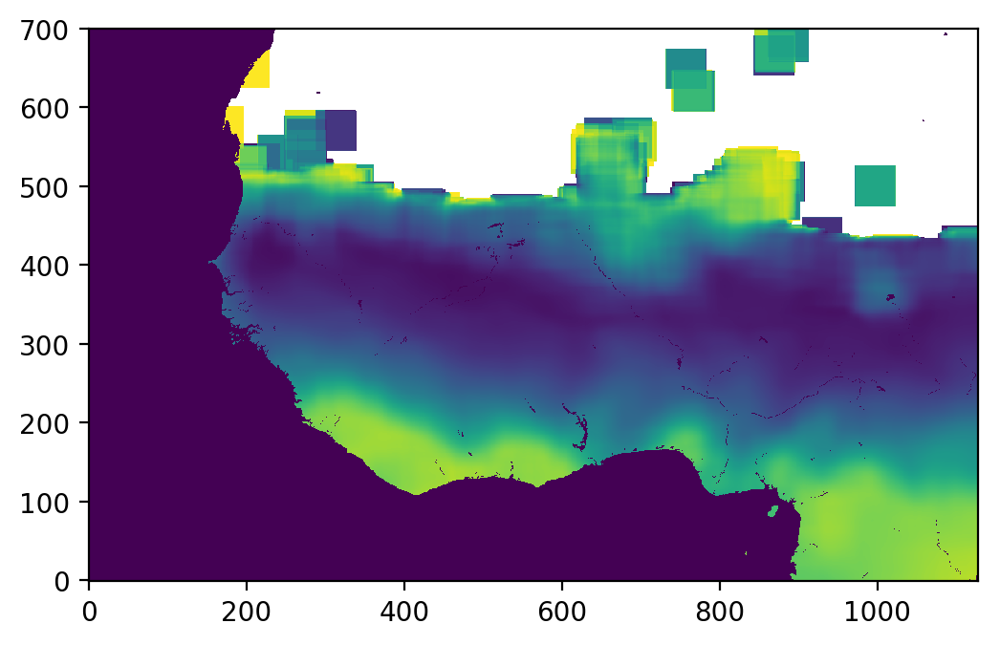

In [105]:
plt.figure(dpi=200)
plt.imshow(new_lai, origin='lower')

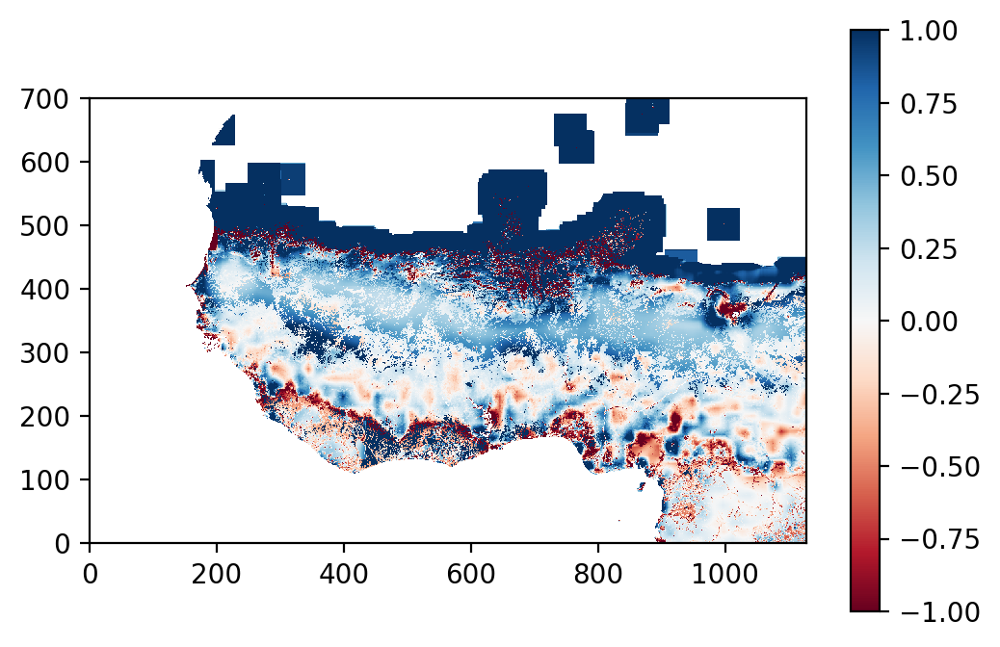

In [114]:
plt.figure(dpi=200)
plt.imshow(new_lai-lai, origin='lower', vmin=-1, vmax=1, cmap='RdBu')
plt.colorbar()

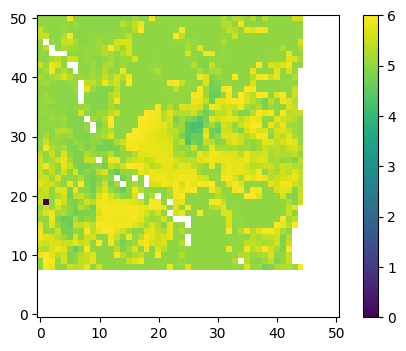

In [85]:
# check single pixel
y = pos[0][4000]
x = pos[1][3000]
box_lai = cut_kernel(lai, x, y, 25)  # 25 pixel ~ 110km
box_frac = cut_kernel(treefra, x, y, 25)  # 25 pixel ~ 110km

plt.figure(dpi=100)
plt.imshow(box_lai, origin='lower')
plt.colorbar()

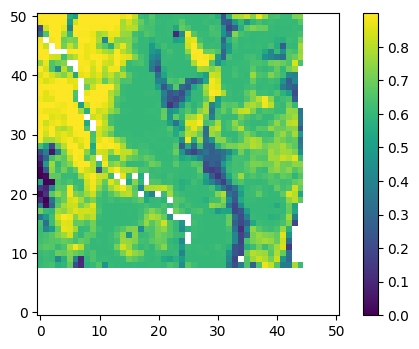

In [86]:
plt.figure(dpi=100)
plt.imshow(box_frac, origin='lower')
plt.colorbar()

In [89]:
bigger = np.where(box_lai>0.1)
new_point = np.sum((box_lai)[bigger])/len(bigger[0]) 

/users/global/cornkle/miniconda3/lib/python3.5/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


In [90]:
new_point

5.2601746752207843